In [76]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
from scipy.stats import t
from scipy.stats import uniform
from scipy.stats import ttest_1samp # library for p-value estimation
import ruptures as rpt # library for change point detection
%matplotlib inline
%run ./master_experminet-functions.ipynb
# load functions for the creation of the different distributions

In [77]:
# define arms
def quick_sort(df):
    sorted_df = df.sort_values(kind="quicksort")
    return sorted_df
def merge_sort(df):
    sorted_df = df.sort_values(kind="mergesort")
    return sorted_df
def heap_sort(df):
    sorted_df = df.sort_values(kind="heapsort")
    return sorted_df

In [78]:
n_samples = 200000
choices = [quick_sort,merge_sort,heap_sort]
choices_names = ["quick_sort","merge_sort","heap_sort"]
dist_types = ["Uniform","Normal","Uniform_Sorted","Uniform_Reverse_Sorted","Uniform_Nearly_Sorted","Zipf"]

In [79]:
#list_distributions = 1000*["Uniform_Sorted"] + 1000*["Normal"] # at first quick sort -> then merge sort 
list_distributions = 500*["Uniform"] +  500*["Uniform_Sorted"] + 500*["Normal"] + 500*["Uniform_Reverse_Sorted"]
#list_distributions = 100*["Uniform"] +  100*["Uniform_Sorted"] + 100*["Normal"] + 100*["Uniform_Reverse_Sorted"]

In [80]:
def plot_history(rewards,cum_rewards,sample_count, sample_mean):

    q_values = {"quick_sort": sample_mean[0], "merge_sort": sample_mean[1], "heap_sort":sample_mean[2]} ## 
    arm_counts = {"quick_sort": sample_count[0], "merge_sort": sample_count[1], "heap_sort":sample_count[2]} ##
    print("Average rewards per algo", q_values)
    print("Count per chosen algo", arm_counts)
    
    fig = plt.figure(figsize=[30,8])
    ax2 = fig.add_subplot(121)
    ax2.plot(cum_rewards, label="avg rewards")
    ax2.set_title("Cummulative Rewards")
    labels = list(arm_counts.keys())
    ax3 = fig.add_subplot(122)
    ax3.bar([i for i in range(len(arm_counts.values()))], arm_counts.values(), label=[i for i in ((list(arm_counts.keys())))])
    ax3.set_title("Chosen Actions")
    plt.show() 

In [81]:
# help function to return the humber of consecutive elements in a list 
def count_consec(listrand):
    count=1
    consec_list=[]
    for i in range(len(listrand[:-1])):
        if listrand[i]+1 == listrand[i+1]:
            count+=1
        else:
            consec_list.append(count)
            count=1

    # Account for the last iteration
    consec_list.append(count)     

    return consec_list

In [82]:
def TS_stationary(list_distributions, n_samples, var_multiplier = 5): # initialize
    total_reward = 0
    num_choices = len(choices)
    sample_count = [0 for i in range(num_choices)]
    sample_rewards = [0 for i in range(num_choices)]
    sample_mean = [0.0 for i in range(num_choices)]
    sample_var = [0.0 for i in range(num_choices)]
    arm_rewards = {0: [], 1:[], 2:[]}
    rewards = []
    cum_rewards = []
    var_multiplier = 5
    list_iteration_results = []

    len_result = 1

    for n, elem in enumerate(list_distributions):
        dist_type = elem
        distribion = create_df_distribution(n_samples=n_samples, dist_type=dist_type)
        print("\n")
        print("Iteration:", n)
        theta = {}
        for i in range(len(choices)):
            if sample_count[i] >= 2:
                theta[i] = t.rvs(df=sample_count[i]-1,loc=sample_mean[i],scale=np.sqrt(sample_var[i]/sample_count[i])*var_multiplier)
                print(choices_names[i],"Theta", theta[i])

            else:
                print("Less than two values for",choices_names[i])
                theta[i] = uniform.rvs(loc=0, scale=1)
                print(choices_names[i],"Theta", theta[i])

        choice = np.argmin([theta[i] for i in range(len(choices))])
        alg = choices[choice]
        alg_name = choices_names[choice]
        start_time = time.perf_counter() #time.time()
        sorted_dist = alg(distribion[dist_type])
        reward = ((time.perf_counter() - start_time))*(1)
        print("\n")
        print("Chosen algorithm is: ", alg_name, "with reward:", reward)
        arm_rewards[choice].append(reward)
        sample_count[choice] += 1
        sample_rewards[choice] += reward
        sample_mean[choice] = np.mean(arm_rewards[choice])
        sample_var[choice] = np.var(arm_rewards[choice]).astype('float64')
        print("Sample mean is: ", sample_mean[choice], "Sample variance is:", sample_var[choice])
        total_reward += reward
        rewards.append(reward)
        cum_rewards.append(sum(rewards)/len(rewards))
        array_rewards = np.array(rewards)

    list_iteration_results.extend([sample_mean, sample_count,rewards,cum_rewards,n])
    return list_iteration_results, total_reward

In [83]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

In [84]:
def plot_rewards_distribution(arm_rewards, bins = 20):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 3))
    axes[0].hist(arm_rewards[0], bins, alpha = 0.5, label='quick sort')
    axes[0].set_title("rewards distribution for quick sort")
    axes[1].hist(arm_rewards[1], bins, alpha = 0.5, label='merge sort')
    axes[1].set_title("rewards distribution for merge sort")
    axes[2].hist(arm_rewards[2], bins, alpha = 0.5, label='heap sort')
    axes[2].set_title("rewards distribution for heap sort")
    plt.show()

In [139]:
def plot_rewards_distribution_together(arm_rewards, bins = 20):
    plt.hist(arm_rewards[0], bins, alpha = 0.5, label='quick sort')
    plt.hist(arm_rewards[1], bins, alpha = 0.5, label='merge sort')
    plt.hist(arm_rewards[2], bins, alpha = 0.5, label='heap sort')
    plt.legend(loc='upper right')
    plt.show()

In [85]:
import bayesian_changepoint_detection.online_changepoint_detection as oncd
from functools import partial
import matplotlib.cm as cm

## Thompson Sampling

In [119]:
def ts_quantile(list_distributions, n_samples, var_multiplier = 5, num_consec_elem=1):
    total_reward = 0
    num_choices = len(choices)
    sample_count = [0 for i in range(num_choices)]
    sample_rewards = [0 for i in range(num_choices)]
    sample_mean = [0.0 for i in range(num_choices)]
    sample_var = [0.0 for i in range(num_choices)]
    arm_rewards = {0: [], 1:[], 2:[]}
    arm_rewards_temp = {0: [], 1:[], 2:[]}
    rewards = []
    cum_rewards = []
    var_multiplier = var_multiplier
    n_consecutive_list = [] # this list is to check whether
    list_iteration_results = []
    num_consec_elem = num_consec_elem

    for n, elem in enumerate(list_distributions):
        dist_type = elem
        distribion = create_df_distribution(n_samples=n_samples, dist_type=dist_type)
        print("\n")
        print("Iteration:", n)
        theta = {}
        for i in range(len(choices)):
            if sample_count[i] >= 2:
                theta[i] = t.rvs(df=sample_count[i]-1,loc=sample_mean[i],scale=np.sqrt(sample_var[i]/sample_count[i])*var_multiplier)
                print(choices_names[i],"Theta", theta[i])

            else:
                print("Less than two values for",choices_names[i])
                theta[i] = uniform.rvs(loc=0, scale=0.1)
                print(choices_names[i],"Theta", theta[i])

        choice = np.argmin([theta[i] for i in range(len(choices))])
        alg = choices[choice]
        alg_name = choices_names[choice]
        start_time = time.perf_counter()
        sorted_dist = alg(distribion[dist_type])
        reward = ((time.perf_counter() - start_time))*(1)
        print("\n")
        print("Chosen algorithm is: ", alg_name, "with reward:", reward)
        arm_rewards[choice].append(reward)
        arm_rewards_temp[choice].append(reward)
        sample_count[choice] += 1
        sample_rewards[choice] += reward
        sample_mean[choice] = np.mean(arm_rewards_temp[choice])
        sample_var[choice] = np.var(arm_rewards_temp[choice]).astype('float64')
        print("Sample mean is: ", sample_mean[choice], "Sample variance is:", sample_var[choice])
        total_reward += reward
        rewards.append(reward)
        cum_rewards.append(sum(rewards)/len(rewards))
        if len(arm_rewards_temp[choice])>10:
            if reward < np.quantile(arm_rewards_temp[choice][:-1], 0.025) or reward > np.quantile(arm_rewards_temp[choice][:-1], 0.975):
                n_consecutive_list.append(n)
                if any(i >= num_consec_elem for i in count_consec(n_consecutive_list)):
                    print("RESTART EXPERIMENT")
                    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
                    sample_count = [0 for i in range(num_choices)]
                    sample_rewards = [0 for i in range(num_choices)]
                    sample_mean = [0.0 for i in range(num_choices)]
                    sample_var = [0.0 for i in range(num_choices)]
                    arm_rewards_temp = {0: [], 1:[], 2:[]}
                    rewards = []
                    cum_rewards = []
                    n_consecutive_list = []
    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
    return list_iteration_results, total_reward, arm_rewards

## Single outlier restarts the expriment

In [120]:
list_iteration_results_1, total_reward_1, arm_rewards_1 = ts_quantile(list_distributions, n_samples)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.11992734453512632
Less than two values for merge_sort
merge_sort Theta 0.38117895959811565
Less than two values for heap_sort
heap_sort Theta 0.4114604954041925


Chosen algorithm is:  quick_sort with reward: 0.015109499999653053
Sample mean is:  0.015109499999653053 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.5003919176408931
Less than two values for merge_sort
merge_sort Theta 0.896875654743261
Less than two values for heap_sort
heap_sort Theta 0.6636702499908961


Chosen algorithm is:  quick_sort with reward: 0.017683299999589508
Sample mean is:  0.01639639999962128 Sample variance is: 1.6561116099182235e-06


Iteration: 2
quick_sort Theta -0.001960383844732679
Less than two values for merge_sort
merge_sort Theta 0.08935946897359193
Less than two values for heap_sort
heap_sort Theta 0.9679315749859166


Chosen algorithm is:  quick_sort with reward: 0.01415529999985



Chosen algorithm is:  quick_sort with reward: 0.01808049999999639
Sample mean is:  0.01484226428565957 Sample variance is: 2.200086830868758e-06
RESTART EXPERIMENT


Iteration: 28
Less than two values for quick_sort
quick_sort Theta 0.2890181910168762
Less than two values for merge_sort
merge_sort Theta 0.903833700176547
Less than two values for heap_sort
heap_sort Theta 0.12309137385333135


Chosen algorithm is:  heap_sort with reward: 0.0224091000000044
Sample mean is:  0.0224091000000044 Sample variance is: 0.0


Iteration: 29
Less than two values for quick_sort
quick_sort Theta 0.4614970177665133
Less than two values for merge_sort
merge_sort Theta 0.09724005526871726
Less than two values for heap_sort
heap_sort Theta 0.11107360375929731


Chosen algorithm is:  merge_sort with reward: 0.01534029999993436
Sample mean is:  0.01534029999993436 Sample variance is: 0.0


Iteration: 30
Less than two values for quick_sort
quick_sort Theta 0.037314745588584164
Less than two values for me



Chosen algorithm is:  quick_sort with reward: 0.01595580000002883
Sample mean is:  0.01460165510200438 Sample variance is: 2.185621713919898e-06


Iteration: 56
quick_sort Theta 0.019969012638721688
Less than two values for merge_sort
merge_sort Theta 0.25573506759629894
Less than two values for heap_sort
heap_sort Theta 0.08675468977770018


Chosen algorithm is:  quick_sort with reward: 0.01607849999982136
Sample mean is:  0.01463119199996072 Sample variance is: 2.184658268344778e-06


Iteration: 57
quick_sort Theta 0.01349882981017319
Less than two values for merge_sort
merge_sort Theta 0.4425881633933385
Less than two values for heap_sort
heap_sort Theta 0.5336144235855949


Chosen algorithm is:  quick_sort with reward: 0.01316259999975955
Sample mean is:  0.014602396078388149 Sample variance is: 2.183282086671253e-06


Iteration: 58
quick_sort Theta 0.014230658709955928
Less than two values for merge_sort
merge_sort Theta 0.9962636950846802
Less than two values for heap_sort
heap



Iteration: 84
quick_sort Theta 0.015355989399053896
Less than two values for merge_sort
merge_sort Theta 0.5260420061343076
heap_sort Theta 0.020365189739732666


Chosen algorithm is:  quick_sort with reward: 0.016195499999867025
Sample mean is:  0.014442409859115492 Sample variance is: 1.8486480750072402e-06


Iteration: 85
quick_sort Theta 0.016263825440218916
Less than two values for merge_sort
merge_sort Theta 0.5889080695212702
heap_sort Theta 0.02430568521617261


Chosen algorithm is:  quick_sort with reward: 0.012262299999747484
Sample mean is:  0.014412130555513158 Sample variance is: 1.888067779390409e-06


Iteration: 86
quick_sort Theta 0.018518501306732785
Less than two values for merge_sort
merge_sort Theta 0.17925209101165707
heap_sort Theta 0.024665683393287712


Chosen algorithm is:  quick_sort with reward: 0.012449199999991833
Sample mean is:  0.014385241095848482 Sample variance is: 1.9142629361631706e-06
RESTART EXPERIMENT


Iteration: 87
Less than two values for qu



Chosen algorithm is:  heap_sort with reward: 0.023726599999918108
Sample mean is:  0.02251918235289368 Sample variance is: 1.1842124032631628e-06


Iteration: 111
Less than two values for quick_sort
quick_sort Theta 0.9328394830719319
Less than two values for merge_sort
merge_sort Theta 0.38424222432871613
heap_sort Theta 0.03150805129647579


Chosen algorithm is:  heap_sort with reward: 0.024887300000045798
Sample mean is:  0.022586842857098027 Sample variance is: 1.3060278533622654e-06


Iteration: 112
Less than two values for quick_sort
quick_sort Theta 0.43817700265880044
Less than two values for merge_sort
merge_sort Theta 0.5531265293078245
heap_sort Theta 0.023229126432700906


Chosen algorithm is:  heap_sort with reward: 0.022195600000031845
Sample mean is:  0.0225759749999573 Sample variance is: 1.273883163039074e-06


Iteration: 113
Less than two values for quick_sort
quick_sort Theta 0.4729338531205489
Less than two values for merge_sort
merge_sort Theta 0.8223740187375633



Chosen algorithm is:  quick_sort with reward: 0.014076700000259734
Sample mean is:  0.014182684615362023 Sample variance is: 1.7647261478915432e-06


Iteration: 139
quick_sort Theta 0.014320076015904475
Less than two values for merge_sort
merge_sort Theta 0.6255900169246025
Less than two values for heap_sort
heap_sort Theta 0.11881987547719464


Chosen algorithm is:  quick_sort with reward: 0.012769599999955972
Sample mean is:  0.014167324999977174 Sample variance is: 1.767012860350313e-06


Iteration: 140
quick_sort Theta 0.012251131784281511
Less than two values for merge_sort
merge_sort Theta 0.43339665154208207
Less than two values for heap_sort
heap_sort Theta 0.47756793044033474


Chosen algorithm is:  quick_sort with reward: 0.01304389999995692
Sample mean is:  0.01415524516126728 Sample variance is: 1.7614375923666278e-06


Iteration: 141
quick_sort Theta 0.015629501347624874
Less than two values for merge_sort
merge_sort Theta 0.40550193182459116
Less than two values for hea



Chosen algorithm is:  quick_sort with reward: 0.0137789000000339
Sample mean is:  0.013962515789460252 Sample variance is: 1.648475950608279e-06


Iteration: 163
quick_sort Theta 0.013763119628571066
Less than two values for merge_sort
merge_sort Theta 0.29203909109156156
Less than two values for heap_sort
heap_sort Theta 0.9393642451509916


Chosen algorithm is:  quick_sort with reward: 0.01257179999993241
Sample mean is:  0.01395042260868175 Sample variance is: 1.6508133095576654e-06


Iteration: 164
quick_sort Theta 0.011326256417903535
Less than two values for merge_sort
merge_sort Theta 0.3627036362654963
Less than two values for heap_sort
heap_sort Theta 0.49623174992584473


Chosen algorithm is:  quick_sort with reward: 0.01320480000003954
Sample mean is:  0.013943994827572765 Sample variance is: 1.641333542885618e-06


Iteration: 165
quick_sort Theta 0.015105013155250398
Less than two values for merge_sort
merge_sort Theta 0.21124601455741754
Less than two values for heap_sor



Chosen algorithm is:  merge_sort with reward: 0.01672850000022663
Sample mean is:  0.01496445217389919 Sample variance is: 4.139622790984244e-07
RESTART EXPERIMENT


Iteration: 193
Less than two values for quick_sort
quick_sort Theta 0.00012967269853314534
Less than two values for merge_sort
merge_sort Theta 0.5467904267342012
Less than two values for heap_sort
heap_sort Theta 0.9187358271406779


Chosen algorithm is:  quick_sort with reward: 0.013510100000075909
Sample mean is:  0.013941220161273709 Sample variance is: 1.7103116210887797e-06


Iteration: 194
Less than two values for quick_sort
quick_sort Theta 0.3222834094603413
Less than two values for merge_sort
merge_sort Theta 0.36376359891082
Less than two values for heap_sort
heap_sort Theta 0.14414082437660947


Chosen algorithm is:  heap_sort with reward: 0.02191820000007283
Sample mean is:  0.022515541666668543 Sample variance is: 1.2449508257835912e-06


Iteration: 195
Less than two values for quick_sort
quick_sort Theta 0

Chosen algorithm is:  merge_sort with reward: 0.014543499999945197
Sample mean is:  0.014885286206867148 Sample variance is: 3.5390832194887846e-07


Iteration: 217
Less than two values for quick_sort
quick_sort Theta 0.896635132883934
merge_sort Theta 0.012589606994585917
Less than two values for heap_sort
heap_sort Theta 0.5739254100278022


Chosen algorithm is:  merge_sort with reward: 0.021097800000006828
Sample mean is:  0.015092369999971803 Sample variance is: 1.5857386015156634e-06


Iteration: 218
Less than two values for quick_sort
quick_sort Theta 0.20672066318461868
merge_sort Theta 0.012374429010841455
Less than two values for heap_sort
heap_sort Theta 0.9795837481342705


Chosen algorithm is:  merge_sort with reward: 0.018483800000012707
Sample mean is:  0.015201770967715059 Sample variance is: 1.893642895697076e-06


Iteration: 219
Less than two values for quick_sort
quick_sort Theta 0.9524822937853701
merge_sort Theta 0.01328227503420424
Less than two values for heap_sor



Chosen algorithm is:  heap_sort with reward: 0.02329630000031102
Sample mean is:  0.02246806909091571 Sample variance is: 1.1468025661647392e-06


Iteration: 246
Less than two values for quick_sort
quick_sort Theta 0.6160362678344595
Less than two values for merge_sort
merge_sort Theta 0.9962823751778269
heap_sort Theta 0.020024393329860352


Chosen algorithm is:  heap_sort with reward: 0.02170959999966726
Sample mean is:  0.022454525000000558 Sample variance is: 1.1364132808412803e-06


Iteration: 247
Less than two values for quick_sort
quick_sort Theta 0.6670639603203048
Less than two values for merge_sort
merge_sort Theta 0.7214448224922997
heap_sort Theta 0.020133578361313385


Chosen algorithm is:  heap_sort with reward: 0.02205950000006851
Sample mean is:  0.022447594736843855 Sample variance is: 1.1191658043943862e-06


Iteration: 248
Less than two values for quick_sort
quick_sort Theta 0.6190174988861306
Less than two values for merge_sort
merge_sort Theta 0.37240885514911515



Iteration: 273
Less than two values for quick_sort
quick_sort Theta 0.9508932431690369
merge_sort Theta 0.014181437507829301
Less than two values for heap_sort
heap_sort Theta 0.17256455101140478


Chosen algorithm is:  merge_sort with reward: 0.014671099999759463
Sample mean is:  0.01479823230769258 Sample variance is: 1.2295140603410657e-06


Iteration: 274
Less than two values for quick_sort
quick_sort Theta 0.30599495041561664
merge_sort Theta 0.01450404453996744
Less than two values for heap_sort
heap_sort Theta 0.7060549433232043


Chosen algorithm is:  merge_sort with reward: 0.014153699999951641
Sample mean is:  0.014788466666666202 Sample variance is: 1.2170839628294517e-06


Iteration: 275
Less than two values for quick_sort
quick_sort Theta 0.81888482442223
merge_sort Theta 0.017536487293926192
Less than two values for heap_sort
heap_sort Theta 0.5873460344071846


Chosen algorithm is:  merge_sort with reward: 0.014498399999865796
Sample mean is:  0.014784137313430375 Samp

Iteration: 303
Less than two values for quick_sort
quick_sort Theta 0.016958049818504795
merge_sort Theta 0.014179619232385544
Less than two values for heap_sort
heap_sort Theta 0.6067319541039061


Chosen algorithm is:  merge_sort with reward: 0.015979799999968236
Sample mean is:  0.014729793684187155 Sample variance is: 9.656222563926533e-07


Iteration: 304
Less than two values for quick_sort
quick_sort Theta 0.8686285273730016
merge_sort Theta 0.015090059236776617
Less than two values for heap_sort
heap_sort Theta 0.04378729236453638


Chosen algorithm is:  merge_sort with reward: 0.015118899999833957
Sample mean is:  0.014733846874975143 Sample variance is: 9.571243850004601e-07


Iteration: 305
Less than two values for quick_sort
quick_sort Theta 0.93987045044459
merge_sort Theta 0.013826675529833068
Less than two values for heap_sort
heap_sort Theta 0.9223515850764705


Chosen algorithm is:  merge_sort with reward: 0.013724599999932252
Sample mean is:  0.014723442268015937 Sampl



Iteration: 327
quick_sort Theta 0.014117705473871544
Less than two values for merge_sort
merge_sort Theta 0.4349112505428442
Less than two values for heap_sort
heap_sort Theta 0.4205217159350396


Chosen algorithm is:  quick_sort with reward: 0.01420719999987341
Sample mean is:  0.01383263904108701 Sample variance is: 1.5901636050739621e-06


Iteration: 328
quick_sort Theta 0.015817613092871365
Less than two values for merge_sort
merge_sort Theta 0.4713163019665767
Less than two values for heap_sort
heap_sort Theta 0.7328827534783168


Chosen algorithm is:  quick_sort with reward: 0.013155900000128895
Sample mean is:  0.013828035374141715 Sample variance is: 1.582440452987768e-06


Iteration: 329
quick_sort Theta 0.013531306587241278
Less than two values for merge_sort
merge_sort Theta 0.2535404611429022
Less than two values for heap_sort
heap_sort Theta 0.1601043179735112


Chosen algorithm is:  quick_sort with reward: 0.01287529999990511
Sample mean is:  0.013821597972964441 Sample

Less than two values for merge_sort
merge_sort Theta 0.008706490870476258
Less than two values for heap_sort
heap_sort Theta 0.20453613317277963


Chosen algorithm is:  merge_sort with reward: 0.015126900000268506
Sample mean is:  0.014700634513250793 Sample variance is: 8.586310043971358e-07


Iteration: 353
quick_sort Theta 0.00936978633062796
Less than two values for merge_sort
merge_sort Theta 0.5897475463287024
Less than two values for heap_sort
heap_sort Theta 0.8836805963047106


Chosen algorithm is:  quick_sort with reward: 0.01272289999997156
Sample mean is:  0.01372253918127799 Sample variance is: 1.4497484088970751e-06


Iteration: 354
quick_sort Theta 0.014774833190159369
Less than two values for merge_sort
merge_sort Theta 0.6544226251099461
Less than two values for heap_sort
heap_sort Theta 0.08693093211145819


Chosen algorithm is:  quick_sort with reward: 0.013568200000008801
Sample mean is:  0.013721641860456657 Sample variance is: 1.4414573256541498e-06


Iteration: 3



Chosen algorithm is:  quick_sort with reward: 0.0149848999999449
Sample mean is:  0.01365745360824325 Sample variance is: 1.339596550701186e-06


Iteration: 378
quick_sort Theta 0.014226565195716252
Less than two values for merge_sort
merge_sort Theta 0.49319953863000043
Less than two values for heap_sort
heap_sort Theta 0.5543281428706611


Chosen algorithm is:  quick_sort with reward: 0.01369780000004539
Sample mean is:  0.013657660512816597 Sample variance is: 1.3327351298436334e-06


Iteration: 379
quick_sort Theta 0.014483720760508217
Less than two values for merge_sort
merge_sort Theta 0.4340992208094222
Less than two values for heap_sort
heap_sort Theta 0.9876623017306805


Chosen algorithm is:  quick_sort with reward: 0.01322070000014719
Sample mean is:  0.013655431122445834 Sample variance is: 1.326904646191742e-06


Iteration: 380
quick_sort Theta 0.015803754081907803
Less than two values for merge_sort
merge_sort Theta 0.5604512523830824
Less than two values for heap_sort




Iteration: 402
quick_sort Theta 0.01418678574619862
merge_sort Theta 0.020104660831925657
Less than two values for heap_sort
heap_sort Theta 0.7157448593431788


Chosen algorithm is:  quick_sort with reward: 0.013533299999835435
Sample mean is:  0.013600125345616642 Sample variance is: 1.2362638239858319e-06


Iteration: 403
quick_sort Theta 0.013074111954945494
merge_sort Theta 0.020794236107334274
Less than two values for heap_sort
heap_sort Theta 0.6653447699452614


Chosen algorithm is:  quick_sort with reward: 0.013302599999860831
Sample mean is:  0.013598760550452626 Sample variance is: 1.2309970875006404e-06


Iteration: 404
quick_sort Theta 0.01149731193524974
merge_sort Theta 0.016611909301140995
Less than two values for heap_sort
heap_sort Theta 0.4274516924800864


Chosen algorithm is:  quick_sort with reward: 0.012846500000250671
Sample mean is:  0.013595325570771338 Sample variance is: 1.227948296853081e-06


Iteration: 405
quick_sort Theta 0.01448137611200569
merge_sort



Iteration: 426
Less than two values for quick_sort
quick_sort Theta 0.4976372463727461
Less than two values for merge_sort
merge_sort Theta 0.5397743171154401
Less than two values for heap_sort
heap_sort Theta 0.11554632328882708


Chosen algorithm is:  heap_sort with reward: 0.022731300000032206
Sample mean is:  0.022297787671255745 Sample variance is: 9.92880191772873e-07


Iteration: 427
Less than two values for quick_sort
quick_sort Theta 0.20196513813101657
Less than two values for merge_sort
merge_sort Theta 0.6105545846958683
Less than two values for heap_sort
heap_sort Theta 0.999541333794661


Chosen algorithm is:  quick_sort with reward: 0.012855899999976828
Sample mean is:  0.013547963025203677 Sample variance is: 1.1734569391168997e-06


Iteration: 428
Less than two values for quick_sort
quick_sort Theta 0.38987945076288666
Less than two values for merge_sort
merge_sort Theta 0.8020846679775707
Less than two values for heap_sort
heap_sort Theta 0.9539322969078473


Chosen



Iteration: 452
quick_sort Theta 0.0132755410918694
Less than two values for merge_sort
merge_sort Theta 0.24996133707680057
Less than two values for heap_sort
heap_sort Theta 0.5814243367727748


Chosen algorithm is:  quick_sort with reward: 0.013788599999770668
Sample mean is:  0.013512633840301418 Sample variance is: 1.0899944907329082e-06


Iteration: 453
quick_sort Theta 0.01328404453300758
Less than two values for merge_sort
merge_sort Theta 0.030574638554434874
Less than two values for heap_sort
heap_sort Theta 0.8826823895489352


Chosen algorithm is:  quick_sort with reward: 0.01338949999990291
Sample mean is:  0.013512167424239302 Sample variance is: 1.085922937779565e-06


Iteration: 454
quick_sort Theta 0.013703585717772972
Less than two values for merge_sort
merge_sort Theta 0.050275965108978915
Less than two values for heap_sort
heap_sort Theta 0.7155573501700359


Chosen algorithm is:  quick_sort with reward: 0.012979399999949237
Sample mean is:  0.013510156981128774 Sa



Iteration: 477
quick_sort Theta 0.013583818446897043
Less than two values for merge_sort
merge_sort Theta 0.6440742997700505
Less than two values for heap_sort
heap_sort Theta 0.3126657632972658


Chosen algorithm is:  quick_sort with reward: 0.013776799999959621
Sample mean is:  0.013479693402773465 Sample variance is: 1.0226563206669134e-06


Iteration: 478
quick_sort Theta 0.013269815812919972
Less than two values for merge_sort
merge_sort Theta 0.7180354803581238
Less than two values for heap_sort
heap_sort Theta 0.5361268107705225


Chosen algorithm is:  quick_sort with reward: 0.012507500000083382
Sample mean is:  0.013476329411760697 Sample variance is: 1.0223768509150031e-06


Iteration: 479
quick_sort Theta 0.012961864863798776
Less than two values for merge_sort
merge_sort Theta 0.9476018641542902
Less than two values for heap_sort
heap_sort Theta 0.8469845987876373


Chosen algorithm is:  quick_sort with reward: 0.012138499999764463
Sample mean is:  0.013471716206891745 Sa



Iteration: 509
Less than two values for quick_sort
quick_sort Theta 0.9828351371421834
merge_sort Theta 0.01279504841216683
Less than two values for heap_sort
heap_sort Theta 0.29296023051951525


Chosen algorithm is:  merge_sort with reward: 0.0034625000002961315
Sample mean is:  0.013972314285692414 Sample variance is: 8.218418296091939e-06


Iteration: 510
Less than two values for quick_sort
quick_sort Theta 0.10702168510676546
merge_sort Theta 0.014742182458327154
Less than two values for heap_sort
heap_sort Theta 0.8746347686568601


Chosen algorithm is:  merge_sort with reward: 0.0037417999997160223
Sample mean is:  0.013891759055094174 Sample variance is: 8.971338633273277e-06


Iteration: 511
Less than two values for quick_sort
quick_sort Theta 0.3391466633154224
merge_sort Theta 0.01930638942653002
Less than two values for heap_sort
heap_sort Theta 0.6962281839420934


Chosen algorithm is:  merge_sort with reward: 0.003760500000225875
Sample mean is:  0.013812608593728015 Sa



Chosen algorithm is:  heap_sort with reward: 0.011196199999631062
Sample mean is:  0.020644178823541175 Sample variance is: 1.750449088165049e-05


Iteration: 536
Less than two values for quick_sort
quick_sort Theta 0.5102861486277032
Less than two values for merge_sort
merge_sort Theta 0.05603636620693342
heap_sort Theta 0.02126706033320309


Chosen algorithm is:  heap_sort with reward: 0.010849099999632017
Sample mean is:  0.020530282558146883 Sample variance is: 1.84036008280186e-05


Iteration: 537
Less than two values for quick_sort
quick_sort Theta 0.11891693862699237
Less than two values for merge_sort
merge_sort Theta 0.7684673569205028
heap_sort Theta 0.002757395424019194


Chosen algorithm is:  heap_sort with reward: 0.01071300000012343
Sample mean is:  0.02041744022989374 Sample variance is: 1.9287136816237986e-05


Iteration: 538
Less than two values for quick_sort
quick_sort Theta 0.17332464844010276
Less than two values for merge_sort
merge_sort Theta 0.2600962303724466



Iteration: 564
Less than two values for quick_sort
quick_sort Theta 0.9856086385248335
Less than two values for merge_sort
merge_sort Theta 0.8261145260646395
heap_sort Theta 0.034830612063432534


Chosen algorithm is:  heap_sort with reward: 0.011210399999981746
Sample mean is:  0.018205060176996107 Sample variance is: 3.128479874601443e-05


Iteration: 565
Less than two values for quick_sort
quick_sort Theta 0.2931227896547478
Less than two values for merge_sort
merge_sort Theta 0.6457518540915436
heap_sort Theta 0.015746869426518526


Chosen algorithm is:  heap_sort with reward: 0.010369300000093062
Sample mean is:  0.018136325438602222 Sample variance is: 3.154423514845346e-05


Iteration: 566
Less than two values for quick_sort
quick_sort Theta 0.8290460909075519
Less than two values for merge_sort
merge_sort Theta 0.6334178702120927
heap_sort Theta 0.02648132773680918


Chosen algorithm is:  heap_sort with reward: 0.009485500000209868
Sample mean is:  0.018061100869572723 Sampl


Chosen algorithm is:  quick_sort with reward: 0.004712800000106654
Sample mean is:  0.01259221842104774 Sample variance is: 7.61842201679449e-06


Iteration: 590
quick_sort Theta 0.01007273425926879
Less than two values for merge_sort
merge_sort Theta 0.9740281206541928
Less than two values for heap_sort
heap_sort Theta 0.9175475715972979


Chosen algorithm is:  quick_sort with reward: 0.0038786000000072818
Sample mean is:  0.012566814285709431 Sample variance is: 7.816927445450604e-06


Iteration: 591
quick_sort Theta 0.013340354810178997
Less than two values for merge_sort
merge_sort Theta 0.0977025766784152
Less than two values for heap_sort
heap_sort Theta 0.027373169533142727


Chosen algorithm is:  quick_sort with reward: 0.004919900000004418
Sample mean is:  0.012544584883716103 Sample variance is: 7.963696004508169e-06


Iteration: 592
quick_sort Theta 0.016805242748882638
Less than two values for merge_sort
merge_sort Theta 0.4455288618007889
Less than two values for heap_sor

Less than two values for merge_sort
merge_sort Theta 0.9260747549844486
Less than two values for heap_sort
heap_sort Theta 0.053104038250097685


Chosen algorithm is:  quick_sort with reward: 0.005493000000114989
Sample mean is:  0.01229898591549064 Sample variance is: 9.609947190215171e-06


Iteration: 621
quick_sort Theta 0.014585903847561433
Less than two values for merge_sort
merge_sort Theta 0.38857689064133316
Less than two values for heap_sort
heap_sort Theta 0.9628203740182383


Chosen algorithm is:  quick_sort with reward: 0.0048609999998916464
Sample mean is:  0.012278092696626598 Sample variance is: 9.737919897582563e-06


Iteration: 622
quick_sort Theta 0.007148372224787752
Less than two values for merge_sort
merge_sort Theta 0.835307083660299
Less than two values for heap_sort
heap_sort Theta 0.24492683045622388


Chosen algorithm is:  quick_sort with reward: 0.004495600000154809
Sample mean is:  0.012256292997196706 Sample variance is: 9.879823585737902e-06


Iteration: 6



Chosen algorithm is:  merge_sort with reward: 0.004864399999860325
Sample mean is:  0.012177071895410311 Sample variance is: 2.1839524706551634e-05


Iteration: 646
Less than two values for quick_sort
quick_sort Theta 0.9251920282294103
merge_sort Theta 0.01035550446425797
Less than two values for heap_sort
heap_sort Theta 0.14983135474025144


Chosen algorithm is:  merge_sort with reward: 0.003656200000023091
Sample mean is:  0.012121741558427278 Sample variance is: 2.2166110878224927e-05


Iteration: 647
Less than two values for quick_sort
quick_sort Theta 0.16864020131973834
merge_sort Theta 0.00949655100286173
Less than two values for heap_sort
heap_sort Theta 0.23162979364111214


Chosen algorithm is:  merge_sort with reward: 0.0036995000000388245
Sample mean is:  0.012067404516115095 Sample variance is: 2.2477790893022983e-05


Iteration: 648
Less than two values for quick_sort
quick_sort Theta 0.534900944989553
merge_sort Theta 0.01828252504949226
Less than two values for heap

Chosen algorithm is:  heap_sort with reward: 0.010669000000234519
Sample mean is:  0.016812621739145998 Sample variance is: 3.4423265317711166e-05


Iteration: 673
Less than two values for quick_sort
quick_sort Theta 0.9668219559008824
Less than two values for merge_sort
merge_sort Theta 0.5346387194136061
heap_sort Theta 0.009604692621750486


Chosen algorithm is:  heap_sort with reward: 0.010736400000041613
Sample mean is:  0.016768907913684815 Sample variance is: 3.443931992496647e-05


Iteration: 674
Less than two values for quick_sort
quick_sort Theta 0.5637438512453695
Less than two values for merge_sort
merge_sort Theta 0.055652387695437455
heap_sort Theta 0.005284979249315071


Chosen algorithm is:  heap_sort with reward: 0.010844100000213075
Sample mean is:  0.016726587857160018 Sample variance is: 3.444227200125772e-05


Iteration: 675
Less than two values for quick_sort
quick_sort Theta 0.7896526592515666
Less than two values for merge_sort
merge_sort Theta 0.471015103481185

heap_sort Theta 0.013838818059603259


Chosen algorithm is:  heap_sort with reward: 0.015380699999695935
Sample mean is:  0.01581251265061366 Sample variance is: 3.368421996095055e-05


Iteration: 701
Less than two values for quick_sort
quick_sort Theta 0.23483591959170447
Less than two values for merge_sort
merge_sort Theta 0.11622542602638075
heap_sort Theta 0.0184565708701349


Chosen algorithm is:  heap_sort with reward: 0.0110752999999022
Sample mean is:  0.01578414610779503 Sample variance is: 3.3616091729762605e-05


Iteration: 702
Less than two values for quick_sort
quick_sort Theta 0.39636342658559054
Less than two values for merge_sort
merge_sort Theta 0.11374409856690926
heap_sort Theta 0.015667487255193492


Chosen algorithm is:  heap_sort with reward: 0.010163799999645562
Sample mean is:  0.015750691666675094 Sample variance is: 3.360290228397498e-05


Iteration: 703
Less than two values for quick_sort
quick_sort Theta 0.9746208214334032
Less than two values for merge_sort



Chosen algorithm is:  heap_sort with reward: 0.013317400000232738
Sample mean is:  0.015129335751308348 Sample variance is: 3.1929917799048016e-05


Iteration: 728
Less than two values for quick_sort
quick_sort Theta 0.1475179414471519
Less than two values for merge_sort
merge_sort Theta 0.5977239399602232
heap_sort Theta 0.01817530327978628


Chosen algorithm is:  heap_sort with reward: 0.010435499999857711
Sample mean is:  0.015105140721661695 Sample variance is: 3.187831268960155e-05


Iteration: 729
Less than two values for quick_sort
quick_sort Theta 0.19144415191028274
Less than two values for merge_sort
merge_sort Theta 0.19614273477120558
heap_sort Theta 0.016127407421158223


Chosen algorithm is:  heap_sort with reward: 0.010497700000087207
Sample mean is:  0.015081512820525415 Sample variance is: 3.182314003913673e-05


Iteration: 730
Less than two values for quick_sort
quick_sort Theta 0.13139822411273383
Less than two values for merge_sort
merge_sort Theta 0.7797534248658



Chosen algorithm is:  quick_sort with reward: 0.005099399999835441
Sample mean is:  0.0119724962264112 Sample variance is: 1.1562276104204042e-05


Iteration: 760
quick_sort Theta 0.009042027812505063
merge_sort Theta 0.009692975259823695
Less than two values for heap_sort
heap_sort Theta 0.996535065627887


Chosen algorithm is:  quick_sort with reward: 0.004310300000270217
Sample mean is:  0.011951898924728026 Sample variance is: 1.168859103521603e-05


Iteration: 761
quick_sort Theta 0.00712892613277173
merge_sort Theta 0.017163679753843107
Less than two values for heap_sort
heap_sort Theta 0.5362952421850617


Chosen algorithm is:  quick_sort with reward: 0.004431000000295171
Sample mean is:  0.011931735656834103 Sample variance is: 1.1808493672472072e-05


Iteration: 762
quick_sort Theta 2.1056516655713203e-05
merge_sort Theta 0.011041066980473505
Less than two values for heap_sort
heap_sort Theta 0.43868347815432795


Chosen algorithm is:  quick_sort with reward: 0.0049708000001



Iteration: 786
Less than two values for quick_sort
quick_sort Theta 0.0024037707509663164
Less than two values for merge_sort
merge_sort Theta 0.4723556245614181
heap_sort Theta 0.012703322463883497


Chosen algorithm is:  quick_sort with reward: 0.004262399999788613
Sample mean is:  0.011842244708991794 Sample variance is: 1.2263881355538022e-05


Iteration: 787
Less than two values for quick_sort
quick_sort Theta 0.022576665104746096
Less than two values for merge_sort
merge_sort Theta 0.0927654753214614
heap_sort Theta 0.012978919781332495


Chosen algorithm is:  heap_sort with reward: 0.011244100000112667
Sample mean is:  0.01465865656110011 Sample variance is: 2.9734204563148915e-05


Iteration: 788
Less than two values for quick_sort
quick_sort Theta 0.4772983704023842
Less than two values for merge_sort
merge_sort Theta 0.4180090075939189
heap_sort Theta 0.004085314896719363


Chosen algorithm is:  heap_sort with reward: 0.010932299999694806
Sample mean is:  0.0146418711711838



Chosen algorithm is:  merge_sort with reward: 0.004894700000022567
Sample mean is:  0.010098679802947203 Sample variance is: 2.9723409410570993e-05


Iteration: 817
Less than two values for quick_sort
quick_sort Theta 0.30019634426834463
merge_sort Theta 0.0054153696337206625
heap_sort Theta 0.01562647487463194


Chosen algorithm is:  merge_sort with reward: 0.0032339999997930136
Sample mean is:  0.01006502941175527 Sample variance is: 2.9807573235220394e-05
RESTART EXPERIMENT


Iteration: 818
Less than two values for quick_sort
quick_sort Theta 0.6621961427696896
Less than two values for merge_sort
merge_sort Theta 0.619520549108427
Less than two values for heap_sort
heap_sort Theta 0.5062360422260745


Chosen algorithm is:  heap_sort with reward: 0.010823600000094302
Sample mean is:  0.014395929957816345 Sample variance is: 2.8701977567239487e-05


Iteration: 819
Less than two values for quick_sort
quick_sort Theta 0.12060048470006879
Less than two values for merge_sort
merge_sort 



Chosen algorithm is:  heap_sort with reward: 0.011174200000368728
Sample mean is:  0.01433338506225316 Sample variance is: 2.8459082481167377e-05


Iteration: 842
Less than two values for quick_sort
quick_sort Theta 0.8409253186598017
merge_sort Theta -0.01942327970898871
heap_sort Theta 0.023226031521661545


Chosen algorithm is:  merge_sort with reward: 0.0031572000002597633
Sample mean is:  0.009518056053802702 Sample variance is: 3.0503709516634643e-05


Iteration: 843
Less than two values for quick_sort
quick_sort Theta 0.4641069541647793
merge_sort Theta 0.00859686083157579
heap_sort Theta 0.001866115747775541


Chosen algorithm is:  heap_sort with reward: 0.00989690000005794
Sample mean is:  0.014315052479351525 Sample variance is: 2.8422479113381093e-05


Iteration: 844
Less than two values for quick_sort
quick_sort Theta 0.18804046683751185
merge_sort Theta 0.007347278231961265
heap_sort Theta -0.0024744153951877755


Chosen algorithm is:  heap_sort with reward: 0.0101407000

Less than two values for quick_sort
quick_sort Theta 0.001920253527945226
merge_sort Theta -0.004734713378435829
heap_sort Theta 0.015453926447482412


Chosen algorithm is:  merge_sort with reward: 0.004464099999950122
Sample mean is:  0.009108419166661481 Sample variance is: 3.055719798292578e-05


Iteration: 874
Less than two values for quick_sort
quick_sort Theta 0.373464439920163
merge_sort Theta 0.0018167999609915607
heap_sort Theta 0.026002198778099245


Chosen algorithm is:  merge_sort with reward: 0.0035144000003128895
Sample mean is:  0.009085207468875802 Sample variance is: 3.055971252968202e-05


Iteration: 875
Less than two values for quick_sort
quick_sort Theta 0.3547931509764989
merge_sort Theta 0.015498174354263072
heap_sort Theta 0.02347753480545112


Chosen algorithm is:  merge_sort with reward: 0.003719700000146986
Sample mean is:  0.009063035950409982 Sample variance is: 3.0551902597530706e-05


Iteration: 876
Less than two values for quick_sort
quick_sort Theta 0.56



Chosen algorithm is:  merge_sort with reward: 0.004676200000176323
Sample mean is:  0.008616019696968593 Sample variance is: 3.0211442772492715e-05


Iteration: 907
Less than two values for quick_sort
quick_sort Theta 0.27745528536030273
merge_sort Theta 0.0063307340132446495
heap_sort Theta 0.01819319088850581


Chosen algorithm is:  merge_sort with reward: 0.0035864999999830616
Sample mean is:  0.008597040377357326 Sample variance is: 3.0192533975315558e-05


Iteration: 908
Less than two values for quick_sort
quick_sort Theta 0.5387525437644838
merge_sort Theta 0.008397396069652553
heap_sort Theta 0.024211590432391718


Chosen algorithm is:  merge_sort with reward: 0.003622700000050827
Sample mean is:  0.008578339849623091 Sample variance is: 3.017170128893887e-05


Iteration: 909
Less than two values for quick_sort
quick_sort Theta 0.16830307669306865
merge_sort Theta 0.005512361737636157
heap_sort Theta 0.015181365685741478


Chosen algorithm is:  merge_sort with reward: 0.003500



Chosen algorithm is:  merge_sort with reward: 0.004812799999854178
Sample mean is:  0.008155817525771282 Sample variance is: 2.949314350963162e-05


Iteration: 940
Less than two values for quick_sort
quick_sort Theta 0.5037497448819175
merge_sort Theta 0.007290841837415596
heap_sort Theta 0.012636967136833108


Chosen algorithm is:  merge_sort with reward: 0.003563600000234146
Sample mean is:  0.008140090753423552 Sample variance is: 2.9464113021729645e-05


Iteration: 941
Less than two values for quick_sort
quick_sort Theta 0.1890727180710292
merge_sort Theta 0.011720461403186682
heap_sort Theta 0.015289331217677624


Chosen algorithm is:  merge_sort with reward: 0.0038411000000451168
Sample mean is:  0.008125418430033182 Sample variance is: 2.94264138145396e-05


Iteration: 942
Less than two values for quick_sort
quick_sort Theta 0.3028636695198835
merge_sort Theta 0.009139426270405166
heap_sort Theta 0.006819286100081265


Chosen algorithm is:  heap_sort with reward: 0.01084240000



Chosen algorithm is:  merge_sort with reward: 0.005474399999911839
Sample mean is:  0.007736851090344869 Sample variance is: 2.8451789723841706e-05


Iteration: 975
Less than two values for quick_sort
quick_sort Theta 0.4925300643240206
merge_sort Theta 0.007039422642979793
heap_sort Theta 0.014176525065838119


Chosen algorithm is:  merge_sort with reward: 0.0029754000001958048
Sample mean is:  0.007722063975158071 Sample variance is: 2.8433619595376847e-05
RESTART EXPERIMENT


Iteration: 976
Less than two values for quick_sort
quick_sort Theta 0.7488362754222342
Less than two values for merge_sort
merge_sort Theta 0.9016197137922927
Less than two values for heap_sort
heap_sort Theta 0.09234116211187848


Chosen algorithm is:  heap_sort with reward: 0.01082910000013726
Sample mean is:  0.013897127173920679 Sample variance is: 2.6255116414657863e-05


Iteration: 977
Less than two values for quick_sort
quick_sort Theta 0.8484395239655028
Less than two values for merge_sort
merge_sort 



Iteration: 1002
Less than two values for quick_sort
quick_sort Theta 0.12278325395154077
Less than two values for merge_sort
merge_sort Theta 0.060757512559475146
heap_sort Theta 0.013459293233679646


Chosen algorithm is:  heap_sort with reward: 0.02247609999994893
Sample mean is:  0.013734784768217313 Sample variance is: 2.5355804883830345e-05


Iteration: 1003
Less than two values for quick_sort
quick_sort Theta 0.45126450745469304
Less than two values for merge_sort
merge_sort Theta 0.9960698623097782
heap_sort Theta 0.011807538535581228


Chosen algorithm is:  heap_sort with reward: 0.022126100000150473
Sample mean is:  0.01376247887789366 Sample variance is: 2.5503745400112463e-05


Iteration: 1004
Less than two values for quick_sort
quick_sort Theta 0.7255752455420993
Less than two values for merge_sort
merge_sort Theta 0.700789529781001
heap_sort Theta 0.0199179037718807


Chosen algorithm is:  heap_sort with reward: 0.02195999999958076
Sample mean is:  0.01378944440789921 Sa

Sample mean is:  0.014308245230768079 Sample variance is: 2.7888732845355667e-05


Iteration: 1026
Less than two values for quick_sort
quick_sort Theta 0.07266277396440801
Less than two values for merge_sort
merge_sort Theta 0.4494191960186503
heap_sort Theta 0.008620324378335119


Chosen algorithm is:  heap_sort with reward: 0.022723400000359106
Sample mean is:  0.014334058588957008 Sample variance is: 2.8019741659915588e-05


Iteration: 1027
Less than two values for quick_sort
quick_sort Theta 0.8595153025301961
Less than two values for merge_sort
merge_sort Theta 0.6598608008003779
heap_sort Theta 0.01295820363341357


Chosen algorithm is:  heap_sort with reward: 0.02148959999976796
Sample mean is:  0.014355940978592517 Sample variance is: 2.809015588278014e-05


Iteration: 1028
Less than two values for quick_sort
quick_sort Theta 0.3792515265028372
Less than two values for merge_sort
merge_sort Theta 0.5726959804282511
heap_sort Theta 0.015101623401971258


Chosen algorithm is:  he

merge_sort Theta 0.5887709574466545
Less than two values for heap_sort
heap_sort Theta 0.14619203345492682


Chosen algorithm is:  quick_sort with reward: 0.014566500000000815
Sample mean is:  0.011899967082293567 Sample variance is: 1.1805001721709924e-05


Iteration: 1055
quick_sort Theta 0.013125055053039545
Less than two values for merge_sort
merge_sort Theta 0.541214888405983
Less than two values for heap_sort
heap_sort Theta 0.12593731337319602


Chosen algorithm is:  quick_sort with reward: 0.01346369999964736
Sample mean is:  0.011903856965172556 Sample variance is: 1.1781703652498986e-05


Iteration: 1056
quick_sort Theta 0.016733950466430225
Less than two values for merge_sort
merge_sort Theta 0.6545755898462821
Less than two values for heap_sort
heap_sort Theta 0.436533880204672


Chosen algorithm is:  quick_sort with reward: 0.01228080000009868
Sample mean is:  0.011904792307690983 Sample variance is: 1.1752820351824627e-05


Iteration: 1057
quick_sort Theta 0.0146422482652



Chosen algorithm is:  heap_sort with reward: 0.024930500000209577
Sample mean is:  0.014570849702381782 Sample variance is: 2.9065967413890434e-05


Iteration: 1079
quick_sort Theta 0.010969035390896796
Less than two values for merge_sort
merge_sort Theta 0.6466450950439047
heap_sort Theta 0.010311128687178064


Chosen algorithm is:  heap_sort with reward: 0.02193170000009559
Sample mean is:  0.014592691988131675 Sample variance is: 2.9140018962542944e-05


Iteration: 1080
quick_sort Theta 0.0090785200815681
Less than two values for merge_sort
merge_sort Theta 0.5825038651569416
heap_sort Theta 0.0011663358349226702


Chosen algorithm is:  heap_sort with reward: 0.0217609999999695
Sample mean is:  0.014613900000001017 Sample variance is: 2.9205381670319978e-05


Iteration: 1081
quick_sort Theta 0.012796982101573422
Less than two values for merge_sort
merge_sort Theta 0.801366042638698
heap_sort Theta 0.01181859788243713


Chosen algorithm is:  heap_sort with reward: 0.020890400000098



Iteration: 1105
quick_sort Theta 0.01022789931459376
Less than two values for merge_sort
merge_sort Theta 0.21360722561224454
heap_sort Theta 0.027108483706106162


Chosen algorithm is:  quick_sort with reward: 0.013006599999698665
Sample mean is:  0.011997921379308494 Sample variance is: 1.1019862568066922e-05


Iteration: 1106
quick_sort Theta 0.012169039776561348
Less than two values for merge_sort
merge_sort Theta 0.9492670199937114
heap_sort Theta 0.02186919501098189


Chosen algorithm is:  quick_sort with reward: 0.013059099999736645
Sample mean is:  0.012000355275226908 Sample variance is: 1.0997164528383603e-05


Iteration: 1107
quick_sort Theta 0.01353804172049668
Less than two values for merge_sort
merge_sort Theta 0.6440980885948009
heap_sort Theta 0.014436775511994142


Chosen algorithm is:  quick_sort with reward: 0.013056899999810412
Sample mean is:  0.012002772997708792 Sample variance is: 1.0974547978714788e-05


Iteration: 1108
quick_sort Theta 0.009879221841694276
L

Less than two values for heap_sort
heap_sort Theta 0.0327562385435225


Chosen algorithm is:  merge_sort with reward: 0.01506920000019818
Sample mean is:  0.007915492749249218 Sample variance is: 2.9043115903746002e-05


Iteration: 1135
quick_sort Theta 0.01042872895120861
merge_sort Theta -0.00014808520700020783
Less than two values for heap_sort
heap_sort Theta 0.7002468208867983


Chosen algorithm is:  merge_sort with reward: 0.014559600000211503
Sample mean is:  0.007935505120487057 Sample variance is: 2.9088200484823394e-05


Iteration: 1136
quick_sort Theta 0.017653487478157013
merge_sort Theta -0.012767940768200921
Less than two values for heap_sort
heap_sort Theta 0.662245764287037


Chosen algorithm is:  merge_sort with reward: 0.014320199999929173
Sample mean is:  0.00795467837838328 Sample variance is: 2.9122896319109398e-05


Iteration: 1137
quick_sort Theta 0.01921753894034779
merge_sort Theta 0.011067145886380437
Less than two values for heap_sort
heap_sort Theta 0.312374

Less than two values for heap_sort
heap_sort Theta 0.5218358639113496


Chosen algorithm is:  quick_sort with reward: 0.013195200000154728
Sample mean is:  0.012092554487176674 Sample variance is: 1.0495172216101211e-05


Iteration: 1165
quick_sort Theta 0.010184402342573288
merge_sort Theta 0.011343458189309472
Less than two values for heap_sort
heap_sort Theta 0.4880470230096545


Chosen algorithm is:  quick_sort with reward: 0.01327320000018517
Sample mean is:  0.012095071855008249 Sample variance is: 1.0475760232076161e-05


Iteration: 1166
quick_sort Theta 0.00924474628292514
merge_sort Theta 0.017946540975170178
Less than two values for heap_sort
heap_sort Theta 0.935105863807425


Chosen algorithm is:  quick_sort with reward: 0.01265449999982593
Sample mean is:  0.012096262127656797 Sample variance is: 1.0454135835789179e-05


Iteration: 1167
quick_sort Theta 0.018706221853084893
merge_sort Theta 0.003906465117412235
Less than two values for heap_sort
heap_sort Theta 0.541925883

Less than two values for quick_sort
quick_sort Theta 0.18054459282108182
Less than two values for merge_sort
merge_sort Theta 0.5345740145895483
heap_sort Theta 0.021536774010900504


Chosen algorithm is:  heap_sort with reward: 0.025992399999722693
Sample mean is:  0.015195188858696007 Sample variance is: 3.0721498208721354e-05


Iteration: 1191
Less than two values for quick_sort
quick_sort Theta 0.5967679547564442
Less than two values for merge_sort
merge_sort Theta 0.5315308818069141
heap_sort Theta 0.0013478695989003874


Chosen algorithm is:  heap_sort with reward: 0.022510799999963638
Sample mean is:  0.015215014363143887 Sample variance is: 3.078288474660834e-05


Iteration: 1192
Less than two values for quick_sort
quick_sort Theta 0.8958464533421379
Less than two values for merge_sort
merge_sort Theta 0.21178268045167348
heap_sort Theta 0.01320253745510894


Chosen algorithm is:  heap_sort with reward: 0.021320299999842973
Sample mean is:  0.015231515135134967 Sample variance 



Iteration: 1221
quick_sort Theta 0.01048577591209003
Less than two values for merge_sort
merge_sort Theta 0.25748720133732106
heap_sort Theta 0.012388118782081337


Chosen algorithm is:  quick_sort with reward: 0.01382240000020829
Sample mean is:  0.012116551767150872 Sample variance is: 1.0235863339911283e-05


Iteration: 1222
quick_sort Theta 0.006355206342464144
Less than two values for merge_sort
merge_sort Theta 0.47119591978217534
heap_sort Theta 0.01705152892430017


Chosen algorithm is:  quick_sort with reward: 0.013133200000083889
Sample mean is:  0.012118660995849902 Sample variance is: 1.0216767003699633e-05


Iteration: 1223
quick_sort Theta 0.014069282205248399
Less than two values for merge_sort
merge_sort Theta 0.08849464787380013
heap_sort Theta 0.009339550468485407


Chosen algorithm is:  heap_sort with reward: 0.021763100000043778
Sample mean is:  0.015562389487177615 Sample variance is: 3.1257804599439906e-05


Iteration: 1224
quick_sort Theta 0.014069176543885639




Chosen algorithm is:  heap_sort with reward: 0.023448699999789824
Sample mean is:  0.015706931578944778 Sample variance is: 3.1465982192611746e-05


Iteration: 1250
quick_sort Theta 0.017464492672530856
Less than two values for merge_sort
merge_sort Theta 0.026681403421393357
heap_sort Theta 0.015199115182255906


Chosen algorithm is:  heap_sort with reward: 0.021689499999865802
Sample mean is:  0.01572188799999708 Sample variance is: 3.1476571354877034e-05


Iteration: 1251
quick_sort Theta 0.01165133529432862
Less than two values for merge_sort
merge_sort Theta 0.9184901937319189
heap_sort Theta 0.021161872301657638


Chosen algorithm is:  quick_sort with reward: 0.013086899999962043
Sample mean is:  0.01214838179999697 Sample variance is: 9.876399827595852e-06


Iteration: 1252
quick_sort Theta 0.008727233990136281
Less than two values for merge_sort
merge_sort Theta 0.17721040480277261
heap_sort Theta 0.012836363186044834


Chosen algorithm is:  quick_sort with reward: 0.01279979



Iteration: 1278
quick_sort Theta 0.011346500436982626
Less than two values for merge_sort
merge_sort Theta 0.08604711717448044
heap_sort Theta 0.016558158788481804


Chosen algorithm is:  quick_sort with reward: 0.0131811999999627
Sample mean is:  0.01217879980805961 Sample variance is: 9.503509687072194e-06


Iteration: 1279
quick_sort Theta 0.01290495349247123
Less than two values for merge_sort
merge_sort Theta 0.8060689838627244
heap_sort Theta 0.01770668112435377


Chosen algorithm is:  quick_sort with reward: 0.013512799999716663
Sample mean is:  0.012181355363982325 Sample variance is: 9.488706311041883e-06


Iteration: 1280
quick_sort Theta 0.010616882367842802
Less than two values for merge_sort
merge_sort Theta 0.9810097857165407
heap_sort Theta 0.01140900634339711


Chosen algorithm is:  quick_sort with reward: 0.01225960000010673
Sample mean is:  0.01218150497131717 Sample variance is: 9.470575152736087e-06


Iteration: 1281
quick_sort Theta 0.01107598233130116
Less than 



Iteration: 1306
Less than two values for quick_sort
quick_sort Theta 0.40523205058364675
Less than two values for merge_sort
merge_sort Theta 0.05085165724730145
heap_sort Theta -0.0029310847054692182


Chosen algorithm is:  heap_sort with reward: 0.022333400000206893
Sample mean is:  0.01602722642856926 Sample variance is: 3.188056543392373e-05


Iteration: 1307
Less than two values for quick_sort
quick_sort Theta 0.6792087168197227
Less than two values for merge_sort
merge_sort Theta 0.5760740039606009
heap_sort Theta 0.018241962777012656


Chosen algorithm is:  heap_sort with reward: 0.021960800000215386
Sample mean is:  0.016041320427551794 Sample variance is: 3.188826876436632e-05


Iteration: 1308
Less than two values for quick_sort
quick_sort Theta 0.4226721575837662
Less than two values for merge_sort
merge_sort Theta 0.3928196455660744
heap_sort Theta 0.01295173437544132


Chosen algorithm is:  heap_sort with reward: 0.02109519999976328
Sample mean is:  0.016053296445495423 



Iteration: 1330
Less than two values for quick_sort
quick_sort Theta 0.17286330806296235
Less than two values for merge_sort
merge_sort Theta 0.0015854508924869615
heap_sort Theta 0.016525769207742947


Chosen algorithm is:  merge_sort with reward: 0.014819499999703112
Sample mean is:  0.008353130225995594 Sample variance is: 2.9930052718345114e-05


Iteration: 1331
Less than two values for quick_sort
quick_sort Theta 0.527388587061658
merge_sort Theta 1.4922747909678673
heap_sort Theta 0.0023043414090204023


Chosen algorithm is:  heap_sort with reward: 0.021350499999698513
Sample mean is:  0.01633178918918704 Sample variance is: 3.179290885648737e-05


Iteration: 1332
Less than two values for quick_sort
quick_sort Theta 0.4138015881161331
merge_sort Theta 0.020230582940940295
heap_sort Theta 0.01776433122765001


Chosen algorithm is:  heap_sort with reward: 0.021588499999779742
Sample mean is:  0.01634360202246927 Sample variance is: 3.17834212228723e-05


Iteration: 1333
Less than



Chosen algorithm is:  quick_sort with reward: 0.014662900000075751
Sample mean is:  0.012204865491649074 Sample variance is: 9.217983409928826e-06


Iteration: 1358
quick_sort Theta -0.004289360295582613
Less than two values for merge_sort
merge_sort Theta 0.16279115537757016
Less than two values for heap_sort
heap_sort Theta 0.35447022899117286


Chosen algorithm is:  quick_sort with reward: 0.01338259999965885
Sample mean is:  0.012207046481478722 Sample variance is: 9.203476940548167e-06


Iteration: 1359
quick_sort Theta 0.003900647483892381
Less than two values for merge_sort
merge_sort Theta 0.4432472093299781
Less than two values for heap_sort
heap_sort Theta 0.34297586502214317


Chosen algorithm is:  quick_sort with reward: 0.013354199999866978
Sample mean is:  0.012209166913120845 Sample variance is: 9.188892932772904e-06


Iteration: 1360
quick_sort Theta 0.018984188362598707
Less than two values for merge_sort
merge_sort Theta 0.7144376923335851
Less than two values for h

Chosen algorithm is:  quick_sort with reward: 0.013055299999905401
Sample mean is:  0.012243402309054166 Sample variance is: 8.861607438967961e-06


Iteration: 1382
quick_sort Theta 0.01644477093965178
Less than two values for merge_sort
merge_sort Theta 0.49754137831839884
Less than two values for heap_sort
heap_sort Theta 0.9878017592173597


Chosen algorithm is:  quick_sort with reward: 0.013051000000359636
Sample mean is:  0.012244834219854353 Sample variance is: 8.84704972652856e-06


Iteration: 1383
quick_sort Theta 0.010180009555739368
Less than two values for merge_sort
merge_sort Theta 0.9356589409042926
Less than two values for heap_sort
heap_sort Theta 0.9739777120927962


Chosen algorithm is:  quick_sort with reward: 0.013719900000069174
Sample mean is:  0.012247444955748537 Sample variance is: 8.835235422674139e-06


Iteration: 1384
quick_sort Theta 0.014163393779404206
Less than two values for merge_sort
merge_sort Theta 0.4586186991376746
Less than two values for heap_so



Iteration: 1413
quick_sort Theta 0.016640884472265097
Less than two values for merge_sort
merge_sort Theta 0.7867387042438531
Less than two values for heap_sort
heap_sort Theta 0.9137600819037636


Chosen algorithm is:  quick_sort with reward: 0.012890099999822269
Sample mean is:  0.012287091260499315 Sample variance is: 8.42600390007799e-06


Iteration: 1414
quick_sort Theta 0.01052452181599026
Less than two values for merge_sort
merge_sort Theta 0.01656230809874193
Less than two values for heap_sort
heap_sort Theta 0.4228830489828883


Chosen algorithm is:  quick_sort with reward: 0.01294720000032612
Sample mean is:  0.012288198825499025 Sample variance is: 8.412596196277621e-06


Iteration: 1415
quick_sort Theta 0.012972700674588125
Less than two values for merge_sort
merge_sort Theta 0.4192035369292406
Less than two values for heap_sort
heap_sort Theta 0.45460698076309836


Chosen algorithm is:  quick_sort with reward: 0.013427299999875686
Sample mean is:  0.012290106867667159 Sa



Iteration: 1444
quick_sort Theta 0.014000620965582383
Less than two values for merge_sort
merge_sort Theta 0.9053097778243389
Less than two values for heap_sort
heap_sort Theta 0.23503643102483252


Chosen algorithm is:  quick_sort with reward: 0.014815700000326615
Sample mean is:  0.0123318531300137 Sample variance is: 8.129183524604047e-06


Iteration: 1445
quick_sort Theta 0.015633619918864746
Less than two values for merge_sort
merge_sort Theta 0.1434813128834772
Less than two values for heap_sort
heap_sort Theta 0.5740756402503477


Chosen algorithm is:  quick_sort with reward: 0.012679299999945215
Sample mean is:  0.012332409935895 Sample variance is: 8.11634913733219e-06


Iteration: 1446
quick_sort Theta 0.01707269706009663
Less than two values for merge_sort
merge_sort Theta 0.8345466709131505
Less than two values for heap_sort
heap_sort Theta 0.6698372840108396


Chosen algorithm is:  quick_sort with reward: 0.012214100000164763
Sample mean is:  0.012332220639997832 Sample 



Iteration: 1475
quick_sort Theta 0.009698855430613683
merge_sort Theta 0.01838574065995513
Less than two values for heap_sort
heap_sort Theta 0.9302608330915397


Chosen algorithm is:  quick_sort with reward: 0.01320190000024013
Sample mean is:  0.012349662284816905 Sample variance is: 7.944539512670887e-06


Iteration: 1476
quick_sort Theta 0.01220718719004596
merge_sort Theta 0.006660083981916519
Less than two values for heap_sort
heap_sort Theta 0.6217675429455035


Chosen algorithm is:  merge_sort with reward: 0.014636899999914021
Sample mean is:  0.008826896596863672 Sample variance is: 3.069443559812412e-05


Iteration: 1477
quick_sort Theta 0.011609916561301404
merge_sort Theta 0.01071141078978359
Less than two values for heap_sort
heap_sort Theta 0.49583009112188636


Chosen algorithm is:  merge_sort with reward: 0.014356799999859504
Sample mean is:  0.008841334986949823 Sample variance is: 3.069392790398801e-05


Iteration: 1478
quick_sort Theta 0.009996484797677249
merge_so

merge_sort Theta 0.2670425926847536
Less than two values for heap_sort
heap_sort Theta 0.9145305920848226


Chosen algorithm is:  quick_sort with reward: 0.005506099999820435
Sample mean is:  0.012305323252277024 Sample variance is: 8.162608055233721e-06


Iteration: 1506
quick_sort Theta 0.011826985090795784
Less than two values for merge_sort
merge_sort Theta 0.6884079782823439
Less than two values for heap_sort
heap_sort Theta 0.7195845070779545


Chosen algorithm is:  quick_sort with reward: 0.0053207999999358435
Sample mean is:  0.012294724582698357 Sample variance is: 8.224136022385686e-06


Iteration: 1507
quick_sort Theta 0.01668633587356602
Less than two values for merge_sort
merge_sort Theta 0.7341588259796876
Less than two values for heap_sort
heap_sort Theta 0.6592863650191754


Chosen algorithm is:  quick_sort with reward: 0.004531000000042695
Sample mean is:  0.012282961363633728 Sample variance is: 8.302863229931024e-06


Iteration: 1508
quick_sort Theta 0.01130075141361



Iteration: 1534
Less than two values for quick_sort
quick_sort Theta 0.376046085005347
merge_sort Theta 0.013736459966894168
Less than two values for heap_sort
heap_sort Theta 0.44305844072573175


Chosen algorithm is:  merge_sort with reward: 0.0038663000000269676
Sample mean is:  0.008714040193710618 Sample variance is: 3.0507561099728862e-05


Iteration: 1535
Less than two values for quick_sort
quick_sort Theta 0.6381055569427049
merge_sort Theta 0.009820370819325259
Less than two values for heap_sort
heap_sort Theta 0.42925114671920916


Chosen algorithm is:  merge_sort with reward: 0.004033499999877677
Sample mean is:  0.00870273454106851 Sample variance is: 3.0486660082445645e-05


Iteration: 1536
Less than two values for quick_sort
quick_sort Theta 0.880373770935297
merge_sort Theta 0.006835261472816798
Less than two values for heap_sort
heap_sort Theta 0.5326476439611981


Chosen algorithm is:  merge_sort with reward: 0.0038677000002280693
Sample mean is:  0.00869108385542793

quick_sort Theta 0.3134975553354068
merge_sort Theta 0.015004218471253196
Less than two values for heap_sort
heap_sort Theta 0.9593391010306428


Chosen algorithm is:  merge_sort with reward: 0.004511099999945145
Sample mean is:  0.008401155328806918 Sample variance is: 3.0020075009874072e-05


Iteration: 1563
Less than two values for quick_sort
quick_sort Theta 0.23438516422751676
merge_sort Theta 0.009792781745591292
Less than two values for heap_sort
heap_sort Theta 0.8704921417082224


Chosen algorithm is:  merge_sort with reward: 0.003580399999918882
Sample mean is:  0.008390248642542465 Sample variance is: 3.0004615798256875e-05


Iteration: 1564
Less than two values for quick_sort
quick_sort Theta 0.5135650911357017
merge_sort Theta 0.007896312853720782
Less than two values for heap_sort
heap_sort Theta 0.04719393786791792


Chosen algorithm is:  merge_sort with reward: 0.003738400000202091
Sample mean is:  0.00837974785553944 Sample variance is: 2.9985623093790108e-05


Iterati

Chosen algorithm is:  heap_sort with reward: 0.011278200000106153
Sample mean is:  0.016390626508621546 Sample variance is: 3.152353696730052e-05


Iteration: 1587
Less than two values for quick_sort
quick_sort Theta 0.751762678242816
Less than two values for merge_sort
merge_sort Theta 0.4855296392366869
heap_sort Theta 0.0291652305365899


Chosen algorithm is:  heap_sort with reward: 0.010622399999647314
Sample mean is:  0.016378221720430203 Sample variance is: 3.1527144163996114e-05


Iteration: 1588
Less than two values for quick_sort
quick_sort Theta 0.8206780123421006
Less than two values for merge_sort
merge_sort Theta 0.09071023181004889
heap_sort Theta 0.037013712413405134


Chosen algorithm is:  heap_sort with reward: 0.010937699999885808
Sample mean is:  0.01636654678111573 Sample variance is: 3.152287080491198e-05


Iteration: 1589
Less than two values for quick_sort
quick_sort Theta 0.6604091365378617
Less than two values for merge_sort
merge_sort Theta 0.6178981511909435




Iteration: 1614
Less than two values for quick_sort
quick_sort Theta 0.6133485361998711
Less than two values for merge_sort
merge_sort Theta 0.7423613490384761
heap_sort Theta 0.0026243136129523205


Chosen algorithm is:  heap_sort with reward: 0.01182939999989685
Sample mean is:  0.01611209004065179 Sample variance is: 3.103639050423578e-05


Iteration: 1615
Less than two values for quick_sort
quick_sort Theta 0.0953885927704653
Less than two values for merge_sort
merge_sort Theta 0.9683267168455038
heap_sort Theta 0.022000507593331078


Chosen algorithm is:  heap_sort with reward: 0.010300999999799387
Sample mean is:  0.016100302839757566 Sample variance is: 3.1041793912902985e-05


Iteration: 1616
Less than two values for quick_sort
quick_sort Theta 0.5047745177749712
Less than two values for merge_sort
merge_sort Theta 0.9117029467730169
heap_sort Theta 0.024630778220990537


Chosen algorithm is:  heap_sort with reward: 0.011225700000068173
Sample mean is:  0.016090435222673175 S



Chosen algorithm is:  heap_sort with reward: 0.015086200000041572
Sample mean is:  0.015873724999999714 Sample variance is: 3.0425079398781838e-05


Iteration: 1643
Less than two values for quick_sort
quick_sort Theta 0.9093170714221548
Less than two values for merge_sort
merge_sort Theta 0.5372848629193226
heap_sort Theta 0.02140417923907686


Chosen algorithm is:  heap_sort with reward: 0.011594599999625643
Sample mean is:  0.015865511708252355 Sample variance is: 3.0401760177415216e-05


Iteration: 1644
Less than two values for quick_sort
quick_sort Theta 0.39892696034621333
Less than two values for merge_sort
merge_sort Theta 0.4413509173954514
heap_sort Theta 0.018531246405397606


Chosen algorithm is:  heap_sort with reward: 0.010972100000344653
Sample mean is:  0.015856137356321496 Sample variance is: 3.0389303942553495e-05


Iteration: 1645
Less than two values for quick_sort
quick_sort Theta 0.9977090510033845
Less than two values for merge_sort
merge_sort Theta 0.2298579498



Chosen algorithm is:  merge_sort with reward: 0.004878100000041741
Sample mean is:  0.008206972826094542 Sample variance is: 2.966110253943506e-05


Iteration: 1673
Less than two values for quick_sort
quick_sort Theta 0.00837402206419624
merge_sort Theta 0.00667091106791793
heap_sort Theta 0.012289317215684142


Chosen algorithm is:  merge_sort with reward: 0.002782000000024709
Sample mean is:  0.008195204989161636 Sample variance is: 2.966046346661202e-05


Iteration: 1674
Less than two values for quick_sort
quick_sort Theta 0.2587994989186443
merge_sort Theta 0.01330414607317414
heap_sort Theta 0.015441104138657501


Chosen algorithm is:  merge_sort with reward: 0.003386400000181311
Sample mean is:  0.008184796320354319 Sample variance is: 2.964620824734133e-05


Iteration: 1675
Less than two values for quick_sort
quick_sort Theta 0.21360368761488602
merge_sort Theta 0.01952338414012116
heap_sort Theta 0.019387881013119793


Chosen algorithm is:  heap_sort with reward: 0.0113857000



Chosen algorithm is:  merge_sort with reward: 0.0050227000001541455
Sample mean is:  0.00792900836735758 Sample variance is: 2.9038347393251093e-05


Iteration: 1708
Less than two values for quick_sort
quick_sort Theta 0.9195683814224495
merge_sort Theta 0.00016336471885798967
heap_sort Theta 0.016610136830261378


Chosen algorithm is:  merge_sort with reward: 0.003746400000181893
Sample mean is:  0.0079204898167116 Sample variance is: 2.90147633517006e-05


Iteration: 1709
Less than two values for quick_sort
quick_sort Theta 0.86098147995095
merge_sort Theta 0.005645351873075605
heap_sort Theta 0.01667322181255904


Chosen algorithm is:  merge_sort with reward: 0.0038170999996509636
Sample mean is:  0.007912149593506194 Sample variance is: 2.8989943883107273e-05


Iteration: 1710
Less than two values for quick_sort
quick_sort Theta 0.24171662739184474
merge_sort Theta 0.005215983423150548
heap_sort Theta 0.017901688832226002


Chosen algorithm is:  merge_sort with reward: 0.00366840



Iteration: 1738
Less than two values for quick_sort
quick_sort Theta 0.519518274632536
Less than two values for merge_sort
merge_sort Theta 0.6503716159833604
heap_sort Theta 0.0069288179133072236


Chosen algorithm is:  heap_sort with reward: 0.01197569999976622
Sample mean is:  0.015489572934973899 Sample variance is: 2.9418027785116762e-05


Iteration: 1739
Less than two values for quick_sort
quick_sort Theta 0.7838929563374849
Less than two values for merge_sort
merge_sort Theta 0.617667379989258
heap_sort Theta 0.013469476232907783


Chosen algorithm is:  heap_sort with reward: 0.010556600000199978
Sample mean is:  0.015480918596491838 Sample variance is: 2.9409033929980962e-05


Iteration: 1740
Less than two values for quick_sort
quick_sort Theta 0.6930821768674689
Less than two values for merge_sort
merge_sort Theta 0.5802272005847953
heap_sort Theta 0.018230090373192183


Chosen algorithm is:  heap_sort with reward: 0.010722999999870808
Sample mean is:  0.015472585989492502 S



Chosen algorithm is:  quick_sort with reward: 0.00614480000012918
Sample mean is:  0.012064512023457916 Sample variance is: 9.481995073441705e-06


Iteration: 1769
quick_sort Theta 0.010624199105037119
Less than two values for merge_sort
merge_sort Theta 0.05051714747260849
heap_sort Theta 0.022616966428598808


Chosen algorithm is:  quick_sort with reward: 0.005154200000106357
Sample mean is:  0.01205439443630806 Sample variance is: 9.537925529521511e-06


Iteration: 1770
quick_sort Theta 0.006894519059846428
Less than two values for merge_sort
merge_sort Theta 0.9359184573940846
heap_sort Theta 0.024175106786489486


Chosen algorithm is:  quick_sort with reward: 0.005142900000009831
Sample mean is:  0.012044289912278384 Sample variance is: 9.593716454158714e-06


Iteration: 1771
quick_sort Theta 0.013450622850472988
Less than two values for merge_sort
merge_sort Theta 0.7584619314945588
heap_sort Theta 0.024572138983952337


Chosen algorithm is:  quick_sort with reward: 0.005252699



Iteration: 1793
Less than two values for quick_sort
quick_sort Theta 0.024227818726511585
Less than two values for merge_sort
merge_sort Theta 0.19603837632285182
heap_sort Theta 0.02768111369200328


Chosen algorithm is:  quick_sort with reward: 0.005447999999887543
Sample mean is:  0.011956076623373335 Sample variance is: 1.0064401612747648e-05


Iteration: 1794
Less than two values for quick_sort
quick_sort Theta 0.8685092747877716
Less than two values for merge_sort
merge_sort Theta 0.9265245347794446
heap_sort Theta 0.020746818817833867


Chosen algorithm is:  heap_sort with reward: 0.01165030000038314
Sample mean is:  0.015290773913045808 Sample variance is: 2.881197548366508e-05


Iteration: 1795
Less than two values for quick_sort
quick_sort Theta 0.4117748200290845
Less than two values for merge_sort
merge_sort Theta 0.011831638701891745
heap_sort Theta 0.015736651419573373


Chosen algorithm is:  merge_sort with reward: 0.0037100999998074258
Sample mean is:  0.0078026704950

heap_sort Theta 0.010353727191559551


Chosen algorithm is:  merge_sort with reward: 0.004405500000302709
Sample mean is:  0.007627082765157989 Sample variance is: 2.8139191538534897e-05


Iteration: 1821
Less than two values for quick_sort
quick_sort Theta 0.8292722508891411
merge_sort Theta 0.011137146772826872
heap_sort Theta 0.013885356204966125


Chosen algorithm is:  merge_sort with reward: 0.0026815999999598716
Sample mean is:  0.007617734026471415 Sample variance is: 2.8132144986958875e-05
RESTART EXPERIMENT


Iteration: 1822
Less than two values for quick_sort
quick_sort Theta 0.912794055458157
Less than two values for merge_sort
merge_sort Theta 0.5513160018816035
Less than two values for heap_sort
heap_sort Theta 0.8694476640770574


Chosen algorithm is:  merge_sort with reward: 0.003619900000103371
Sample mean is:  0.007610190943402796 Sample variance is: 2.8109164564168825e-05


Iteration: 1823
Less than two values for quick_sort
quick_sort Theta 0.39594458733605375
Less t



Chosen algorithm is:  merge_sort with reward: 0.004915600000003906
Sample mean is:  0.007451527848108237 Sample variance is: 2.7530270286259336e-05


Iteration: 1848
Less than two values for quick_sort
quick_sort Theta 0.8240974457519537
merge_sort Theta 0.007753496805309726
Less than two values for heap_sort
heap_sort Theta 0.8306353295164906


Chosen algorithm is:  merge_sort with reward: 0.003744900000128837
Sample mean is:  0.007444837184122715 Sample variance is: 2.7505331694049416e-05


Iteration: 1849
Less than two values for quick_sort
quick_sort Theta 0.9990654175063927
merge_sort Theta 0.03259311525680974
Less than two values for heap_sort
heap_sort Theta 0.6722410157700189


Chosen algorithm is:  merge_sort with reward: 0.0037730000003648456
Sample mean is:  0.007438221261269097 Sample variance is: 2.7480021358947506e-05


Iteration: 1850
Less than two values for quick_sort
quick_sort Theta 0.8794435213338304
merge_sort Theta 0.00728056126873278
Less than two values for he



Chosen algorithm is:  merge_sort with reward: 0.004789399999935995
Sample mean is:  0.00726962405498987 Sample variance is: 2.6796018662943257e-05


Iteration: 1877
Less than two values for quick_sort
quick_sort Theta 0.5703595990194346
merge_sort Theta 0.006353428888029284
Less than two values for heap_sort
heap_sort Theta 0.2931862463605561


Chosen algorithm is:  merge_sort with reward: 0.004089400000339083
Sample mean is:  0.00726416912522203 Sample variance is: 2.676737450938575e-05


Iteration: 1878
Less than two values for quick_sort
quick_sort Theta 0.5472595293763357
merge_sort Theta 0.008455178976369658
Less than two values for heap_sort
heap_sort Theta 0.046298274552659446


Chosen algorithm is:  merge_sort with reward: 0.003893699999935052
Sample mean is:  0.0072583977739801 Sample variance is: 2.6740958816669915e-05


Iteration: 1879
Less than two values for quick_sort
quick_sort Theta 0.8371663038688192
merge_sort Theta 0.000383035330851985
Less than two values for heap

Less than two values for quick_sort
quick_sort Theta 0.6855247351081261
merge_sort Theta 0.005509031965631646
Less than two values for heap_sort
heap_sort Theta 0.6116926611985353


Chosen algorithm is:  merge_sort with reward: 0.004465600000003178
Sample mean is:  0.007118736124800631 Sample variance is: 2.6104813522166454e-05


Iteration: 1904
Less than two values for quick_sort
quick_sort Theta 0.4365980140391098
merge_sort Theta 0.007670804736583898
Less than two values for heap_sort
heap_sort Theta 0.4080027337104868


Chosen algorithm is:  merge_sort with reward: 0.0028267000002415443
Sample mean is:  0.007111700000006272 Sample variance is: 2.6092168540642783e-05
RESTART EXPERIMENT


Iteration: 1905
Less than two values for quick_sort
quick_sort Theta 0.17133758985250913
Less than two values for merge_sort
merge_sort Theta 0.2814555342216859
Less than two values for heap_sort
heap_sort Theta 0.060794760683819504


Chosen algorithm is:  heap_sort with reward: 0.011287499999980355



Chosen algorithm is:  quick_sort with reward: 0.0062579999998888525
Sample mean is:  0.011790575668069495 Sample variance is: 1.086858635058431e-05


Iteration: 1935
quick_sort Theta 0.010570897136218243
Less than two values for merge_sort
merge_sort Theta 0.21205641332464764
heap_sort Theta 0.007233316762647272


Chosen algorithm is:  heap_sort with reward: 0.011067500000081054
Sample mean is:  0.015184957817593462 Sample variance is: 2.8483714718906988e-05


Iteration: 1936
quick_sort Theta 0.015521909270333494
Less than two values for merge_sort
merge_sort Theta 0.8842229160771443
heap_sort Theta 0.02825630460423567


Chosen algorithm is:  quick_sort with reward: 0.005497699999978067
Sample mean is:  0.011781737359546896 Sample variance is: 1.0908861743065806e-05


Iteration: 1937
quick_sort Theta 0.009780301678938749
Less than two values for merge_sort
merge_sort Theta 0.6371815403458291
heap_sort Theta 0.014113209238402634


Chosen algorithm is:  quick_sort with reward: 0.004696



Chosen algorithm is:  merge_sort with reward: 0.004759299999932409
Sample mean is:  0.007086936097566354 Sample variance is: 2.5956002918006863e-05


Iteration: 1969
Less than two values for quick_sort
quick_sort Theta 0.42475182155160074
merge_sort Theta -0.007929626218162504
Less than two values for heap_sort
heap_sort Theta 0.7041019253120547


Chosen algorithm is:  merge_sort with reward: 0.0037677000000257976
Sample mean is:  0.007081547727278138 Sample variance is: 2.5931722788266667e-05


Iteration: 1970
Less than two values for quick_sort
quick_sort Theta 0.0846043180738304
merge_sort Theta -0.003329469131334581
Less than two values for heap_sort
heap_sort Theta 0.3094183442725891


Chosen algorithm is:  merge_sort with reward: 0.0038967000000411645
Sample mean is:  0.007076385899519246 Sample variance is: 2.590610705507706e-05


Iteration: 1971
Less than two values for quick_sort
quick_sort Theta 0.7961375905388656
merge_sort Theta 0.007428667272706123
Less than two values f



Chosen algorithm is:  merge_sort with reward: 0.004782500000146683
Sample mean is:  0.006942461490688463 Sample variance is: 2.5234841942021292e-05


Iteration: 1998
Less than two values for quick_sort
quick_sort Theta 0.22744862270324417
merge_sort Theta -0.001201286999935284
Less than two values for heap_sort
heap_sort Theta 0.031476376582654564


Chosen algorithm is:  merge_sort with reward: 0.0036353000000417524
Sample mean is:  0.0069373341085324225 Sample variance is: 2.5212648946831183e-05


Iteration: 1999
Less than two values for quick_sort
quick_sort Theta 0.3356211828680684
merge_sort Theta 0.005527624183584285
Less than two values for heap_sort
heap_sort Theta 0.6792715115900934


Chosen algorithm is:  merge_sort with reward: 0.003962300000239338
Sample mean is:  0.006932728792575313 Sample variance is: 2.5187299841609242e-05


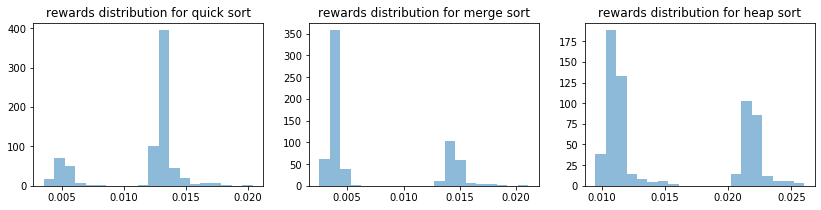

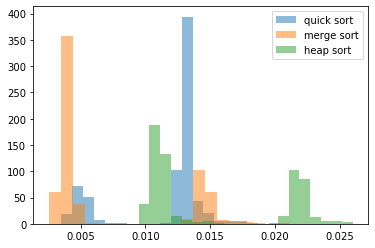

In [140]:
plot_rewards_distribution(arm_rewards_1)
plot_rewards_distribution_together(arm_rewards_1)

Iteration 27
Average rewards per algo {'quick_sort': 0.01484226428565957, 'merge_sort': 0.0, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 28, 'merge_sort': 0, 'heap_sort': 0}


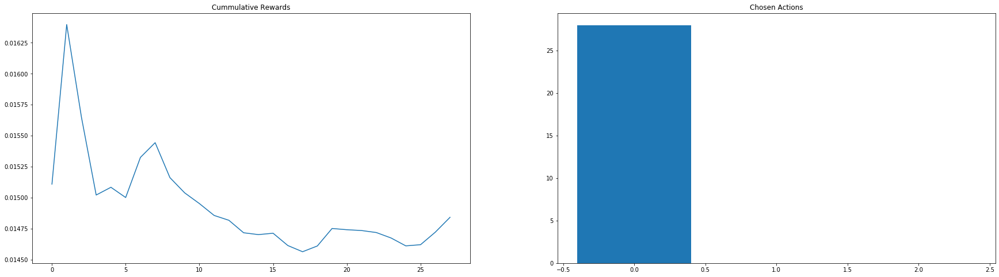

Iteration 52
Average rewards per algo {'quick_sort': 0.014552719565175643, 'merge_sort': 0.01534029999993436, 'heap_sort': 0.022784100000005008}
Count per chosen algo {'quick_sort': 18, 'merge_sort': 1, 'heap_sort': 6}


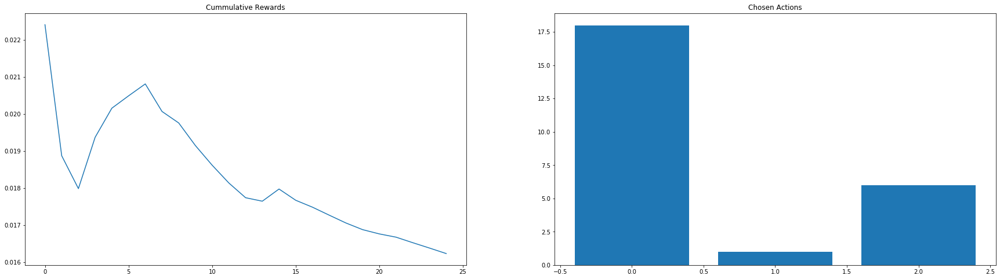

Iteration 68
Average rewards per algo {'quick_sort': 0.01447965645157608, 'merge_sort': 0.0, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 16, 'merge_sort': 0, 'heap_sort': 0}


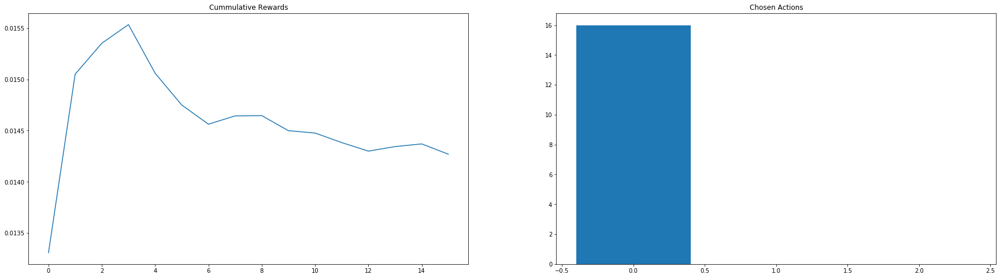

Iteration 86
Average rewards per algo {'quick_sort': 0.014385241095848482, 'merge_sort': 0.0, 'heap_sort': 0.022605992307664843}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 0, 'heap_sort': 7}


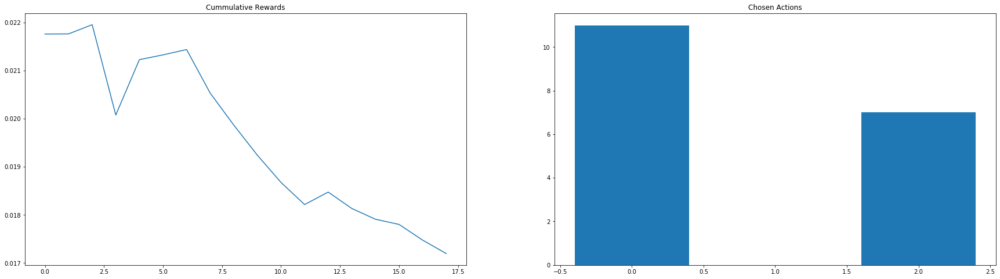

Iteration 106
Average rewards per algo {'quick_sort': 0.014349331081041021, 'merge_sort': 0.01487295000015365, 'heap_sort': 0.022506680645121027}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 1, 'heap_sort': 18}


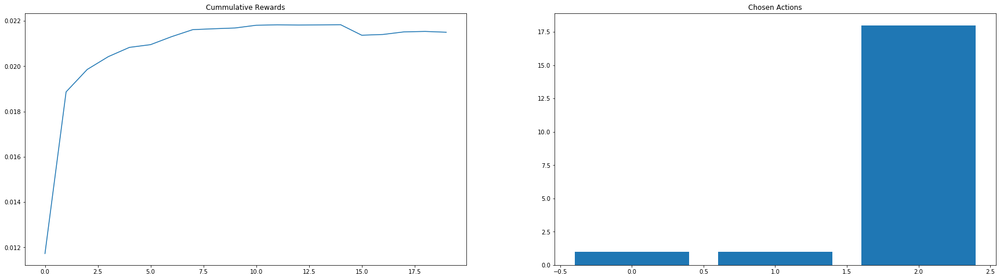

Iteration 133
Average rewards per algo {'quick_sort': 0.01422380930229824, 'merge_sort': 0.014813100000083068, 'heap_sort': 0.02258479333332717}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 1, 'heap_sort': 14}


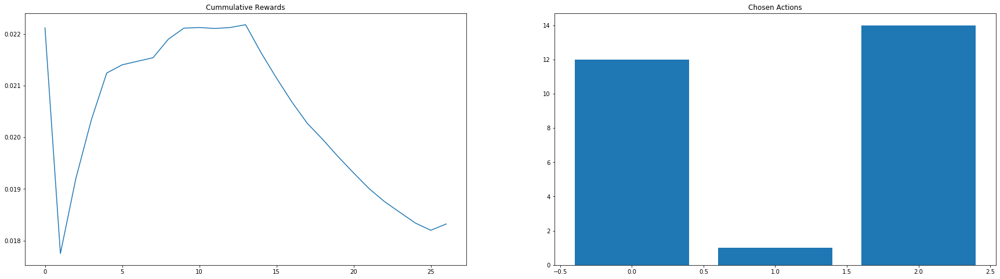

Iteration 149
Average rewards per algo {'quick_sort': 0.014053097058805695, 'merge_sort': 0.0, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 16, 'merge_sort': 0, 'heap_sort': 0}


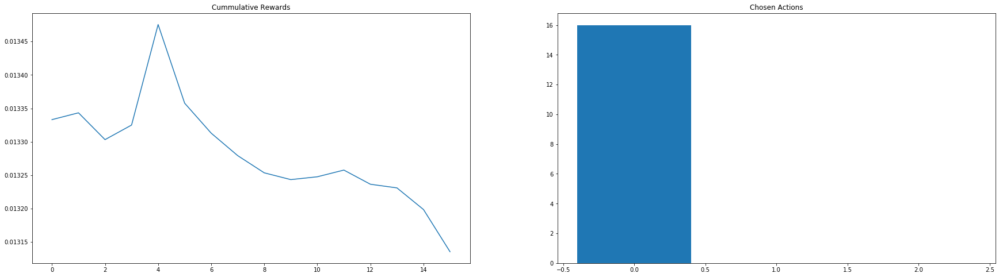

Iteration 170
Average rewards per algo {'quick_sort': 0.013951328688507169, 'merge_sort': 0.0, 'heap_sort': 0.022567202173910988}
Count per chosen algo {'quick_sort': 20, 'merge_sort': 0, 'heap_sort': 1}


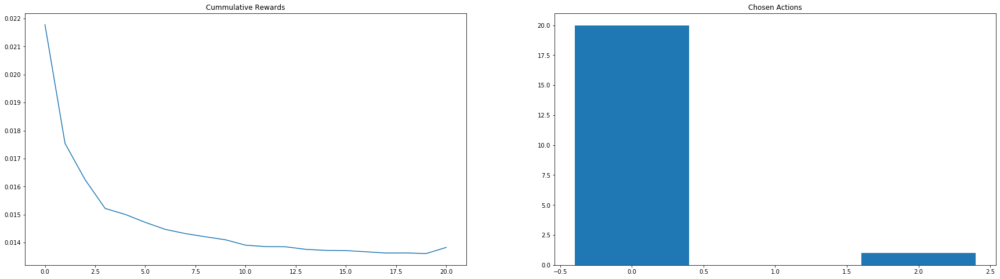

Iteration 192
Average rewards per algo {'quick_sort': 0.013944725203234667, 'merge_sort': 0.01496445217389919, 'heap_sort': 0.022528251063830156}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 20, 'heap_sort': 1}


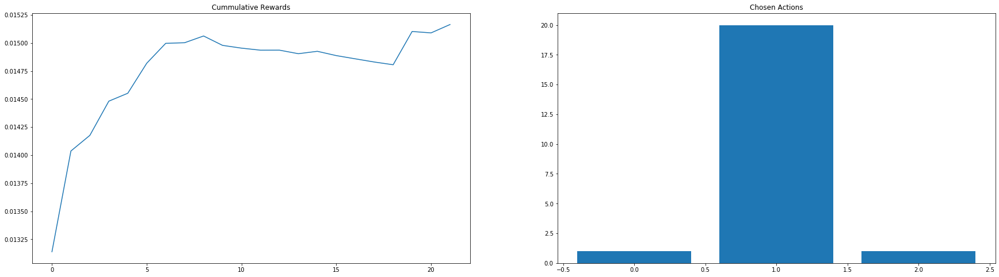

Iteration 210
Average rewards per algo {'quick_sort': 0.013850387857132773, 'merge_sort': 0.0, 'heap_sort': 0.022515541666668543}
Count per chosen algo {'quick_sort': 17, 'merge_sort': 0, 'heap_sort': 1}


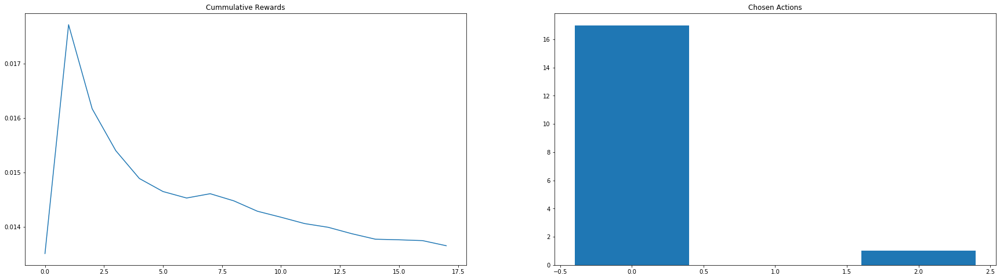

Iteration 225
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.015099139473692813, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 15, 'heap_sort': 0}


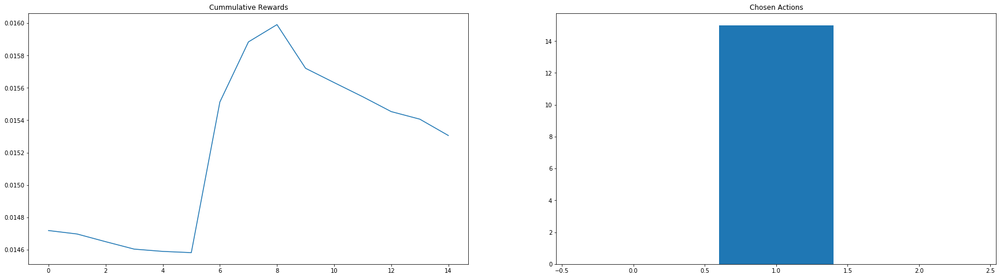

Iteration 243
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.01489316666665414, 'heap_sort': 0.022466894339626346}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 13, 'heap_sort': 5}


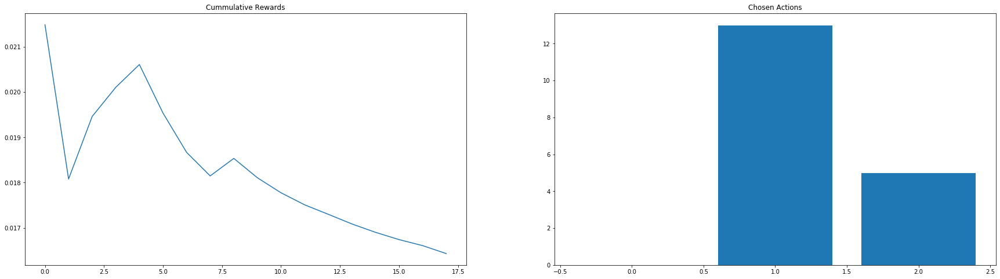

Iteration 259
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0, 'heap_sort': 0.02231359710146759}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 0, 'heap_sort': 16}


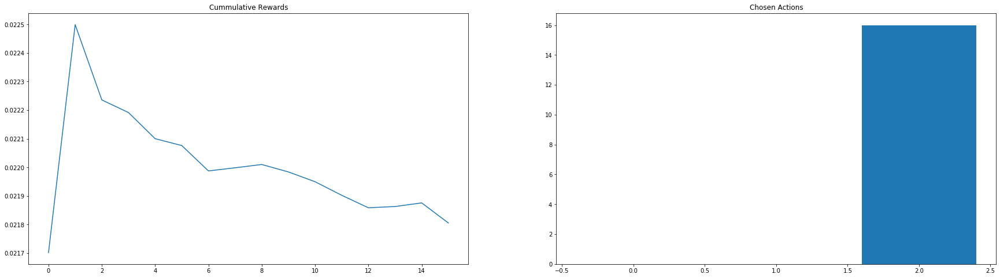

Iteration 319
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.014696639639615561, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 60, 'heap_sort': 0}


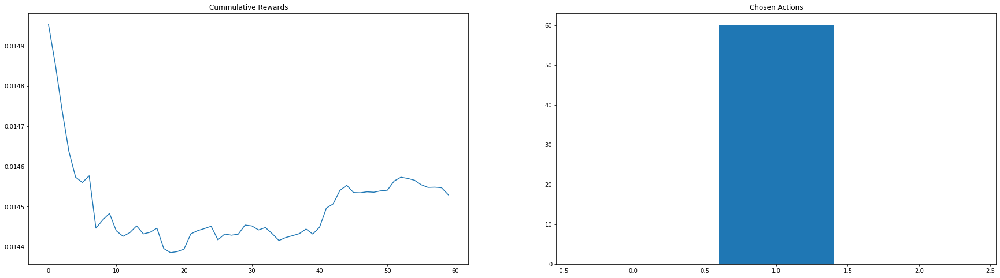

Iteration 349
Average rewards per algo {'quick_sort': 0.013743348214277484, 'merge_sort': 0.01469682857140242, 'heap_sort': 0.02230416000002151}
Count per chosen algo {'quick_sort': 28, 'merge_sort': 1, 'heap_sort': 1}


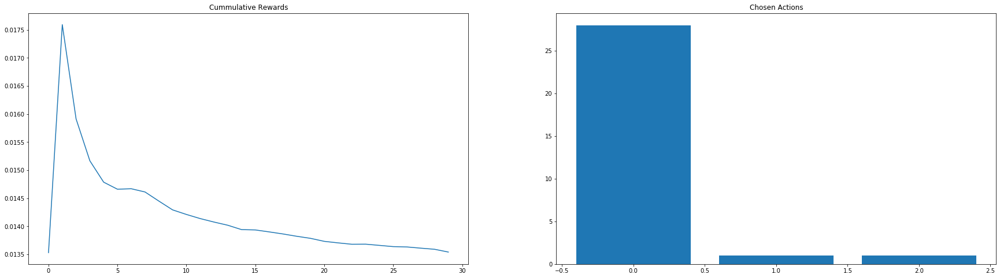

Iteration 407
Average rewards per algo {'quick_sort': 0.013586116742074439, 'merge_sort': 0.014684260344802953, 'heap_sort': 0.02230022535213464}
Count per chosen algo {'quick_sort': 53, 'merge_sort': 4, 'heap_sort': 1}


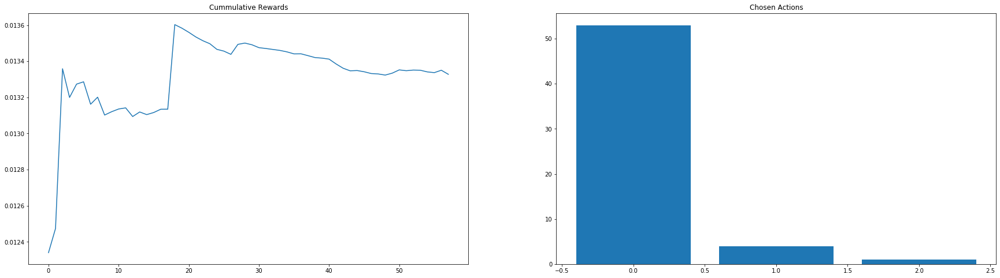

Iteration 424
Average rewards per algo {'quick_sort': 0.013550883122356533, 'merge_sort': 0.0, 'heap_sort': 0.022291766666689403}
Count per chosen algo {'quick_sort': 16, 'merge_sort': 0, 'heap_sort': 1}


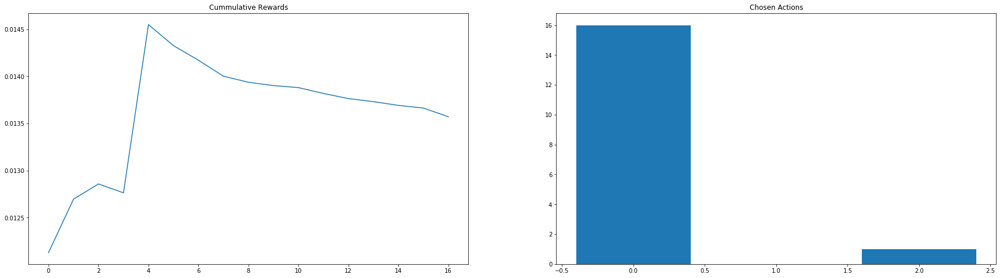

Iteration 459
Average rewards per algo {'quick_sort': 0.013499277037032732, 'merge_sort': 0.01468279914527549, 'heap_sort': 0.022297787671255745}
Count per chosen algo {'quick_sort': 33, 'merge_sort': 1, 'heap_sort': 1}


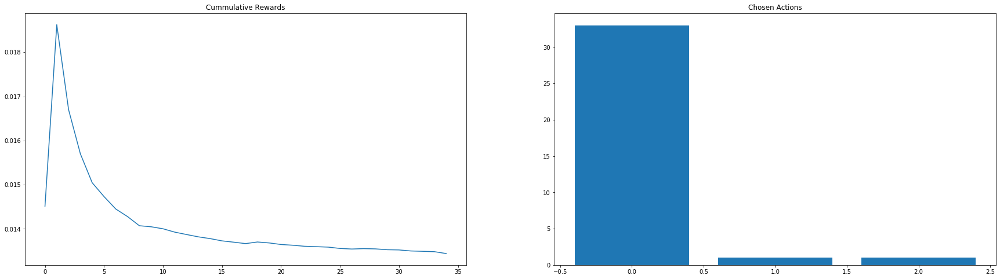

Iteration 500
Average rewards per algo {'quick_sort': 0.013413121290317753, 'merge_sort': 0.014682056779635895, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 40, 'merge_sort': 1, 'heap_sort': 0}


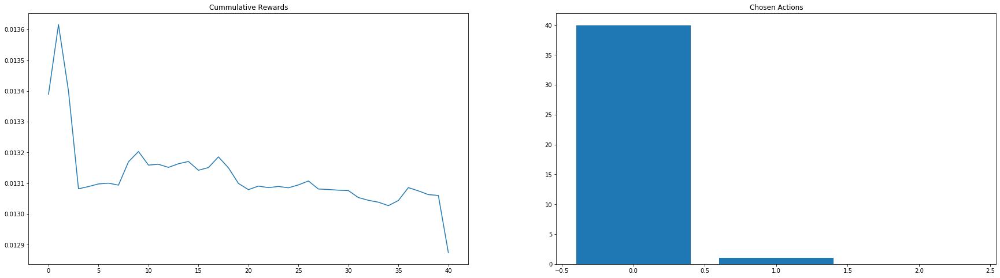

Iteration 513
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.013656973076901452, 'heap_sort': 0.022137074324346768}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 12, 'heap_sort': 1}


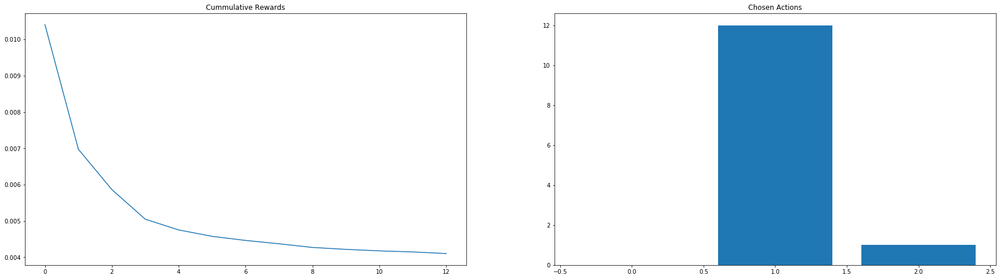

Iteration 524
Average rewards per algo {'quick_sort': 0.013106271962613821, 'merge_sort': 0.0, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 0, 'heap_sort': 0}


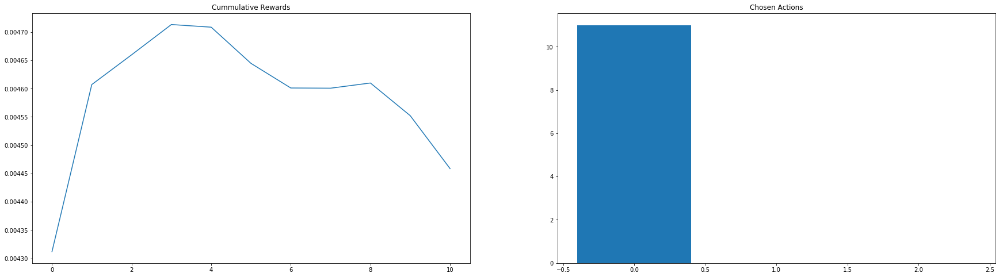

Iteration 551
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0, 'heap_sort': 0.01908348415842135}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 0, 'heap_sort': 27}


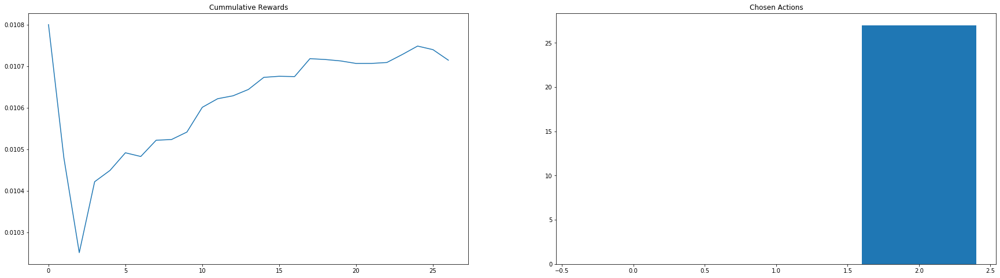

Iteration 566
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.013582173282422779, 'heap_sort': 0.018061100869572723}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 1, 'heap_sort': 14}


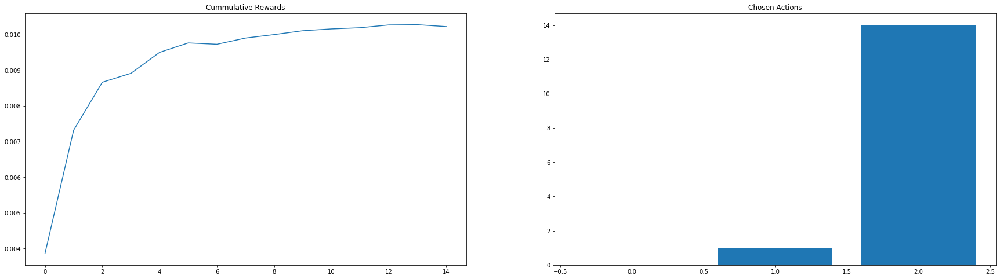

Iteration 582
Average rewards per algo {'quick_sort': 0.01273403898809041, 'merge_sort': 0.0, 'heap_sort': 0.01799583275862915}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 0, 'heap_sort': 1}


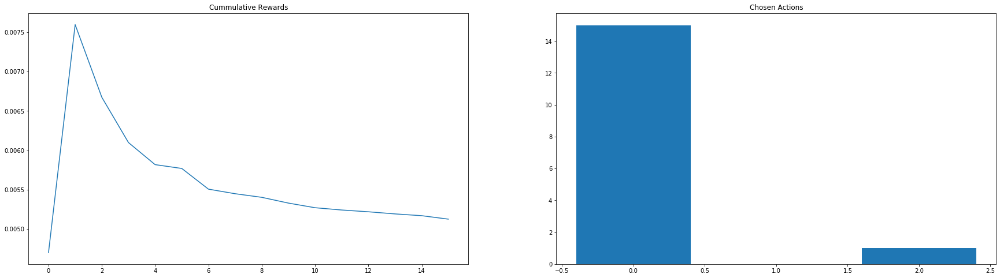

Iteration 594
Average rewards per algo {'quick_sort': 0.012470323919302554, 'merge_sort': 0.013508421969676778, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 1, 'heap_sort': 0}


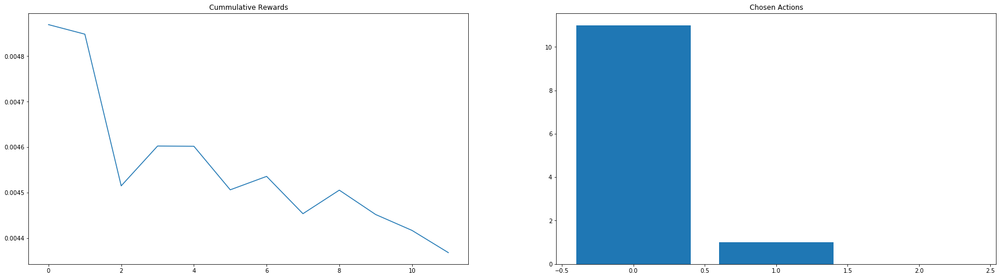

Iteration 611
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.013434592481182773, 'heap_sort': 0.017092758333350586}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 1, 'heap_sort': 16}


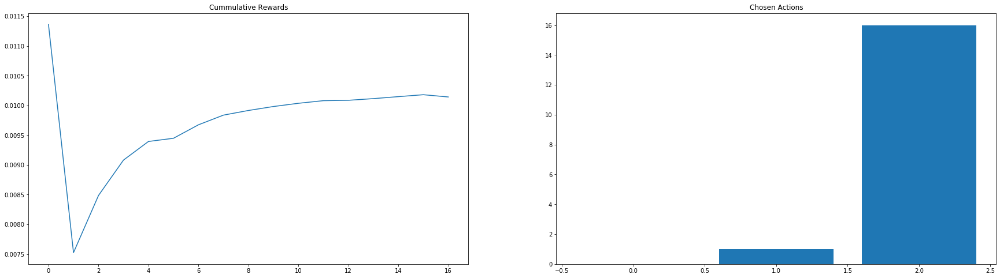

Iteration 624
Average rewards per algo {'quick_sort': 0.01221326490250454, 'merge_sort': 0.013353235820876585, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 1, 'heap_sort': 0}


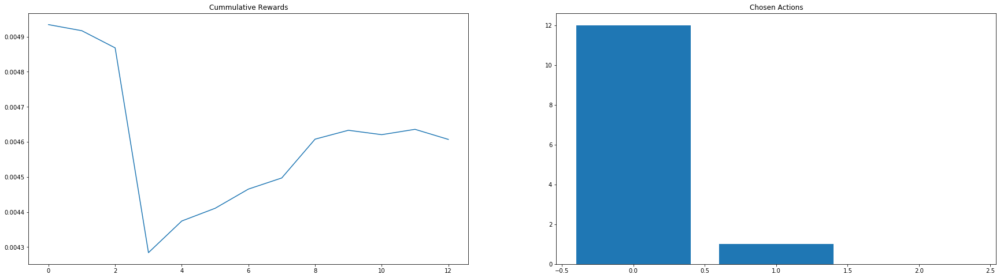

Iteration 666
Average rewards per algo {'quick_sort': 0.012070878961744984, 'merge_sort': 0.01141639464284643, 'heap_sort': 0.017044353383473782}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 34, 'heap_sort': 1}


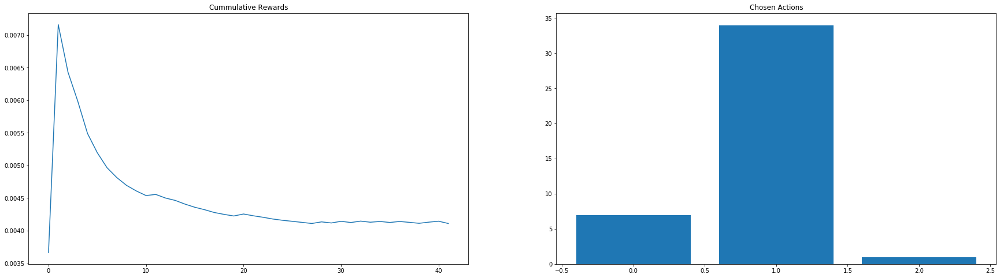

Iteration 707
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.011371023076913069, 'heap_sort': 0.015607278612724311}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 1, 'heap_sort': 40}


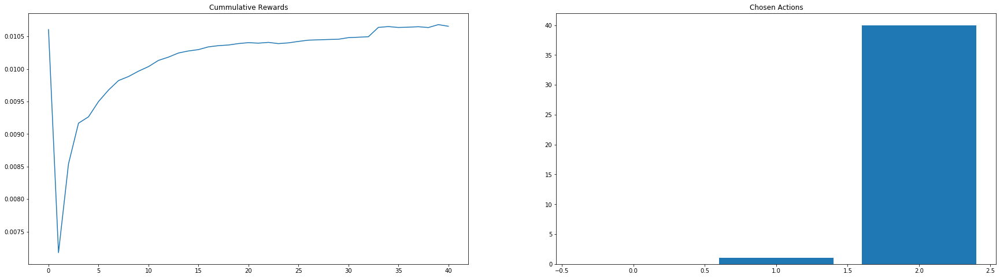

Iteration 736
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0, 'heap_sort': 0.0149343287128877}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 0, 'heap_sort': 29}


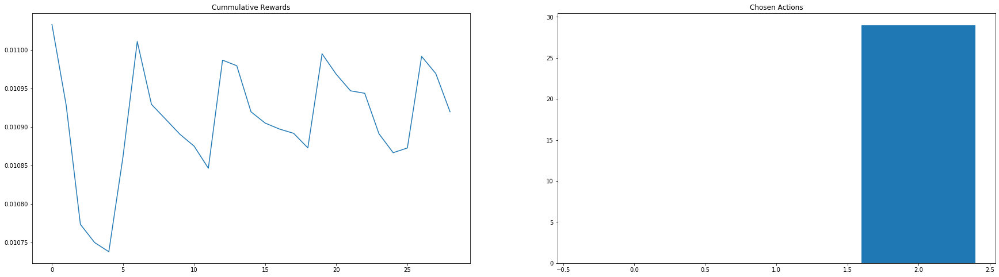

Iteration 770
Average rewards per algo {'quick_sort': 0.011862350397875622, 'merge_sort': 0.010604928191476555, 'heap_sort': 0.014866921844676416}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 19, 'heap_sort': 4}


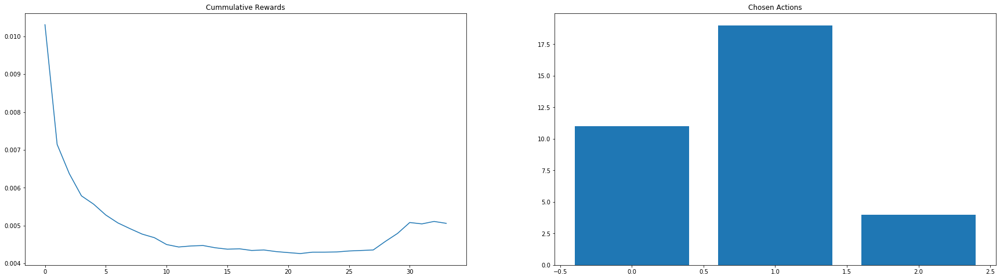

Iteration 817
Average rewards per algo {'quick_sort': 0.011842244708991794, 'merge_sort': 0.01006502941175527, 'heap_sort': 0.014411066949162625}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 16, 'heap_sort': 30}


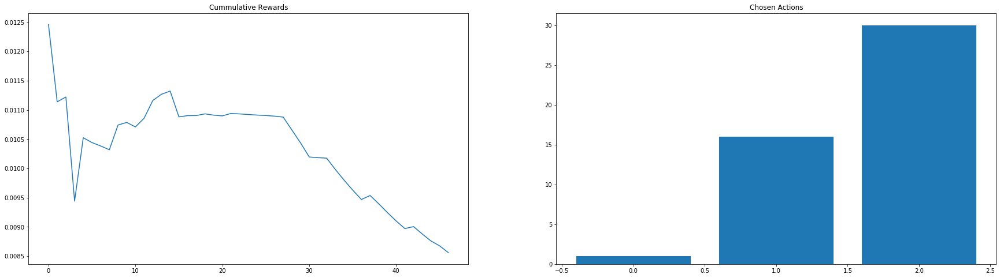

Iteration 835
Average rewards per algo {'quick_sort': 0.011822931926118602, 'merge_sort': 0.00959751318181051, 'heap_sort': 0.014395929957816345}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 16, 'heap_sort': 1}


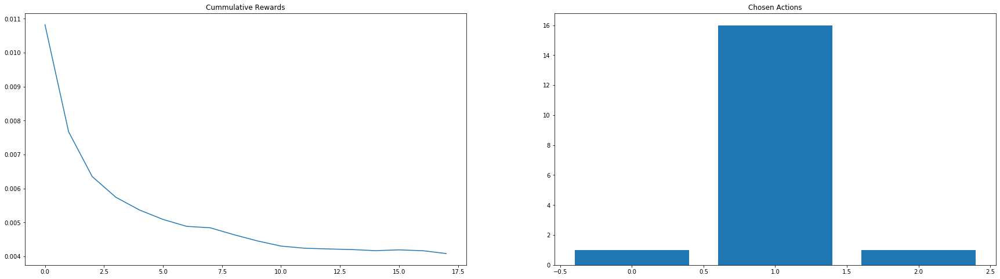

Iteration 975
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.007722063975158071, 'heap_sort': 0.0139082836363708}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 102, 'heap_sort': 38}


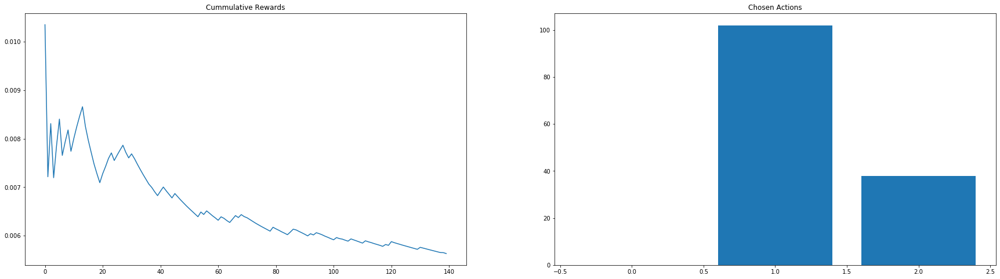

Iteration 1031
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0, 'heap_sort': 0.014455003021147167}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 0, 'heap_sort': 56}


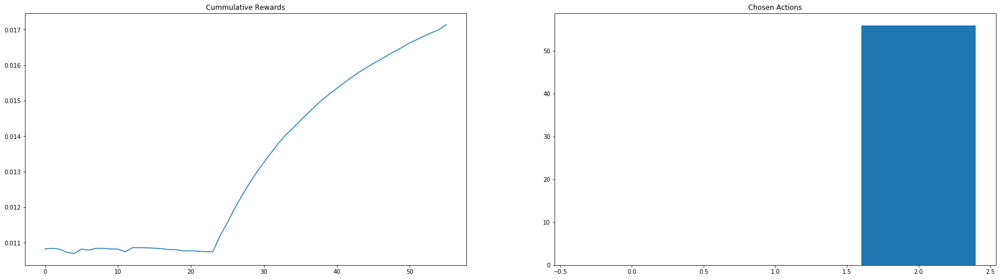

Iteration 1120
Average rewards per algo {'quick_sort': 0.012047821380843553, 'merge_sort': 0.0, 'heap_sort': 0.014849400857143077}
Count per chosen algo {'quick_sort': 70, 'merge_sort': 0, 'heap_sort': 19}


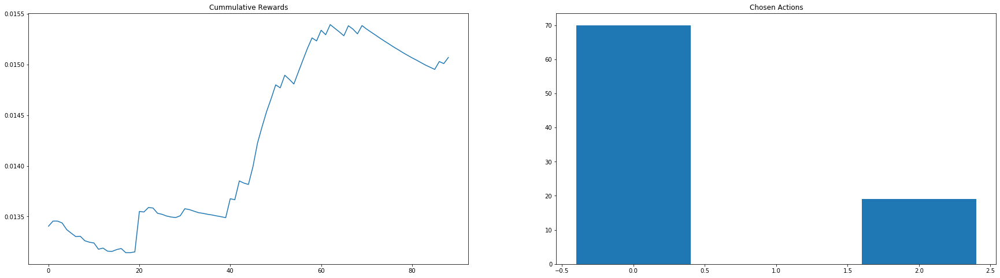

Iteration 1171
Average rewards per algo {'quick_sort': 0.012096262127656797, 'merge_sort': 0.008296676638184359, 'heap_sort': 0.014868673789173812}
Count per chosen algo {'quick_sort': 21, 'merge_sort': 29, 'heap_sort': 1}


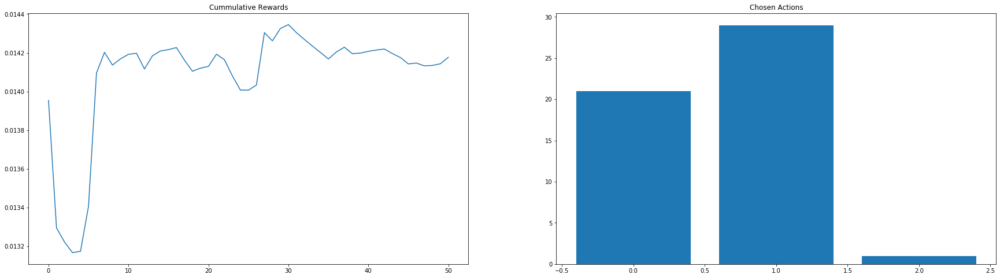

Iteration 1183
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.00831586732955326, 'heap_sort': 0.01507973038674108}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 1, 'heap_sort': 11}


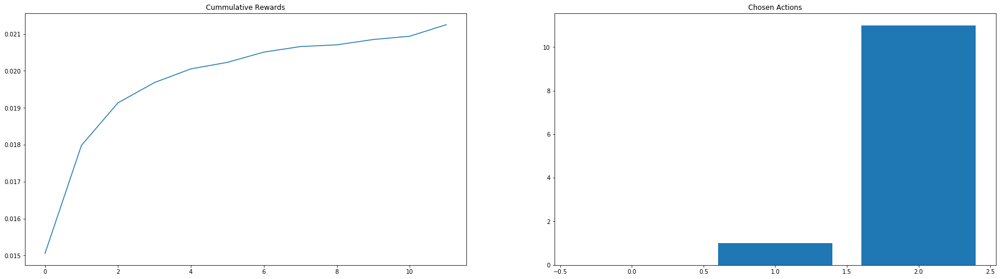

Iteration 1293
Average rewards per algo {'quick_sort': 0.01219551857410692, 'merge_sort': 0.0, 'heap_sort': 0.01586168753056083}
Count per chosen algo {'quick_sort': 63, 'merge_sort': 0, 'heap_sort': 47}


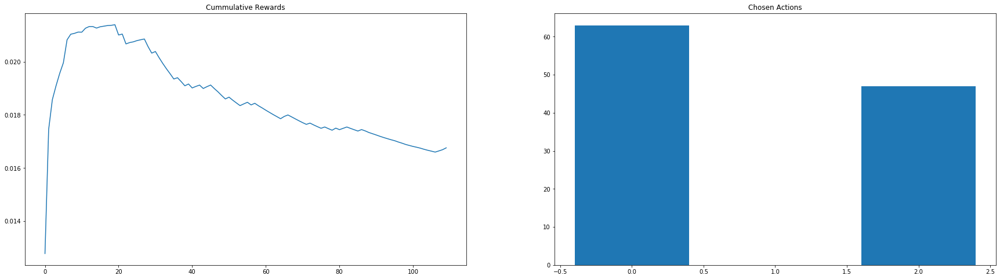

Iteration 1350
Average rewards per algo {'quick_sort': 0.01219753014981067, 'merge_sort': 0.008554014560445466, 'heap_sort': 0.016435439735099134}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 12, 'heap_sort': 44}


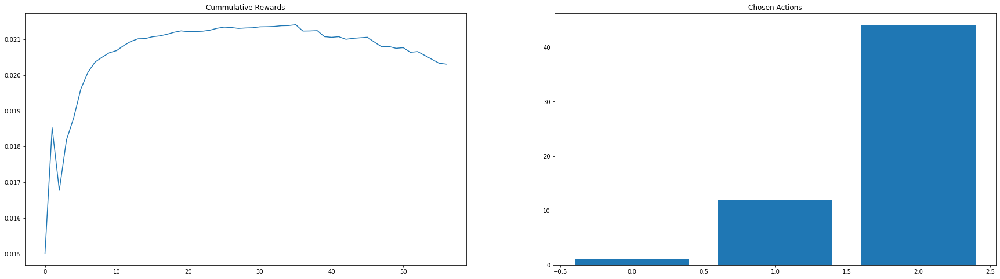

Iteration 1420
Average rewards per algo {'quick_sort': 0.01230206833332962, 'merge_sort': 0.00857153698630785, 'heap_sort': 0.01647156162280744}
Count per chosen algo {'quick_sort': 66, 'merge_sort': 1, 'heap_sort': 3}


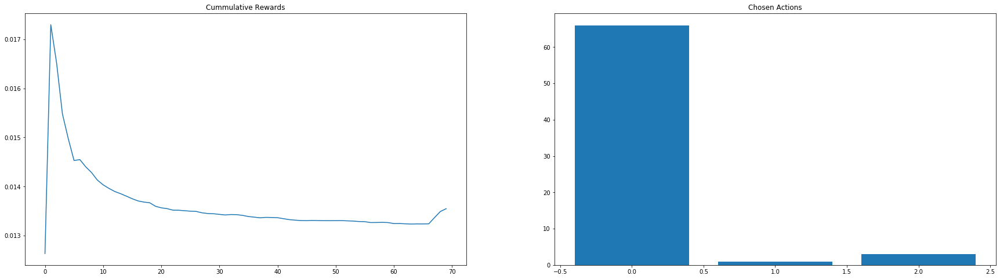

Iteration 1489
Average rewards per algo {'quick_sort': 0.012354123328146008, 'merge_sort': 0.008961693350388102, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 43, 'merge_sort': 26, 'heap_sort': 0}


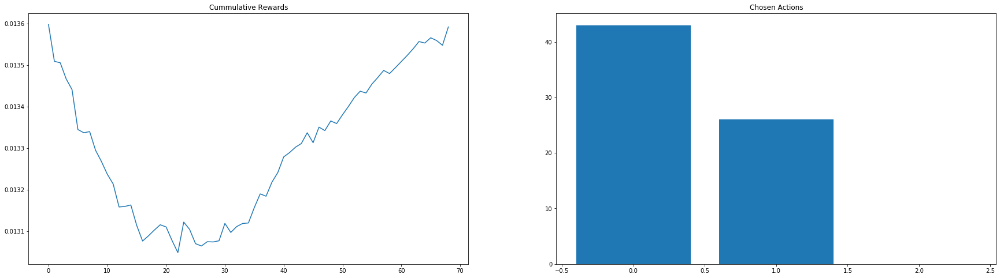

Iteration 1512
Average rewards per algo {'quick_sort': 0.01223000932330634, 'merge_sort': 0.00897683698980129, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 22, 'merge_sort': 1, 'heap_sort': 0}


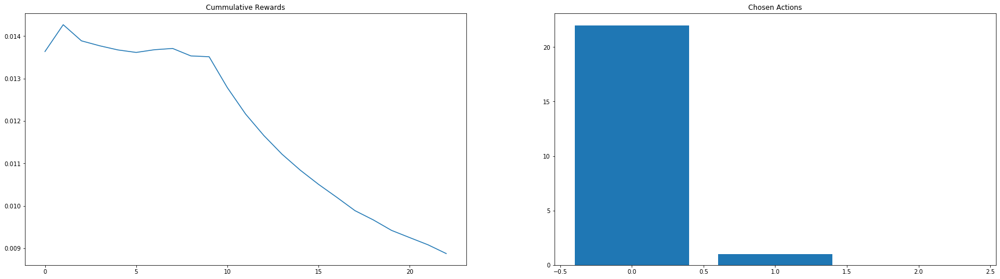

Iteration 1577
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.008244379166674327, 'heap_sort': 0.016463590590809228}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 64, 'heap_sort': 1}


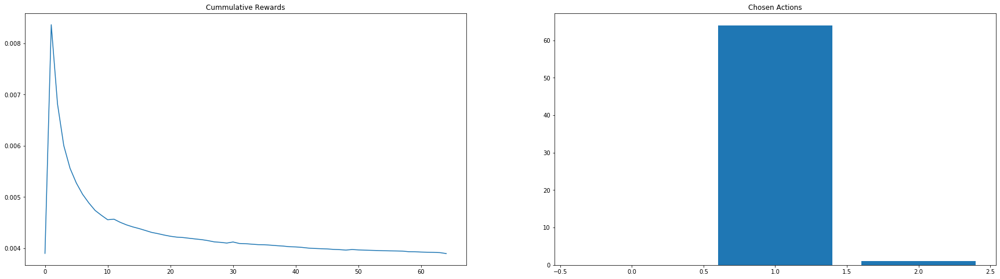

Iteration 1722
Average rewards per algo {'quick_sort': 0.012220173873871787, 'merge_sort': 0.007818668389670163, 'heap_sort': 0.015597751444044008}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 47, 'heap_sort': 97}


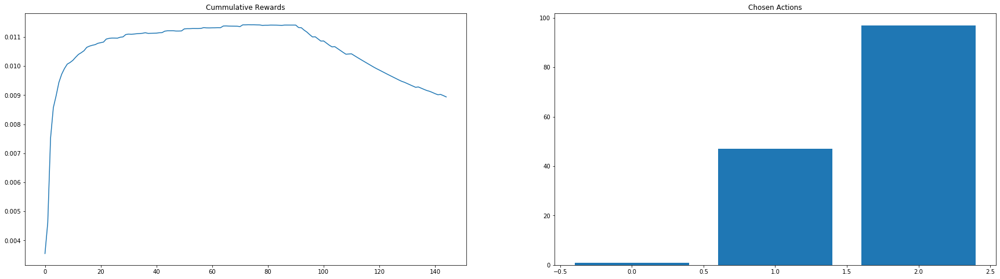

Iteration 1779
Average rewards per algo {'quick_sort': 0.011965481358378372, 'merge_sort': 0.0, 'heap_sort': 0.015376839145299791}
Count per chosen algo {'quick_sort': 26, 'merge_sort': 0, 'heap_sort': 31}


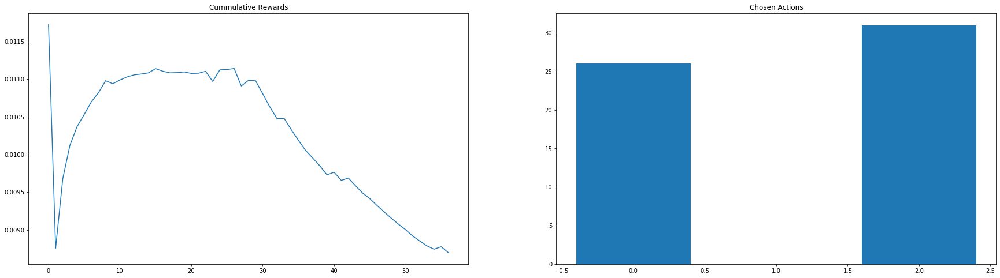

Iteration 1821
Average rewards per algo {'quick_sort': 0.011956076623373335, 'merge_sort': 0.007617734026471415, 'heap_sort': 0.015277229666669428}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 26, 'heap_sort': 15}


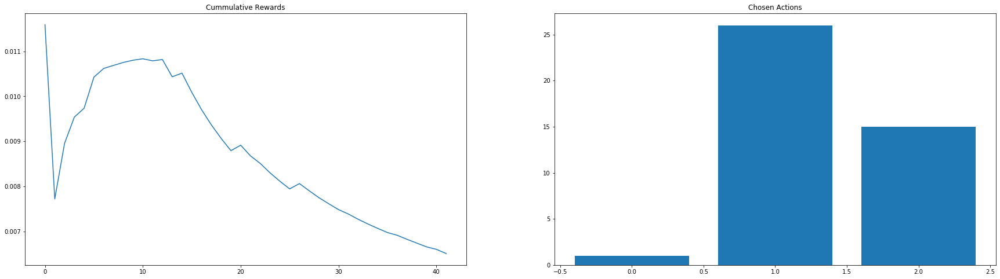

Iteration 1842
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.00747787140255675, 'heap_sort': 0.015270858901833145}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 20, 'heap_sort': 1}


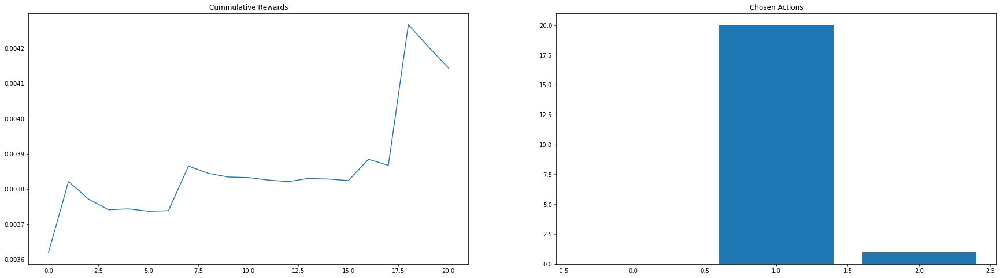

Iteration 1904
Average rewards per algo {'quick_sort': 0.011946958789621931, 'merge_sort': 0.007111700000006272, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 61, 'heap_sort': 0}


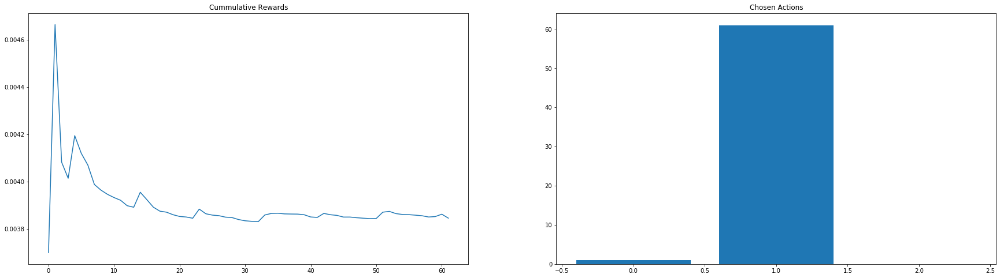

Iteration 1963
Average rewards per algo {'quick_sort': 0.011622287808215757, 'merge_sort': 0.007106544189859059, 'heap_sort': 0.015126628410918351}
Count per chosen algo {'quick_sort': 36, 'merge_sort': 1, 'heap_sort': 22}


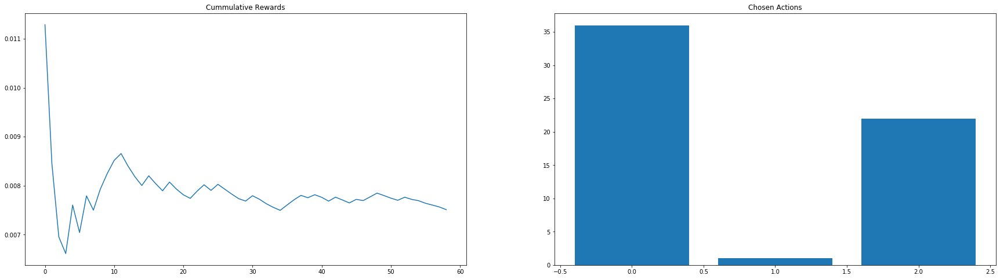

Iteration 1999
Average rewards per algo {'quick_sort': 0.011613813543088342, 'merge_sort': 0.006932728792575313, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 35, 'heap_sort': 0}


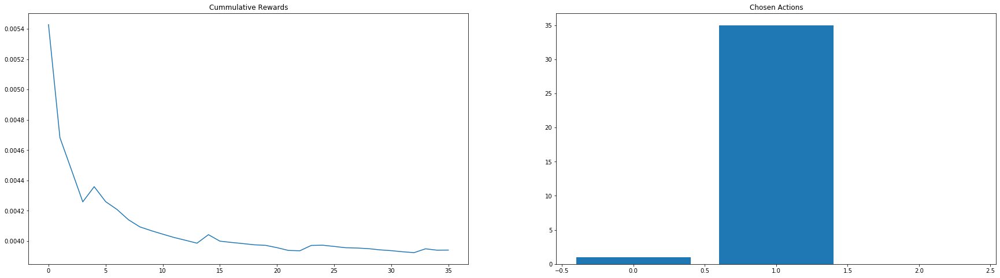

Total reward 22.3921


In [122]:
for elem in list_iteration_results_1:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_1,4))

## Two outliers in a row restart the expriment

In [123]:
list_iteration_results_2, total_reward_2, arm_rewards_2 = ts_quantile(list_distributions, n_samples, num_consec_elem=2)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.8476036636438633
Less than two values for merge_sort
merge_sort Theta 0.9042575758997605
Less than two values for heap_sort
heap_sort Theta 0.6666396563518768


Chosen algorithm is:  heap_sort with reward: 0.022951600000396866
Sample mean is:  0.022951600000396866 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.29863886428818986
Less than two values for merge_sort
merge_sort Theta 0.18989792866929378
Less than two values for heap_sort
heap_sort Theta 0.8945654599836615


Chosen algorithm is:  merge_sort with reward: 0.01490220000005138
Sample mean is:  0.01490220000005138 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.48669899324797594
Less than two values for merge_sort
merge_sort Theta 0.960379239563594
Less than two values for heap_sort
heap_sort Theta 0.7396471966699498


Chosen algorithm is:  quick_sort with reward: 0.01



Iteration: 27
Less than two values for quick_sort
quick_sort Theta 0.13452221296413747
merge_sort Theta 0.01856329212197487
Less than two values for heap_sort
heap_sort Theta 0.19244368499115294


Chosen algorithm is:  merge_sort with reward: 0.015392399999655026
Sample mean is:  0.016054373076992937 Sample variance is: 3.7784079065841963e-06


Iteration: 28
Less than two values for quick_sort
quick_sort Theta 0.28467547207969646
merge_sort Theta 0.012193366463435048
Less than two values for heap_sort
heap_sort Theta 0.5624578359742941


Chosen algorithm is:  merge_sort with reward: 0.015731999999843538
Sample mean is:  0.01604243333339481 Sample variance is: 3.6421733674139167e-06


Iteration: 29
Less than two values for quick_sort
quick_sort Theta 0.3453923798820908
merge_sort Theta 0.01637511000913643
Less than two values for heap_sort
heap_sort Theta 0.08535156851365566


Chosen algorithm is:  merge_sort with reward: 0.015882499999861466
Sample mean is:  0.01603672142862576 Sampl



Chosen algorithm is:  merge_sort with reward: 0.016501200000220706
Sample mean is:  0.015807854545486902 Sample variance is: 2.0168831613929224e-06


Iteration: 57
Less than two values for quick_sort
quick_sort Theta 0.74939180189993
merge_sort Theta 0.0153409093124883
Less than two values for heap_sort
heap_sort Theta 0.9639208741127605


Chosen algorithm is:  merge_sort with reward: 0.01591729999972813
Sample mean is:  0.015809808928598353 Sample variance is: 1.9810774693878105e-06


Iteration: 58
Less than two values for quick_sort
quick_sort Theta 0.8179998313083827
merge_sort Theta 0.015381435804418702
Less than two values for heap_sort
heap_sort Theta 0.1355147097009195


Chosen algorithm is:  merge_sort with reward: 0.014958999999635125
Sample mean is:  0.0157948824561604 Sample variance is: 1.9587985007595237e-06


Iteration: 59
Less than two values for quick_sort
quick_sort Theta 0.3966736084657817
merge_sort Theta 0.0160914940936492
Less than two values for heap_sort
heap_s



Iteration: 87
Less than two values for quick_sort
quick_sort Theta 0.15582503371217848
merge_sort Theta 0.0158885560234595
Less than two values for heap_sort
heap_sort Theta 0.898296692686466


Chosen algorithm is:  merge_sort with reward: 0.015511600000081671
Sample mean is:  0.015578787209299895 Sample variance is: 1.4648408562611188e-06


Iteration: 88
Less than two values for quick_sort
quick_sort Theta 0.02217926803514081
merge_sort Theta 0.016147549658241583
Less than two values for heap_sort
heap_sort Theta 0.9751437991604708


Chosen algorithm is:  merge_sort with reward: 0.015065199999753531
Sample mean is:  0.01557288390804074 Sample variance is: 1.451000616094771e-06


Iteration: 89
Less than two values for quick_sort
quick_sort Theta 0.35001943375952926
merge_sort Theta 0.015851597146698156
Less than two values for heap_sort
heap_sort Theta 0.3008694823985195


Chosen algorithm is:  merge_sort with reward: 0.015309200000046985
Sample mean is:  0.015569887499995357 Sample 



Iteration: 118
quick_sort Theta 0.01395209087631713
merge_sort Theta 0.014862011116820336
heap_sort Theta 0.029250464453717467


Chosen algorithm is:  quick_sort with reward: 0.014025400000264199
Sample mean is:  0.01363959130434444 Sample variance is: 6.337580677511228e-07


Iteration: 119
quick_sort Theta 0.013014160432822578
merge_sort Theta 0.016150179326182373
heap_sort Theta 0.020960266068520715


Chosen algorithm is:  quick_sort with reward: 0.013624700000036682
Sample mean is:  0.013638970833331618 Sample variance is: 6.073603362332143e-07


Iteration: 120
quick_sort Theta 0.015103724425406072
merge_sort Theta 0.015508623298610844
heap_sort Theta 0.024516687544397193


Chosen algorithm is:  quick_sort with reward: 0.01346319999993284
Sample mean is:  0.013631939999995665 Sample variance is: 5.842523056014359e-07


Iteration: 121
quick_sort Theta 0.011490326185547795
merge_sort Theta 0.014205052806147722
heap_sort Theta 0.019758313907394326


Chosen algorithm is:  quick_sort w



Iteration: 151
quick_sort Theta 0.013708677978153056
merge_sort Theta 0.01542680809398531
heap_sort Theta 0.022264198645557898


Chosen algorithm is:  quick_sort with reward: 0.013724400000228343
Sample mean is:  0.013543012962970722 Sample variance is: 3.615343792690819e-07


Iteration: 152
quick_sort Theta 0.013802712282566161
merge_sort Theta 0.015078120469628352
heap_sort Theta 0.022059755540481157


Chosen algorithm is:  quick_sort with reward: 0.013382500000261643
Sample mean is:  0.01354009454546692 Sample variance is: 3.5542095359796567e-07


Iteration: 153
quick_sort Theta 0.013457751031755442
merge_sort Theta 0.015799185094453404
heap_sort Theta 0.023150033894589542


Chosen algorithm is:  quick_sort with reward: 0.013629200000195851
Sample mean is:  0.013541685714301366 Sample variance is: 3.4921340085942884e-07


Iteration: 154
quick_sort Theta 0.014272125370977037
merge_sort Theta 0.016463659177084308
heap_sort Theta 0.02168709343931618


Chosen algorithm is:  quick_sort



Chosen algorithm is:  quick_sort with reward: 0.014742200000000594
Sample mean is:  0.013506850574722402 Sample variance is: 2.842609792769564e-07


Iteration: 185
quick_sort Theta 0.013521035724287594
merge_sort Theta 0.015197111352140212
heap_sort Theta 0.023386400939188853


Chosen algorithm is:  quick_sort with reward: 0.0139060999999856
Sample mean is:  0.013511387500009485 Sample variance is: 2.828215219983508e-07


Iteration: 186
quick_sort Theta 0.013527185481536374
merge_sort Theta 0.014704943869641095
heap_sort Theta 0.024158502347533434


Chosen algorithm is:  quick_sort with reward: 0.013488600000073347
Sample mean is:  0.01351113146068436 Sample variance is: 2.7964952102822595e-07


Iteration: 187
quick_sort Theta 0.013631156776433716
merge_sort Theta 0.015416513492050251
heap_sort Theta 0.023690273859553967


Chosen algorithm is:  quick_sort with reward: 0.013006800000312069
Sample mean is:  0.013505527777791333 Sample variance is: 2.793370164428494e-07


Iteration: 188

Sample mean is:  0.013478377500011145 Sample variance is: 2.6835444623865135e-07


Iteration: 218
quick_sort Theta 0.01377016355470344
merge_sort Theta 0.015096594549497348
heap_sort Theta 0.017633273020620552


Chosen algorithm is:  quick_sort with reward: 0.013671200000317185
Sample mean is:  0.013479971074393839 Sample variance is: 2.664413784154177e-07


Iteration: 219
quick_sort Theta 0.013663184664215313
merge_sort Theta 0.015586522388134185
heap_sort Theta 0.02109304642016519


Chosen algorithm is:  quick_sort with reward: 0.01333969999996043
Sample mean is:  0.013478821311488648 Sample variance is: 2.644173892140179e-07


Iteration: 220
quick_sort Theta 0.01397984369211561
merge_sort Theta 0.015999702952921607
heap_sort Theta 0.0230481666043297


Chosen algorithm is:  quick_sort with reward: 0.013089799999761453
Sample mean is:  0.013475658536596555 Sample variance is: 2.634880380345603e-07


Iteration: 221
quick_sort Theta 0.013659662129922453
merge_sort Theta 0.01605962694143



Chosen algorithm is:  quick_sort with reward: 0.014945299999908457
Sample mean is:  0.013497503947381742 Sample variance is: 3.434183365693487e-07


Iteration: 250
quick_sort Theta 0.013805419266853174
merge_sort Theta 0.01542896865206934
heap_sort Theta 0.022953331015579233


Chosen algorithm is:  quick_sort with reward: 0.013641399999869463
Sample mean is:  0.013498444444456826 Sample variance is: 3.413082215597782e-07


Iteration: 251
quick_sort Theta 0.013203084113175414
merge_sort Theta 0.015545033678153066
heap_sort Theta 0.021007317348896486


Chosen algorithm is:  quick_sort with reward: 0.013779200000044511
Sample mean is:  0.013500267532480122 Sample variance is: 3.396004528477178e-07


Iteration: 252
quick_sort Theta 0.013315635879496707
merge_sort Theta 0.014420620295270461
heap_sort Theta 0.023137509509304995


Chosen algorithm is:  quick_sort with reward: 0.0133083999999144
Sample mean is:  0.01349902967743131 Sample variance is: 3.3764545409295174e-07


Iteration: 253




Chosen algorithm is:  quick_sort with reward: 0.018403999999918597
Sample mean is:  0.01350703763441205 Sample variance is: 4.352310937481437e-07


Iteration: 284
quick_sort Theta 0.013485444128444591
merge_sort Theta 0.0156807817223618
heap_sort Theta 0.023604345246011908


Chosen algorithm is:  quick_sort with reward: 0.013138299999809533
Sample mean is:  0.013505065775403481 Sample variance is: 4.33626865142783e-07


Iteration: 285
quick_sort Theta 0.01362345794272415
merge_sort Theta 0.015746760955828235
heap_sort Theta 0.023603212102890188


Chosen algorithm is:  quick_sort with reward: 0.013707499999782158
Sample mean is:  0.01350614255319273 Sample variance is: 4.315371564905511e-07


Iteration: 286
quick_sort Theta 0.013718758265596808
merge_sort Theta 0.01607943089883033
heap_sort Theta 0.0234046047847701


Chosen algorithm is:  quick_sort with reward: 0.013605000000097789
Sample mean is:  0.013506665608467359 Sample variance is: 4.29305325434514e-07


Iteration: 287
quick_s

merge_sort Theta 0.013897555507129693
heap_sort Theta 0.02268427247317905


Chosen algorithm is:  quick_sort with reward: 0.01471049999963725
Sample mean is:  0.013490239908255425 Sample variance is: 4.0626598038327645e-07


Iteration: 316
quick_sort Theta 0.013596156418971727
merge_sort Theta 0.014693790749241792
heap_sort Theta 0.02247105672544009


Chosen algorithm is:  quick_sort with reward: 0.013402300000052492
Sample mean is:  0.013489838356163174 Sample variance is: 4.04446035792488e-07


Iteration: 317
quick_sort Theta 0.013531064874116263
merge_sort Theta 0.015734108342805756
heap_sort Theta 0.023130242794867674


Chosen algorithm is:  quick_sort with reward: 0.01350300000012794
Sample mean is:  0.01348989818181756 Sample variance is: 4.0260842854555814e-07


Iteration: 318
quick_sort Theta 0.013198972644209014
merge_sort Theta 0.015395013232342263
heap_sort Theta 0.023541474186448405


Chosen algorithm is:  quick_sort with reward: 0.01344729999982519
Sample mean is:  0.01348



Chosen algorithm is:  quick_sort with reward: 0.014998099999957049
Sample mean is:  0.01348633694779238 Sample variance is: 3.7837502899905333e-07


Iteration: 347
quick_sort Theta 0.013576984101366995
merge_sort Theta 0.015861375510072176
heap_sort Theta 0.020876726129372036


Chosen algorithm is:  quick_sort with reward: 0.013883699999951205
Sample mean is:  0.013487926400001016 Sample variance is: 3.774905921056175e-07


Iteration: 348
quick_sort Theta 0.013369590002620899
merge_sort Theta 0.015069757815195543
heap_sort Theta 0.02191108426369772


Chosen algorithm is:  quick_sort with reward: 0.013114599999880738
Sample mean is:  0.013486439043825238 Sample variance is: 3.7653970262192964e-07


Iteration: 349
quick_sort Theta 0.013343900381771091
merge_sort Theta 0.015774823216614386
heap_sort Theta 0.019969603278281435


Chosen algorithm is:  quick_sort with reward: 0.013704299999972136
Sample mean is:  0.013487303571428995 Sample variance is: 3.7523309685518735e-07


Iteration: 

quick_sort Theta 0.013604381219531893
Less than two values for merge_sort
merge_sort Theta 0.4251118524844504
Less than two values for heap_sort
heap_sort Theta 0.9859175089033966


Chosen algorithm is:  quick_sort with reward: 0.015392999999676249
Sample mean is:  0.01350974240283441 Sample variance is: 3.895583128330986e-07


Iteration: 381
quick_sort Theta 0.0129937549559286
Less than two values for merge_sort
merge_sort Theta 0.693603604832929
Less than two values for heap_sort
heap_sort Theta 0.9368478042988355


Chosen algorithm is:  quick_sort with reward: 0.014014400000178284
Sample mean is:  0.01351151936620534 Sample variance is: 3.890802290995015e-07


Iteration: 382
quick_sort Theta 0.014056810493944711
Less than two values for merge_sort
merge_sort Theta 0.05272979517474008
Less than two values for heap_sort
heap_sort Theta 0.6934052067875845


Chosen algorithm is:  quick_sort with reward: 0.013512300000002142
Sample mean is:  0.013511522105271293 Sample variance is: 3.877



Iteration: 404
quick_sort Theta 0.013967232751064441
Less than two values for merge_sort
merge_sort Theta 0.11205975151217262
Less than two values for heap_sort
heap_sort Theta 0.20340279056025534


Chosen algorithm is:  quick_sort with reward: 0.01386610000008659
Sample mean is:  0.01351484820847591 Sample variance is: 3.791614956561784e-07


Iteration: 405
quick_sort Theta 0.014293689329467446
Less than two values for merge_sort
merge_sort Theta 0.48164951480267537
Less than two values for heap_sort
heap_sort Theta 0.06414354338123918


Chosen algorithm is:  quick_sort with reward: 0.013642399999753252
Sample mean is:  0.013515262337668369 Sample variance is: 3.7798310325644323e-07


Iteration: 406
quick_sort Theta 0.0141629625923439
Less than two values for merge_sort
merge_sort Theta 0.5650048736338357
Less than two values for heap_sort
heap_sort Theta 0.9099671017318693


Chosen algorithm is:  quick_sort with reward: 0.013827199999923323
Sample mean is:  0.013516271844665959 Sam



Iteration: 428
quick_sort Theta 0.013548772978621398
Less than two values for merge_sort
merge_sort Theta 0.4275101805599191
Less than two values for heap_sort
heap_sort Theta 0.5715723388140515


Chosen algorithm is:  quick_sort with reward: 0.013989499999752297
Sample mean is:  0.013527345921461497 Sample variance is: 3.7813419988458393e-07


Iteration: 429
quick_sort Theta 0.012968493707403161
Less than two values for merge_sort
merge_sort Theta 0.043990507626485154
Less than two values for heap_sort
heap_sort Theta 0.3917223384080242


Chosen algorithm is:  quick_sort with reward: 0.013779800000065734
Sample mean is:  0.013528106325312716 Sample variance is: 3.7718663029080595e-07


Iteration: 430
quick_sort Theta 0.013363592395794372
Less than two values for merge_sort
merge_sort Theta 0.1545556385314184
Less than two values for heap_sort
heap_sort Theta 0.2488944143914834


Chosen algorithm is:  quick_sort with reward: 0.013557700000092154
Sample mean is:  0.013528195195206948 



Iteration: 452
quick_sort Theta 0.014396778642988231
Less than two values for merge_sort
merge_sort Theta 0.009026387427621074
Less than two values for heap_sort
heap_sort Theta 0.7868512510588653


Chosen algorithm is:  merge_sort with reward: 0.01623410000001968
Sample mean is:  0.015539581914887829 Sample variance is: 1.3802199108754127e-06


Iteration: 453
quick_sort Theta 0.012964741633715058
Less than two values for merge_sort
merge_sort Theta 0.010917528168271073
Less than two values for heap_sort
heap_sort Theta 0.2198222101845705


Chosen algorithm is:  merge_sort with reward: 0.015157100000124046
Sample mean is:  0.015535555789469264 Sample variance is: 1.3672149907079052e-06


Iteration: 454
quick_sort Theta 0.013656492452564707
merge_sort Theta 0.01360317728625723
Less than two values for heap_sort
heap_sort Theta 0.28712978003523093


Chosen algorithm is:  merge_sort with reward: 0.015180899999904796
Sample mean is:  0.015531861458327967 Sample variance is: 1.35426973573



Chosen algorithm is:  quick_sort with reward: 0.015437500000189175
Sample mean is:  0.01354083087072302 Sample variance is: 3.707765190759896e-07
RESTART EXPERIMENT


Iteration: 484
Less than two values for quick_sort
quick_sort Theta 0.6450497104831782
Less than two values for merge_sort
merge_sort Theta 0.7661932715719475
Less than two values for heap_sort
heap_sort Theta 0.6250650147903845


Chosen algorithm is:  heap_sort with reward: 0.021534800000154064
Sample mean is:  0.021995566666798066 Sample variance is: 2.73945155603032e-07


Iteration: 485
Less than two values for quick_sort
quick_sort Theta 0.849029431385249
Less than two values for merge_sort
merge_sort Theta 0.12682275522205422
Less than two values for heap_sort
heap_sort Theta 0.2934184485120237


Chosen algorithm is:  merge_sort with reward: 0.015491499999825464
Sample mean is:  0.01551558415840731 Sample variance is: 1.2943823377985007e-06


Iteration: 486
Less than two values for quick_sort
quick_sort Theta 0.673



Chosen algorithm is:  merge_sort with reward: 0.005504600000222126
Sample mean is:  0.014206928461534027 Sample variance is: 1.353512007831678e-05


Iteration: 516
Less than two values for quick_sort
quick_sort Theta 0.9830033019741008
merge_sort Theta 0.025689976170071974
Less than two values for heap_sort
heap_sort Theta 0.7320177538505481


Chosen algorithm is:  merge_sort with reward: 0.004801799999768264
Sample mean is:  0.01413513358778009 Sample variance is: 1.4101884057656077e-05


Iteration: 517
Less than two values for quick_sort
quick_sort Theta 0.6281172250073641
merge_sort Theta 0.0161769703633334
Less than two values for heap_sort
heap_sort Theta 0.41042851945045045


Chosen algorithm is:  merge_sort with reward: 0.00422370000023875
Sample mean is:  0.014060046969692656 Sample variance is: 1.473362963094471e-05


Iteration: 518
Less than two values for quick_sort
quick_sort Theta 0.7557696755798403
merge_sort Theta 0.016058293105397754
Less than two values for heap_sort



Iteration: 542
Less than two values for quick_sort
quick_sort Theta 0.25208631676486015
merge_sort Theta 0.012394717393279698
Less than two values for heap_sort
heap_sort Theta 0.20677187895269256


Chosen algorithm is:  merge_sort with reward: 0.004248400000051333
Sample mean is:  0.012578846794871751 Sample variance is: 2.4559568853545452e-05


Iteration: 543
Less than two values for quick_sort
quick_sort Theta 0.6298241040634485
merge_sort Theta 0.017271997844488296
Less than two values for heap_sort
heap_sort Theta 0.14478601827240156


Chosen algorithm is:  merge_sort with reward: 0.0044393999996827915
Sample mean is:  0.012527003184711312 Sample variance is: 2.482242902533905e-05


Iteration: 544
Less than two values for quick_sort
quick_sort Theta 0.4700497550985908
merge_sort Theta 0.007061821879556413
Less than two values for heap_sort
heap_sort Theta 0.4938525596613721


Chosen algorithm is:  merge_sort with reward: 0.004337300000315736
Sample mean is:  0.012475169620253112

Less than two values for merge_sort
merge_sort Theta 0.2117410195537749
Less than two values for heap_sort
heap_sort Theta 0.12096587986092211


Chosen algorithm is:  quick_sort with reward: 0.006159700000353041
Sample mean is:  0.013327292802065613 Sample variance is: 2.0966475669714777e-06


Iteration: 568
quick_sort Theta 0.015216419008571652
Less than two values for merge_sort
merge_sort Theta 0.17621405737373042
Less than two values for heap_sort
heap_sort Theta 0.6471124027140327


Chosen algorithm is:  quick_sort with reward: 0.00523509999993621
Sample mean is:  0.01330654358975246 Sample variance is: 2.258747644287716e-06


Iteration: 569
quick_sort Theta 0.014414895409844827
Less than two values for merge_sort
merge_sort Theta 0.22089988423402973
Less than two values for heap_sort
heap_sort Theta 0.7232195444395643


Chosen algorithm is:  quick_sort with reward: 0.005070799999884912
Sample mean is:  0.013285480306913924 Sample variance is: 2.4259989308277103e-06


Iteration: 5



Chosen algorithm is:  quick_sort with reward: 0.006271000000197091
Sample mean is:  0.012883799029132162 Sample variance is: 5.316463612599124e-06


Iteration: 592
quick_sort Theta 0.010597550436266449
Less than two values for merge_sort
merge_sort Theta 0.27897779216273055
Less than two values for heap_sort
heap_sort Theta 0.6169248661628389


Chosen algorithm is:  quick_sort with reward: 0.0047451999998884276
Sample mean is:  0.012864092978213896 Sample variance is: 5.463582137779109e-06


Iteration: 593
quick_sort Theta 0.018974723954423674
Less than two values for merge_sort
merge_sort Theta 0.18345134718692402
Less than two values for heap_sort
heap_sort Theta 0.7742346216427723


Chosen algorithm is:  quick_sort with reward: 0.004650299999866547
Sample mean is:  0.012844252898556053 Sample variance is: 5.612953757697915e-06
RESTART EXPERIMENT


Iteration: 594
Less than two values for quick_sort
quick_sort Theta 0.3238817989025452
Less than two values for merge_sort
merge_sort T



Chosen algorithm is:  quick_sort with reward: 0.007208999999875232
Sample mean is:  0.012462813302760811 Sample variance is: 8.0842158676989e-06


Iteration: 617
quick_sort Theta 0.017884845051804075
Less than two values for merge_sort
merge_sort Theta 0.9722849007476914
Less than two values for heap_sort
heap_sort Theta 0.7744997722155251


Chosen algorithm is:  quick_sort with reward: 0.004281499999706284
Sample mean is:  0.012444091762021556 Sample variance is: 8.218532812103326e-06


Iteration: 618
quick_sort Theta 0.009311738331681436
Less than two values for merge_sort
merge_sort Theta 0.05885730219514651
Less than two values for heap_sort
heap_sort Theta 0.9652141070945272


Chosen algorithm is:  quick_sort with reward: 0.005542700000205514
Sample mean is:  0.012428335159825629 Sample variance is: 8.308263252636135e-06


Iteration: 619
quick_sort Theta 0.02104104024661028
Less than two values for merge_sort
merge_sort Theta 0.6140086039505201
Less than two values for heap_sort



Chosen algorithm is:  quick_sort with reward: 0.005756800000199291
Sample mean is:  0.012076626681134184 Sample variance is: 1.0256121730090947e-05


Iteration: 642
quick_sort Theta 0.015850391284273454
Less than two values for merge_sort
merge_sort Theta 0.7826873944002346
Less than two values for heap_sort
heap_sort Theta 0.14263053602793585


Chosen algorithm is:  quick_sort with reward: 0.005443600000035076
Sample mean is:  0.012062269480525745 Sample variance is: 1.032894789789913e-05


Iteration: 643
quick_sort Theta 0.013985065187282632
Less than two values for merge_sort
merge_sort Theta 0.22805205549462104
Less than two values for heap_sort
heap_sort Theta 0.6256930255065613


Chosen algorithm is:  quick_sort with reward: 0.004519499999787513
Sample mean is:  0.012045978401733654 Sample variance is: 1.0429253607812166e-05


Iteration: 644
quick_sort Theta 0.013875169762332381
Less than two values for merge_sort
merge_sort Theta 0.6411894482145473
Less than two values for hea

Less than two values for merge_sort
merge_sort Theta 0.8564180687284066
Less than two values for heap_sort
heap_sort Theta 0.035598781785545874


Chosen algorithm is:  quick_sort with reward: 0.006015899999965768
Sample mean is:  0.011668053156829006 Sample variance is: 1.2234070356803622e-05


Iteration: 673
quick_sort Theta 0.018489976061833294
Less than two values for merge_sort
merge_sort Theta 0.41474440805169155
Less than two values for heap_sort
heap_sort Theta 0.473465188281082


Chosen algorithm is:  quick_sort with reward: 0.005948700000317331
Sample mean is:  0.011656428455291381 Sample variance is: 1.2275554999890335e-05


Iteration: 674
quick_sort Theta 0.011501878424771638
Less than two values for merge_sort
merge_sort Theta 0.7414807870650256
Less than two values for heap_sort
heap_sort Theta 0.9325812460763757


Chosen algorithm is:  quick_sort with reward: 0.005466600000090693
Sample mean is:  0.011643873022319371 Sample variance is: 1.2328213631388602e-05


Iteration:



Chosen algorithm is:  quick_sort with reward: 0.006122799999957351
Sample mean is:  0.01136164031008546 Sample variance is: 1.3493508431858724e-05


Iteration: 698
quick_sort Theta 0.012785105211823381
Less than two values for merge_sort
merge_sort Theta 0.02456338054264484
Less than two values for heap_sort
heap_sort Theta 0.39088887485752777


Chosen algorithm is:  quick_sort with reward: 0.0043034000000261585
Sample mean is:  0.011347988007744919 Sample variance is: 1.3563583647742634e-05


Iteration: 699
quick_sort Theta 0.010217732008998785
Less than two values for merge_sort
merge_sort Theta 0.576747399945387
Less than two values for heap_sort
heap_sort Theta 0.5852508116069122


Chosen algorithm is:  quick_sort with reward: 0.005484199999955308
Sample mean is:  0.011336667953675827 Sample variance is: 1.3603649376999888e-05


Iteration: 700
quick_sort Theta 0.01222903256365361
Less than two values for merge_sort
merge_sort Theta 0.7136156755734586
Less than two values for heap



Chosen algorithm is:  merge_sort with reward: 0.005438499999854685
Sample mean is:  0.01125699731183123 Sample variance is: 2.9710885669597993e-05


Iteration: 731
quick_sort Theta 0.009993357402663711
merge_sort Theta -0.00227191791626972
Less than two values for heap_sort
heap_sort Theta 0.060585454489605506


Chosen algorithm is:  merge_sort with reward: 0.0042310999997425824
Sample mean is:  0.011219425668451077 Sample variance is: 2.981456680789842e-05


Iteration: 732
quick_sort Theta 0.015631841232572517
merge_sort Theta 0.020483500171544877
Less than two values for heap_sort
heap_sort Theta 0.4908575552011739


Chosen algorithm is:  quick_sort with reward: 0.0046096000000943604
Sample mean is:  0.01111755828678538 Sample variance is: 1.4440586128434923e-05


Iteration: 733
quick_sort Theta 0.01068668436267972
merge_sort Theta 0.010821149398153977
Less than two values for heap_sort
heap_sort Theta 0.25679524043085356


Chosen algorithm is:  quick_sort with reward: 0.0050923000

merge_sort Theta 0.3108604513666876
heap_sort Theta 0.013135794932962672


Chosen algorithm is:  heap_sort with reward: 0.01233490000004167
Sample mean is:  0.01452847894738864 Sample variance is: 2.6004152277170508e-05


Iteration: 763
Less than two values for quick_sort
quick_sort Theta 0.2729992562973389
Less than two values for merge_sort
merge_sort Theta 0.23148387279821903
heap_sort Theta 0.023628708757199197


Chosen algorithm is:  heap_sort with reward: 0.011443200000030629
Sample mean is:  0.01437421500002074 Sample variance is: 2.5156094607004977e-05


Iteration: 764
Less than two values for quick_sort
quick_sort Theta 0.6614160185045691
Less than two values for merge_sort
merge_sort Theta 0.2930218822180244
heap_sort Theta 0.019549041273474576


Chosen algorithm is:  heap_sort with reward: 0.010596499999792286
Sample mean is:  0.014194323809533671 Sample variance is: 2.460540214830185e-05


Iteration: 765
Less than two values for quick_sort
quick_sort Theta 0.810868828047823



Iteration: 790
Less than two values for quick_sort
quick_sort Theta 0.48627174368581483
Less than two values for merge_sort
merge_sort Theta 0.9309707164571154
heap_sort Theta 0.006680405507454777


Chosen algorithm is:  heap_sort with reward: 0.011538300000211166
Sample mean is:  0.01256266304346315 Sample variance is: 1.3623273338863454e-05


Iteration: 791
Less than two values for quick_sort
quick_sort Theta 0.6482632135286993
Less than two values for merge_sort
merge_sort Theta 0.15514573116692754
heap_sort Theta 0.02244255580508688


Chosen algorithm is:  heap_sort with reward: 0.0108684999995603
Sample mean is:  0.01252661702125245 Sample variance is: 1.3393184982305016e-05


Iteration: 792
Less than two values for quick_sort
quick_sort Theta 0.26574522689205426
Less than two values for merge_sort
merge_sort Theta 0.8558374731266766
heap_sort Theta 0.011012788344173496


Chosen algorithm is:  heap_sort with reward: 0.011188000000402099
Sample mean is:  0.012498729166651401 Samp


Chosen algorithm is:  heap_sort with reward: 0.010849599999801285
Sample mean is:  0.01222956206894541 Sample variance is: 1.1260553941354996e-05


Iteration: 822
Less than two values for quick_sort
quick_sort Theta 0.5065479038563457
Less than two values for merge_sort
merge_sort Theta 0.2724032320209536
Less than two values for heap_sort
heap_sort Theta 0.7350810351980079


Chosen algorithm is:  merge_sort with reward: 0.004389100000025792
Sample mean is:  0.010255388018441714 Sample variance is: 3.1497211160699366e-05


Iteration: 823
Less than two values for quick_sort
quick_sort Theta 0.6865979615819475
merge_sort Theta 0.007394685678893561
Less than two values for heap_sort
heap_sort Theta 0.5128002315234744


Chosen algorithm is:  merge_sort with reward: 0.004647499999919091
Sample mean is:  0.010229663761476014 Sample variance is: 3.149632555572307e-05


Iteration: 824
Less than two values for quick_sort
quick_sort Theta 0.946513824260748
merge_sort Theta -0.028070135909017066



Chosen algorithm is:  merge_sort with reward: 0.0066480000000410655
Sample mean is:  0.009828368200847214 Sample variance is: 3.052615508442426e-05


Iteration: 846
Less than two values for quick_sort
quick_sort Theta 0.7494257318989627
merge_sort Theta 0.0139371690040313
heap_sort Theta -0.05766175803543449


Chosen algorithm is:  heap_sort with reward: 0.015007900000000518
Sample mean is:  0.01224663166665323 Sample variance is: 1.1064848209177342e-05


Iteration: 847
Less than two values for quick_sort
quick_sort Theta 0.3346944495755987
merge_sort Theta 0.004772253182359581
heap_sort Theta 0.013309747657104685


Chosen algorithm is:  merge_sort with reward: 0.004935499999646709
Sample mean is:  0.009807981250008879 Sample variance is: 3.0498297807284338e-05


Iteration: 848
Less than two values for quick_sort
quick_sort Theta 0.1662050509185924
merge_sort Theta 0.010509056051416141
heap_sort Theta 0.0007821091783303796


Chosen algorithm is:  heap_sort with reward: 0.011040800000



Chosen algorithm is:  merge_sort with reward: 0.006603499999982887
Sample mean is:  0.009563289370088403 Sample variance is: 2.9890860689616485e-05


Iteration: 875
Less than two values for quick_sort
quick_sort Theta 0.6870040427676665
merge_sort Theta -0.003774679449497482
heap_sort Theta 0.012126878760984306


Chosen algorithm is:  merge_sort with reward: 0.00415419999990263
Sample mean is:  0.009542077254911204 Sample variance is: 2.9887929900982436e-05


Iteration: 876
Less than two values for quick_sort
quick_sort Theta 0.7320329109496346
merge_sort Theta 0.012161295420323901
heap_sort Theta 0.008902597001107685


Chosen algorithm is:  heap_sort with reward: 0.010168199999952776
Sample mean is:  0.012409080821906745 Sample variance is: 9.924333853300135e-06


Iteration: 877
Less than two values for quick_sort
quick_sort Theta 0.3836400684017215
merge_sort Theta 0.007943509937036195
heap_sort Theta 0.02083720116452338


Chosen algorithm is:  merge_sort with reward: 0.00406600000



Chosen algorithm is:  quick_sort with reward: 0.007449000000178785
Sample mean is:  0.010981686181826676 Sample variance is: 1.4872687775545652e-05


Iteration: 905
Less than two values for quick_sort
quick_sort Theta 0.5462616722140977
Less than two values for merge_sort
merge_sort Theta 0.2845268624671389
heap_sort Theta 0.00426159938511666


Chosen algorithm is:  heap_sort with reward: 0.011447800000041752
Sample mean is:  0.01231428117645705 Sample variance is: 8.860583455663178e-06


Iteration: 906
Less than two values for quick_sort
quick_sort Theta 0.4926253488047322
Less than two values for merge_sort
merge_sort Theta 0.5378262698396824
heap_sort Theta 0.013934147653145709


Chosen algorithm is:  heap_sort with reward: 0.010424899999634363
Sample mean is:  0.012292311627889345 Sample variance is: 8.798579605943897e-06


Iteration: 907
Less than two values for quick_sort
quick_sort Theta 0.7983014115931152
Less than two values for merge_sort
merge_sort Theta 0.3805484994497713



Chosen algorithm is:  heap_sort with reward: 0.012609899999915797
Sample mean is:  0.012117354954945177 Sample variance is: 7.1774655416056825e-06


Iteration: 932
Less than two values for quick_sort
quick_sort Theta 0.7312313480677993
Less than two values for merge_sort
merge_sort Theta 0.4742955517435793
heap_sort Theta 0.01431206694937881


Chosen algorithm is:  heap_sort with reward: 0.011380399999779911
Sample mean is:  0.012110774999988345 Sample variance is: 7.1181868624443135e-06


Iteration: 933
Less than two values for quick_sort
quick_sort Theta 0.9461859920051452
Less than two values for merge_sort
merge_sort Theta 0.19406304955986375
heap_sort Theta 0.012770660953259487


Chosen algorithm is:  heap_sort with reward: 0.011648600000171427
Sample mean is:  0.012106684955742178 Sample variance is: 7.057067646088672e-06


Iteration: 934
Less than two values for quick_sort
quick_sort Theta 0.8862490028700741
Less than two values for merge_sort
merge_sort Theta 0.95576528118550



Iteration: 959
Less than two values for quick_sort
quick_sort Theta 0.720358553098804
Less than two values for merge_sort
merge_sort Theta 0.5015404654117385
heap_sort Theta 0.013703012569291491


Chosen algorithm is:  heap_sort with reward: 0.010722100000293722
Sample mean is:  0.011933407194237916 Sample variance is: 5.970438401822483e-06


Iteration: 960
Less than two values for quick_sort
quick_sort Theta 0.19898703478693525
Less than two values for merge_sort
merge_sort Theta 0.4617499815490188
heap_sort Theta 0.012399433621748257


Chosen algorithm is:  heap_sort with reward: 0.011305600000014238
Sample mean is:  0.011928922857136318 Sample variance is: 5.930587603052503e-06


Iteration: 961
Less than two values for quick_sort
quick_sort Theta 0.286118870533532
Less than two values for merge_sort
merge_sort Theta 0.42200789478003775
heap_sort Theta 0.01307436743649273


Chosen algorithm is:  heap_sort with reward: 0.010668599999917205
Sample mean is:  0.01191998439715604 Sample

Sample mean is:  0.01180746927709798 Sample variance is: 5.14524487793254e-06


Iteration: 987
Less than two values for quick_sort
quick_sort Theta 0.962970899079927
Less than two values for merge_sort
merge_sort Theta 0.4732161852471576
heap_sort Theta 0.010515638485532277


Chosen algorithm is:  heap_sort with reward: 0.011180700000295474
Sample mean is:  0.011803716167656048 Sample variance is: 5.116773276224278e-06


Iteration: 988
Less than two values for quick_sort
quick_sort Theta 0.5958603662679488
Less than two values for merge_sort
merge_sort Theta 0.3497465074193352
heap_sort Theta 0.013181227950623674


Chosen algorithm is:  heap_sort with reward: 0.011179099999935715
Sample mean is:  0.01179999821427676 Sample variance is: 5.088624763051432e-06


Iteration: 989
Less than two values for quick_sort
quick_sort Theta 0.8831757772116514
Less than two values for merge_sort
merge_sort Theta 0.9980068140500596
heap_sort Theta 0.01167058502191617


Chosen algorithm is:  heap_sort w


Chosen algorithm is:  quick_sort with reward: 0.013114400000176829
Sample mean is:  0.011034710160436884 Sample variance is: 1.4727278433277334e-05


Iteration: 1015
quick_sort Theta 0.01914494421709109
Less than two values for merge_sort
merge_sort Theta 0.6301077166028268
Less than two values for heap_sort
heap_sort Theta 0.7895276723260756


Chosen algorithm is:  quick_sort with reward: 0.01399989999981699
Sample mean is:  0.011039986298941118 Sample variance is: 1.471669022615634e-05


Iteration: 1016
quick_sort Theta -0.0002383288360698066
Less than two values for merge_sort
merge_sort Theta 0.1214211578083324
Less than two values for heap_sort
heap_sort Theta 0.15406603214322323


Chosen algorithm is:  quick_sort with reward: 0.013862000000244734
Sample mean is:  0.0110449987566699 Sample variance is: 1.4704670556315845e-05


Iteration: 1017
quick_sort Theta 0.00813894800696377
Less than two values for merge_sort
merge_sort Theta 0.19480597586336534
Less than two values for heap



Chosen algorithm is:  quick_sort with reward: 0.015455399999609654
Sample mean is:  0.011170841694925233 Sample variance is: 1.438171331042832e-05


Iteration: 1044
quick_sort Theta 0.01003424657896332
Less than two values for merge_sort
merge_sort Theta 0.5713624528647763
Less than two values for heap_sort
heap_sort Theta 0.5895229427067564


Chosen algorithm is:  quick_sort with reward: 0.013762900000074296
Sample mean is:  0.011175227580382339 Sample variance is: 1.4368728004973224e-05


Iteration: 1045
quick_sort Theta 0.007258369602949098
Less than two values for merge_sort
merge_sort Theta 0.84213047527434
Less than two values for heap_sort
heap_sort Theta 0.2782532648298657


Chosen algorithm is:  quick_sort with reward: 0.013399099999787722
Sample mean is:  0.011178984121631335 Sample variance is: 1.435279646183867e-05


Iteration: 1046
quick_sort Theta 0.013428006015248007
Less than two values for merge_sort
merge_sort Theta 0.8563245983960167
Less than two values for heap_s



Chosen algorithm is:  heap_sort with reward: 0.02394959999992352
Sample mean is:  0.012076203260861625 Sample variance is: 8.040992162371321e-06


Iteration: 1073
quick_sort Theta 0.010453424237076604
Less than two values for merge_sort
merge_sort Theta 0.21034378050173053
heap_sort Theta 0.011949901455953841


Chosen algorithm is:  quick_sort with reward: 0.014149999999972351
Sample mean is:  0.01128489627832658 Sample variance is: 1.402440444572591e-05


Iteration: 1074
quick_sort Theta 0.012240634885942922
Less than two values for merge_sort
merge_sort Theta 0.32598110637169664
heap_sort Theta 0.002989026403935868


Chosen algorithm is:  heap_sort with reward: 0.021337900000162335
Sample mean is:  0.012126266486479466 Sample variance is: 8.458691426776396e-06


Iteration: 1075
quick_sort Theta 0.013217900676489685
Less than two values for merge_sort
merge_sort Theta 0.7453728000853538
heap_sort Theta 0.01177804640576546


Chosen algorithm is:  heap_sort with reward: 0.022098599999



Chosen algorithm is:  heap_sort with reward: 0.02700840000034077
Sample mean is:  0.012959812935315852 Sample variance is: 1.5948511845419002e-05


Iteration: 1106
quick_sort Theta 0.009895954246727356
Less than two values for merge_sort
merge_sort Theta 0.36065740704095905
heap_sort Theta 0.011561751073596794


Chosen algorithm is:  quick_sort with reward: 0.013788199999908102
Sample mean is:  0.011343652208211456 Sample variance is: 1.3807592959115372e-05


Iteration: 1107
quick_sort Theta 0.008128874153994813
Less than two values for merge_sort
merge_sort Theta 0.19581373468215468
heap_sort Theta 0.029670099837514285


Chosen algorithm is:  quick_sort with reward: 0.013643199999933131
Sample mean is:  0.011347273543316529 Sample variance is: 1.3794163037310891e-05


Iteration: 1108
quick_sort Theta 0.013057277589172703
Less than two values for merge_sort
merge_sort Theta 0.9461237962032761
heap_sort Theta 0.013419031801093996


Chosen algorithm is:  quick_sort with reward: 0.01369



Chosen algorithm is:  quick_sort with reward: 0.01500209999994695
Sample mean is:  0.011415505657499957 Sample variance is: 1.3576124194743062e-05


Iteration: 1135
quick_sort Theta 0.011363378568118589
Less than two values for merge_sort
merge_sort Theta 0.828957353832611
heap_sort Theta 0.008913917616739934


Chosen algorithm is:  heap_sort with reward: 0.022166899999774614
Sample mean is:  0.013360007142849403 Sample variance is: 1.8851730725432674e-05


Iteration: 1136
quick_sort Theta 0.008600636801356488
Less than two values for merge_sort
merge_sort Theta 0.48034194973731303
heap_sort Theta 0.009676898082549533


Chosen algorithm is:  quick_sort with reward: 0.013543900000058784
Sample mean is:  0.011418755114511497 Sample variance is: 1.3562302854524397e-05


Iteration: 1137
quick_sort Theta 0.012288841408126952
Less than two values for merge_sort
merge_sort Theta 0.6628610590714477
heap_sort Theta 0.010850415452663603


Chosen algorithm is:  heap_sort with reward: 0.02224890



Iteration: 1161
quick_sort Theta 0.011739065001880948
Less than two values for merge_sort
merge_sort Theta 0.9876447678327636
heap_sort Theta 0.018527862306379504


Chosen algorithm is:  quick_sort with reward: 0.013166899999760062
Sample mean is:  0.011465744560364559 Sample variance is: 1.333612418498906e-05


Iteration: 1162
quick_sort Theta 0.011280878235835306
Less than two values for merge_sort
merge_sort Theta 0.40079160927149937
heap_sort Theta 0.010797777129491573


Chosen algorithm is:  heap_sort with reward: 0.022253099999943515
Sample mean is:  0.013764240909087923 Sample variance is: 2.1427457117597074e-05


Iteration: 1163
quick_sort Theta 0.012242596757821286
Less than two values for merge_sort
merge_sort Theta 0.2528944692154186
heap_sort Theta 0.016761279988237572


Chosen algorithm is:  quick_sort with reward: 0.013272499999857246
Sample mean is:  0.01146843318453047 Sample variance is: 1.3321129219731337e-05


Iteration: 1164
quick_sort Theta 0.015737664212076737
L

Sample mean is:  0.009298216423369915 Sample variance is: 2.9679446072965727e-05


Iteration: 1193
quick_sort Theta 0.011333716301647302
merge_sort Theta 0.005642438746426349
heap_sort Theta 0.009429837926991898


Chosen algorithm is:  merge_sort with reward: 0.015648099999907572
Sample mean is:  0.00932130690910278 Sample variance is: 2.9717609540116596e-05


Iteration: 1194
quick_sort Theta 0.012000619484870216
merge_sort Theta 0.01227300248850452
heap_sort Theta 0.008859776727231195


Chosen algorithm is:  heap_sort with reward: 0.02225769999995464
Sample mean is:  0.014252599999994649 Sample variance is: 2.430772669532471e-05


Iteration: 1195
quick_sort Theta 0.0070816781345538465
merge_sort Theta 0.01535608421075949
heap_sort Theta 0.014544600264322544


Chosen algorithm is:  quick_sort with reward: 0.013423100000181876
Sample mean is:  0.011517677761633576 Sample variance is: 1.3119969980662715e-05


Iteration: 1196
quick_sort Theta 0.014271669286341857
merge_sort Theta 0.000965



Chosen algorithm is:  heap_sort with reward: 0.022979400000167516
Sample mean is:  0.014393509704637176 Sample variance is: 2.5058721339169765e-05


Iteration: 1228
quick_sort Theta 0.012937837935801387
merge_sort Theta -0.002564878921601562
heap_sort Theta 0.012038339708504504


Chosen algorithm is:  merge_sort with reward: 0.015387100000225473
Sample mean is:  0.009727660810824545 Sample variance is: 2.9780307952928748e-05


Iteration: 1229
quick_sort Theta 0.012083249004264203
merge_sort Theta 0.010938169951220955
heap_sort Theta 0.01737354659366767


Chosen algorithm is:  merge_sort with reward: 0.014921300000423798
Sample mean is:  0.009745147811462927 Sample variance is: 2.9770552932413565e-05


Iteration: 1230
quick_sort Theta 0.012264665545233994
merge_sort Theta 0.004696443617726978
heap_sort Theta 0.012677739047953517


Chosen algorithm is:  merge_sort with reward: 0.015256399999998393
Sample mean is:  0.009763641946323783 Sample variance is: 2.977223555627932e-05


Iterati

Sample mean is:  0.014517618257254736 Sample variance is: 2.5556740745753392e-05


Iteration: 1262
quick_sort Theta 0.011458749111732384
merge_sort Theta 0.012106440905384187
heap_sort Theta 0.01803970684263275


Chosen algorithm is:  quick_sort with reward: 0.015376700000160781
Sample mean is:  0.01156848480114289 Sample variance is: 1.2970059352975833e-05


Iteration: 1263
quick_sort Theta 0.013193260971606613
merge_sort Theta 0.009897566615566402
heap_sort Theta 0.01864385001335151


Chosen algorithm is:  merge_sort with reward: 0.014900699999998324
Sample mean is:  0.010100856426348817 Sample variance is: 2.9432646595340576e-05


Iteration: 1264
quick_sort Theta 0.01345357181764583
merge_sort Theta 0.009395995923449257
heap_sort Theta 0.02108646810870501


Chosen algorithm is:  merge_sort with reward: 0.015058599999974831
Sample mean is:  0.010116349375016398 Sample variance is: 2.9417239609964943e-05


Iteration: 1265
quick_sort Theta 0.013141537828933842
merge_sort Theta 0.012655



Chosen algorithm is:  merge_sort with reward: 0.01658400000042093
Sample mean is:  0.010462204360486118 Sample variance is: 2.8983162627698743e-05


Iteration: 1297
quick_sort Theta 0.011112197603593244
merge_sort Theta 0.009905613159659954
heap_sort Theta 0.009026224186231991


Chosen algorithm is:  heap_sort with reward: 0.022030699999959324
Sample mean is:  0.014610624590158086 Sample variance is: 2.593759967886167e-05


Iteration: 1298
quick_sort Theta 0.00984065633991571
merge_sort Theta 0.012616185784685725
heap_sort Theta 0.01808489410751168


Chosen algorithm is:  quick_sort with reward: 0.013479600000209757
Sample mean is:  0.01158831364276289 Sample variance is: 1.2884468720513e-05


Iteration: 1299
quick_sort Theta 0.00886964923043956
merge_sort Theta 0.004572049710685904
heap_sort Theta 0.015618540496548207


Chosen algorithm is:  merge_sort with reward: 0.014514299999973446
Sample mean is:  0.010473949565238254 Sample variance is: 2.8946608203788294e-05


Iteration: 1300



Iteration: 1332
quick_sort Theta 0.010065831638109302
merge_sort Theta 0.010428250013801175
heap_sort Theta 0.012629749366090095


Chosen algorithm is:  quick_sort with reward: 0.013433200000235956
Sample mean is:  0.011634978541959575 Sample variance is: 1.2710260357456477e-05


Iteration: 1333
quick_sort Theta 0.010468945859956355
merge_sort Theta 0.012979296285336674
heap_sort Theta 0.013378807201285235


Chosen algorithm is:  quick_sort with reward: 0.013756899999862071
Sample mean is:  0.011637893269236914 Sample variance is: 1.2698977535332431e-05


Iteration: 1334
quick_sort Theta 0.01059266452236928
merge_sort Theta 0.014488079232154215
heap_sort Theta 0.01726158742421667


Chosen algorithm is:  quick_sort with reward: 0.013337800000044808
Sample mean is:  0.011640225102886856 Sample variance is: 1.2685516275330234e-05


Iteration: 1335
quick_sort Theta 0.011627801482941657
merge_sort Theta 0.005980842855415651
heap_sort Theta 0.01290912068341166


Chosen algorithm is:  merge


Chosen algorithm is:  quick_sort with reward: 0.018460400000094523
Sample mean is:  0.011694767160168543 Sample variance is: 1.2675214641872675e-05


Iteration: 1365
quick_sort Theta 0.029040926888884128
Less than two values for merge_sort
merge_sort Theta 0.08259205240972978
heap_sort Theta -0.00023184413832998824


Chosen algorithm is:  heap_sort with reward: 0.02644109999982902
Sample mean is:  0.014912857312245129 Sample variance is: 2.7553381577544547e-05


Iteration: 1366
quick_sort Theta 0.017069008878040023
Less than two values for merge_sort
merge_sort Theta 0.2827651348128234
heap_sort Theta 0.02088154447378137


Chosen algorithm is:  quick_sort with reward: 0.013766800000212243
Sample mean is:  0.011697552150544946 Sample variance is: 1.2663940898400671e-05


Iteration: 1367
quick_sort Theta 0.02207336439590343
Less than two values for merge_sort
merge_sort Theta 0.27412881405425893
heap_sort Theta 0.013456408514520552


Chosen algorithm is:  heap_sort with reward: 0.023045


Iteration: 1389
Less than two values for quick_sort
quick_sort Theta 0.985898084856079
Less than two values for merge_sort
merge_sort Theta 0.29844531800676555
Less than two values for heap_sort
heap_sort Theta 0.4898860163827694


Chosen algorithm is:  merge_sort with reward: 0.01673099999970873
Sample mean is:  0.010810687331553527 Sample variance is: 2.8535056203939127e-05


Iteration: 1390
Less than two values for quick_sort
quick_sort Theta 0.10251235810640036
Less than two values for merge_sort
merge_sort Theta 0.6097841541483053
Less than two values for heap_sort
heap_sort Theta 0.021856870016118357


Chosen algorithm is:  heap_sort with reward: 0.024560700000165525
Sample mean is:  0.015551831111099966 Sample variance is: 3.218151012110513e-05


Iteration: 1391
Less than two values for quick_sort
quick_sort Theta 0.5980383350049654
Less than two values for merge_sort
merge_sort Theta 0.5302219602943006
heap_sort Theta -0.001229597244302232


Chosen algorithm is:  heap_sort wit



Chosen algorithm is:  heap_sort with reward: 0.028304899999966437
Sample mean is:  0.015882094623643213 Sample variance is: 3.469134990306495e-05


Iteration: 1418
quick_sort Theta 0.02233010123032056
merge_sort Theta 0.03786085622546298
heap_sort Theta 0.02563499880146216


Chosen algorithm is:  quick_sort with reward: 0.017521100000067236
Sample mean is:  0.01176839960318214 Sample variance is: 1.281952711394711e-05


Iteration: 1419
quick_sort Theta 0.009044711539467606
merge_sort Theta 0.016884320994754648
heap_sort Theta 0.014624490696533283


Chosen algorithm is:  quick_sort with reward: 0.017950500000097236
Sample mean is:  0.011776566182306202 Sample variance is: 1.2853012386855361e-05


Iteration: 1420
quick_sort Theta 0.0012913210509657522
merge_sort Theta 0.0069027984159748005
heap_sort Theta 0.01720884816733774


Chosen algorithm is:  quick_sort with reward: 0.014208200000211946
Sample mean is:  0.011779774142488136 Sample variance is: 1.2843846199590273e-05


Iteration: 


Chosen algorithm is:  merge_sort with reward: 0.01538780000009865
Sample mean is:  0.011214698496258137 Sample variance is: 2.9021344193116888e-05


Iteration: 1447
Less than two values for quick_sort
quick_sort Theta 0.7637696993065936
merge_sort Theta 0.020377244824077646
Less than two values for heap_sort
heap_sort Theta 0.19690869401501654


Chosen algorithm is:  merge_sort with reward: 0.017764400000032765
Sample mean is:  0.011231072750017574 Sample variance is: 2.9055769190919284e-05


Iteration: 1448
Less than two values for quick_sort
quick_sort Theta 0.16803971720414024
merge_sort Theta 0.0025418275950652557
Less than two values for heap_sort
heap_sort Theta 0.161997690180687


Chosen algorithm is:  merge_sort with reward: 0.02112710000028528
Sample mean is:  0.011255751122212755 Sample variance is: 2.9226919735316754e-05


Iteration: 1449
Less than two values for quick_sort
quick_sort Theta 0.9978036499979305
merge_sort Theta 0.004836474211748398
Less than two values for he


Chosen algorithm is:  heap_sort with reward: 0.022705599999881088
Sample mean is:  0.016463831772568747 Sample variance is: 3.7357359051938885e-05


Iteration: 1473
Less than two values for quick_sort
quick_sort Theta 0.1747634593091707
Less than two values for merge_sort
merge_sort Theta 0.21126002911642516
heap_sort Theta 0.02443532047147448


Chosen algorithm is:  heap_sort with reward: 0.023232199999711156
Sample mean is:  0.016486392999992557 Sample variance is: 3.7385028207643526e-05


Iteration: 1474
Less than two values for quick_sort
quick_sort Theta 0.8956405824104086
Less than two values for merge_sort
merge_sort Theta 0.7591346155478833
heap_sort Theta 0.011183875894669522


Chosen algorithm is:  heap_sort with reward: 0.022657800000160933
Sample mean is:  0.01650689601328215 Sample variance is: 3.738693752230912e-05


Iteration: 1475
Less than two values for quick_sort
quick_sort Theta 0.1787756634113976
Less than two values for merge_sort
merge_sort Theta 0.2668010769151



Chosen algorithm is:  heap_sort with reward: 0.022842899999886868
Sample mean is:  0.017003795341608893 Sample variance is: 3.874883242505438e-05


Iteration: 1498
Less than two values for quick_sort
quick_sort Theta 0.18619686114265543
Less than two values for merge_sort
merge_sort Theta 0.1900386510389227
heap_sort Theta 0.028291293808166577


Chosen algorithm is:  heap_sort with reward: 0.022794900000008056
Sample mean is:  0.017021724458198363 Sample variance is: 3.87323749369704e-05


Iteration: 1499
Less than two values for quick_sort
quick_sort Theta 0.6392608853178173
Less than two values for merge_sort
merge_sort Theta 0.3950244459374622
heap_sort Theta 0.027171601825506948


Chosen algorithm is:  heap_sort with reward: 0.022703500000261556
Sample mean is:  0.01703926080246399 Sample variance is: 3.871216061845642e-05


Iteration: 1500
Less than two values for quick_sort
quick_sort Theta 0.5311347913700327
Less than two values for merge_sort
merge_sort Theta 0.88250070616372



Chosen algorithm is:  quick_sort with reward: 0.006867000000056578
Sample mean is:  0.011759586392818211 Sample variance is: 1.3196684082264592e-05


Iteration: 1525
quick_sort Theta 0.01721080507162804
Less than two values for merge_sort
merge_sort Theta 0.5208246756197317
heap_sort Theta 0.01762730933042687


Chosen algorithm is:  quick_sort with reward: 0.005789700000150333
Sample mean is:  0.01175193269231479 Sample variance is: 1.3225398399875625e-05


Iteration: 1526
quick_sort Theta 0.012912540245009367
Less than two values for merge_sort
merge_sort Theta 0.7834099609218567
heap_sort Theta 0.02134234372701277


Chosen algorithm is:  quick_sort with reward: 0.005769800000052783
Sample mean is:  0.011744273111402803 Sample variance is: 1.3254226431269443e-05


Iteration: 1527
quick_sort Theta 0.012428893408174687
Less than two values for merge_sort
merge_sort Theta 0.35942356171129475
heap_sort Theta 0.007537094574754724


Chosen algorithm is:  heap_sort with reward: 0.010739100



Chosen algorithm is:  heap_sort with reward: 0.01245810000000347
Sample mean is:  0.016708444827583047 Sample variance is: 3.758804966580837e-05


Iteration: 1556
quick_sort Theta 0.013234494003990604
Less than two values for merge_sort
merge_sort Theta 0.25200106864934035
heap_sort Theta 0.019262441707064145


Chosen algorithm is:  quick_sort with reward: 0.0053129000002627436
Sample mean is:  0.011591173316715423 Sample variance is: 1.3784888329095588e-05


Iteration: 1557
quick_sort Theta 0.005781532072870279
Less than two values for merge_sort
merge_sort Theta 0.39361673641887096
heap_sort Theta 0.020719014382326827


Chosen algorithm is:  quick_sort with reward: 0.005988999999772204
Sample mean is:  0.011584196762148868 Sample variance is: 1.3806756789464378e-05


Iteration: 1558
quick_sort Theta 0.012978240751938416
Less than two values for merge_sort
merge_sort Theta 0.13776175297920212
heap_sort Theta 0.025642245973446554


Chosen algorithm is:  quick_sort with reward: 0.0059



Chosen algorithm is:  heap_sort with reward: 0.01338469999973313
Sample mean is:  0.016645598866851304 Sample variance is: 3.733973420108359e-05


Iteration: 1588
quick_sort Theta 0.014744421194305626
Less than two values for merge_sort
merge_sort Theta 0.5903577474332814
heap_sort Theta 0.024168860219646607


Chosen algorithm is:  quick_sort with reward: 0.0053560000001198205
Sample mean is:  0.011402650180945731 Sample variance is: 1.4399215724557735e-05


Iteration: 1589
quick_sort Theta 0.006580875293836086
Less than two values for merge_sort
merge_sort Theta 0.4719766336314102
heap_sort Theta 0.023567144238075807


Chosen algorithm is:  quick_sort with reward: 0.005662000000029366
Sample mean is:  0.011395733734944628 Sample variance is: 1.4421524331639797e-05


Iteration: 1590
quick_sort Theta 0.011911161529196386
Less than two values for merge_sort
merge_sort Theta 0.49263103158446975
heap_sort Theta 0.01820944267601831


Chosen algorithm is:  quick_sort with reward: 0.0059709



Iteration: 1619
quick_sort Theta 0.013718654094390588
Less than two values for merge_sort
merge_sort Theta 0.8479614671466895
heap_sort Theta 0.02329316671328253


Chosen algorithm is:  quick_sort with reward: 0.005953899999894929
Sample mean is:  0.011207749010481566 Sample variance is: 1.4952091023535994e-05


Iteration: 1620
quick_sort Theta 0.013630076408100246
Less than two values for merge_sort
merge_sort Theta 0.02512865043734125
heap_sort Theta 0.008826876311384537


Chosen algorithm is:  heap_sort with reward: 0.011726000000180647
Sample mean is:  0.01661812281689775 Sample variance is: 3.726262545652448e-05


Iteration: 1621
quick_sort Theta 0.009721784042018167
Less than two values for merge_sort
merge_sort Theta 0.4662001427488992
heap_sort Theta 0.012534924685944988


Chosen algorithm is:  quick_sort with reward: 0.005883399999675021
Sample mean is:  0.011201557906980629 Sample variance is: 1.4967630137221505e-05


Iteration: 1622
quick_sort Theta 0.011097458063575344
Le



Chosen algorithm is:  quick_sort with reward: 0.008993500000087806
Sample mean is:  0.011088441997735747 Sample variance is: 1.5172963850855542e-05


Iteration: 1649
quick_sort Theta 0.007240377397805276
Less than two values for merge_sort
merge_sort Theta 0.08789854061227032
heap_sort Theta 0.01926639830477847


Chosen algorithm is:  quick_sort with reward: 0.005703899999843998
Sample mean is:  0.011082337074835644 Sample variance is: 1.5188595887661045e-05


Iteration: 1650
quick_sort Theta 0.007922052354128246
Less than two values for merge_sort
merge_sort Theta 0.24862128110807669
heap_sort Theta 0.01295832369333402


Chosen algorithm is:  quick_sort with reward: 0.006593600000087463
Sample mean is:  0.011077253567389722 Sample variance is: 1.5194187446109762e-05


Iteration: 1651
quick_sort Theta 0.012577082465192756
Less than two values for merge_sort
merge_sort Theta 0.6247164697171143
heap_sort Theta 0.013839442868446829


Chosen algorithm is:  quick_sort with reward: 0.00684



Iteration: 1679
quick_sort Theta 0.009405974361231462
Less than two values for merge_sort
merge_sort Theta 0.21665509851995413
heap_sort Theta 0.018757582367825886


Chosen algorithm is:  quick_sort with reward: 0.004884100000253966
Sample mean is:  0.010917800549456872 Sample variance is: 1.558188738428762e-05


Iteration: 1680
quick_sort Theta 0.013550386327673813
Less than two values for merge_sort
merge_sort Theta 0.7909312918747106
heap_sort Theta 0.015126941455829518


Chosen algorithm is:  quick_sort with reward: 0.005068599999958678
Sample mean is:  0.010911379912190683 Sample variance is: 1.5602297597338043e-05


Iteration: 1681
quick_sort Theta 0.011905893140627049
Less than two values for merge_sort
merge_sort Theta 0.22194996911636988
heap_sort Theta 0.00572795063620171


Chosen algorithm is:  heap_sort with reward: 0.011284400000022288
Sample mean is:  0.016518578021974702 Sample variance is: 3.67794690525907e-05


Iteration: 1682
quick_sort Theta 0.008747535064831695
Le

heap_sort Theta 0.016504583164022427


Chosen algorithm is:  quick_sort with reward: 0.006414800000129617
Sample mean is:  0.010756534148942998 Sample variance is: 1.58822062760876e-05


Iteration: 1712
quick_sort Theta 0.009417577232475622
Less than two values for merge_sort
merge_sort Theta 0.13588589674408313
heap_sort Theta 0.021431405516852985


Chosen algorithm is:  quick_sort with reward: 0.006067499999971915
Sample mean is:  0.01075155111584101 Sample variance is: 1.5888669049054386e-05


Iteration: 1713
quick_sort Theta 0.010002763285198515
Less than two values for merge_sort
merge_sort Theta 0.576898235368894
heap_sort Theta 0.016118751546233573


Chosen algorithm is:  quick_sort with reward: 0.005028099999890401
Sample mean is:  0.010745475265399448 Sample variance is: 1.5906540013804527e-05


Iteration: 1714
quick_sort Theta 0.009285821401530062
Less than two values for merge_sort
merge_sort Theta 0.623711442975438
heap_sort Theta 0.018636030020768184


Chosen algorithm is:



Chosen algorithm is:  quick_sort with reward: 0.006874600000173814
Sample mean is:  0.010604322600622471 Sample variance is: 1.61658420343852e-05


Iteration: 1743
quick_sort Theta 0.012225645931705244
Less than two values for merge_sort
merge_sort Theta 0.7129548608281223
heap_sort Theta 0.01496158761015088


Chosen algorithm is:  quick_sort with reward: 0.005608999999822117
Sample mean is:  0.010599172783508245 Sample variance is: 1.617487469505928e-05


Iteration: 1744
quick_sort Theta 0.006868133404746055
Less than two values for merge_sort
merge_sort Theta 0.5872265514278099
heap_sort Theta 0.025227058240692754


Chosen algorithm is:  quick_sort with reward: 0.00647690000005241
Sample mean is:  0.010594927394441863 Sample variance is: 1.617569936813277e-05


Iteration: 1745
quick_sort Theta 0.009989412649872836
Less than two values for merge_sort
merge_sort Theta 0.832565098623306
heap_sort Theta 0.018242176323748437


Chosen algorithm is:  quick_sort with reward: 0.005803200000



Chosen algorithm is:  quick_sort with reward: 0.006586500000139495
Sample mean is:  0.010465211534608271 Sample variance is: 1.638749024309941e-05


Iteration: 1774
quick_sort Theta 0.008773936006146753
Less than two values for merge_sort
merge_sort Theta 0.940366865773256
heap_sort Theta 0.024093128625553382


Chosen algorithm is:  quick_sort with reward: 0.005937599999924714
Sample mean is:  0.01046067484970378 Sample variance is: 1.6391589677587385e-05


Iteration: 1775
quick_sort Theta 0.010585501704545067
Less than two values for merge_sort
merge_sort Theta 0.14834415252573663
heap_sort Theta 0.013391415676706023


Chosen algorithm is:  quick_sort with reward: 0.005609300000287476
Sample mean is:  0.010455818618623283 Sample variance is: 1.639871749425869e-05


Iteration: 1776
quick_sort Theta 0.008899884756659638
Less than two values for merge_sort
merge_sort Theta 0.7838937146178062
heap_sort Theta 0.015348243297172283


Chosen algorithm is:  quick_sort with reward: 0.00583809

Sample mean is:  0.016399446380695317 Sample variance is: 3.6471020765794666e-05


Iteration: 1804
quick_sort Theta 0.009340406538078033
Less than two values for merge_sort
merge_sort Theta 0.4625678646513881
heap_sort Theta 0.021051396186178697


Chosen algorithm is:  quick_sort with reward: 0.005143299999872397
Sample mean is:  0.010331062341467214 Sample variance is: 1.6584950263810754e-05


Iteration: 1805
quick_sort Theta 0.011533041589604404
Less than two values for merge_sort
merge_sort Theta 0.08562324462108062
heap_sort Theta 0.011454779780657356


Chosen algorithm is:  heap_sort with reward: 0.011372700000265468
Sample mean is:  0.01638600588235192 Sample variance is: 3.644088599689352e-05


Iteration: 1806
quick_sort Theta 0.008152467994755393
Less than two values for merge_sort
merge_sort Theta 0.283797060957672
heap_sort Theta 0.016261005356716103


Chosen algorithm is:  quick_sort with reward: 0.005706699999791454
Sample mean is:  0.0103265551656956 Sample variance is: 1.

Less than two values for merge_sort
merge_sort Theta 0.9203740489590289
Less than two values for heap_sort
heap_sort Theta 0.6101548382963067


Chosen algorithm is:  quick_sort with reward: 0.007645200000297336
Sample mean is:  0.010285056328506173 Sample variance is: 1.6649468867968027e-05


Iteration: 1830
quick_sort Theta 0.018425965860209826
Less than two values for merge_sort
merge_sort Theta 0.226947217355433
Less than two values for heap_sort
heap_sort Theta 0.9997046373457563


Chosen algorithm is:  quick_sort with reward: 0.005989600000248174
Sample mean is:  0.010280910135139128 Sample variance is: 1.6651190553689524e-05


Iteration: 1831
quick_sort Theta 0.01462851494041396
Less than two values for merge_sort
merge_sort Theta 0.5341997704194927
Less than two values for heap_sort
heap_sort Theta 0.5080510682369342


Chosen algorithm is:  quick_sort with reward: 0.005708600000161823
Sample mean is:  0.010276500964324298 Sample variance is: 1.6655274130661868e-05


Iteration: 1



Chosen algorithm is:  quick_sort with reward: 0.007810300000073767
Sample mean is:  0.010162008450709996 Sample variance is: 1.671409454858845e-05


Iteration: 1861
quick_sort Theta 0.0060283113974809325
Less than two values for merge_sort
merge_sort Theta 0.46191051441114883
Less than two values for heap_sort
heap_sort Theta 0.9203340108355653


Chosen algorithm is:  quick_sort with reward: 0.0061864999997851555
Sample mean is:  0.010158279080680985 Sample variance is: 1.67132275192758e-05


Iteration: 1862
quick_sort Theta 0.012211440000163937
Less than two values for merge_sort
merge_sort Theta 0.6906860098388279
Less than two values for heap_sort
heap_sort Theta 0.7636662993449349


Chosen algorithm is:  quick_sort with reward: 0.004722399999991467
Sample mean is:  0.010153184536088024 Sample variance is: 1.67252311373941e-05


Iteration: 1863
quick_sort Theta 0.006290315905730856
Less than two values for merge_sort
merge_sort Theta 0.3589285468509634
Less than two values for hea



Chosen algorithm is:  quick_sort with reward: 0.00819920000003549
Sample mean is:  0.010056257378557755 Sample variance is: 1.6789888443618816e-05


Iteration: 1892
quick_sort Theta 0.011345845923935682
Less than two values for merge_sort
merge_sort Theta 0.40189144128292165
heap_sort Theta 0.0316230051335105


Chosen algorithm is:  quick_sort with reward: 0.005573700000240933
Sample mean is:  0.010052152472533655 Sample variance is: 1.6792896714433374e-05


Iteration: 1893
quick_sort Theta 0.009802962120899988
Less than two values for merge_sort
merge_sort Theta 0.5543498480843364
heap_sort Theta 0.027511867449229073


Chosen algorithm is:  quick_sort with reward: 0.005629899999803456
Sample mean is:  0.010048106495888888 Sample variance is: 1.6795408633818475e-05


Iteration: 1894
quick_sort Theta 0.009657153226950762
Less than two values for merge_sort
merge_sort Theta 0.5153394231352619
heap_sort Theta -0.004728889744905002


Chosen algorithm is:  heap_sort with reward: 0.0119224



Chosen algorithm is:  heap_sort with reward: 0.014409100000193575
Sample mean is:  0.016206416966582027 Sample variance is: 3.586253969787418e-05


Iteration: 1922
Less than two values for quick_sort
quick_sort Theta 0.0006058409969562639
Less than two values for merge_sort
merge_sort Theta 0.26366948596408857
Less than two values for heap_sort
heap_sort Theta 0.6020870585082491


Chosen algorithm is:  quick_sort with reward: 0.005326599999989412
Sample mean is:  0.009966823629835612 Sample variance is: 1.6859770851200907e-05


Iteration: 1923
quick_sort Theta -0.031734470680983146
Less than two values for merge_sort
merge_sort Theta 0.44783519413706696
Less than two values for heap_sort
heap_sort Theta 0.6258217253566518


Chosen algorithm is:  quick_sort with reward: 0.005779399999937596
Sample mean is:  0.009963064721729779 Sample variance is: 1.6860362418224606e-05


Iteration: 1924
quick_sort Theta 0.009040418988427387
Less than two values for merge_sort
merge_sort Theta 0.14360



Chosen algorithm is:  quick_sort with reward: 0.006068899999718269
Sample mean is:  0.009879614889873845 Sample variance is: 1.692598844289111e-05


Iteration: 1946
quick_sort Theta 0.00762825917978887
Less than two values for merge_sort
merge_sort Theta 0.7035271351800487
Less than two values for heap_sort
heap_sort Theta 0.9724641093296125


Chosen algorithm is:  quick_sort with reward: 0.0060168999998495565
Sample mean is:  0.009876214612681922 Sample variance is: 1.6924211544631763e-05


Iteration: 1947
quick_sort Theta 0.008179339335470414
Less than two values for merge_sort
merge_sort Theta 0.8601208968806416
Less than two values for heap_sort
heap_sort Theta 0.45709588399074885


Chosen algorithm is:  quick_sort with reward: 0.005535399999644142
Sample mean is:  0.009872396833778635 Sample variance is: 1.6925884269072995e-05


Iteration: 1948
quick_sort Theta 0.012820400838559759
Less than two values for merge_sort
merge_sort Theta 0.15969577198467078
Less than two values for 



Chosen algorithm is:  quick_sort with reward: 0.00627489999988029
Sample mean is:  0.009791824245044677 Sample variance is: 1.6942922115110304e-05


Iteration: 1970
quick_sort Theta 0.008122415955397332
Less than two values for merge_sort
merge_sort Theta 0.614311246211242
Less than two values for heap_sort
heap_sort Theta 0.002072150013976981


Chosen algorithm is:  heap_sort with reward: 0.010983300000134477
Sample mean is:  0.01619302435897575 Sample variance is: 3.5840356261954456e-05


Iteration: 1971
quick_sort Theta 0.011396294657668692
Less than two values for merge_sort
merge_sort Theta 0.06810198587238536
heap_sort Theta -0.09744304293818154


Chosen algorithm is:  heap_sort with reward: 0.010954300000321382
Sample mean is:  0.01617962608695873 Sample variance is: 3.581870328699289e-05


Iteration: 1972
quick_sort Theta 0.005828050279512521
Less than two values for merge_sort
merge_sort Theta 0.8581556414796522
heap_sort Theta 0.013575691842063507


Chosen algorithm is:  qu



Chosen algorithm is:  quick_sort with reward: 0.006003099999816186
Sample mean is:  0.009717157881360914 Sample variance is: 1.695137510558396e-05


Iteration: 1999
quick_sort Theta 0.01300900840098372
Less than two values for merge_sort
merge_sort Theta 0.11369926290859833
heap_sort Theta 0.03140785231159033


Chosen algorithm is:  quick_sort with reward: 0.005979799999749957
Sample mean is:  0.009713993310758364 Sample variance is: 1.6948838815742107e-05


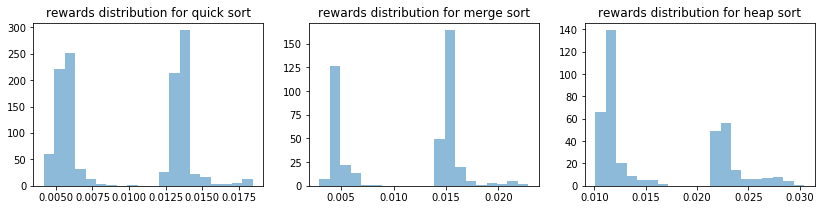

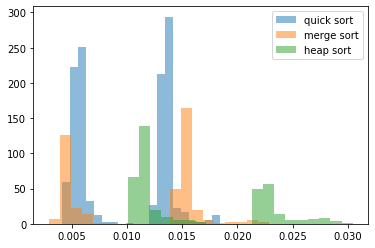

In [141]:
plot_rewards_distribution(arm_rewards_2)
plot_rewards_distribution_together(arm_rewards_2)

Iteration 372
Average rewards per algo {'quick_sort': 0.01349800654545933, 'merge_sort': 0.015532113978488563, 'heap_sort': 0.022087720000126865}
Count per chosen algo {'quick_sort': 275, 'merge_sort': 93, 'heap_sort': 5}


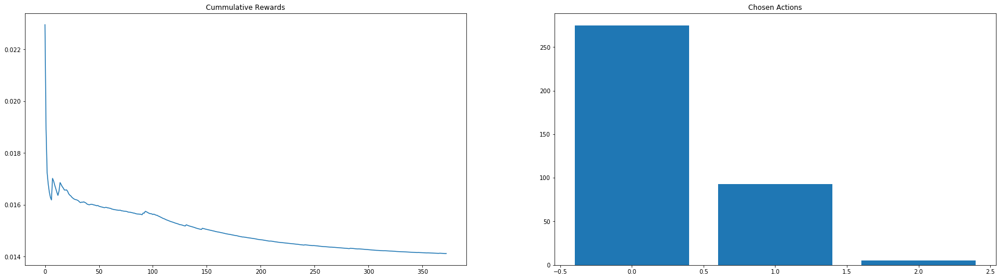

Iteration 483
Average rewards per algo {'quick_sort': 0.01354083087072302, 'merge_sort': 0.01551582499999313, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 104, 'merge_sort': 7, 'heap_sort': 0}


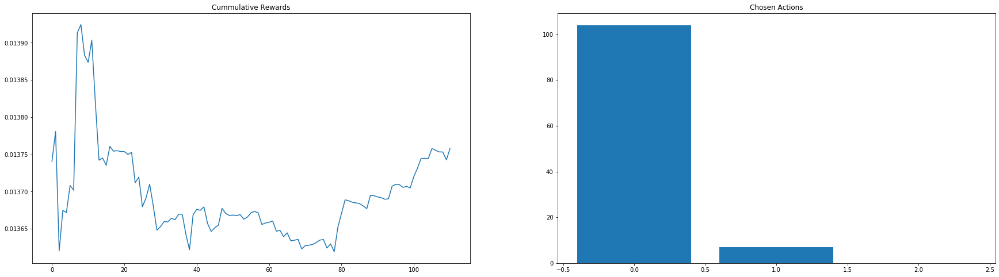

Iteration 501
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.015291018803408305, 'heap_sort': 0.021995566666798066}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 17, 'heap_sort': 1}


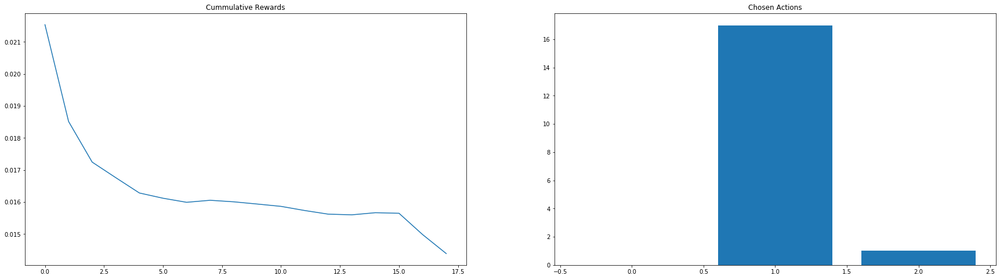

Iteration 556
Average rewards per algo {'quick_sort': 0.01351969894737857, 'merge_sort': 0.011900927647058565, 'heap_sort': 0.02047244285722627}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 53, 'heap_sort': 1}


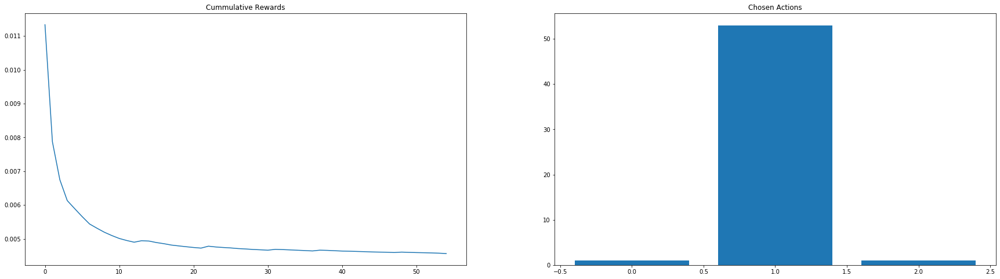

Iteration 570
Average rewards per algo {'quick_sort': 0.013265294642865553, 'merge_sort': 0.011861749707602738, 'heap_sort': 0.019336625000050844}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 1, 'heap_sort': 1}


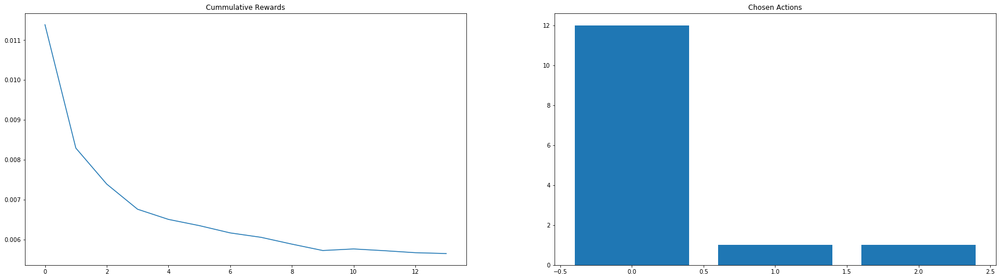

Iteration 593
Average rewards per algo {'quick_sort': 0.012844252898556053, 'merge_sort': 0.0, 'heap_sort': 0.018461377777839516}
Count per chosen algo {'quick_sort': 22, 'merge_sort': 0, 'heap_sort': 1}


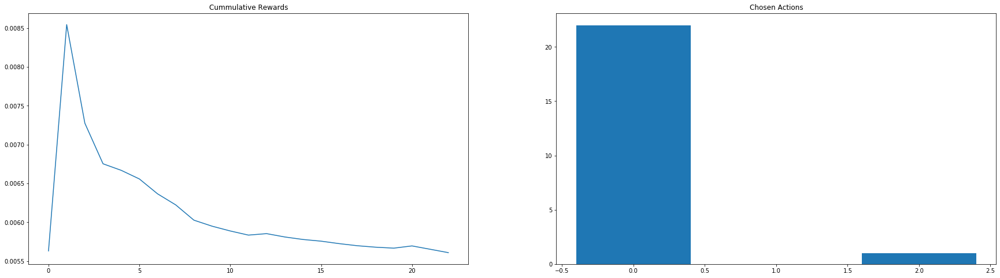

Iteration 647
Average rewards per algo {'quick_sort': 0.011983224197008532, 'merge_sort': 0.01181750697674562, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 53, 'merge_sort': 1, 'heap_sort': 0}


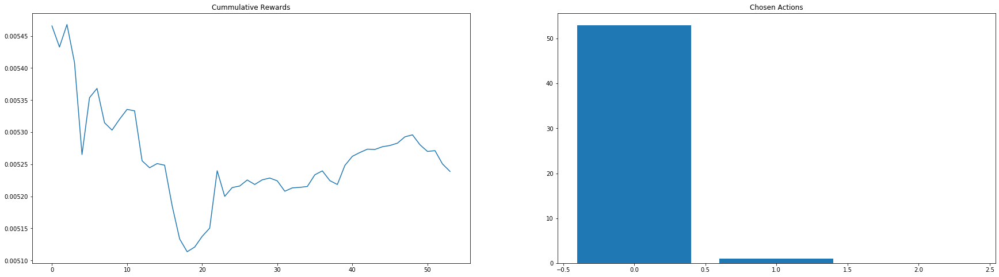

Iteration 752
Average rewards per algo {'quick_sort': 0.010998000000007991, 'merge_sort': 0.010895545918371533, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 81, 'merge_sort': 24, 'heap_sort': 0}


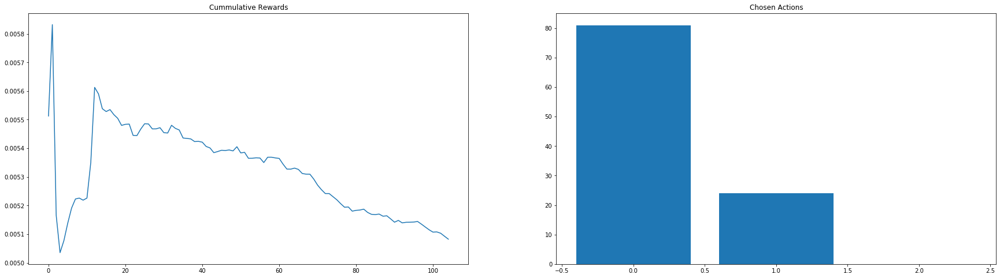

Iteration 767
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0, 'heap_sort': 0.013740216666671282}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 0, 'heap_sort': 15}


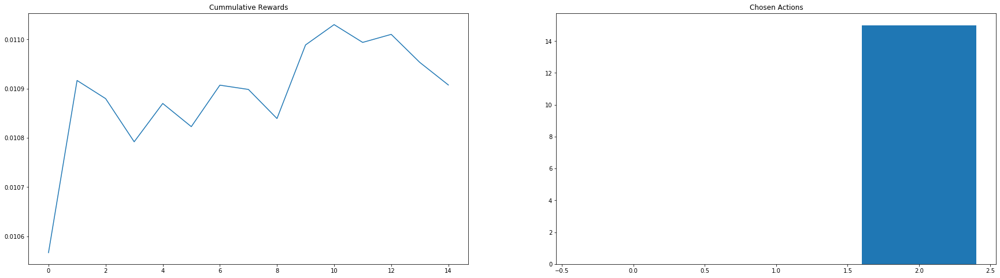

Iteration 819
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.01031018883721667, 'heap_sort': 0.012253771929807587}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 19, 'heap_sort': 33}


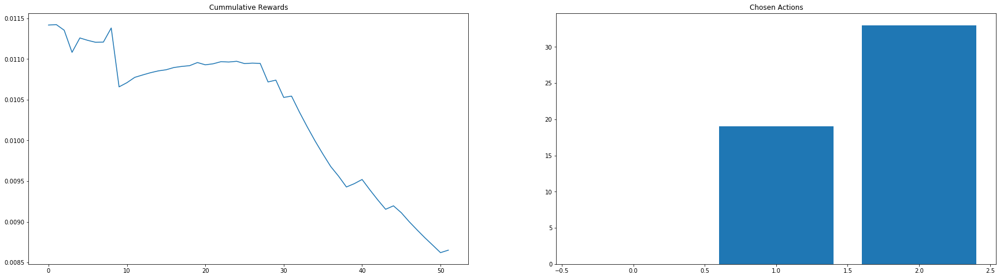

Iteration 897
Average rewards per algo {'quick_sort': 0.01098812094718487, 'merge_sort': 0.0092351424354364, 'heap_sort': 0.012324070512809508}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 56, 'heap_sort': 21}


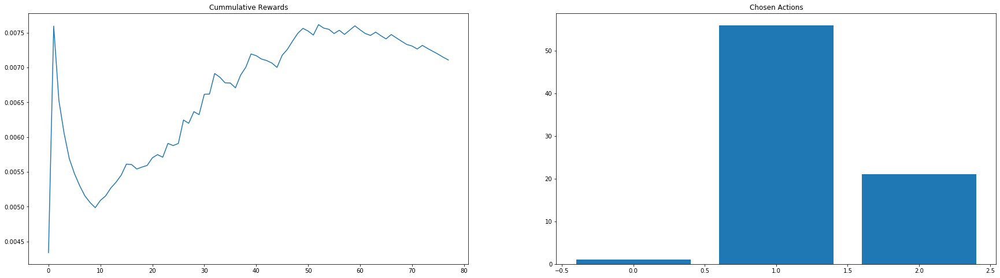

Iteration 1001
Average rewards per algo {'quick_sort': 0.010981686181826676, 'merge_sort': 0.0, 'heap_sort': 0.011898354696125187}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 0, 'heap_sort': 103}


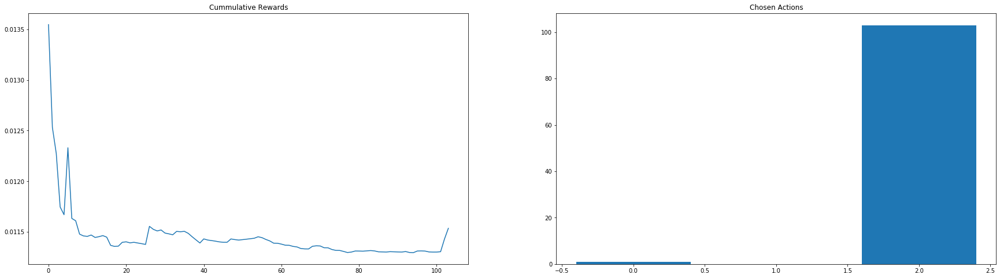

Iteration 1353
Average rewards per algo {'quick_sort': 0.01166625006784895, 'merge_sort': 0.01079468648650446, 'heap_sort': 0.014701219838049952}
Count per chosen algo {'quick_sort': 187, 'merge_sort': 99, 'heap_sort': 66}


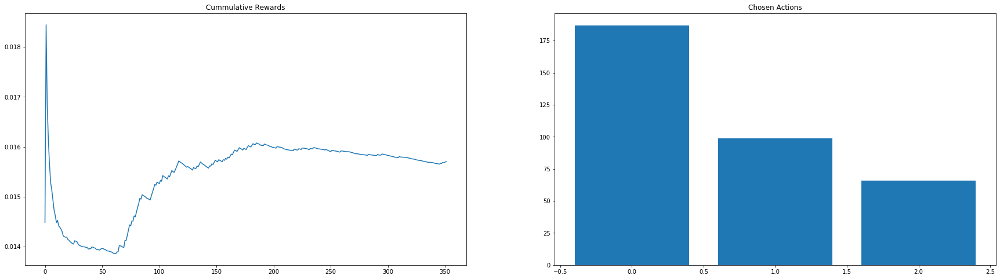

Iteration 1373
Average rewards per algo {'quick_sort': 0.011725989452610913, 'merge_sort': 0.0, 'heap_sort': 0.014980905490187534}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 0, 'heap_sort': 8}


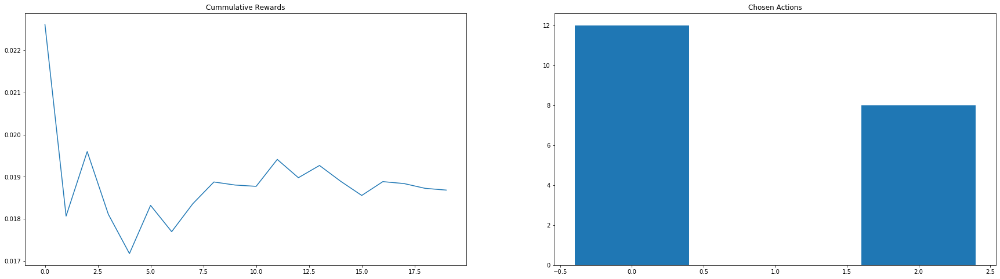

Iteration 1386
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0, 'heap_sort': 0.015477745522377464}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 0, 'heap_sort': 13}


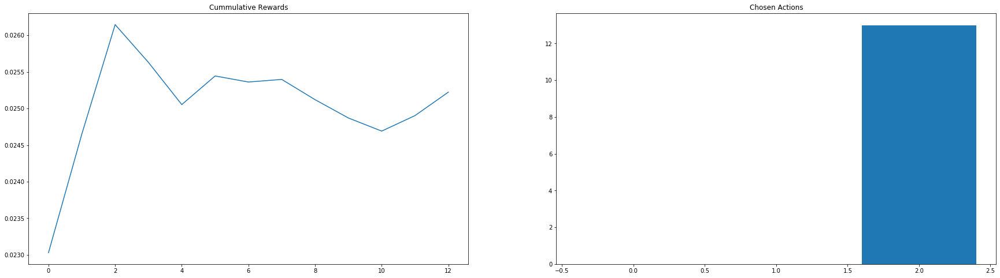

Iteration 1436
Average rewards per algo {'quick_sort': 0.011818685117502092, 'merge_sort': 0.01108055421996595, 'heap_sort': 0.0159098853571306}
Count per chosen algo {'quick_sort': 17, 'merge_sort': 21, 'heap_sort': 12}


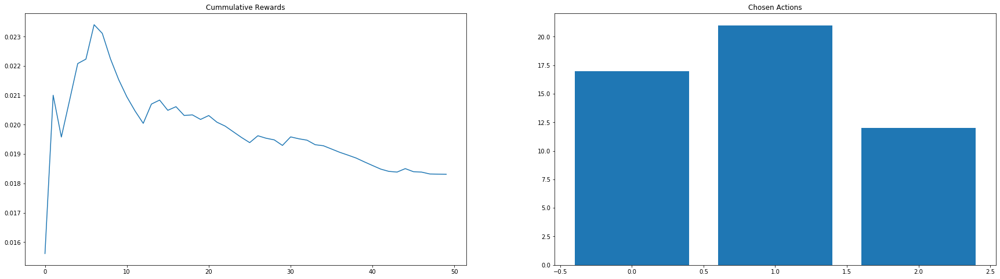

Iteration 1453
Average rewards per algo {'quick_sort': 0.011822601564545324, 'merge_sort': 0.011333196798045831, 'heap_sort': 0.015934081850522152}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 15, 'heap_sort': 1}


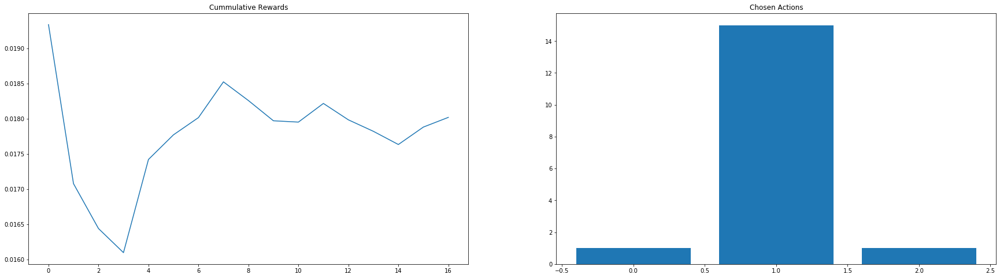

Iteration 1481
Average rewards per algo {'quick_sort': 0.011830808072924507, 'merge_sort': 0.0, 'heap_sort': 0.01669865551947588}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 0, 'heap_sort': 27}


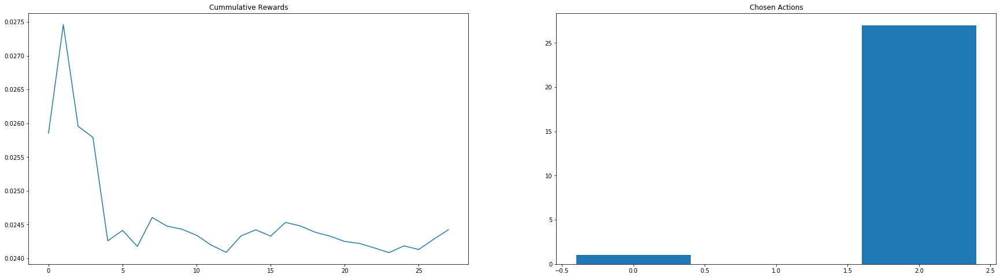

Iteration 1808
Average rewards per algo {'quick_sort': 0.010315260408563886, 'merge_sort': 0.011347183538099352, 'heap_sort': 0.01638600588235192}
Count per chosen algo {'quick_sort': 260, 'merge_sort': 1, 'heap_sort': 66}


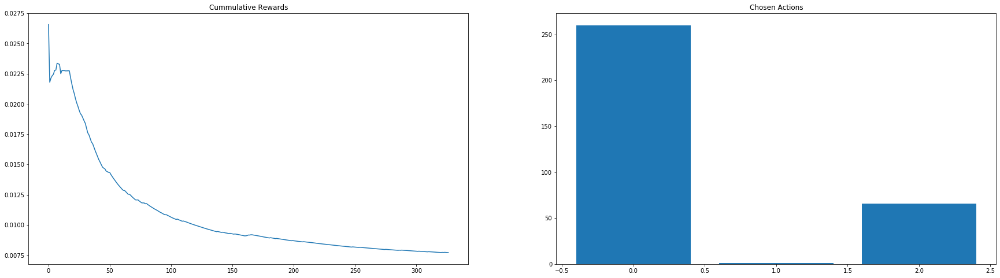

Iteration 1823
Average rewards per algo {'quick_sort': 0.010310141885329128, 'merge_sort': 0.011104536104529073, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 14, 'heap_sort': 0}


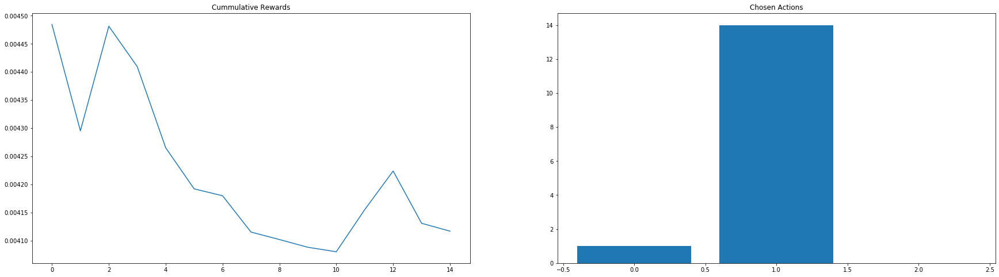

Iteration 1919
Average rewards per algo {'quick_sort': 0.009974347164722812, 'merge_sort': 0.0, 'heap_sort': 0.016211049226804677}
Count per chosen algo {'quick_sort': 82, 'merge_sort': 0, 'heap_sort': 14}


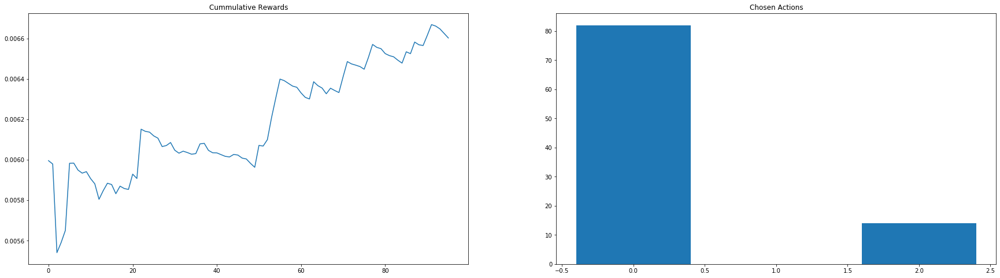

Iteration 1999
Average rewards per algo {'quick_sort': 0.009713993310758364, 'merge_sort': 0.011088376777267138, 'heap_sort': 0.016119244332498128}
Count per chosen algo {'quick_sort': 70, 'merge_sort': 1, 'heap_sort': 9}


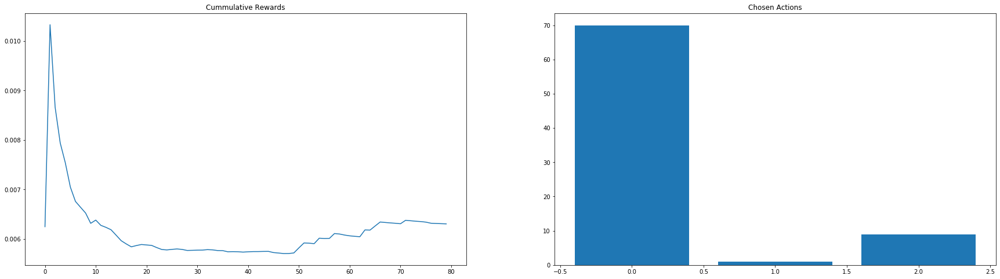

Total reward 22.5509


In [125]:
for elem in list_iteration_results_2:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_2,4))

## Three outliers in a row restart the expriment

In [126]:
list_iteration_results_3, total_reward_3, arm_rewards_3 = ts_quantile(list_distributions, n_samples, num_consec_elem=3)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.6859678943616223
Less than two values for merge_sort
merge_sort Theta 0.1784448119508879
Less than two values for heap_sort
heap_sort Theta 0.7829779277782062


Chosen algorithm is:  merge_sort with reward: 0.01675829999976486
Sample mean is:  0.01675829999976486 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.22494968070111254
Less than two values for merge_sort
merge_sort Theta 0.24228402287587059
Less than two values for heap_sort
heap_sort Theta 0.37451258116523


Chosen algorithm is:  quick_sort with reward: 0.013292699999965407
Sample mean is:  0.013292699999965407 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.3872314952397512
Less than two values for merge_sort
merge_sort Theta 0.39714783090899697
Less than two values for heap_sort
heap_sort Theta 0.7892097572895305


Chosen algorithm is:  quick_sort with reward: 0.01



Iteration: 27
quick_sort Theta 0.016062977566507382
Less than two values for merge_sort
merge_sort Theta 0.6340017979075788
Less than two values for heap_sort
heap_sort Theta 0.35373513337451834


Chosen algorithm is:  quick_sort with reward: 0.013911300000017945
Sample mean is:  0.014555511111110617 Sample variance is: 2.281266813581619e-06


Iteration: 28
quick_sort Theta 0.014332165037508235
Less than two values for merge_sort
merge_sort Theta 0.127899657954458
Less than two values for heap_sort
heap_sort Theta 0.44637211684226563


Chosen algorithm is:  quick_sort with reward: 0.013285700000324141
Sample mean is:  0.014510160714296814 Sample variance is: 2.2553227780724193e-06


Iteration: 29
quick_sort Theta 0.0155725601788745
Less than two values for merge_sort
merge_sort Theta 0.12983746564119336
Less than two values for heap_sort
heap_sort Theta 0.2723476686557972


Chosen algorithm is:  quick_sort with reward: 0.01333180000028733
Sample mean is:  0.014469527586227523 Sample 



Iteration: 55
quick_sort Theta 0.01610991319749573
Less than two values for merge_sort
merge_sort Theta 0.2897300650037603
Less than two values for heap_sort
heap_sort Theta 0.7690196498438716


Chosen algorithm is:  quick_sort with reward: 0.014922999999726017
Sample mean is:  0.014374770370346191 Sample variance is: 1.6624168587787425e-06


Iteration: 56
quick_sort Theta 0.01428750734833299
Less than two values for merge_sort
merge_sort Theta 0.16455724159675222
Less than two values for heap_sort
heap_sort Theta 0.20734289795520078


Chosen algorithm is:  quick_sort with reward: 0.013796299999739858
Sample mean is:  0.014364252727244259 Sample variance is: 1.6381646217966984e-06


Iteration: 57
quick_sort Theta 0.014164062962617976
Less than two values for merge_sort
merge_sort Theta 0.7187056957803344
Less than two values for heap_sort
heap_sort Theta 0.6912904233923384


Chosen algorithm is:  quick_sort with reward: 0.013458800000080373
Sample mean is:  0.014348083928544903 Sampl


Chosen algorithm is:  quick_sort with reward: 0.013540499999635358
Sample mean is:  0.014193980769219613 Sample variance is: 1.3239407908091834e-06


Iteration: 81
quick_sort Theta 0.013537123801697346
Less than two values for merge_sort
merge_sort Theta 0.375877130954996
heap_sort Theta 0.022142807135233717


Chosen algorithm is:  quick_sort with reward: 0.01437610000039058
Sample mean is:  0.014196286075943296 Sample variance is: 1.3075965728707658e-06


Iteration: 82
quick_sort Theta 0.013275588181717327
Less than two values for merge_sort
merge_sort Theta 0.7240023519717315
heap_sort Theta 0.02214870666222708


Chosen algorithm is:  quick_sort with reward: 0.014004600000134815
Sample mean is:  0.01419388999999569 Sample variance is: 1.2917051689256702e-06


Iteration: 83
quick_sort Theta 0.014965987275764132
Less than two values for merge_sort
merge_sort Theta 0.48960837230734733
heap_sort Theta 0.022154346495791656


Chosen algorithm is:  quick_sort with reward: 0.013535000000047



Iteration: 112
quick_sort Theta 0.013565016112271752
Less than two values for merge_sort
merge_sort Theta 0.5255988797845605
heap_sort Theta 0.02213446229219436


Chosen algorithm is:  quick_sort with reward: 0.015422899999975925
Sample mean is:  0.014121357272733804 Sample variance is: 1.1109439942937169e-06


Iteration: 113
quick_sort Theta 0.014175994455938729
Less than two values for merge_sort
merge_sort Theta 0.23829510125538544
heap_sort Theta 0.02214397505861354


Chosen algorithm is:  quick_sort with reward: 0.014057600000342063
Sample mean is:  0.014120782882892436 Sample variance is: 1.1009717814465055e-06


Iteration: 114
quick_sort Theta 0.013347553532717051
Less than two values for merge_sort
merge_sort Theta 0.5769603319483463
heap_sort Theta 0.02181974166072279


Chosen algorithm is:  quick_sort with reward: 0.013801000000057684
Sample mean is:  0.014117927678581412 Sample variance is: 1.0920465695290228e-06


Iteration: 115
quick_sort Theta 0.01382370934514515
Less t



Chosen algorithm is:  merge_sort with reward: 0.020239700000274752
Sample mean is:  0.01584269999996953 Sample variance is: 3.0018903425359808e-06


Iteration: 144
quick_sort Theta 0.01318859820426344
merge_sort Theta 0.013683690744333012
heap_sort Theta 0.022232979410575206


Chosen algorithm is:  quick_sort with reward: 0.013743699999849923
Sample mean is:  0.014022002985077268 Sample variance is: 9.790778958411232e-07


Iteration: 145
quick_sort Theta 0.013609449191329127
merge_sort Theta 0.018484210019241307
heap_sort Theta 0.022149650604637507


Chosen algorithm is:  quick_sort with reward: 0.013155000000097061
Sample mean is:  0.014015580740744082 Sample variance is: 9.773523267679108e-07


Iteration: 146
quick_sort Theta 0.014009826884423317
merge_sort Theta 0.0134665597270722
heap_sort Theta 0.02211409619775337


Chosen algorithm is:  merge_sort with reward: 0.014975000000049477
Sample mean is:  0.015755929999977526 Sample variance is: 2.7694626043698965e-06


Iteration: 147


Sample mean is:  0.01393994522292994 Sample variance is: 9.049713325702477e-07


Iteration: 175
quick_sort Theta 0.013568023964900443
merge_sort Theta 0.015815035566116045
heap_sort Theta 0.022176826712438834


Chosen algorithm is:  quick_sort with reward: 0.013826800000060757
Sample mean is:  0.01393922911392444 Sample variance is: 8.993241774093289e-07


Iteration: 176
quick_sort Theta 0.01354333641420784
merge_sort Theta 0.015633263388614146
heap_sort Theta 0.021971960267829726


Chosen algorithm is:  quick_sort with reward: 0.013724399999773595
Sample mean is:  0.013937877987420346 Sample variance is: 8.939564862745337e-07


Iteration: 177
quick_sort Theta 0.013742872560489467
merge_sort Theta 0.018750791666835073
heap_sort Theta 0.022032396125020462


Chosen algorithm is:  quick_sort with reward: 0.013442599999962113
Sample mean is:  0.013934782499998733 Sample variance is: 8.898928029733196e-07


Iteration: 178
quick_sort Theta 0.014060323556159545
merge_sort Theta 0.014696753681



Iteration: 207
quick_sort Theta 0.014118742929885658
merge_sort Theta 0.010857897667326255
heap_sort Theta 0.022095100471237566


Chosen algorithm is:  merge_sort with reward: 0.01611590000038632
Sample mean is:  0.01549191500005236 Sample variance is: 1.6739888243646054e-06


Iteration: 208
quick_sort Theta 0.01382595238483219
merge_sort Theta 0.015714852892918123
heap_sort Theta 0.022104480729003558


Chosen algorithm is:  quick_sort with reward: 0.013489700000263838
Sample mean is:  0.013873820855610695 Sample variance is: 8.315311516251903e-07


Iteration: 209
quick_sort Theta 0.013603104490347418
merge_sort Theta 0.017277745975653326
heap_sort Theta 0.02212410043304878


Chosen algorithm is:  quick_sort with reward: 0.013437399999929767
Sample mean is:  0.013871499468080478 Sample variance is: 8.281158266768698e-07


Iteration: 210
quick_sort Theta 0.013861133096123197
merge_sort Theta 0.017136958794706912
heap_sort Theta 0.022237585090631354


Chosen algorithm is:  quick_sort w

Chosen algorithm is:  quick_sort with reward: 0.0134382999999616
Sample mean is:  0.013825407547170591 Sample variance is: 7.550485017549818e-07


Iteration: 239
quick_sort Theta 0.013532865471598238
merge_sort Theta 0.017174722918272496
heap_sort Theta 0.02212108088057224


Chosen algorithm is:  quick_sort with reward: 0.014169999999921856
Sample mean is:  0.013827025352113085 Sample variance is: 7.520585391886201e-07


Iteration: 240
quick_sort Theta 0.014037923750826301
merge_sort Theta 0.014568305594117615
heap_sort Theta 0.02183722245717599


Chosen algorithm is:  quick_sort with reward: 0.01384649999999965
Sample mean is:  0.013827116355140593 Sample variance is: 7.485460109197872e-07


Iteration: 241
quick_sort Theta 0.014214786281592855
merge_sort Theta 0.016211324468574675
heap_sort Theta 0.022188263859449078


Chosen algorithm is:  quick_sort with reward: 0.013458099999752449
Sample mean is:  0.013825399999999252 Sample variance is: 7.456948188105097e-07


Iteration: 242
quic



Iteration: 272
quick_sort Theta 0.013537346253094098
merge_sort Theta 0.01561933895009782
heap_sort Theta 0.0221302471945641


Chosen algorithm is:  quick_sort with reward: 0.014176700000007258
Sample mean is:  0.013782644672135977 Sample variance is: 6.860654378138975e-07


Iteration: 273
quick_sort Theta 0.01428332644942502
merge_sort Theta 0.01542010568977826
heap_sort Theta 0.022175499555454045


Chosen algorithm is:  quick_sort with reward: 0.01361799999995128
Sample mean is:  0.013781972653065836 Sample variance is: 6.833753634706542e-07


Iteration: 274
quick_sort Theta 0.01383224295356873
merge_sort Theta 0.015468009029144098
heap_sort Theta 0.022094206081771754


Chosen algorithm is:  quick_sort with reward: 0.013595599999916885
Sample mean is:  0.013781215040654661 Sample variance is: 6.807380390972233e-07


Iteration: 275
quick_sort Theta 0.014039509115673785
merge_sort Theta 0.01405282730712505
heap_sort Theta 0.022166232796287273


Chosen algorithm is:  quick_sort with r

Sample mean is:  0.013837935925931999 Sample variance is: 9.93797434774765e-07


Iteration: 302
quick_sort Theta 0.014430218400046763
merge_sort Theta 0.014845228032131307
heap_sort Theta 0.022163022212800275


Chosen algorithm is:  quick_sort with reward: 0.013395699999819044
Sample mean is:  0.013836304059045974 Sample variance is: 9.908492927430548e-07


Iteration: 303
quick_sort Theta 0.013814938714557695
merge_sort Theta 0.014092104361156092
heap_sort Theta 0.022158102098061235


Chosen algorithm is:  quick_sort with reward: 0.017618100000163395
Sample mean is:  0.013850207720594199 Sample variance is: 1.0395939634662145e-06


Iteration: 304
quick_sort Theta 0.013925264909926117
merge_sort Theta 0.012558859639069626
heap_sort Theta 0.022145371057965314


Chosen algorithm is:  merge_sort with reward: 0.018490599999950064
Sample mean is:  0.015549133333358138 Sample variance is: 1.431652694937617e-06


Iteration: 305
quick_sort Theta 0.013920655806943827
merge_sort Theta 0.017252625


Chosen algorithm is:  quick_sort with reward: 0.01414020000038363
Sample mean is:  0.013959631333336801 Sample variance is: 1.4515423041963786e-06


Iteration: 336
quick_sort Theta 0.013902141634801043
merge_sort Theta 0.014418087180523965
heap_sort Theta 0.022134584166736828


Chosen algorithm is:  quick_sort with reward: 0.014983200000187935
Sample mean is:  0.013963031893691788 Sample variance is: 1.4501890477330364e-06


Iteration: 337
quick_sort Theta 0.013338629863676552
merge_sort Theta 0.014724091494889891
heap_sort Theta 0.02217067441489184


Chosen algorithm is:  quick_sort with reward: 0.014201399999819841
Sample mean is:  0.013963821192056452 Sample variance is: 1.4455746178083e-06


Iteration: 338
quick_sort Theta 0.014542483266572656
merge_sort Theta 0.015906405963593908
heap_sort Theta 0.022744477973726897


Chosen algorithm is:  quick_sort with reward: 0.01361799999995128
Sample mean is:  0.013962679867990097 Sample variance is: 1.44119713591078e-06


Iteration: 339
qu



Iteration: 367
quick_sort Theta 0.01422223266740848
merge_sort Theta 0.016842836661789436
heap_sort Theta 0.022154542055108018


Chosen algorithm is:  quick_sort with reward: 0.014300700000148936
Sample mean is:  0.01392431671733087 Sample variance is: 1.3603696455081906e-06


Iteration: 368
quick_sort Theta 0.014296980154486865
merge_sort Theta 0.01502236271567068
heap_sort Theta 0.022168979117910183


Chosen algorithm is:  quick_sort with reward: 0.013631399999667337
Sample mean is:  0.013923429090913708 Sample variance is: 1.3565065259850452e-06


Iteration: 369
quick_sort Theta 0.014190378104843897
merge_sort Theta 0.01454579755507847
heap_sort Theta 0.02214064775726995


Chosen algorithm is:  quick_sort with reward: 0.013459400000101596
Sample mean is:  0.013922027190337236 Sample variance is: 1.3530568762825825e-06


Iteration: 370
quick_sort Theta 0.014052017709527402
merge_sort Theta 0.017976304196005946
heap_sort Theta 0.021999697337883737


Chosen algorithm is:  quick_sort 



Iteration: 399
quick_sort Theta 0.013624800848195508
merge_sort Theta 0.013994147739107411
heap_sort Theta 0.022078224895004987


Chosen algorithm is:  quick_sort with reward: 0.013850800000000163
Sample mean is:  0.01388335555556321 Sample variance is: 1.273151095895866e-06


Iteration: 400
quick_sort Theta 0.01381627634013653
merge_sort Theta 0.017034942497774246
heap_sort Theta 0.022147172195261546


Chosen algorithm is:  quick_sort with reward: 0.013989500000207045
Sample mean is:  0.013883649584495741 Sample variance is: 1.2696554846429437e-06


Iteration: 401
quick_sort Theta 0.014007126950366634
merge_sort Theta 0.015062016476674843
heap_sort Theta 0.022141924083556697


Chosen algorithm is:  quick_sort with reward: 0.01364140000032421
Sample mean is:  0.013882980386749412 Sample variance is: 1.2663098141001609e-06


Iteration: 402
quick_sort Theta 0.014054795653106165
merge_sort Theta 0.014876224670647642
heap_sort Theta 0.022138924348182938


Chosen algorithm is:  quick_sort



Chosen algorithm is:  quick_sort with reward: 0.015540000000328291
Sample mean is:  0.013885071168838354 Sample variance is: 1.2214365325342246e-06


Iteration: 430
quick_sort Theta 0.013685645034462289
merge_sort Theta 0.015304350195922065
heap_sort Theta 0.02211983803980545


Chosen algorithm is:  quick_sort with reward: 0.01398139999992054
Sample mean is:  0.013885320725395561 Sample variance is: 1.2182961663986598e-06


Iteration: 431
quick_sort Theta 0.014010067756925208
merge_sort Theta 0.016303124534114748
heap_sort Theta 0.022109571052642902


Chosen algorithm is:  quick_sort with reward: 0.013448199999857025
Sample mean is:  0.013884191214476857 Sample variance is: 1.2156405711264747e-06


Iteration: 432
quick_sort Theta 0.014043449180200724
merge_sort Theta 0.013997828555167038
heap_sort Theta 0.022077757432061435


Chosen algorithm is:  merge_sort with reward: 0.014439699999911682
Sample mean is:  0.015359327906998958 Sample variance is: 1.1538267518408767e-06


Iteration:

Sample mean is:  0.013867248786415048 Sample variance is: 1.1537614081182774e-06


Iteration: 461
quick_sort Theta 0.013810487898090713
merge_sort Theta 0.014880911278439594
heap_sort Theta 0.0220204057709909


Chosen algorithm is:  quick_sort with reward: 0.014419399999951565
Sample mean is:  0.013868585714292862 Sample variance is: 1.1517041959346005e-06


Iteration: 462
quick_sort Theta 0.013406179296893311
merge_sort Theta 0.015836266686012776
heap_sort Theta 0.022142569197226552


Chosen algorithm is:  quick_sort with reward: 0.01389130000006844
Sample mean is:  0.01386864057971744 Sample variance is: 1.14892354496024e-06


Iteration: 463
quick_sort Theta 0.013808704720965728
merge_sort Theta 0.014866882874015396
heap_sort Theta 0.02205764925234516


Chosen algorithm is:  quick_sort with reward: 0.013481399999818677
Sample mean is:  0.013867707469886359 Sample variance is: 1.1465155217885966e-06


Iteration: 464
quick_sort Theta 0.014109644018507325
merge_sort Theta 0.013655496067



Iteration: 493
quick_sort Theta 0.014199434979360997
merge_sort Theta 0.014851458989749764
heap_sort Theta 0.02214419870494824


Chosen algorithm is:  quick_sort with reward: 0.014752900000075897
Sample mean is:  0.013852652821675563 Sample variance is: 1.0952826124135079e-06


Iteration: 494
quick_sort Theta 0.01433746507267368
merge_sort Theta 0.014747686692304205
heap_sort Theta 0.02208399037304391


Chosen algorithm is:  quick_sort with reward: 0.013868999999886
Sample mean is:  0.013852689639644505 Sample variance is: 1.0928163601971838e-06


Iteration: 495
quick_sort Theta 0.014037938761875292
merge_sort Theta 0.01578228997277727
heap_sort Theta 0.022124690182007727


Chosen algorithm is:  quick_sort with reward: 0.013614700000289304
Sample mean is:  0.013852154831466179 Sample variance is: 1.0904875858813134e-06


Iteration: 496
quick_sort Theta 0.013913816921766438
merge_sort Theta 0.014901150799209695
heap_sort Theta 0.022045701328701314


Chosen algorithm is:  quick_sort wi



Iteration: 525
Less than two values for quick_sort
quick_sort Theta 0.002980691094508714
merge_sort Theta 0.003761868981158798
Less than two values for heap_sort
heap_sort Theta 0.8212861741566121


Chosen algorithm is:  quick_sort with reward: 0.005470199999763281
Sample mean is:  0.01375326291391175 Sample variance is: 1.9019849606886459e-06


Iteration: 526
quick_sort Theta 4.885891865771819e-06
merge_sort Theta 0.007308104958695629
Less than two values for heap_sort
heap_sort Theta 0.8678508163804073


Chosen algorithm is:  quick_sort with reward: 0.005393299999923329
Sample mean is:  0.0137348488986827 Sample variance is: 2.051396974957722e-06


Iteration: 527
quick_sort Theta 0.021323865547657674
merge_sort Theta 0.008270523425264508
Less than two values for heap_sort
heap_sort Theta 0.8703423638191998


Chosen algorithm is:  merge_sort with reward: 0.004114299999855575
Sample mean is:  0.012034218571436993 Sample variance is: 2.585106014348142e-05


Iteration: 528
quick_sort T



Chosen algorithm is:  merge_sort with reward: 0.005670300000019779
Sample mean is:  0.010837320481926557 Sample variance is: 2.954093586317516e-05


Iteration: 551
Less than two values for quick_sort
quick_sort Theta 0.29533614273560893
merge_sort Theta 0.001595361409781065
Less than two values for heap_sort
heap_sort Theta 0.6497338298093428


Chosen algorithm is:  merge_sort with reward: 0.004572099999677448
Sample mean is:  0.010762734523804543 Sample variance is: 2.9650992462645445e-05


Iteration: 552
Less than two values for quick_sort
quick_sort Theta 0.509390837440826
merge_sort Theta 0.0030054880344371855
Less than two values for heap_sort
heap_sort Theta 0.8675873215315343


Chosen algorithm is:  merge_sort with reward: 0.004152199999680306
Sample mean is:  0.010684963529403083 Sample variance is: 2.98102167730987e-05


Iteration: 553
Less than two values for quick_sort
quick_sort Theta 0.2161732106188181
merge_sort Theta -0.0066794688479440215
Less than two values for heap

Sample mean is:  0.009335044444427424 Sample variance is: 3.0226161172157477e-05


Iteration: 576
Less than two values for quick_sort
quick_sort Theta 0.5873710787981415
merge_sort Theta 0.0047356966180222785
Less than two values for heap_sort
heap_sort Theta 0.10092448380146413


Chosen algorithm is:  merge_sort with reward: 0.004287499999918509
Sample mean is:  0.009288736697230095 Sample variance is: 3.0180452945873366e-05


Iteration: 577
Less than two values for quick_sort
quick_sort Theta 0.4217022533189043
merge_sort Theta 0.013372500596161815
Less than two values for heap_sort
heap_sort Theta 0.30850099790807084


Chosen algorithm is:  merge_sort with reward: 0.003601399999752175
Sample mean is:  0.009237033636343933 Sample variance is: 3.019746470086478e-05


Iteration: 578
Less than two values for quick_sort
quick_sort Theta 0.8833483733671854
merge_sort Theta 0.005374253712486952
Less than two values for heap_sort
heap_sort Theta 0.035482728406841635


Chosen algorithm is:  



Chosen algorithm is:  merge_sort with reward: 0.005441799999971408
Sample mean is:  0.008375006716403786 Sample variance is: 2.821938059543866e-05


Iteration: 602
Less than two values for quick_sort
quick_sort Theta 0.950396435551618
merge_sort Theta 0.007183845483949878
Less than two values for heap_sort
heap_sort Theta 0.3868579555291287


Chosen algorithm is:  merge_sort with reward: 0.004329800000050454
Sample mean is:  0.008345042222208577 Sample variance is: 2.813066284884178e-05


Iteration: 603
Less than two values for quick_sort
quick_sort Theta 0.446455600280112
merge_sort Theta 0.01491769123340831
Less than two values for heap_sort
heap_sort Theta 0.05780081527671521


Chosen algorithm is:  merge_sort with reward: 0.004014100000404142
Sample mean is:  0.008313197058812956 Sample variance is: 2.8060725187937782e-05


Iteration: 604
Less than two values for quick_sort
quick_sort Theta 0.12276339555365079
merge_sort Theta 0.0038909584965220786
Less than two values for heap_s



Chosen algorithm is:  merge_sort with reward: 0.005447700000331679
Sample mean is:  0.007742782389928869 Sample variance is: 2.5956539107482783e-05


Iteration: 627
Less than two values for quick_sort
quick_sort Theta 0.3373569747201268
merge_sort Theta 0.009987439416148162
Less than two values for heap_sort
heap_sort Theta 0.9903801176558423


Chosen algorithm is:  merge_sort with reward: 0.003614300000208459
Sample mean is:  0.007716979374993116 Sample variance is: 2.590017223524519e-05


Iteration: 628
Less than two values for quick_sort
quick_sort Theta 0.7813442532170267
merge_sort Theta 0.012638556917951172
Less than two values for heap_sort
heap_sort Theta 0.7809075877012571


Chosen algorithm is:  merge_sort with reward: 0.004431800000020303
Sample mean is:  0.007696574534154775 Sample variance is: 2.580591880498575e-05


Iteration: 629
Less than two values for quick_sort
quick_sort Theta 0.9179671527453277
merge_sort Theta 0.005438449697814244
Less than two values for heap_s

Chosen algorithm is:  merge_sort with reward: 0.0044289999996180995
Sample mean is:  0.007298130601084963 Sample variance is: 2.3895647620918492e-05


Iteration: 651
Less than two values for quick_sort
quick_sort Theta 0.585801265936136
merge_sort Theta 0.007053974850095296
Less than two values for heap_sort
heap_sort Theta 0.08615149573117231


Chosen algorithm is:  merge_sort with reward: 0.004266200000074605
Sample mean is:  0.0072816527173838195 Sample variance is: 2.3815468249986923e-05


Iteration: 652
Less than two values for quick_sort
quick_sort Theta 0.9014020139329008
merge_sort Theta 0.0051904294946351175
Less than two values for heap_sort
heap_sort Theta 0.2550194778480813


Chosen algorithm is:  merge_sort with reward: 0.004651699999612902
Sample mean is:  0.00726743675674722 Sample variance is: 2.372392119995131e-05


Iteration: 653
Less than two values for quick_sort
quick_sort Theta 0.12824891970395835
merge_sort Theta 0.0048880445514456125
Less than two values for hea



Chosen algorithm is:  merge_sort with reward: 0.005452600000353414
Sample mean is:  0.006978399033809895 Sample variance is: 2.1923290340861186e-05


Iteration: 675
Less than two values for quick_sort
quick_sort Theta 0.5564247050055776
merge_sort Theta 0.006878771566580992
Less than two values for heap_sort
heap_sort Theta 0.7088991535721976


Chosen algorithm is:  merge_sort with reward: 0.004685599999902479
Sample mean is:  0.006967375961531493 Sample variance is: 2.184304208787828e-05


Iteration: 676
Less than two values for quick_sort
quick_sort Theta 0.3651789577066401
merge_sort Theta 0.009208359748209957
Less than two values for heap_sort
heap_sort Theta 0.13887061623185126


Chosen algorithm is:  merge_sort with reward: 0.0044615000001613225
Sample mean is:  0.006955386124395751 Sample variance is: 2.1768431213243046e-05


Iteration: 677
Less than two values for quick_sort
quick_sort Theta 0.6113483706059797
merge_sort Theta 0.009668389274762506
Less than two values for hea



Chosen algorithm is:  merge_sort with reward: 0.005502900000010413
Sample mean is:  0.006704987499994064 Sample variance is: 2.019173829660472e-05


Iteration: 700
Less than two values for quick_sort
quick_sort Theta 0.17761570495762546
merge_sort Theta 0.008617700240522792
Less than two values for heap_sort
heap_sort Theta 0.08555740805304157


Chosen algorithm is:  merge_sort with reward: 0.003907599999820377
Sample mean is:  0.006692981545057697 Sample variance is: 2.0138519640901956e-05


Iteration: 701
Less than two values for quick_sort
quick_sort Theta 0.19457639429859408
merge_sort Theta 0.006171322691741014
Less than two values for heap_sort
heap_sort Theta 0.9604881302140981


Chosen algorithm is:  merge_sort with reward: 0.004368200000044453
Sample mean is:  0.006683046581190119 Sample variance is: 2.007545550829719e-05


Iteration: 702
Less than two values for quick_sort
quick_sort Theta 0.3023577154437448
merge_sort Theta 0.008280862771223927
Less than two values for hea

Less than two values for heap_sort
heap_sort Theta 0.8821714023874033


Chosen algorithm is:  merge_sort with reward: 0.005129599999690981
Sample mean is:  0.006479326070033218 Sample variance is: 1.8711706672424043e-05


Iteration: 725
Less than two values for quick_sort
quick_sort Theta 0.8006133293268483
merge_sort Theta 0.008083007629913623
Less than two values for heap_sort
heap_sort Theta 0.2345980251731613


Chosen algorithm is:  merge_sort with reward: 0.004284399999960442
Sample mean is:  0.006470818604645339 Sample variance is: 1.865778155817246e-05


Iteration: 726
Less than two values for quick_sort
quick_sort Theta 0.045231594464118174
merge_sort Theta 0.00441615568953109
Less than two values for heap_sort
heap_sort Theta 0.8777650329200534


Chosen algorithm is:  merge_sort with reward: 0.004516800000146759
Sample mean is:  0.0064632741312688965 Sample variance is: 1.8600428913798777e-05


Iteration: 727
Less than two values for quick_sort
quick_sort Theta 0.0572685146751

Sample mean is:  0.00630573736654431 Sample variance is: 1.744761937926541e-05


Iteration: 749
Less than two values for quick_sort
quick_sort Theta 0.6380533668463703
merge_sort Theta 0.008053589573229493
Less than two values for heap_sort
heap_sort Theta 0.4833400714566334


Chosen algorithm is:  merge_sort with reward: 0.004384200000004057
Sample mean is:  0.0062989234042516145 Sample variance is: 1.739879524163628e-05


Iteration: 750
Less than two values for quick_sort
quick_sort Theta 0.8187475776256377
merge_sort Theta 0.006153534382782346
Less than two values for heap_sort
heap_sort Theta 0.6855726007203792


Chosen algorithm is:  merge_sort with reward: 0.004572400000142807
Sample mean is:  0.006292822614837802 Sample variance is: 1.7347811335868056e-05


Iteration: 751
Less than two values for quick_sort
quick_sort Theta 0.2701414611638865
merge_sort Theta 0.004911508704642227
Less than two values for heap_sort
heap_sort Theta 0.3103972990508592


Chosen algorithm is:  merge_



Chosen algorithm is:  merge_sort with reward: 0.005291599999964092
Sample mean is:  0.0061486094771181325 Sample variance is: 1.631912752836328e-05


Iteration: 774
Less than two values for quick_sort
quick_sort Theta 0.8961917080644864
merge_sort Theta 0.005305073374045303
Less than two values for heap_sort
heap_sort Theta 0.9632192452436007


Chosen algorithm is:  merge_sort with reward: 0.004064800000378455
Sample mean is:  0.006141821824099437 Sample variance is: 1.6280068864621596e-05


Iteration: 775
Less than two values for quick_sort
quick_sort Theta 0.25594020186101485
merge_sort Theta 0.007982517879098776
Less than two values for heap_sort
heap_sort Theta 0.7634129673340976


Chosen algorithm is:  merge_sort with reward: 0.0037148000001252512
Sample mean is:  0.006133941883112507 Sample variance is: 1.624627419345497e-05


Iteration: 776
Less than two values for quick_sort
quick_sort Theta 0.2345381793456076
merge_sort Theta 0.008253485595516986
Less than two values for hea

Less than two values for heap_sort
heap_sort Theta 0.037806786216440846


Chosen algorithm is:  merge_sort with reward: 0.005097600000226521
Sample mean is:  0.0060128633333258194 Sample variance is: 1.53769396080714e-05


Iteration: 799
Less than two values for quick_sort
quick_sort Theta 0.6073066799362974
merge_sort Theta 0.006551869408617162
Less than two values for heap_sort
heap_sort Theta 0.9157087606664709


Chosen algorithm is:  merge_sort with reward: 0.004387800000131392
Sample mean is:  0.006007953776427951 Sample variance is: 1.53384378343189e-05


Iteration: 800
Less than two values for quick_sort
quick_sort Theta 0.5395419915464834
merge_sort Theta 0.005414030134030592
Less than two values for heap_sort
heap_sort Theta 0.6018761729062493


Chosen algorithm is:  merge_sort with reward: 0.0038014000001567183
Sample mean is:  0.006001307530113881 Sample variance is: 1.530685884767238e-05


Iteration: 801
Less than two values for quick_sort
quick_sort Theta 0.764322096269606



Chosen algorithm is:  merge_sort with reward: 0.0054285999999592605
Sample mean is:  0.005904782485869853 Sample variance is: 1.4504612194144474e-05


Iteration: 823
Less than two values for quick_sort
quick_sort Theta 0.4641442774335224
merge_sort Theta 0.005208453198858726
Less than two values for heap_sort
heap_sort Theta 0.09725980421055058


Chosen algorithm is:  merge_sort with reward: 0.0047234000003300025
Sample mean is:  0.0059014546478824165 Sample variance is: 1.4467674506633155e-05


Iteration: 824
Less than two values for quick_sort
quick_sort Theta 0.29994538514922187
merge_sort Theta 0.004804784182843935
Less than two values for heap_sort
heap_sort Theta 0.9256804024118755


Chosen algorithm is:  merge_sort with reward: 0.0040235999999822525
Sample mean is:  0.005896179775275955 Sample variance is: 1.4436912591262267e-05


Iteration: 825
Less than two values for quick_sort
quick_sort Theta 0.5850196504844187
merge_sort Theta 0.005629510328046325
Less than two values fo

Sample mean is:  0.005805106084649172 Sample variance is: 1.3738960961466794e-05


Iteration: 847
Less than two values for quick_sort
quick_sort Theta 0.27597719047065983
merge_sort Theta 0.0039038585463511254
Less than two values for heap_sort
heap_sort Theta 0.4553958707949475


Chosen algorithm is:  merge_sort with reward: 0.003903000000264001
Sample mean is:  0.0058000873350861504 Sample variance is: 1.3712231411072887e-05


Iteration: 848
Less than two values for quick_sort
quick_sort Theta 0.5700113448139429
merge_sort Theta 0.005226160606865781
Less than two values for heap_sort
heap_sort Theta 0.47785882595472107


Chosen algorithm is:  merge_sort with reward: 0.004593099999965489
Sample mean is:  0.005796911052625307 Sample variance is: 1.3679970235502797e-05


Iteration: 849
Less than two values for quick_sort
quick_sort Theta 0.4265420820211564
merge_sort Theta 0.006266898926232644
Less than two values for heap_sort
heap_sort Theta 0.42435543561263545


Chosen algorithm is: 



Chosen algorithm is:  merge_sort with reward: 0.005218099999638071
Sample mean is:  0.005696445454535088 Sample variance is: 1.292248556518452e-05


Iteration: 880
quick_sort Theta 0.019179968340496758
merge_sort Theta 0.006580195422147695
Less than two values for heap_sort
heap_sort Theta 0.45141076483050524


Chosen algorithm is:  merge_sort with reward: 0.004124799999772222
Sample mean is:  0.005692593382342042 Sample variance is: 1.2896852059739757e-05


Iteration: 881
quick_sort Theta 0.008506317229389514
merge_sort Theta 0.00556601819496135
Less than two values for heap_sort
heap_sort Theta 0.22699380888677612


Chosen algorithm is:  merge_sort with reward: 0.00448690000030183
Sample mean is:  0.005689645476762482 Sample variance is: 1.2868864994217776e-05


Iteration: 882
quick_sort Theta 0.010800470842465285
merge_sort Theta 0.004709837272186469
Less than two values for heap_sort
heap_sort Theta 0.17871981005079707


Chosen algorithm is:  merge_sort with reward: 0.00415559999



Iteration: 913
quick_sort Theta 0.009833447941380125
merge_sort Theta 0.005628879950705348
Less than two values for heap_sort
heap_sort Theta 0.9814227996797074


Chosen algorithm is:  merge_sort with reward: 0.004327599999669474
Sample mean is:  0.0055785517006700334 Sample variance is: 1.2095107531840527e-05


Iteration: 914
quick_sort Theta 0.01487287624858044
merge_sort Theta 0.005364284025978784
Less than two values for heap_sort
heap_sort Theta 0.5194887126925233


Chosen algorithm is:  merge_sort with reward: 0.004054100000303151
Sample mean is:  0.005575102714922597 Sample variance is: 1.2072988951846688e-05


Iteration: 915
quick_sort Theta 0.02431849216946204
merge_sort Theta 0.005012611719703769
Less than two values for heap_sort
heap_sort Theta 0.7033498458522538


Chosen algorithm is:  merge_sort with reward: 0.004088099999989936
Sample mean is:  0.005571746049651868 Sample variance is: 1.205071625828461e-05


Iteration: 916
quick_sort Theta 0.012094366293833274
merge_so



Iteration: 947
quick_sort Theta 0.010001585167329973
merge_sort Theta 0.0038038094836144593
Less than two values for heap_sort
heap_sort Theta 0.2299332090913513


Chosen algorithm is:  merge_sort with reward: 0.004185499999948661
Sample mean is:  0.005487035517960949 Sample variance is: 1.1401051530025704e-05


Iteration: 948
quick_sort Theta 0.016801974256138875
merge_sort Theta 0.004641330070745865
Less than two values for heap_sort
heap_sort Theta 0.6271625626698888


Chosen algorithm is:  merge_sort with reward: 0.004219899999952759
Sample mean is:  0.005484362236277388 Sample variance is: 1.1380378942432457e-05


Iteration: 949
quick_sort Theta 0.009513979245649888
merge_sort Theta 0.00465223391017177
Less than two values for heap_sort
heap_sort Theta 0.7777839196892973


Chosen algorithm is:  merge_sort with reward: 0.004158400000051188
Sample mean is:  0.005481570736832701 Sample variance is: 1.1360113880299025e-05


Iteration: 950
quick_sort Theta 0.01658031722285065
merge_s



Iteration: 981
quick_sort Theta 0.01786537720061527
merge_sort Theta 0.004943333853734656
Less than two values for heap_sort
heap_sort Theta 0.3994076114870415


Chosen algorithm is:  merge_sort with reward: 0.004430499999671156
Sample mean is:  0.0054047756435565055 Sample variance is: 1.0787180574113747e-05


Iteration: 982
quick_sort Theta 0.011313755919700871
merge_sort Theta 0.006891176133606227
Less than two values for heap_sort
heap_sort Theta 0.5652156807766127


Chosen algorithm is:  merge_sort with reward: 0.004171900000073947
Sample mean is:  0.0054023391304270935 Sample variance is: 1.0768860016525772e-05


Iteration: 983
quick_sort Theta 0.01682857404454695
merge_sort Theta 0.004507045584953555
Less than two values for heap_sort
heap_sort Theta 0.3698791721220953


Chosen algorithm is:  merge_sort with reward: 0.004080000000158179
Sample mean is:  0.005399730966462066 Sample variance is: 1.0751061736213437e-05


Iteration: 984
quick_sort Theta 0.0151606054457009
merge_so



Chosen algorithm is:  merge_sort with reward: 0.019721600000139006
Sample mean is:  0.005598854596613423 Sample variance is: 1.2554185893952038e-05


Iteration: 1012
quick_sort Theta 0.004407867799104926
merge_sort Theta 0.006257570597170497
Less than two values for heap_sort
heap_sort Theta 0.7319201065590444


Chosen algorithm is:  quick_sort with reward: 0.013845800000126474
Sample mean is:  0.013357940756309137 Sample variance is: 5.045323361699213e-06


Iteration: 1013
quick_sort Theta 0.0181761817459286
merge_sort Theta 0.005685241301222492
Less than two values for heap_sort
heap_sort Theta 0.8600764008144455


Chosen algorithm is:  merge_sort with reward: 0.015127699999993638
Sample mean is:  0.005616698876395034 Sample variance is: 1.2700393147592852e-05


Iteration: 1014
quick_sort Theta 0.018830592006984576
merge_sort Theta 0.005791782098608358
Less than two values for heap_sort
heap_sort Theta 0.8484495401412967


Chosen algorithm is:  merge_sort with reward: 0.01533609999

Less than two values for heap_sort
heap_sort Theta 0.9230103084470678


Chosen algorithm is:  merge_sort with reward: 0.017120599999998376
Sample mean is:  0.006133000886519934 Sample variance is: 1.6804181717580606e-05


Iteration: 1045
quick_sort Theta 0.01179338643226134
merge_sort Theta 0.004460077665064334
Less than two values for heap_sort
heap_sort Theta 0.14634740336381502


Chosen algorithm is:  merge_sort with reward: 0.014799000000039086
Sample mean is:  0.006148338938048287 Sample variance is: 1.6907124088159333e-05


Iteration: 1046
quick_sort Theta 0.014861483480029776
merge_sort Theta 0.006124946690102439
Less than two values for heap_sort
heap_sort Theta 0.8883251132754528


Chosen algorithm is:  merge_sort with reward: 0.015340199999627657
Sample mean is:  0.006164578975259558 Sample variance is: 1.7026265271059584e-05


Iteration: 1047
quick_sort Theta 0.015601139997776826
merge_sort Theta 0.007329790136258457
Less than two values for heap_sort
heap_sort Theta 0.74011



Chosen algorithm is:  merge_sort with reward: 0.016775000000052387
Sample mean is:  0.006553351776642442 Sample variance is: 1.9775742532650363e-05


Iteration: 1073
quick_sort Theta 0.014322251079513026
merge_sort Theta 0.006742321370620178
Less than two values for heap_sort
heap_sort Theta 0.9305041281895029


Chosen algorithm is:  merge_sort with reward: 0.016043399999944086
Sample mean is:  0.006569382263506127 Sample variance is: 1.989421067902631e-05


Iteration: 1074
quick_sort Theta 0.013192862196533242
merge_sort Theta 0.0071335780754896655
Less than two values for heap_sort
heap_sort Theta 0.3461645498434389


Chosen algorithm is:  merge_sort with reward: 0.015211099999760336
Sample mean is:  0.006583955143331177 Sample variance is: 1.9986384608267487e-05


Iteration: 1075
quick_sort Theta 0.008763191165883862
merge_sort Theta 0.005841521006068266
Less than two values for heap_sort
heap_sort Theta 0.12704551018166732


Chosen algorithm is:  merge_sort with reward: 0.0152642



Iteration: 1100
quick_sort Theta 0.013597927273458203
merge_sort Theta 0.006193999518361155
Less than two values for heap_sort
heap_sort Theta 0.5342278504731636


Chosen algorithm is:  merge_sort with reward: 0.015367800000149145
Sample mean is:  0.006937294012939963 Sample variance is: 2.21604884861692e-05


Iteration: 1101
quick_sort Theta 0.013209855690267296
merge_sort Theta 0.007597387955282939
Less than two values for heap_sort
heap_sort Theta 0.03456325847603592


Chosen algorithm is:  merge_sort with reward: 0.015241900000091846
Sample mean is:  0.006950710177701112 Sample variance is: 2.2235923988840386e-05


Iteration: 1102
quick_sort Theta 0.012425810139996996
merge_sort Theta 0.007341696858636077
Less than two values for heap_sort
heap_sort Theta 0.5049690190084948


Chosen algorithm is:  merge_sort with reward: 0.015229600000111532
Sample mean is:  0.006964063225801774 Sample variance is: 2.231042970543515e-05


Iteration: 1103
quick_sort Theta 0.011057999009283285
merg



Iteration: 1128
quick_sort Theta 0.014566035790414803
merge_sort Theta 0.007082695014299041
Less than two values for heap_sort
heap_sort Theta 0.654108633142266


Chosen algorithm is:  merge_sort with reward: 0.015080099999977392
Sample mean is:  0.007297302786371622 Sample variance is: 2.406923660270444e-05


Iteration: 1129
quick_sort Theta 0.014905358021081614
merge_sort Theta 0.008109499010351814
Less than two values for heap_sort
heap_sort Theta 0.528602656575303


Chosen algorithm is:  merge_sort with reward: 0.015455400000064401
Sample mean is:  0.007309911901075938 Sample variance is: 2.4134742703418233e-05


Iteration: 1130
quick_sort Theta 0.007869737767138138
merge_sort Theta 0.009767539128539381
Less than two values for heap_sort
heap_sort Theta 0.707532126880328


Chosen algorithm is:  quick_sort with reward: 0.013647199999923032
Sample mean is:  0.013366692916671733 Sample variance is: 5.018410166986102e-06


Iteration: 1131
quick_sort Theta 0.013071151173441082
merge_s

heap_sort Theta 0.2718719643972899


Chosen algorithm is:  merge_sort with reward: 0.015869800000018586
Sample mean is:  0.007600579315469044 Sample variance is: 2.543006359351639e-05


Iteration: 1157
quick_sort Theta 0.012474425984626796
merge_sort Theta 0.007973975635744488
Less than two values for heap_sort
heap_sort Theta 0.25018286629015085


Chosen algorithm is:  merge_sort with reward: 0.015429900000071939
Sample mean is:  0.00761221277859624 Sample variance is: 2.548322424236533e-05


Iteration: 1158
quick_sort Theta 0.013742946625701002
merge_sort Theta 0.005349861944662545
Less than two values for heap_sort
heap_sort Theta 0.44222412070737915


Chosen algorithm is:  merge_sort with reward: 0.01510839999991731
Sample mean is:  0.007623334718093749 Sample variance is: 2.5528663747519628e-05


Iteration: 1159
quick_sort Theta 0.016360135612738472
merge_sort Theta 0.008871766977796545
Less than two values for heap_sort
heap_sort Theta 0.5302477407413395


Chosen algorithm is:  m



Iteration: 1184
quick_sort Theta 0.008975355390602333
merge_sort Theta 0.007809897688804617
Less than two values for heap_sort
heap_sort Theta 0.21677667882695661


Chosen algorithm is:  merge_sort with reward: 0.014862799999718845
Sample mean is:  0.007910325714278769 Sample variance is: 2.6747699256688238e-05


Iteration: 1185
quick_sort Theta 0.01071988665312412
merge_sort Theta 0.008527752021159867
Less than two values for heap_sort
heap_sort Theta 0.23284325352958368


Chosen algorithm is:  merge_sort with reward: 0.01521290000027875
Sample mean is:  0.007920743081305874 Sample variance is: 2.6785507842065243e-05


Iteration: 1186
quick_sort Theta 0.018166185369257078
merge_sort Theta 0.008817671309451772
Less than two values for heap_sort
heap_sort Theta 0.8563383938476


Chosen algorithm is:  merge_sort with reward: 0.015372300000308314
Sample mean is:  0.007931357834751747 Sample variance is: 2.6826335614480607e-05


Iteration: 1187
quick_sort Theta 0.016225082600833305
merge



Iteration: 1211
quick_sort Theta 0.013726805781294739
merge_sort Theta 0.008313348283282635
Less than two values for heap_sort
heap_sort Theta 0.898800602131235


Chosen algorithm is:  merge_sort with reward: 0.015626099999735743
Sample mean is:  0.00815249116021544 Sample variance is: 2.7583526233371874e-05


Iteration: 1212
quick_sort Theta 0.012254337999745733
merge_sort Theta 0.00992216958166748
Less than two values for heap_sort
heap_sort Theta 0.9354646671483996


Chosen algorithm is:  merge_sort with reward: 0.015476900000066962
Sample mean is:  0.008162593793097993 Sample variance is: 2.7619373740690954e-05


Iteration: 1213
quick_sort Theta 0.011408418042576546
merge_sort Theta 0.008820319130937037
Less than two values for heap_sort
heap_sort Theta 0.7896275876269213


Chosen algorithm is:  merge_sort with reward: 0.015188500000022032
Sample mean is:  0.008172271349856841 Sample variance is: 2.764923047716713e-05


Iteration: 1214
quick_sort Theta 0.013273903221257504
merge_



Chosen algorithm is:  merge_sort with reward: 0.016417199999978038
Sample mean is:  0.008430354050456739 Sample variance is: 2.8470437260425086e-05


Iteration: 1241
quick_sort Theta 0.010876883000926794
merge_sort Theta 0.010656324613870031
Less than two values for heap_sort
heap_sort Theta 0.934815221002657


Chosen algorithm is:  merge_sort with reward: 0.015630899999905523
Sample mean is:  0.008439903846145663 Sample variance is: 2.8501350603882685e-05


Iteration: 1242
quick_sort Theta 0.007332492188076413
merge_sort Theta 0.008132172232178936
Less than two values for heap_sort
heap_sort Theta 0.06025029676610749


Chosen algorithm is:  quick_sort with reward: 0.01335449999987759
Sample mean is:  0.013368857113406175 Sample variance is: 4.967276836835492e-06


Iteration: 1243
quick_sort Theta 0.013730417164087586
merge_sort Theta 0.009099084687789158
Less than two values for heap_sort
heap_sort Theta 0.16082873482585558


Chosen algorithm is:  merge_sort with reward: 0.015154200


Chosen algorithm is:  merge_sort with reward: 0.015187599999990198
Sample mean is:  0.008664241025635186 Sample variance is: 2.901912042592227e-05


Iteration: 1269
quick_sort Theta 0.017636821119181315
merge_sort Theta 0.008687127245389153
Less than two values for heap_sort
heap_sort Theta 0.9189981708015094


Chosen algorithm is:  merge_sort with reward: 0.01557379999985642
Sample mean is:  0.008673088092183485 Sample variance is: 2.9043015119218367e-05


Iteration: 1270
quick_sort Theta 0.013107050825334692
merge_sort Theta 0.009790676930678234
Less than two values for heap_sort
heap_sort Theta 0.03018343503519294


Chosen algorithm is:  merge_sort with reward: 0.01547210000035193
Sample mean is:  0.008681782480812857 Sample variance is: 2.9064913373126767e-05


Iteration: 1271
quick_sort Theta 0.016269649784720328
merge_sort Theta 0.005922669645975846
Less than two values for heap_sort
heap_sort Theta 0.3752024802911401


Chosen algorithm is:  merge_sort with reward: 0.01425659999



Iteration: 1298
quick_sort Theta 0.01681267993417103
merge_sort Theta 0.009490414698579341
Less than two values for heap_sort
heap_sort Theta 0.0681523274107898


Chosen algorithm is:  merge_sort with reward: 0.015394800000194664
Sample mean is:  0.008898538366330028 Sample variance is: 2.9590306196503248e-05


Iteration: 1299
quick_sort Theta 0.009536300690957365
merge_sort Theta 0.008810630358378464
Less than two values for heap_sort
heap_sort Theta 0.8506383957573799


Chosen algorithm is:  merge_sort with reward: 0.01503969999976107
Sample mean is:  0.008906129419028954 Sample variance is: 2.9600290055749026e-05


Iteration: 1300
quick_sort Theta 0.015994838422134165
merge_sort Theta 0.006645144346201011
Less than two values for heap_sort
heap_sort Theta 0.544666050500351


Chosen algorithm is:  merge_sort with reward: 0.015096399999947607
Sample mean is:  0.008913771728388113 Sample variance is: 2.9610996045682903e-05


Iteration: 1301
quick_sort Theta 0.015790822291313927
merge



Iteration: 1325
quick_sort Theta 0.015030696167936886
merge_sort Theta 0.011228116583595316
Less than two values for heap_sort
heap_sort Theta 0.07326599815255797


Chosen algorithm is:  merge_sort with reward: 0.014569099999789614
Sample mean is:  0.009089963908866329 Sample variance is: 2.9811687055261336e-05


Iteration: 1326
quick_sort Theta 0.014606601131383963
merge_sort Theta 0.008422230099653408
Less than two values for heap_sort
heap_sort Theta 0.5854175123265698


Chosen algorithm is:  merge_sort with reward: 0.015268399999968096
Sample mean is:  0.009097363233526333 Sample variance is: 2.982164594055719e-05


Iteration: 1327
quick_sort Theta 0.016156053053443042
merge_sort Theta 0.00801760693378698
Less than two values for heap_sort
heap_sort Theta 0.0554754696255807


Chosen algorithm is:  merge_sort with reward: 0.015280300000085845
Sample mean is:  0.009104759090902598 Sample variance is: 2.9831647535055066e-05


Iteration: 1328
quick_sort Theta 0.014256854868883442
mer



Iteration: 1358
quick_sort Theta 0.014030295541557866
merge_sort Theta 0.008608986278351397
Less than two values for heap_sort
heap_sort Theta 0.7373088817470471


Chosen algorithm is:  merge_sort with reward: 0.014929899999970075
Sample mean is:  0.009325758959531975 Sample variance is: 3.0369783843427113e-05


Iteration: 1359
quick_sort Theta 0.01363264966554214
merge_sort Theta 0.00928716087538654
Less than two values for heap_sort
heap_sort Theta 0.45862280825875645


Chosen algorithm is:  merge_sort with reward: 0.015065000000049622
Sample mean is:  0.009332386258654976 Sample variance is: 3.0372706554986715e-05


Iteration: 1360
quick_sort Theta 0.013657328799348707
merge_sort Theta 0.009907586938512196
Less than two values for heap_sort
heap_sort Theta 0.7094429671104375


Chosen algorithm is:  merge_sort with reward: 0.014719399999648886
Sample mean is:  0.009338599653973307 Sample variance is: 3.037110763785259e-05


Iteration: 1361
quick_sort Theta 0.011641062813674082
merg

Sample mean is:  0.00949683939393483 Sample variance is: 3.046619628184985e-05


Iteration: 1386
quick_sort Theta 0.012104621040667432
merge_sort Theta 0.008510029519438843
Less than two values for heap_sort
heap_sort Theta 0.543406388831246


Chosen algorithm is:  merge_sort with reward: 0.01475590000018201
Sample mean is:  0.009502735201789366 Sample variance is: 3.046301300356229e-05


Iteration: 1387
quick_sort Theta 0.00918407284771168
merge_sort Theta 0.007245978036832892
Less than two values for heap_sort
heap_sort Theta 0.02544142429953611


Chosen algorithm is:  merge_sort with reward: 0.015163999999913358
Sample mean is:  0.009509074804026907 Sample variance is: 3.0464749863521904e-05


Iteration: 1388
quick_sort Theta 0.014309823946555276
merge_sort Theta 0.00892000934764085
Less than two values for heap_sort
heap_sort Theta 0.420131405839665


Chosen algorithm is:  merge_sort with reward: 0.015142600000217499
Sample mean is:  0.009515376286349268 Sample variance is: 3.04661

Chosen algorithm is:  merge_sort with reward: 0.01511229999960051
Sample mean is:  0.009667479520693828 Sample variance is: 3.053588594881239e-05


Iteration: 1414
quick_sort Theta 0.013844521855283502
merge_sort Theta 0.009933077230746781
Less than two values for heap_sort
heap_sort Theta 0.4530821012776841


Chosen algorithm is:  merge_sort with reward: 0.01622720000023037
Sample mean is:  0.009674617410225425 Sample variance is: 3.054943026248018e-05


Iteration: 1415
quick_sort Theta 0.010931449432673513
merge_sort Theta 0.009000985127262199
Less than two values for heap_sort
heap_sort Theta 0.035720375721711495


Chosen algorithm is:  merge_sort with reward: 0.01478350000024875
Sample mean is:  0.00968017054347545 Sample variance is: 3.05445638285132e-05


Iteration: 1416
quick_sort Theta 0.011926477939467686
merge_sort Theta 0.010030086900499618
Less than two values for heap_sort
heap_sort Theta 0.035890751997543435


Chosen algorithm is:  merge_sort with reward: 0.01539349999984



Iteration: 1441
quick_sort Theta 0.015283436262686807
merge_sort Theta 0.009228943504783642
Less than two values for heap_sort
heap_sort Theta 0.9998644930815866


Chosen algorithm is:  merge_sort with reward: 0.015750100000332168
Sample mean is:  0.009829148888885265 Sample variance is: 3.056016422617363e-05


Iteration: 1442
quick_sort Theta 0.01260678714025193
merge_sort Theta 0.009825746738874158
Less than two values for heap_sort
heap_sort Theta 0.7057987821335899


Chosen algorithm is:  merge_sort with reward: 0.015439499999956752
Sample mean is:  0.009835079492596757 Sample variance is: 3.0561097209888435e-05


Iteration: 1443
quick_sort Theta 0.013157058675293246
merge_sort Theta 0.010838325383852711
Less than two values for heap_sort
heap_sort Theta 0.13865200947899625


Chosen algorithm is:  merge_sort with reward: 0.014611499999773514
Sample mean is:  0.009840123231252699 Sample variance is: 3.055289130137179e-05


Iteration: 1444
quick_sort Theta 0.011129453106006094
merg



Chosen algorithm is:  merge_sort with reward: 0.01962699999967299
Sample mean is:  0.009983304008217382 Sample variance is: 3.050623902934642e-05


Iteration: 1476
quick_sort Theta 0.010801526879047355
merge_sort Theta 0.008927754653903922
heap_sort Theta 0.02747552362857439


Chosen algorithm is:  merge_sort with reward: 0.015211699999781558
Sample mean is:  0.009988671971247736 Sample variance is: 3.0502955476757993e-05


Iteration: 1477
quick_sort Theta 0.013404765781869197
merge_sort Theta 0.009358099144930476
heap_sort Theta 0.008427463704344664


Chosen algorithm is:  heap_sort with reward: 0.02227420000008351
Sample mean is:  0.02135771999996905 Sample variance is: 1.026645954379682e-05


Iteration: 1478
quick_sort Theta 0.012313077970791403
merge_sort Theta 0.008666265448283576
heap_sort Theta 0.026608302260924904


Chosen algorithm is:  merge_sort with reward: 0.015076899999712623
Sample mean is:  0.009993890666661545 Sample variance is: 3.0498197071712476e-05


Iteration: 1



Chosen algorithm is:  merge_sort with reward: 0.005377199999657023
Sample mean is:  0.010005692935320706 Sample variance is: 3.0447881239299898e-05


Iteration: 1513
quick_sort Theta 0.014764525910551851
merge_sort Theta 0.010169422216225042
heap_sort Theta 0.025245628772585946


Chosen algorithm is:  merge_sort with reward: 0.003896499999882508
Sample mean is:  0.009999620178923651 Sample variance is: 3.04546777178711e-05


Iteration: 1514
quick_sort Theta 0.013026707346182017
merge_sort Theta 0.010268677703305086
heap_sort Theta 0.02222954022747818


Chosen algorithm is:  merge_sort with reward: 0.003654200000255514
Sample mean is:  0.009993318867921994 Sample variance is: 3.046437950045302e-05


Iteration: 1515
quick_sort Theta 0.0166372004883407
merge_sort Theta 0.010932726673040646
heap_sort Theta 0.023289744255416467


Chosen algorithm is:  merge_sort with reward: 0.004056900000250607
Sample mean is:  0.00998742956348978 Sample variance is: 3.0469083595784414e-05


Iteration: 1



Chosen algorithm is:  merge_sort with reward: 0.005103999999846565
Sample mean is:  0.009863528834948827 Sample variance is: 3.0523827971349027e-05


Iteration: 1545
quick_sort Theta 0.013296839588714995
merge_sort Theta 0.009199930859112242
heap_sort Theta 0.015358238801678083


Chosen algorithm is:  merge_sort with reward: 0.004165400000147201
Sample mean is:  0.009858002036854935 Sample variance is: 3.052568379272542e-05


Iteration: 1546
quick_sort Theta 0.012685577039166883
merge_sort Theta 0.009516415542547051
heap_sort Theta 0.027450491460957623


Chosen algorithm is:  merge_sort with reward: 0.00344230000018797
Sample mean is:  0.009851785271315529 Sample variance is: 3.053595090892235e-05


Iteration: 1547
quick_sort Theta 0.011767854465793587
merge_sort Theta 0.010637728137913046
heap_sort Theta 0.021815795169226906


Chosen algorithm is:  merge_sort with reward: 0.004007099999853381
Sample mean is:  0.009846127299126312 Sample variance is: 3.053942750712836e-05


Iteration



Iteration: 1579
quick_sort Theta 0.014226921534717447
merge_sort Theta 0.009899187576191187
heap_sort Theta 0.022837063428887097


Chosen algorithm is:  merge_sort with reward: 0.0033865999998852203
Sample mean is:  0.00969582893496441 Sample variance is: 3.057340246069516e-05


Iteration: 1580
quick_sort Theta 0.015186290173068683
merge_sort Theta 0.008291193854654657
heap_sort Theta 0.009506114407062423


Chosen algorithm is:  merge_sort with reward: 0.004094699999768636
Sample mean is:  0.009690554802257069 Sample variance is: 3.0574127226976407e-05


Iteration: 1581
quick_sort Theta 0.01513029295594092
merge_sort Theta 0.009546426384977165
heap_sort Theta 0.01780013150346141


Chosen algorithm is:  merge_sort with reward: 0.004051800000070216
Sample mean is:  0.009685250235180694 Sample variance is: 3.057524812757766e-05


Iteration: 1582
quick_sort Theta 0.01307383717768
merge_sort Theta 0.010416205649978812
heap_sort Theta 0.01719144798292311


Chosen algorithm is:  merge_sort 



Chosen algorithm is:  merge_sort with reward: 0.005254599999716447
Sample mean is:  0.009544805774516631 Sample variance is: 3.0545366972230374e-05


Iteration: 1614
quick_sort Theta 0.014109359703166093
merge_sort Theta 0.00919432870686123
heap_sort Theta 0.01831642041581178


Chosen algorithm is:  merge_sort with reward: 0.004208399999697576
Sample mean is:  0.009539918956041523 Sample variance is: 3.0543449189789865e-05


Iteration: 1615
quick_sort Theta 0.01007747705113848
merge_sort Theta 0.009263377952833322
heap_sort Theta 0.008851713693412642


Chosen algorithm is:  heap_sort with reward: 0.011910400000033405
Sample mean is:  0.017061362499987354 Sample variance is: 2.889337088966644e-05


Iteration: 1616
quick_sort Theta 0.014471892649656648
merge_sort Theta 0.008091712490792527
heap_sort Theta 0.02048574126367091


Chosen algorithm is:  merge_sort with reward: 0.004226199999720848
Sample mean is:  0.009535057365047634 Sample variance is: 3.054131408167344e-05


Iteration: 1



Iteration: 1648
quick_sort Theta 0.013023776128493472
merge_sort Theta 0.009250084781807149
heap_sort Theta 0.013156575720930836


Chosen algorithm is:  merge_sort with reward: 0.0052121999997325474
Sample mean is:  0.009391632947459642 Sample variance is: 3.0480707849131804e-05


Iteration: 1649
quick_sort Theta 0.01147038981272212
merge_sort Theta 0.009550791296370672
heap_sort Theta 0.0059587709010302525


Chosen algorithm is:  heap_sort with reward: 0.011807599999883678
Sample mean is:  0.016458425925908092 Sample variance is: 2.8606154235901598e-05


Iteration: 1650
quick_sort Theta 0.015707454426215406
merge_sort Theta 0.009472940857051417
heap_sort Theta 0.02721509619729727


Chosen algorithm is:  merge_sort with reward: 0.003968699999859382
Sample mean is:  0.009386808274018717 Sample variance is: 3.0479730384740773e-05


Iteration: 1651
quick_sort Theta 0.014732191522110976
merge_sort Theta 0.008197783339502985
heap_sort Theta 0.012361898621608112


Chosen algorithm is:  mer



Iteration: 1681
quick_sort Theta 0.01505749751070842
merge_sort Theta 0.009684980839353671
heap_sort Theta 0.007851090041219385


Chosen algorithm is:  heap_sort with reward: 0.011027600000033999
Sample mean is:  0.015776664516109914 Sample variance is: 2.806471202801264e-05


Iteration: 1682
quick_sort Theta 0.014224387590855887
merge_sort Theta 0.00854753295112494
heap_sort Theta 0.01939779426093409


Chosen algorithm is:  merge_sort with reward: 0.004077399999914633
Sample mean is:  0.00927012033014495 Sample variance is: 3.0381985502447636e-05


Iteration: 1683
quick_sort Theta 0.01037213196304546
merge_sort Theta 0.010325023724056404
heap_sort Theta 0.012237606158666653


Chosen algorithm is:  merge_sort with reward: 0.003971900000124151
Sample mean is:  0.009265521180552917 Sample variance is: 3.037995840683577e-05


Iteration: 1684
quick_sort Theta 0.012233680829195756
merge_sort Theta 0.009499554037881542
heap_sort Theta 0.01785926286004733


Chosen algorithm is:  merge_sort 



Chosen algorithm is:  merge_sort with reward: 0.005294399999911548
Sample mean is:  0.009141005588479535 Sample variance is: 3.0255542944911565e-05


Iteration: 1716
quick_sort Theta 0.013944209177354594
merge_sort Theta 0.008942804184248518
heap_sort Theta 0.015257133280360312


Chosen algorithm is:  merge_sort with reward: 0.0038345000002664165
Sample mean is:  0.009136516159047882 Sample variance is: 3.025374906625713e-05


Iteration: 1717
quick_sort Theta 0.01325026618744846
merge_sort Theta 0.008621596159141449
heap_sort Theta 0.017821788515340307


Chosen algorithm is:  merge_sort with reward: 0.003961500000059459
Sample mean is:  0.009132141673706387 Sample variance is: 3.0250794210084014e-05


Iteration: 1718
quick_sort Theta 0.011738531853856548
merge_sort Theta 0.009383747449192643
heap_sort Theta 0.01978891957144017


Chosen algorithm is:  merge_sort with reward: 0.004035999999814521
Sample mean is:  0.00912783749999533 Sample variance is: 3.0247160705921237e-05


Iteratio



Chosen algorithm is:  merge_sort with reward: 0.00532279999970342
Sample mean is:  0.009017980511968716 Sample variance is: 3.0106379529857634e-05


Iteration: 1750
quick_sort Theta 0.013304564076366411
merge_sort Theta 0.009662655502420557
heap_sort Theta 0.013068741314067534


Chosen algorithm is:  merge_sort with reward: 0.004114299999855575
Sample mean is:  0.009013934570952122 Sample variance is: 3.010136291519831e-05


Iteration: 1751
quick_sort Theta 0.013203509343017781
merge_sort Theta 0.009105483804266554
heap_sort Theta 0.018254632651312566


Chosen algorithm is:  merge_sort with reward: 0.004090500000074826
Sample mean is:  0.009009875680126997 Sample variance is: 3.0096514490940358e-05


Iteration: 1752
quick_sort Theta 0.012207352172010943
merge_sort Theta 0.007745020482002162
heap_sort Theta 0.01095181456744463


Chosen algorithm is:  merge_sort with reward: 0.0038748000001760374
Sample mean is:  0.009005645799006774 Sample variance is: 3.0093426160617633e-05


Iterati



Chosen algorithm is:  merge_sort with reward: 0.005462900000111404
Sample mean is:  0.00889827045088221 Sample variance is: 2.9921954926815834e-05


Iteration: 1783
quick_sort Theta 0.013638338943618532
merge_sort Theta 0.008657503133116652
heap_sort Theta 0.015128742376762927


Chosen algorithm is:  merge_sort with reward: 0.003921600000012404
Sample mean is:  0.008894266693480061 Sample variance is: 2.9917791908689193e-05


Iteration: 1784
quick_sort Theta 0.012796238235333147
merge_sort Theta 0.009296201897781776
heap_sort Theta 0.007509363860030911


Chosen algorithm is:  heap_sort with reward: 0.011966499999743974
Sample mean is:  0.014843985365831298 Sample variance is: 2.3974185401205118e-05


Iteration: 1785
quick_sort Theta 0.012188688666475598
merge_sort Theta 0.008607727831292744
heap_sort Theta 0.01463969187565988


Chosen algorithm is:  merge_sort with reward: 0.00396679999994376
Sample mean is:  0.00889030570739201 Sample variance is: 2.9913244174348516e-05


Iteration:



Iteration: 1816
quick_sort Theta 0.01225972181642835
merge_sort Theta 0.00850300799323085
heap_sort Theta 0.013977615739971331


Chosen algorithm is:  merge_sort with reward: 0.004197499999918364
Sample mean is:  0.008781293794184365 Sample variance is: 2.9745025944532276e-05


Iteration: 1817
quick_sort Theta 0.012055590562048699
merge_sort Theta 0.008850692969296537
heap_sort Theta 0.01728228780181172


Chosen algorithm is:  merge_sort with reward: 0.003962900000260561
Sample mean is:  0.008777511695445021 Sample variance is: 2.973988753728557e-05


Iteration: 1818
quick_sort Theta 0.015548930365937163
merge_sort Theta 0.011015107897596861
heap_sort Theta 0.014947661459625372


Chosen algorithm is:  merge_sort with reward: 0.004053399999975227
Sample mean is:  0.008773806509801516 Sample variance is: 2.9734052117727255e-05


Iteration: 1819
quick_sort Theta 0.011349533428676173
merge_sort Theta 0.00847179897190736
heap_sort Theta 0.01811156463744834


Chosen algorithm is:  merge_so



Chosen algorithm is:  merge_sort with reward: 0.005264500000066619
Sample mean is:  0.008670412107277042 Sample variance is: 2.9512146025807987e-05


Iteration: 1850
quick_sort Theta 0.014773374822957696
merge_sort Theta 0.009220262691044662
heap_sort Theta 0.007702923438240287


Chosen algorithm is:  heap_sort with reward: 0.012263699999948585
Sample mean is:  0.014651243181798567 Sample variance is: 2.284936752285135e-05


Iteration: 1851
quick_sort Theta 0.01312002621142956
merge_sort Theta 0.009218696387719383
heap_sort Theta 0.013550262790022633


Chosen algorithm is:  merge_sort with reward: 0.004001900000275782
Sample mean is:  0.008666837442570303 Sample variance is: 2.950622425773904e-05


Iteration: 1852
quick_sort Theta 0.014146179795806454
merge_sort Theta 0.008691696911131738
heap_sort Theta 0.01733607339168254


Chosen algorithm is:  merge_sort with reward: 0.0055164000000331725
Sample mean is:  0.00866442700841381 Sample variance is: 2.949123683455586e-05


Iteration: 



Chosen algorithm is:  merge_sort with reward: 0.005227600000125676
Sample mean is:  0.008578197299322132 Sample variance is: 2.929471154339319e-05


Iteration: 1882
quick_sort Theta 0.014268365741337006
merge_sort Theta 0.00868183036011711
heap_sort Theta 0.015669974819579116


Chosen algorithm is:  merge_sort with reward: 0.003958100000090781
Sample mean is:  0.008574733958018362 Sample variance is: 2.928874046883335e-05


Iteration: 1883
quick_sort Theta 0.012219233160095643
merge_sort Theta 0.007420022339808846
heap_sort Theta 0.013746652377009281


Chosen algorithm is:  merge_sort with reward: 0.004156399999828864
Sample mean is:  0.008571424344566534 Sample variance is: 2.9281413361357512e-05


Iteration: 1884
quick_sort Theta 0.016856687476032473
merge_sort Theta 0.007149725741567799
heap_sort Theta 0.016902117950657394


Chosen algorithm is:  merge_sort with reward: 0.0041388999998162035
Sample mean is:  0.008568106586823457 Sample variance is: 2.927419117023736e-05


Iteratio



Chosen algorithm is:  merge_sort with reward: 0.005349300000034418
Sample mean is:  0.00847037300658034 Sample variance is: 2.90296886712335e-05


Iteration: 1917
quick_sort Theta 0.014725693024957277
merge_sort Theta 0.007779288059978316
heap_sort Theta 0.017868712559047463


Chosen algorithm is:  merge_sort with reward: 0.0046276000002762885
Sample mean is:  0.008467563961985088 Sample variance is: 2.9019254768591685e-05


Iteration: 1918
quick_sort Theta 0.012871476119715574
merge_sort Theta 0.008670849810177812
heap_sort Theta 0.013808873743977924


Chosen algorithm is:  merge_sort with reward: 0.003421399999751884
Sample mean is:  0.00846387794009887 Sample variance is: 2.9016644042290983e-05


Iteration: 1919
quick_sort Theta 0.011643732763602824
merge_sort Theta 0.00924434208472052
heap_sort Theta 0.01378683916388444


Chosen algorithm is:  merge_sort with reward: 0.004040099999656377
Sample mean is:  0.008460648905105846 Sample variance is: 2.9009738117247397e-05


Iteration:



Chosen algorithm is:  merge_sort with reward: 0.005205400000249938
Sample mean is:  0.008370643531090927 Sample variance is: 2.879301633454866e-05


Iteration: 1951
quick_sort Theta 0.013743825065389422
merge_sort Theta 0.008283878852596212
heap_sort Theta 0.010123865839804012


Chosen algorithm is:  merge_sort with reward: 0.004027899999982765
Sample mean is:  0.00836754157142585 Sample variance is: 2.8785911287425203e-05


Iteration: 1952
quick_sort Theta 0.011485809867376422
merge_sort Theta 0.008191096642004661
heap_sort Theta 0.013501882215782073


Chosen algorithm is:  merge_sort with reward: 0.004266099999767903
Sample mean is:  0.00836461406138184 Sample variance is: 2.8777363039507218e-05


Iteration: 1953
quick_sort Theta 0.014434603826611308
merge_sort Theta 0.00812604780116369
heap_sort Theta 0.009912200723045009


Chosen algorithm is:  merge_sort with reward: 0.004048300000249583
Sample mean is:  0.00836153537802868 Sample variance is: 2.8770116188915616e-05


Iteration:



Chosen algorithm is:  merge_sort with reward: 0.005161099999895669
Sample mean is:  0.00827835174824966 Sample variance is: 2.8556857130151427e-05


Iteration: 1984
quick_sort Theta 0.011911687586416914
merge_sort Theta 0.008621240406112656
heap_sort Theta 0.013691817352672784


Chosen algorithm is:  merge_sort with reward: 0.003823500000180502
Sample mean is:  0.008275238644302721 Sample variance is: 2.8550759980291585e-05


Iteration: 1985
quick_sort Theta 0.014244632952803288
merge_sort Theta 0.008727087335302218
heap_sort Theta 0.020667897693131893


Chosen algorithm is:  merge_sort with reward: 0.003993499999978667
Sample mean is:  0.008272248603349982 Sample variance is: 2.8543615932291665e-05


Iteration: 1986
quick_sort Theta 0.010502612223308498
merge_sort Theta 0.008891752841189456
heap_sort Theta 0.006387262812382846


Chosen algorithm is:  heap_sort with reward: 0.011688800000229094
Sample mean is:  0.014202146153811905 Sample variance is: 2.0502418391753597e-05


Iterati

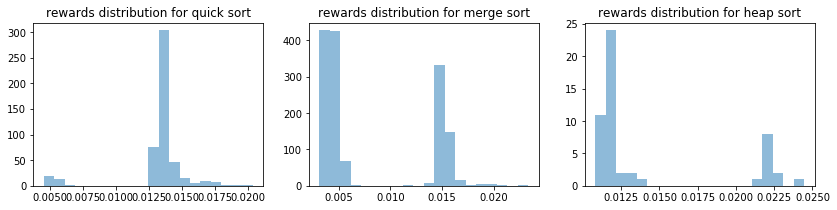

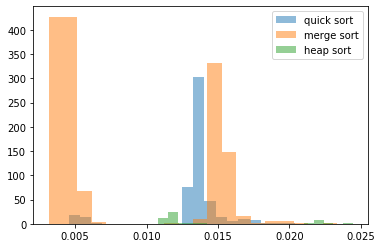

In [142]:
plot_rewards_distribution(arm_rewards_3)
plot_rewards_distribution_together(arm_rewards_3)

Iteration 502
Average rewards per algo {'quick_sort': 0.01379192682927326, 'merge_sort': 0.015313297959186902, 'heap_sort': 0.02213209999990795}
Count per chosen algo {'quick_sort': 451, 'merge_sort': 49, 'heap_sort': 3}


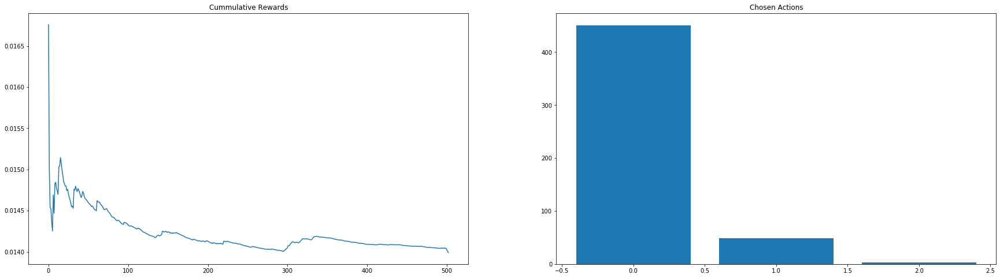

Iteration 545
Average rewards per algo {'quick_sort': 0.013549933405178355, 'merge_sort': 0.01123691025641048, 'heap_sort': 0.019597049999902083}
Count per chosen algo {'quick_sort': 13, 'merge_sort': 29, 'heap_sort': 1}


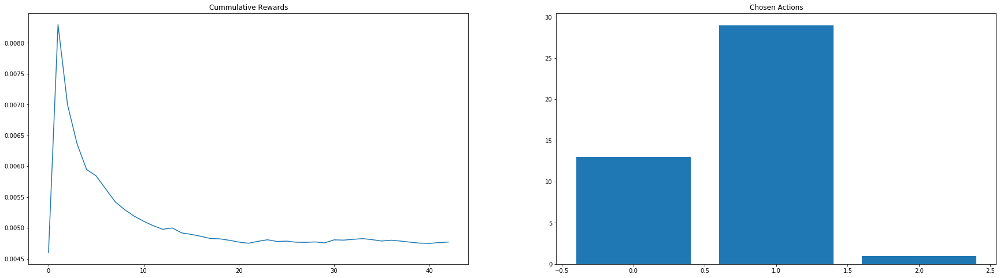

Iteration 1999
Average rewards per algo {'quick_sort': 0.013254426838968617, 'merge_sort': 0.008234888858129804, 'heap_sort': 0.014202146153811905}
Count per chosen algo {'quick_sort': 39, 'merge_sort': 1367, 'heap_sort': 48}


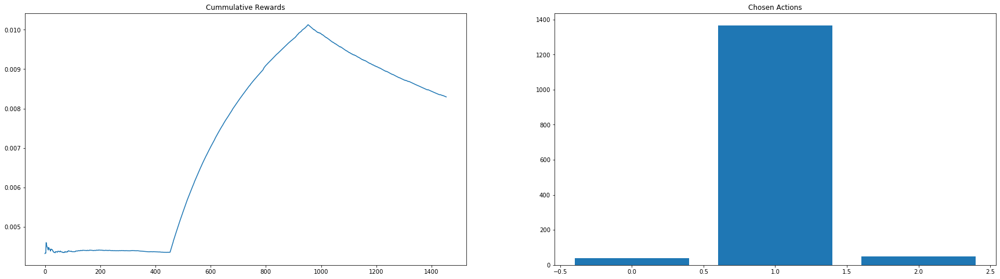

Total reward 19.3049


In [128]:
for elem in list_iteration_results_3:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_3,4))

## Four outliers in a row restart the expriment

In [129]:
list_iteration_results_4, total_reward_4, arm_rewards_4 = ts_quantile(list_distributions, n_samples, num_consec_elem=4)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.30579948462907647
Less than two values for merge_sort
merge_sort Theta 0.08019170540637066
Less than two values for heap_sort
heap_sort Theta 0.622289817887636


Chosen algorithm is:  merge_sort with reward: 0.02570060000016383
Sample mean is:  0.02570060000016383 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.3892564172667621
Less than two values for merge_sort
merge_sort Theta 0.19398730891236848
Less than two values for heap_sort
heap_sort Theta 0.8906117589022963


Chosen algorithm is:  merge_sort with reward: 0.01619170000003578
Sample mean is:  0.020946150000099806 Sample variance is: 2.260479480310881e-05


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.4884722408577832
merge_sort Theta 0.026174339336527176
Less than two values for heap_sort
heap_sort Theta 0.4844275758824701


Chosen algorithm is:  merge_sort with reward: 0.015666700000110723



Iteration: 27
Less than two values for quick_sort
quick_sort Theta 0.10636873916232825
merge_sort Theta 0.016089295924701555
Less than two values for heap_sort
heap_sort Theta 0.6059903947282308


Chosen algorithm is:  merge_sort with reward: 0.015014099999916652
Sample mean is:  0.016302507692356673 Sample variance is: 4.1807836730728315e-06


Iteration: 28
Less than two values for quick_sort
quick_sort Theta 0.0480411107157277
merge_sort Theta 0.013022278477939044
Less than two values for heap_sort
heap_sort Theta 0.5923206889549892


Chosen algorithm is:  merge_sort with reward: 0.015330700000049546
Sample mean is:  0.016266514814863815 Sample variance is: 4.059622501315003e-06


Iteration: 29
Less than two values for quick_sort
quick_sort Theta 0.5213844692943362
merge_sort Theta 0.015349537049441224
Less than two values for heap_sort
heap_sort Theta 0.6989798926787754


Chosen algorithm is:  merge_sort with reward: 0.015195699999821954
Sample mean is:  0.01622827142861232 Sample



Iteration: 56
Less than two values for quick_sort
quick_sort Theta 0.38162148152589914
merge_sort Theta 0.015450208122023327
Less than two values for heap_sort
heap_sort Theta 0.34006099582105553


Chosen algorithm is:  merge_sort with reward: 0.016902500000014697
Sample mean is:  0.015894112727280366 Sample variance is: 2.2955128928228337e-06


Iteration: 57
Less than two values for quick_sort
quick_sort Theta 0.7477591068392555
merge_sort Theta 0.016577585878357073
Less than two values for heap_sort
heap_sort Theta 0.48124256737090476


Chosen algorithm is:  merge_sort with reward: 0.0149821999998494
Sample mean is:  0.015877828571433383 Sample variance is: 2.2691061464059664e-06


Iteration: 58
Less than two values for quick_sort
quick_sort Theta 0.4744794166437465
merge_sort Theta 0.015924030969013618
Less than two values for heap_sort
heap_sort Theta 0.2848395615305436


Chosen algorithm is:  merge_sort with reward: 0.014861399999972491
Sample mean is:  0.015859996491232316 Samp



Iteration: 87
Less than two values for quick_sort
quick_sort Theta 0.0578390643390837
merge_sort Theta 0.014880038603869283
Less than two values for heap_sort
heap_sort Theta 0.4055405740354794


Chosen algorithm is:  merge_sort with reward: 0.015501999999742111
Sample mean is:  0.01568827441860776 Sample variance is: 1.7572776870425398e-06


Iteration: 88
Less than two values for quick_sort
quick_sort Theta 0.25137721338916075
merge_sort Theta 0.015080880048135008
Less than two values for heap_sort
heap_sort Theta 0.6927739770297926


Chosen algorithm is:  merge_sort with reward: 0.014817000000221014
Sample mean is:  0.015678259770120558 Sample variance is: 1.7457043067903167e-06


Iteration: 89
Less than two values for quick_sort
quick_sort Theta 0.36200835740571213
merge_sort Theta 0.016126796950989248
Less than two values for heap_sort
heap_sort Theta 0.12595487864949628


Chosen algorithm is:  merge_sort with reward: 0.014332000000194967
Sample mean is:  0.01566296136364413 Samp



Iteration: 118
quick_sort Theta 0.012322730391612274
merge_sort Theta 0.01542248787010447
heap_sort Theta 0.022405067956862892


Chosen algorithm is:  quick_sort with reward: 0.014478100000360428
Sample mean is:  0.013529677777771414 Sample variance is: 4.461061708466168e-07


Iteration: 119
quick_sort Theta 0.013972609442455411
merge_sort Theta 0.015051938935263643
heap_sort Theta 0.02361209166097291


Chosen algorithm is:  quick_sort with reward: 0.01341309999997975
Sample mean is:  0.013518019999992248 Sample variance is: 4.02718687806691e-07


Iteration: 120
quick_sort Theta 0.013771684146159353
merge_sort Theta 0.014948536772419942
heap_sort Theta 0.02462040245299897


Chosen algorithm is:  quick_sort with reward: 0.013689899999917543
Sample mean is:  0.013533645454530912 Sample variance is: 3.6854944630148105e-07


Iteration: 121
quick_sort Theta 0.010944532452133154
merge_sort Theta 0.015093553369174798
heap_sort Theta 0.022020997028222546


Chosen algorithm is:  quick_sort wi

quick_sort Theta 0.013617663882091987
merge_sort Theta 0.016602954018124998
heap_sort Theta 0.013915276407254944


Chosen algorithm is:  quick_sort with reward: 0.014685900000131369
Sample mean is:  0.01340784999999869 Sample variance is: 2.309774605747164e-07


Iteration: 151
quick_sort Theta 0.01306976261393722
merge_sort Theta 0.014959876669724792
heap_sort Theta 0.021419541851502855


Chosen algorithm is:  quick_sort with reward: 0.013977000000068074
Sample mean is:  0.013421731707317454 Sample variance is: 2.3305193589868779e-07


Iteration: 152
quick_sort Theta 0.013760276330064623
merge_sort Theta 0.016710515863941146
heap_sort Theta 0.022449695132806258


Chosen algorithm is:  quick_sort with reward: 0.013576100000136648
Sample mean is:  0.013425407142860769 Sample variance is: 2.2805694216580762e-07


Iteration: 153
quick_sort Theta 0.013441197772277052
merge_sort Theta 0.01410335379878108
heap_sort Theta 0.01953140391381612


Chosen algorithm is:  quick_sort with reward: 0.01

Sample mean is:  0.013440373239428854 Sample variance is: 1.7708307299892323e-07


Iteration: 182
quick_sort Theta 0.012814578457180096
merge_sort Theta 0.015106468757692539
heap_sort Theta 0.019189427134077213


Chosen algorithm is:  quick_sort with reward: 0.013510699999642384
Sample mean is:  0.013441349999987374 Sample variance is: 1.7469132421833462e-07


Iteration: 183
quick_sort Theta 0.01371652598400907
merge_sort Theta 0.015528779731568203
heap_sort Theta 0.0519285374005348


Chosen algorithm is:  quick_sort with reward: 0.013647799999944255
Sample mean is:  0.013444178082178564 Sample variance is: 1.7287415189909644e-07


Iteration: 184
quick_sort Theta 0.01365709206230367
merge_sort Theta 0.015956801874872535
heap_sort Theta 0.02103659154017431


Chosen algorithm is:  quick_sort with reward: 0.013577100000020437
Sample mean is:  0.013445974324311563 Sample variance is: 1.7077354817469694e-07


Iteration: 185
quick_sort Theta 0.013910302187763056
merge_sort Theta 0.0144364978



Chosen algorithm is:  quick_sort with reward: 0.014563900000212016
Sample mean is:  0.013495199056603081 Sample variance is: 2.0452107691719538e-07


Iteration: 217
quick_sort Theta 0.013301698141855941
merge_sort Theta 0.01539645358927661
heap_sort Theta 0.023281552921900435


Chosen algorithm is:  quick_sort with reward: 0.013132600000062666
Sample mean is:  0.013491810280373731 Sample variance is: 2.0382694824264597e-07


Iteration: 218
quick_sort Theta 0.013336015948035233
merge_sort Theta 0.015495645584234006
heap_sort Theta 0.02216390810115794


Chosen algorithm is:  quick_sort with reward: 0.013197500000387663
Sample mean is:  0.013489085185188675 Sample variance is: 2.0273425906797872e-07


Iteration: 219
quick_sort Theta 0.01344428573564321
merge_sort Theta 0.01633467895090821
heap_sort Theta 0.021741466627872866


Chosen algorithm is:  quick_sort with reward: 0.013466299999890907
Sample mean is:  0.013488876146791447 Sample variance is: 2.0087903101864342e-07


Iteration: 2



Iteration: 249
quick_sort Theta 0.013625531581331436
merge_sort Theta 0.014923241890119393
heap_sort Theta 0.02253497492322344


Chosen algorithm is:  quick_sort with reward: 0.013696400000299036
Sample mean is:  0.013508442028988493 Sample variance is: 2.939712592672484e-07


Iteration: 250
quick_sort Theta 0.01366107344266024
merge_sort Theta 0.015226874368145913
heap_sort Theta 0.022541770782606968


Chosen algorithm is:  quick_sort with reward: 0.013327499999832071
Sample mean is:  0.01350714028777154 Sample variance is: 2.9209020328847693e-07


Iteration: 251
quick_sort Theta 0.013546283349149861
merge_sort Theta 0.014929664212219928
heap_sort Theta 0.023033698989766788


Chosen algorithm is:  quick_sort with reward: 0.01351810000005571
Sample mean is:  0.013507218571430713 Sample variance is: 2.90004696531609e-07


Iteration: 252
quick_sort Theta 0.01320735591928707
merge_sort Theta 0.015815088701716447
heap_sort Theta 0.022410986326308592


Chosen algorithm is:  quick_sort wit



Chosen algorithm is:  quick_sort with reward: 0.014577699999790639
Sample mean is:  0.013507586470578805 Sample variance is: 2.8147870424398743e-07


Iteration: 282
quick_sort Theta 0.013985919613209503
merge_sort Theta 0.01481101936309952
heap_sort Theta 0.02020238823485901


Chosen algorithm is:  quick_sort with reward: 0.013489599999957136
Sample mean is:  0.013507481286540082 Sample variance is: 2.7983451077610335e-07


Iteration: 283
quick_sort Theta 0.013302632576690026
merge_sort Theta 0.015343515488495342
heap_sort Theta 0.023973041953378075


Chosen algorithm is:  quick_sort with reward: 0.013544699999783916
Sample mean is:  0.013507697674407779 Sample variance is: 2.7821557280029763e-07


Iteration: 284
quick_sort Theta 0.013669978430237225
merge_sort Theta 0.01638323487394746
heap_sort Theta 0.02336540487054447


Chosen algorithm is:  quick_sort with reward: 0.012545099999897502
Sample mean is:  0.013502133526000205 Sample variance is: 2.81932466868821e-07


Iteration: 285



Chosen algorithm is:  quick_sort with reward: 0.014570199999980105
Sample mean is:  0.0135064935643393 Sample variance is: 2.7340701032070395e-07


Iteration: 314
quick_sort Theta 0.013580777220694954
merge_sort Theta 0.014814452936414549
heap_sort Theta 0.02084724351634539


Chosen algorithm is:  quick_sort with reward: 0.013150799999948504
Sample mean is:  0.01350474137929304 Sample variance is: 2.72680348549688e-07


Iteration: 315
quick_sort Theta 0.013339218914749745
merge_sort Theta 0.015357487343717993
heap_sort Theta 0.02473249377999259


Chosen algorithm is:  quick_sort with reward: 0.013502499999958673
Sample mean is:  0.01350473039213944 Sample variance is: 2.7134370468010587e-07


Iteration: 316
quick_sort Theta 0.013572997586595833
merge_sort Theta 0.015402481587666448
heap_sort Theta 0.021833494954516867


Chosen algorithm is:  quick_sort with reward: 0.013471100000060687
Sample mean is:  0.013504566341446374 Sample variance is: 2.7002556702889674e-07


Iteration: 317
q



Iteration: 345
quick_sort Theta 0.013377317775126527
merge_sort Theta 0.015696514148810885
heap_sort Theta 0.022484048074422645


Chosen algorithm is:  quick_sort with reward: 0.013523900000109279
Sample mean is:  0.013498734188019664 Sample variance is: 2.619612295248133e-07


Iteration: 346
quick_sort Theta 0.013405213599185629
merge_sort Theta 0.016025261483352496
heap_sort Theta 0.021776699919764966


Chosen algorithm is:  quick_sort with reward: 0.01330790000019988
Sample mean is:  0.013497922127645962 Sample variance is: 2.6100081032836285e-07


Iteration: 347
quick_sort Theta 0.013645078404292289
merge_sort Theta 0.01653784415821094
heap_sort Theta 0.023463974806022678


Chosen algorithm is:  quick_sort with reward: 0.01359150000007503
Sample mean is:  0.01349831864405456 Sample variance is: 2.599318226280158e-07


Iteration: 348
quick_sort Theta 0.01360426268709427
merge_sort Theta 0.015719095011084934
heap_sort Theta 0.02222062364879461


Chosen algorithm is:  quick_sort wit



Iteration: 377
quick_sort Theta 0.013547071705510658
merge_sort Theta 0.015441408862819157
heap_sort Theta 0.022711343075743868


Chosen algorithm is:  quick_sort with reward: 0.014122099999895
Sample mean is:  0.013491921804494692 Sample variance is: 2.4565334787825087e-07


Iteration: 378
quick_sort Theta 0.013820370084447791
merge_sort Theta 0.01587726365755856
heap_sort Theta 0.022748550662989506


Chosen algorithm is:  quick_sort with reward: 0.013677599999937229
Sample mean is:  0.01349261722844766 Sample variance is: 2.448619393363778e-07


Iteration: 379
quick_sort Theta 0.013470777214953832
merge_sort Theta 0.015454775426980306
heap_sort Theta 0.02043445606310561


Chosen algorithm is:  quick_sort with reward: 0.013476600000103645
Sample mean is:  0.013492557462670257 Sample variance is: 2.4394922909378573e-07


Iteration: 380
quick_sort Theta 0.013554548087683317
merge_sort Theta 0.015741229004853932
heap_sort Theta 0.021897990385463754


Chosen algorithm is:  quick_sort wi



Chosen algorithm is:  quick_sort with reward: 0.014529400000355963
Sample mean is:  0.013485667785223861 Sample variance is: 2.4390741051678994e-07


Iteration: 410
quick_sort Theta 0.013167419491839177
merge_sort Theta 0.01457496511303141
heap_sort Theta 0.02200905098050544


Chosen algorithm is:  quick_sort with reward: 0.013955800000076124
Sample mean is:  0.013487240133768518 Sample variance is: 2.4382840609278083e-07


Iteration: 411
quick_sort Theta 0.013835084732248195
merge_sort Theta 0.015536615771346022
heap_sort Theta 0.022073459644736372


Chosen algorithm is:  quick_sort with reward: 0.013498299999810115
Sample mean is:  0.013487276999988656 Sample variance is: 2.4301605111547625e-07


Iteration: 412
quick_sort Theta 0.013578306469104259
merge_sort Theta 0.015521911444456034
heap_sort Theta 0.02057821301244798


Chosen algorithm is:  quick_sort with reward: 0.013556200000039098
Sample mean is:  0.013487505980055268 Sample variance is: 2.422244183806834e-07


Iteration: 4



Iteration: 441
quick_sort Theta 0.013474951382501252
merge_sort Theta 0.017024767655257955
heap_sort Theta 0.02251794505285854


Chosen algorithm is:  quick_sort with reward: 0.013310599999840633
Sample mean is:  0.013486679939203642 Sample variance is: 2.3526632380363452e-07


Iteration: 442
quick_sort Theta 0.013369711466949439
merge_sort Theta 0.015258671711114726
heap_sort Theta 0.02245982799604527


Chosen algorithm is:  quick_sort with reward: 0.013692600000013044
Sample mean is:  0.013487303939387912 Sample variance is: 2.3468150032934433e-07


Iteration: 443
quick_sort Theta 0.013441541775095281
merge_sort Theta 0.015735070134597403
heap_sort Theta 0.023131503522336543


Chosen algorithm is:  quick_sort with reward: 0.013135600000168779
Sample mean is:  0.013486241389722597 Sample variance is: 2.343450666665951e-07


Iteration: 444
quick_sort Theta 0.013441402844560277
merge_sort Theta 0.015118173154619712
heap_sort Theta 0.0231673709145099


Chosen algorithm is:  quick_sort 



Chosen algorithm is:  quick_sort with reward: 0.015393199999834906
Sample mean is:  0.013486399723756197 Sample variance is: 2.433418258919603e-07


Iteration: 475
quick_sort Theta 0.013124463600126045
merge_sort Theta 0.01606927471510319
heap_sort Theta 0.02314971325369183


Chosen algorithm is:  quick_sort with reward: 0.014294799999788665
Sample mean is:  0.013488626721761796 Sample variance is: 2.4446680901756634e-07


Iteration: 476
quick_sort Theta 0.013698999877526498
merge_sort Theta 0.015595521639660083
heap_sort Theta 0.02236173147853104


Chosen algorithm is:  quick_sort with reward: 0.01354929999979504
Sample mean is:  0.013488793406591558 Sample variance is: 2.438052824360683e-07


Iteration: 477
quick_sort Theta 0.013610436912972503
merge_sort Theta 0.01640391304210729
heap_sort Theta 0.020730992849649355


Chosen algorithm is:  quick_sort with reward: 0.014519699999709701
Sample mean is:  0.013491617808216538 Sample variance is: 2.460410397704288e-07


Iteration: 478
q



Iteration: 507
quick_sort Theta 0.008503970611392297
Less than two values for merge_sort
merge_sort Theta 0.6358666657018254
Less than two values for heap_sort
heap_sort Theta 0.41699126440485


Chosen algorithm is:  quick_sort with reward: 0.00535360000003493
Sample mean is:  0.013327693670881569 Sample variance is: 1.6692620405502953e-06


Iteration: 508
quick_sort Theta 0.01027508857735443
Less than two values for merge_sort
merge_sort Theta 0.3044487454611696
Less than two values for heap_sort
heap_sort Theta 0.5140758606750936


Chosen algorithm is:  quick_sort with reward: 0.005373999999847001
Sample mean is:  0.013307608585853703 Sample variance is: 1.8243939353948327e-06


Iteration: 509
quick_sort Theta 0.010705886518991058
Less than two values for merge_sort
merge_sort Theta 0.8591553323353419
Less than two values for heap_sort
heap_sort Theta 0.4801924699600443


Chosen algorithm is:  quick_sort with reward: 0.0054702000002180284
Sample mean is:  0.01328786700251457 Sample

Less than two values for merge_sort
merge_sort Theta 0.6372913867518473
heap_sort Theta 0.008282614773041083


Chosen algorithm is:  heap_sort with reward: 0.01433709999992061
Sample mean is:  0.017691544444308722 Sample variance is: 2.82371488108325e-05


Iteration: 533
quick_sort Theta 0.013955940061883068
Less than two values for merge_sort
merge_sort Theta 0.0028254599583990014
heap_sort Theta 0.011119352203903747


Chosen algorithm is:  merge_sort with reward: 0.004371500000161177
Sample mean is:  0.015360900000016706 Sample variance is: 3.750777701760759e-06


Iteration: 534
quick_sort Theta 0.010426735090125138
merge_sort Theta 0.017637523788725205
heap_sort Theta 0.0373700667339231


Chosen algorithm is:  quick_sort with reward: 0.004909199999929115
Sample mean is:  0.01291678317307051 Sample variance is: 4.768045581771482e-06


Iteration: 535
quick_sort Theta 0.013870627446341051
merge_sort Theta 0.05695214695462089
heap_sort Theta 0.03387964336341082


Chosen algorithm is:  q

Sample mean is:  0.014321661110948803 Sample variance is: 2.5496928424523982e-05


Iteration: 563
quick_sort Theta 0.015787825564798894
merge_sort Theta 0.009950893631920256
heap_sort Theta 0.014480314254824442


Chosen algorithm is:  merge_sort with reward: 0.003996800000095391
Sample mean is:  0.014430653333355773 Sample variance is: 1.297202159081395e-05


Iteration: 564
quick_sort Theta 0.014995544244356512
merge_sort Theta 0.004345076262750413
heap_sort Theta 0.004855287162582128


Chosen algorithm is:  merge_sort with reward: 0.004338400000051479
Sample mean is:  0.014347246281014416 Sample variance is: 1.3699623166440102e-05


Iteration: 565
quick_sort Theta 0.011502181926228533
merge_sort Theta 0.01476880274714159
heap_sort Theta 0.02022274592968913


Chosen algorithm is:  quick_sort with reward: 0.004487000000153785
Sample mean is:  0.012714034192031974 Sample variance is: 6.202506277163935e-06


Iteration: 566
quick_sort Theta 0.013180366490918945
merge_sort Theta 0.020256099



Iteration: 595
quick_sort Theta 0.009848947073223029
merge_sort Theta 0.014189102867204113
heap_sort Theta 0.019249287335650823


Chosen algorithm is:  quick_sort with reward: 0.005589599999893835
Sample mean is:  0.012471657369606336 Sample variance is: 7.801304079237793e-06


Iteration: 596
quick_sort Theta 0.009569302146300238
merge_sort Theta 0.0016201998178985537
heap_sort Theta 0.014523751693732889


Chosen algorithm is:  merge_sort with reward: 0.004071299999850453
Sample mean is:  0.013354844776138146 Sample variance is: 2.1558699751783975e-05


Iteration: 597
quick_sort Theta 0.011430418969363604
merge_sort Theta 0.00896111082388768
heap_sort Theta 0.00779854066660843


Chosen algorithm is:  heap_sort with reward: 0.010302800000317802
Sample mean is:  0.013624321739035107 Sample variance is: 2.1769880755214245e-05


Iteration: 598
quick_sort Theta 0.01178763373578915
merge_sort Theta 0.021354732430757903
heap_sort Theta 0.01676230538547893


Chosen algorithm is:  quick_sort 



Iteration: 627
quick_sort Theta 0.011710978123441438
merge_sort Theta 0.022857739816497448
heap_sort Theta 0.017306638870747522


Chosen algorithm is:  quick_sort with reward: 0.004485399999794026
Sample mean is:  0.012227030921045505 Sample variance is: 9.316000511387696e-06


Iteration: 628
quick_sort Theta 0.011732508486623485
merge_sort Theta 0.005150510659028779
heap_sort Theta 0.010531770540335699


Chosen algorithm is:  merge_sort with reward: 0.0038973999999143416
Sample mean is:  0.012825873239455152 Sample variance is: 2.5031311656805843e-05
RESTART EXPERIMENT


Iteration: 629
Less than two values for quick_sort
quick_sort Theta 0.03007842221981083
Less than two values for merge_sort
merge_sort Theta 0.5769537393081077
Less than two values for heap_sort
heap_sort Theta 0.8527064262290741


Chosen algorithm is:  quick_sort with reward: 0.0056073999999171065
Sample mean is:  0.012212545951852664 Sample variance is: 9.391290725546583e-06


Iteration: 630
Less than two values f

Less than two values for heap_sort
heap_sort Theta 0.053810108566322956


Chosen algorithm is:  quick_sort with reward: 0.0060944000001654786
Sample mean is:  0.011880488958329731 Sample variance is: 1.1141082429102759e-05


Iteration: 654
quick_sort Theta 0.008321940372423547
Less than two values for merge_sort
merge_sort Theta 0.14179192883946246
Less than two values for heap_sort
heap_sort Theta 0.4300504954801524


Chosen algorithm is:  quick_sort with reward: 0.0045847999999750755
Sample mean is:  0.011865321205817559 Sample variance is: 1.1228349239380157e-05


Iteration: 655
quick_sort Theta 0.008514905022538984
Less than two values for merge_sort
merge_sort Theta 0.9561596381062468
Less than two values for heap_sort
heap_sort Theta 0.43116612494365647


Chosen algorithm is:  quick_sort with reward: 0.004846499999985099
Sample mean is:  0.011850759336095914 Sample variance is: 1.1307049020957053e-05


Iteration: 656
quick_sort Theta 0.012847482960929633
Less than two values for 



Chosen algorithm is:  quick_sort with reward: 0.007186400000136928
Sample mean is:  0.011577403777333696 Sample variance is: 1.2564228427460985e-05


Iteration: 678
quick_sort Theta 0.012574262040586934
Less than two values for merge_sort
merge_sort Theta 0.3056718394491129
Less than two values for heap_sort
heap_sort Theta 0.0015512374139979856


Chosen algorithm is:  heap_sort with reward: 0.010509000000183732
Sample mean is:  0.0128632515150898 Sample variance is: 1.6585182042675447e-05


Iteration: 679
quick_sort Theta 0.011444501690839645
Less than two values for merge_sort
merge_sort Theta 0.10497132200895687
heap_sort Theta 0.04105787274756993


Chosen algorithm is:  quick_sort with reward: 0.005127399999764748
Sample mean is:  0.0115646061507909 Sample variance is: 1.2621680363103145e-05


Iteration: 680
quick_sort Theta 0.013331535774441485
Less than two values for merge_sort
merge_sort Theta 0.4054810243415756
heap_sort Theta 0.18409208910677138


Chosen algorithm is:  quic



Iteration: 711
quick_sort Theta 0.012121756250353308
Less than two values for merge_sort
merge_sort Theta 0.7002834376050762
heap_sort Theta 0.0036806568231641055


Chosen algorithm is:  heap_sort with reward: 0.011683199999879434
Sample mean is:  0.012518860465058615 Sample variance is: 1.3399040124323689e-05


Iteration: 712
quick_sort Theta 0.014109301219176196
Less than two values for merge_sort
merge_sort Theta 0.7949544976826656
heap_sort Theta 0.023302983923375556


Chosen algorithm is:  quick_sort with reward: 0.0051522999997359875
Sample mean is:  0.011281603036049258 Sample variance is: 1.3829660942800975e-05


Iteration: 713
quick_sort Theta 0.011896737633842231
Less than two values for merge_sort
merge_sort Theta 0.13861267813446065
heap_sort Theta 0.008530857997524496


Chosen algorithm is:  heap_sort with reward: 0.011109099999885075
Sample mean is:  0.012486820454486488 Sample variance is: 1.3138658663065377e-05


Iteration: 714
quick_sort Theta 0.006236833571122472
Le



Chosen algorithm is:  heap_sort with reward: 0.013031899999987218
Sample mean is:  0.012168288333282363 Sample variance is: 1.0066555006388968e-05


Iteration: 741
quick_sort Theta 0.01271976954409376
Less than two values for merge_sort
merge_sort Theta 0.736578569782832
heap_sort Theta 0.016397031459223377


Chosen algorithm is:  quick_sort with reward: 0.004840299999614217
Sample mean is:  0.011143299443409143 Sample variance is: 1.4365638699955047e-05


Iteration: 742
quick_sort Theta 0.011186823741843259
Less than two values for merge_sort
merge_sort Theta 0.4299387330693759
heap_sort Theta 0.01055213274284283


Chosen algorithm is:  heap_sort with reward: 0.010268900000028225
Sample mean is:  0.012137150819622458 Sample variance is: 9.959702199896197e-06


Iteration: 743
quick_sort Theta 0.011992460628083686
Less than two values for merge_sort
merge_sort Theta 0.9010559348887908
heap_sort Theta 0.010807122068691891


Chosen algorithm is:  heap_sort with reward: 0.011718900000232



Iteration: 771
quick_sort Theta 0.012224607374542666
Less than two values for merge_sort
merge_sort Theta 0.956398363871948
heap_sort Theta 0.01271980416997694


Chosen algorithm is:  quick_sort with reward: 0.004317099999752827
Sample mean is:  0.01098039765342339 Sample variance is: 1.493539279242457e-05


Iteration: 772
quick_sort Theta 0.01313364594598418
Less than two values for merge_sort
merge_sort Theta 0.20667730987890098
heap_sort Theta 0.01279248940003096


Chosen algorithm is:  heap_sort with reward: 0.01102069999978994
Sample mean is:  0.011925567105226707 Sample variance is: 8.270170742203435e-06


Iteration: 773
quick_sort Theta 0.009727164925527259
Less than two values for merge_sort
merge_sort Theta 0.7884482556164325
heap_sort Theta 0.015485611199357062


Chosen algorithm is:  quick_sort with reward: 0.005303599999933795
Sample mean is:  0.010970169189182867 Sample variance is: 1.4966442475099238e-05


Iteration: 774
quick_sort Theta 0.0138766376669647
Less than two

Less than two values for merge_sort
merge_sort Theta 0.6721162360846894
heap_sort Theta 0.011680398259704673


Chosen algorithm is:  quick_sort with reward: 0.005387599999721715
Sample mean is:  0.010792275043622382 Sample variance is: 1.5474213305232196e-05


Iteration: 803
quick_sort Theta 0.009647084559792005
Less than two values for merge_sort
merge_sort Theta 0.05391177296059979
heap_sort Theta 0.01522211188802711


Chosen algorithm is:  quick_sort with reward: 0.005172700000002806
Sample mean is:  0.010782484843197958 Sample variance is: 1.5502175663419766e-05


Iteration: 804
quick_sort Theta 0.00944542662261737
Less than two values for merge_sort
merge_sort Theta 0.7571360159361193
heap_sort Theta 0.00947297755178118


Chosen algorithm is:  quick_sort with reward: 0.005427200000212906
Sample mean is:  0.010773171304340592 Sample variance is: 1.5525005269389517e-05


Iteration: 805
quick_sort Theta 0.010703872775487714
Less than two values for merge_sort
merge_sort Theta 0.95073



Iteration: 833
quick_sort Theta 0.009915460873501333
Less than two values for merge_sort
merge_sort Theta 0.5476963519465816
heap_sort Theta 0.013244684455084949


Chosen algorithm is:  quick_sort with reward: 0.005274799999824609
Sample mean is:  0.01058484739495106 Sample variance is: 1.602502901748526e-05


Iteration: 834
quick_sort Theta 0.01205122479445968
Less than two values for merge_sort
merge_sort Theta 0.577294798976422
heap_sort Theta 0.010500090957965388


Chosen algorithm is:  heap_sort with reward: 0.010759999999663705
Sample mean is:  0.011767735051518647 Sample variance is: 6.659198992788534e-06


Iteration: 835
quick_sort Theta 0.012016683138918138
Less than two values for merge_sort
merge_sort Theta 0.5007349141939581
heap_sort Theta 0.009854505191779127


Chosen algorithm is:  heap_sort with reward: 0.010420500000236643
Sample mean is:  0.011753987755076994 Sample variance is: 6.609579834125143e-06


Iteration: 836
quick_sort Theta 0.009893283256732555
Less than t



Chosen algorithm is:  quick_sort with reward: 0.007073400000081165
Sample mean is:  0.010391528849263088 Sample variance is: 1.6476045187052436e-05


Iteration: 864
quick_sort Theta 0.01085664298878957
Less than two values for merge_sort
merge_sort Theta 0.21036924604896579
heap_sort Theta 0.013489289558642335


Chosen algorithm is:  quick_sort with reward: 0.005580700000336947
Sample mean is:  0.01038374433656256 Sample variance is: 1.6486774279396018e-05


Iteration: 865
quick_sort Theta 0.01310996276984186
Less than two values for merge_sort
merge_sort Theta 0.6503899892155953
heap_sort Theta 0.009700395119846024


Chosen algorithm is:  heap_sort with reward: 0.011068599999816797
Sample mean is:  0.011738820952355343 Sample variance is: 6.212950494216773e-06


Iteration: 866
quick_sort Theta 0.009291341315047134
Less than two values for merge_sort
merge_sort Theta 0.44439085894932395
heap_sort Theta 0.01278765301854134


Chosen algorithm is:  quick_sort with reward: 0.005356200000



Chosen algorithm is:  merge_sort with reward: 0.005296899999848392
Sample mean is:  0.012379400000011932 Sample variance is: 2.7257189720827434e-05


Iteration: 895
quick_sort Theta 0.0070039004311320055
merge_sort Theta 0.005913495787122542
heap_sort Theta 0.012198528361522448


Chosen algorithm is:  merge_sort with reward: 0.0039368999996440834
Sample mean is:  0.012323489403983005 Sample variance is: 2.7545577742869734e-05


Iteration: 896
quick_sort Theta 0.01082635279532503
merge_sort Theta 0.007431442850842952
heap_sort Theta 0.013291061125380687


Chosen algorithm is:  merge_sort with reward: 0.004096500000287051
Sample mean is:  0.012269364473695532 Sample variance is: 2.7806712556538856e-05


Iteration: 897
quick_sort Theta 0.009380601210525918
merge_sort Theta 0.0038120428584011365
heap_sort Theta 0.012344422442491397


Chosen algorithm is:  merge_sort with reward: 0.004026799999792274
Sample mean is:  0.012215491503277864 Sample variance is: 2.8066118472341765e-05


Iterat

heap_sort Theta 0.011018695509783696


Chosen algorithm is:  quick_sort with reward: 0.005794800000330724
Sample mean is:  0.01009783440366601 Sample variance is: 1.699686036504072e-05


Iteration: 929
quick_sort Theta 0.011804734019220246
merge_sort Theta 0.009794313394405686
heap_sort Theta 0.01035689124291725


Chosen algorithm is:  merge_sort with reward: 0.004186099999969883
Sample mean is:  0.011637869090913171 Sample variance is: 3.029813092543076e-05


Iteration: 930
quick_sort Theta 0.012535241729133185
merge_sort Theta 0.012301684159465682
heap_sort Theta 0.009343421351536431


Chosen algorithm is:  heap_sort with reward: 0.010565699999915523
Sample mean is:  0.011704744642831397 Sample variance is: 5.85298622781485e-06


Iteration: 931
quick_sort Theta 0.009319592005101239
merge_sort Theta 0.013443320018570806
heap_sort Theta 0.014175797685115715


Chosen algorithm is:  quick_sort with reward: 0.005167400000118505
Sample mean is:  0.010090307022897236 Sample variance is: 1.7

merge_sort Theta 0.007157938493077166
heap_sort Theta 0.010039392305609083


Chosen algorithm is:  merge_sort with reward: 0.004916400000183785
Sample mean is:  0.010901876502738377 Sample variance is: 3.22942995600468e-05


Iteration: 963
quick_sort Theta 0.009463386021239467
merge_sort Theta 0.006799822998321304
heap_sort Theta 0.011061407239227343


Chosen algorithm is:  merge_sort with reward: 0.004167000000052212
Sample mean is:  0.010865273913049865 Sample variance is: 3.236396123409656e-05


Iteration: 964
quick_sort Theta 0.013466472712404604
merge_sort Theta 0.007062982252599088
heap_sort Theta 0.011866725577889951


Chosen algorithm is:  merge_sort with reward: 0.004513899999892601
Sample mean is:  0.010830942162167933 Sample variance is: 3.240589602092733e-05


Iteration: 965
quick_sort Theta 0.011008096868720296
merge_sort Theta 0.004937176633913024
heap_sort Theta 0.012321182016022591


Chosen algorithm is:  merge_sort with reward: 0.0039197999999487365
Sample mean is:  0.

Chosen algorithm is:  quick_sort with reward: 0.005137300000114919
Sample mean is:  0.009915243004415542 Sample variance is: 1.7247623892928777e-05


Iteration: 995
quick_sort Theta 0.009471186762520917
merge_sort Theta 0.014214860436755341
heap_sort Theta 0.012271175259810408


Chosen algorithm is:  quick_sort with reward: 0.004880799999682495
Sample mean is:  0.009907839411761522 Sample variance is: 1.725947789220779e-05


Iteration: 996
quick_sort Theta 0.008032351516521066
merge_sort Theta 0.014006835038898009
heap_sort Theta 0.011541180272450859


Chosen algorithm is:  quick_sort with reward: 0.0047026000002006185
Sample mean is:  0.009900195888396529 Sample variance is: 1.7273861523735536e-05


Iteration: 997
quick_sort Theta 0.010933131302665634
merge_sort Theta 0.006777905382177065
heap_sort Theta 0.013735234349738046


Chosen algorithm is:  merge_sort with reward: 0.0040819000000738015
Sample mean is:  0.010481683589743905 Sample variance is: 3.3000946711290324e-05


Iteration

Chosen algorithm is:  merge_sort with reward: 0.015045899999677204
Sample mean is:  0.010748427619046198 Sample variance is: 3.210788998528519e-05


Iteration: 1025
quick_sort Theta 0.011440561924780535
merge_sort Theta 0.012716127926359054
heap_sort Theta 0.011605848221175611


Chosen algorithm is:  quick_sort with reward: 0.013894799999889074
Sample mean is:  0.009949148484842985 Sample variance is: 1.7190468417484308e-05


Iteration: 1026
quick_sort Theta 0.010068872874808305
merge_sort Theta 0.016818593547457576
heap_sort Theta 0.013033430011027932


Chosen algorithm is:  quick_sort with reward: 0.013950300000033167
Sample mean is:  0.009954913832847582 Sample variance is: 1.7188733081748174e-05


Iteration: 1027
quick_sort Theta 0.012076744354701349
merge_sort Theta 0.006885522361914666
heap_sort Theta 0.011850343135689202


Chosen algorithm is:  merge_sort with reward: 0.014939499999854888
Sample mean is:  0.010768290521324912 Sample variance is: 3.2038572216824285e-05


Iteratio

quick_sort Theta 0.00822305759998619
merge_sort Theta 0.011486351727496128
heap_sort Theta 0.011543936597217683


Chosen algorithm is:  quick_sort with reward: 0.018131000000266795
Sample mean is:  0.010034944271564221 Sample variance is: 1.7267937110174215e-05


Iteration: 1058
quick_sort Theta 0.011848472024081085
merge_sort Theta 0.007561858162234828
heap_sort Theta 0.014147087950638798


Chosen algorithm is:  merge_sort with reward: 0.015250299999934214
Sample mean is:  0.010999190134526897 Sample variance is: 3.125654189949679e-05


Iteration: 1059
quick_sort Theta 0.01186615991334346
merge_sort Theta 0.009513811175429975
heap_sort Theta 0.012034111060289884


Chosen algorithm is:  merge_sort with reward: 0.014379100000041944
Sample mean is:  0.01101427901785509 Sample variance is: 3.116777515723737e-05


Iteration: 1060
quick_sort Theta 0.010410344565702312
merge_sort Theta 0.008614266857935437
heap_sort Theta 0.01053026210986597


Chosen algorithm is:  merge_sort with reward: 0.

Sample mean is:  0.010123978620684222 Sample variance is: 1.7152191951461732e-05


Iteration: 1087
quick_sort Theta 0.010331552274934932
merge_sort Theta 0.010942094586921523
heap_sort Theta 0.011691139532248287


Chosen algorithm is:  quick_sort with reward: 0.013110699999742792
Sample mean is:  0.01012809256197769 Sample variance is: 1.714083661461359e-05


Iteration: 1088
quick_sort Theta 0.011518099663763324
merge_sort Theta 0.010988007725357404
heap_sort Theta 0.010385204260218986


Chosen algorithm is:  heap_sort with reward: 0.02195879999999306
Sample mean is:  0.012474159848466115 Sample variance is: 1.3097166268283292e-05


Iteration: 1089
quick_sort Theta 0.008137038283975127
merge_sort Theta 0.008429721836873034
heap_sort Theta 0.01229166689485432


Chosen algorithm is:  quick_sort with reward: 0.012963000000127067
Sample mean is:  0.010131992022002654 Sample variance is: 1.7128298525150085e-05


Iteration: 1090
quick_sort Theta 0.010996245476008389
merge_sort Theta 0.008617


Chosen algorithm is:  merge_sort with reward: 0.015010099999926751
Sample mean is:  0.011382123886643804 Sample variance is: 2.9590406665383937e-05


Iteration: 1120
quick_sort Theta 0.012449771144201961
merge_sort Theta 0.010557799663314247
heap_sort Theta 0.008925440482274961


Chosen algorithm is:  heap_sort with reward: 0.022585799999887968
Sample mean is:  0.0127701919117405 Sample variance is: 1.5607062071637406e-05


Iteration: 1121
quick_sort Theta 0.01130987262381178
merge_sort Theta 0.011530517984458116
heap_sort Theta 0.011254010695181357


Chosen algorithm is:  heap_sort with reward: 0.022010599999703118
Sample mean is:  0.012837640145959204 Sample variance is: 1.6111841855224663e-05


Iteration: 1122
quick_sort Theta 0.012092504801322868
merge_sort Theta 0.012068149735500508
heap_sort Theta 0.012733697810503111


Chosen algorithm is:  merge_sort with reward: 0.015016000000287022
Sample mean is:  0.011396776612908496 Sample variance is: 2.9524121999061153e-05


Iteration: 



Chosen algorithm is:  merge_sort with reward: 0.01581159999977899
Sample mean is:  0.01154505116279296 Sample variance is: 2.8935735462411953e-05


Iteration: 1155
quick_sort Theta 0.009075973296131723
merge_sort Theta 0.014259170631656503
heap_sort Theta 0.012006913797448443


Chosen algorithm is:  quick_sort with reward: 0.01383860000032655
Sample mean is:  0.01025867178807538 Sample variance is: 1.6921112217650072e-05


Iteration: 1156
quick_sort Theta 0.01078073246426225
merge_sort Theta 0.012405349810646345
heap_sort Theta 0.013208940440577674


Chosen algorithm is:  quick_sort with reward: 0.013651499999923544
Sample mean is:  0.01026315965608047 Sample variance is: 1.691393621830124e-05


Iteration: 1157
quick_sort Theta 0.010763611707944718
merge_sort Theta 0.015538441530398416
heap_sort Theta 0.00918474749657006


Chosen algorithm is:  heap_sort with reward: 0.022241199999825767
Sample mean is:  0.01329170763886446 Sample variance is: 1.9365327420158404e-05


Iteration: 1158



Iteration: 1190
quick_sort Theta 0.009077453452174878
merge_sort Theta 0.013425835705207301
heap_sort Theta 0.012741015176040085


Chosen algorithm is:  quick_sort with reward: 0.013829900000018824
Sample mean is:  0.010356812195116364 Sample variance is: 1.6705690732020182e-05


Iteration: 1191
quick_sort Theta 0.012252145139210021
merge_sort Theta 0.009771498786167288
heap_sort Theta 0.01128855221915057


Chosen algorithm is:  merge_sort with reward: 0.014637799999945855
Sample mean is:  0.011644028571430326 Sample variance is: 2.8386896606238726e-05


Iteration: 1192
quick_sort Theta 0.010657421507717688
merge_sort Theta 0.013714111352530086
heap_sort Theta 0.015066098120566784


Chosen algorithm is:  quick_sort with reward: 0.013441399999919668
Sample mean is:  0.010360766794866113 Sample variance is: 1.6696455851101408e-05


Iteration: 1193
quick_sort Theta 0.010331392265767196
merge_sort Theta 0.010591240522206915
heap_sort Theta 0.01713224556122649


Chosen algorithm is:  quic



Iteration: 1220
quick_sort Theta 0.010946683127011445
merge_sort Theta 0.008882564282204939
heap_sort Theta 0.014998369213278746


Chosen algorithm is:  merge_sort with reward: 0.015166300000146293
Sample mean is:  0.011762690942031691 Sample variance is: 2.7739993494003695e-05


Iteration: 1221
quick_sort Theta 0.010716565156042055
merge_sort Theta 0.008577761596995165
heap_sort Theta 0.01641151070321373


Chosen algorithm is:  merge_sort with reward: 0.015279499999905966
Sample mean is:  0.011775387003612465 Sample variance is: 2.7684337547545848e-05


Iteration: 1222
quick_sort Theta 0.011097880717159858
merge_sort Theta 0.010432351215381486
heap_sort Theta 0.015232109587415776


Chosen algorithm is:  merge_sort with reward: 0.014961399999720015
Sample mean is:  0.011786847482015729 Sample variance is: 2.7621135490102277e-05


Iteration: 1223
quick_sort Theta 0.012233655409127787
merge_sort Theta 0.016209939775623704
heap_sort Theta 0.012795267468631936


Chosen algorithm is:  qui



Chosen algorithm is:  heap_sort with reward: 0.024299499999870022
Sample mean is:  0.013843513071870666 Sample variance is: 2.3150150035386825e-05


Iteration: 1250
quick_sort Theta 0.011258281717638678
merge_sort Theta 0.011132915324451065
heap_sort Theta 0.014066202344695534


Chosen algorithm is:  merge_sort with reward: 0.015168700000231183
Sample mean is:  0.011833092907802552 Sample variance is: 2.7380254745320808e-05


Iteration: 1251
quick_sort Theta 0.009759798219033115
merge_sort Theta 0.011783944529543464
heap_sort Theta 0.010505459413325383


Chosen algorithm is:  quick_sort with reward: 0.013528800000131014
Sample mean is:  0.01050219510403564 Sample variance is: 1.6368364549768244e-05


Iteration: 1252
quick_sort Theta 0.010795663489415281
merge_sort Theta 0.010026392684992624
heap_sort Theta 0.015051818881149119


Chosen algorithm is:  merge_sort with reward: 0.014915400000063528
Sample mean is:  0.011843984452298173 Sample variance is: 2.7316957187655926e-05


Iterati

quick_sort Theta 0.00941523201062556
merge_sort Theta 0.01252801761482425
heap_sort Theta 0.01076555517850097


Chosen algorithm is:  quick_sort with reward: 0.014469899999767222
Sample mean is:  0.010585713793099458 Sample variance is: 1.614570955374354e-05


Iteration: 1286
quick_sort Theta 0.010036791989641943
merge_sort Theta 0.007954111382525556
heap_sort Theta 0.013015336227971564


Chosen algorithm is:  merge_sort with reward: 0.014660899999853427
Sample mean is:  0.01191542034483001 Sample variance is: 2.686817638161102e-05


Iteration: 1287
quick_sort Theta 0.009814360588320626
merge_sort Theta 0.013365739396593359
heap_sort Theta 0.01672764489859713


Chosen algorithm is:  quick_sort with reward: 0.013086899999962043
Sample mean is:  0.01058868432303635 Sample variance is: 1.613395515117721e-05


Iteration: 1288
quick_sort Theta 0.010787637294916273
merge_sort Theta 0.01188383734873881
heap_sort Theta 0.017458456044339106


Chosen algorithm is:  quick_sort with reward: 0.0135



Iteration: 1320
quick_sort Theta 0.0098117454084397
merge_sort Theta 0.011627292647114892
heap_sort Theta 0.01394342816245413


Chosen algorithm is:  quick_sort with reward: 0.013070900000002439
Sample mean is:  0.01065562653533886 Sample variance is: 1.5923952283343912e-05


Iteration: 1321
quick_sort Theta 0.011576379983286802
merge_sort Theta 0.012694038803169525
heap_sort Theta 0.018299764994701796


Chosen algorithm is:  quick_sort with reward: 0.013414600000032806
Sample mean is:  0.010658819791663736 Sample variance is: 1.5914321695596313e-05


Iteration: 1322
quick_sort Theta 0.011536393297725215
merge_sort Theta 0.014469918606521194
heap_sort Theta 0.01465954108806528


Chosen algorithm is:  quick_sort with reward: 0.013398500000221247
Sample mean is:  0.010661987052020452 Sample variance is: 1.5904590884809088e-05


Iteration: 1323
quick_sort Theta 0.010999579444703434
merge_sort Theta 0.01083251206947544
heap_sort Theta 0.0115730996843449


Chosen algorithm is:  merge_sort



Iteration: 1356
quick_sort Theta 0.011263006736854438
merge_sort Theta 0.011092356093641025
heap_sort Theta 0.01528394547294703


Chosen algorithm is:  merge_sort with reward: 0.01516059999994468
Sample mean is:  0.01213444006409995 Sample variance is: 2.5631003171079023e-05


Iteration: 1357
quick_sort Theta 0.012980411562105748
merge_sort Theta 0.012325375517229323
heap_sort Theta 0.014664573476836296


Chosen algorithm is:  merge_sort with reward: 0.01478960000031293
Sample mean is:  0.012142923003193282 Sample variance is: 2.5571566581800326e-05


Iteration: 1358
quick_sort Theta 0.010626273874645757
merge_sort Theta 0.014093661442709638
heap_sort Theta 0.012830043967875508


Chosen algorithm is:  quick_sort with reward: 0.013039200000093842
Sample mean is:  0.01072317927519705 Sample variance is: 1.5780661148090537e-05


Iteration: 1359
quick_sort Theta 0.010013597363621687
merge_sort Theta 0.010024626114865369
heap_sort Theta 0.012172899962963257


Chosen algorithm is:  quick_s

Sample mean is:  0.010791002428255769 Sample variance is: 1.556023645879912e-05


Iteration: 1386
quick_sort Theta 0.009027475536708893
merge_sort Theta 0.011649938959167326
heap_sort Theta 0.013201419347681764


Chosen algorithm is:  quick_sort with reward: 0.013790799999696901
Sample mean is:  0.010794309812568273 Sample variance is: 1.5552991285179934e-05


Iteration: 1387
quick_sort Theta 0.011556499748070184
merge_sort Theta 0.01065887530857602
heap_sort Theta 0.013589358289807714


Chosen algorithm is:  merge_sort with reward: 0.01523559999986901
Sample mean is:  0.012180307570976453 Sample variance is: 2.536188099303357e-05


Iteration: 1388
quick_sort Theta 0.011724787139252629
merge_sort Theta 0.010076391777745834
heap_sort Theta 0.014437643541643105


Chosen algorithm is:  merge_sort with reward: 0.015025300000161224
Sample mean is:  0.012189254088049361 Sample variance is: 2.530749938346044e-05


Iteration: 1389
quick_sort Theta 0.012102389103085066
merge_sort Theta 0.008483



Chosen algorithm is:  quick_sort with reward: 0.017373099999986152
Sample mean is:  0.010854912311015435 Sample variance is: 1.5427738822722e-05


Iteration: 1416
quick_sort Theta 0.01049168458033087
merge_sort Theta 0.013492633537186596
heap_sort Theta 0.01697213265204499


Chosen algorithm is:  quick_sort with reward: 0.013291100000060396
Sample mean is:  0.01085754034519995 Sample variance is: 1.541749164823333e-05


Iteration: 1417
quick_sort Theta 0.011158482357260916
merge_sort Theta 0.010357122572940114
heap_sort Theta 0.01571729694867123


Chosen algorithm is:  merge_sort with reward: 0.015181100000063452
Sample mean is:  0.012262431901839078 Sample variance is: 2.490614741748016e-05


Iteration: 1418
quick_sort Theta 0.010924469773856688
merge_sort Theta 0.014152653999728867
heap_sort Theta 0.012481107753405978


Chosen algorithm is:  quick_sort with reward: 0.013590999999905762
Sample mean is:  0.01086048588362097 Sample variance is: 1.5408920806126903e-05


Iteration: 1419

Chosen algorithm is:  merge_sort with reward: 0.015035599999919214
Sample mean is:  0.012311682831321936 Sample variance is: 2.458872881578001e-05


Iteration: 1452
quick_sort Theta 0.010723190563625296
merge_sort Theta 0.014648814971478727
heap_sort Theta 0.013177062834458408


Chosen algorithm is:  quick_sort with reward: 0.013580099999671802
Sample mean is:  0.01093474507337614 Sample variance is: 1.5193865802227813e-05


Iteration: 1453
quick_sort Theta 0.010713608292930872
merge_sort Theta 0.0102771787263965
heap_sort Theta 0.015233654446660552


Chosen algorithm is:  merge_sort with reward: 0.01487619999988965
Sample mean is:  0.012319384084080398 Sample variance is: 2.4534579474930702e-05


Iteration: 1454
quick_sort Theta 0.012256829017712042
merge_sort Theta 0.008343448211480146
heap_sort Theta 0.013410994586837156


Chosen algorithm is:  merge_sort with reward: 0.015033700000003591
Sample mean is:  0.01232751077843945 Sample variance is: 2.4483115022836873e-05


Iteration: 14

Iteration: 1488
quick_sort Theta 0.009586394205489047
merge_sort Theta 0.010955441687954206
heap_sort Theta 0.013118063527722431


Chosen algorithm is:  quick_sort with reward: 0.014985600000272825
Sample mean is:  0.010998917893661432 Sample variance is: 1.4990944112987198e-05


Iteration: 1489
quick_sort Theta 0.010511021486551784
merge_sort Theta 0.014832057618607746
heap_sort Theta 0.015239702630911053


Chosen algorithm is:  quick_sort with reward: 0.013934600000084174
Sample mean is:  0.01100191654749843 Sample variance is: 1.498442570872016e-05


Iteration: 1490
quick_sort Theta 0.01051010836136939
merge_sort Theta 0.013412627647852867
heap_sort Theta 0.017862003868962462


Chosen algorithm is:  quick_sort with reward: 0.013280200000281184
Sample mean is:  0.011004241326531883 Sample variance is: 1.4974426579410873e-05


Iteration: 1491
quick_sort Theta 0.010776309761493928
merge_sort Theta 0.012533535945531221
heap_sort Theta 0.01692805961650925


Chosen algorithm is:  quick_so



Chosen algorithm is:  quick_sort with reward: 0.007216400000288559
Sample mean is:  0.010947448948950163 Sample variance is: 1.506372450256269e-05


Iteration: 1519
quick_sort Theta 0.009641532940938623
merge_sort Theta 0.011557210107691238
heap_sort Theta 0.015462498694302603


Chosen algorithm is:  quick_sort with reward: 0.006125299999894196
Sample mean is:  0.010942626800001107 Sample variance is: 1.507189064542652e-05


Iteration: 1520
quick_sort Theta 0.011729340971503585
merge_sort Theta 0.011863013490269686
heap_sort Theta 0.016425142667166194


Chosen algorithm is:  quick_sort with reward: 0.005882999999812455
Sample mean is:  0.010937572227773147 Sample variance is: 1.5082382512022578e-05


Iteration: 1521
quick_sort Theta 0.010611426031981083
merge_sort Theta 0.01240295852408469
heap_sort Theta 0.013524992262391598


Chosen algorithm is:  quick_sort with reward: 0.004952400000092894
Sample mean is:  0.010931599001997019 Sample variance is: 1.510304533966524e-05


Iteration



Chosen algorithm is:  quick_sort with reward: 0.009879199999886623
Sample mean is:  0.01081879687804891 Sample variance is: 1.5337768807885154e-05


Iteration: 1552
quick_sort Theta 0.011114222301920303
merge_sort Theta 0.009141638794462056
heap_sort Theta 0.013305839490754881


Chosen algorithm is:  merge_sort with reward: 0.004481200000100216
Sample mean is:  0.012140228770945545 Sample variance is: 2.5264678099701963e-05


Iteration: 1553
quick_sort Theta 0.010949946352182655
merge_sort Theta 0.010515105462083348
heap_sort Theta 0.013402787045861776


Chosen algorithm is:  merge_sort with reward: 0.004243400000177644
Sample mean is:  0.012118232033422514 Sample variance is: 2.5367523565065166e-05


Iteration: 1554
quick_sort Theta 0.010575948519411058
merge_sort Theta 0.014541906884949211
heap_sort Theta 0.015071071027843061


Chosen algorithm is:  quick_sort with reward: 0.005858999999873049
Sample mean is:  0.010813962768031194 Sample variance is: 1.5346772550634774e-05


Iterat



Iteration: 1584
quick_sort Theta 0.01014531112523524
merge_sort Theta 0.014229368172856034
heap_sort Theta 0.015759715975585398


Chosen algorithm is:  quick_sort with reward: 0.005151400000158901
Sample mean is:  0.010714236424473972 Sample variance is: 1.556626286668977e-05


Iteration: 1585
quick_sort Theta 0.011179221888119067
merge_sort Theta 0.01013687789601757
heap_sort Theta 0.014764401302780209


Chosen algorithm is:  merge_sort with reward: 0.00400420000005397
Sample mean is:  0.011926021195651145 Sample variance is: 2.6224885418685505e-05


Iteration: 1586
quick_sort Theta 0.01170602685699831
merge_sort Theta 0.010031668234296583
heap_sort Theta 0.016945654223388062


Chosen algorithm is:  merge_sort with reward: 0.003989900000306079
Sample mean is:  0.011904514092140724 Sample variance is: 2.632403569301748e-05


Iteration: 1587
quick_sort Theta 0.010104536993031916
merge_sort Theta 0.011684331785276635
heap_sort Theta 0.013174832711980895


Chosen algorithm is:  quick_so



Iteration: 1616
quick_sort Theta 0.011105941119815992
merge_sort Theta 0.009654671965952188
heap_sort Theta 0.01595511463792665


Chosen algorithm is:  merge_sort with reward: 0.0041713000000527245
Sample mean is:  0.01180149465240649 Sample variance is: 2.6755812569958487e-05


Iteration: 1617
quick_sort Theta 0.010072521408673102
merge_sort Theta 0.012701372469022322
heap_sort Theta 0.013692343123057933


Chosen algorithm is:  quick_sort with reward: 0.005683200000021316
Sample mean is:  0.010604901775703132 Sample variance is: 1.5746121885510505e-05


Iteration: 1618
quick_sort Theta 0.010682996194119693
merge_sort Theta 0.010036248813799513
heap_sort Theta 0.014340810712410739


Chosen algorithm is:  merge_sort with reward: 0.0040636000003360095
Sample mean is:  0.011780860266667635 Sample variance is: 2.6843704661621216e-05


Iteration: 1619
quick_sort Theta 0.010625559223568918
merge_sort Theta 0.01181059489965506
heap_sort Theta 0.018597587902573952


Chosen algorithm is:  qui



Iteration: 1649
quick_sort Theta 0.009293828067098534
merge_sort Theta 0.010758108360668909
heap_sort Theta 0.01338290834958766


Chosen algorithm is:  quick_sort with reward: 0.005930799999987357
Sample mean is:  0.01049963089579723 Sample variance is: 1.5896592737337594e-05


Iteration: 1650
quick_sort Theta 0.011393769278696462
merge_sort Theta 0.01086577432923078
heap_sort Theta 0.015864229701728842


Chosen algorithm is:  merge_sort with reward: 0.004070599999977276
Sample mean is:  0.011623646997391041 Sample variance is: 2.74444193712769e-05


Iteration: 1651
quick_sort Theta 0.009715472612861164
merge_sort Theta 0.01251724328432653
heap_sort Theta 0.015568073941790527


Chosen algorithm is:  quick_sort with reward: 0.0058042000000568805
Sample mean is:  0.01049534283105226 Sample variance is: 1.590219122523499e-05


Iteration: 1652
quick_sort Theta 0.011099947933755181
merge_sort Theta 0.013870426507771266
heap_sort Theta 0.01860785397014456


Chosen algorithm is:  quick_sort



Chosen algorithm is:  quick_sort with reward: 0.0069578000002366025
Sample mean is:  0.010394861662199942 Sample variance is: 1.6026574041234793e-05


Iteration: 1684
quick_sort Theta 0.009806572028005667
merge_sort Theta 0.012559825362547695
heap_sort Theta 0.011719381686481595


Chosen algorithm is:  quick_sort with reward: 0.006165499999951862
Sample mean is:  0.010391085446430078 Sample variance is: 1.6028221322526444e-05


Iteration: 1685
quick_sort Theta 0.009615697541472528
merge_sort Theta 0.014294247725211047
heap_sort Theta 0.012791706888836981


Chosen algorithm is:  quick_sort with reward: 0.005663100000219856
Sample mean is:  0.010386867796611871 Sample variance is: 1.6033846375220554e-05


Iteration: 1686
quick_sort Theta 0.01050934880844023
merge_sort Theta 0.012348111255221518
heap_sort Theta 0.010740328443573411


Chosen algorithm is:  quick_sort with reward: 0.0058776000000762
Sample mean is:  0.010382848841356491 Sample variance is: 1.6037662353063817e-05


Iterati



Chosen algorithm is:  quick_sort with reward: 0.006581199999800447
Sample mean is:  0.01029396660839405 Sample variance is: 1.6139867769381162e-05


Iteration: 1717
quick_sort Theta 0.010184015719392413
merge_sort Theta 0.009309697128952424
heap_sort Theta 0.012673302216978021


Chosen algorithm is:  merge_sort with reward: 0.004101800000171352
Sample mean is:  0.011321815288223283 Sample variance is: 2.853067210360305e-05


Iteration: 1718
quick_sort Theta 0.012334959947011469
merge_sort Theta 0.013377356266426405
heap_sort Theta 0.013413694795202134


Chosen algorithm is:  quick_sort with reward: 0.005691099999694416
Sample mean is:  0.010289946637556759 Sample variance is: 1.614425904436681e-05


Iteration: 1719
quick_sort Theta 0.012045620657282317
merge_sort Theta 0.01283602431248814
heap_sort Theta 0.010663266101864967


Chosen algorithm is:  heap_sort with reward: 0.011622499999702995
Sample mean is:  0.014500213636337507 Sample variance is: 2.61528385928363e-05


Iteration: 1



Iteration: 1751
quick_sort Theta 0.00938871663058205
merge_sort Theta 0.012186470204730702
heap_sort Theta 0.018044110278824858


Chosen algorithm is:  quick_sort with reward: 0.005728799999815237
Sample mean is:  0.010212384721031538 Sample variance is: 1.6213025605841234e-05


Iteration: 1752
quick_sort Theta 0.008882268651273954
merge_sort Theta 0.01182041534994363
heap_sort Theta 0.013398412492864371


Chosen algorithm is:  quick_sort with reward: 0.006044299999757641
Sample mean is:  0.010208810034306603 Sample variance is: 1.6214007599872755e-05


Iteration: 1753
quick_sort Theta 0.01046943126613271
merge_sort Theta 0.010108792902625145
heap_sort Theta 0.017974954237905575


Chosen algorithm is:  merge_sort with reward: 0.004460200000266923
Sample mean is:  0.011092057524277072 Sample variance is: 2.9251714596731145e-05


Iteration: 1754
quick_sort Theta 0.011295813115903485
merge_sort Theta 0.009379231299265406
heap_sort Theta 0.01159975425104526


Chosen algorithm is:  merge_



Chosen algorithm is:  quick_sort with reward: 0.006493200000022625
Sample mean is:  0.010130690648696344 Sample variance is: 1.62680944785142e-05


Iteration: 1783
quick_sort Theta 0.00893579520381976
merge_sort Theta 0.010908539456776339
heap_sort Theta 0.015326268304769363


Chosen algorithm is:  quick_sort with reward: 0.0059557999998105515
Sample mean is:  0.010127176430978426 Sample variance is: 1.6269059921255738e-05


Iteration: 1784
quick_sort Theta 0.009596786252968028
merge_sort Theta 0.008944259132681709
heap_sort Theta 0.01140995743854897


Chosen algorithm is:  merge_sort with reward: 0.0040482999997948355
Sample mean is:  0.010945025890742293 Sample variance is: 2.961885567646187e-05


Iteration: 1785
quick_sort Theta 0.008838161539344289
merge_sort Theta 0.012528912839779886
heap_sort Theta 0.01708795776822396


Chosen algorithm is:  quick_sort with reward: 0.005863500000032218
Sample mean is:  0.010123590496217328 Sample variance is: 1.627065335062582e-05


Iteration:



Chosen algorithm is:  quick_sort with reward: 0.006231400000160647
Sample mean is:  0.010049102975207544 Sample variance is: 1.6303966089381273e-05


Iteration: 1816
quick_sort Theta 0.010961310569122232
merge_sort Theta 0.009857488205186744
heap_sort Theta 0.015162228490615734


Chosen algorithm is:  merge_sort with reward: 0.0037060000004203175
Sample mean is:  0.010789040139216203 Sample variance is: 2.9959365113787425e-05


Iteration: 1817
quick_sort Theta 0.009480961229481265
merge_sort Theta 0.011475263084273692
heap_sort Theta 0.0124490976878159


Chosen algorithm is:  quick_sort with reward: 0.005763999999999214
Sample mean is:  0.010045564492156175 Sample variance is: 1.6305653107262784e-05


Iteration: 1818
quick_sort Theta 0.01054132845196913
merge_sort Theta 0.012561314068481018
heap_sort Theta 0.013076978414396662


Chosen algorithm is:  quick_sort with reward: 0.005893399999877147
Sample mean is:  0.010042138613862215 Sample variance is: 1.6306412671663337e-05


Iterati



Chosen algorithm is:  quick_sort with reward: 0.008718600000065635
Sample mean is:  0.00998783534201974 Sample variance is: 1.6327091030078916e-05


Iteration: 1850
quick_sort Theta 0.008532321260322627
merge_sort Theta 0.011219039212202653
heap_sort Theta 0.014577307947153223


Chosen algorithm is:  quick_sort with reward: 0.005644400000164751
Sample mean is:  0.009984301220504805 Sample variance is: 1.632914390990846e-05


Iteration: 1851
quick_sort Theta 0.009402222077098284
merge_sort Theta 0.010870813032170286
heap_sort Theta 0.018322896228529163


Chosen algorithm is:  quick_sort with reward: 0.005902000000332919
Sample mean is:  0.009980982276423364 Sample variance is: 1.632940609723597e-05


Iteration: 1852
quick_sort Theta 0.010348361730856096
merge_sort Theta 0.011392689967052887
heap_sort Theta 0.014850985130374358


Chosen algorithm is:  quick_sort with reward: 0.005881800000224757
Sample mean is:  0.009977652315191684 Sample variance is: 1.6329779971418102e-05


Iteratio



Chosen algorithm is:  quick_sort with reward: 0.006434299999909854
Sample mean is:  0.009933548794213426 Sample variance is: 1.634635422092307e-05


Iteration: 1883
quick_sort Theta 0.009978243277295984
merge_sort Theta 0.01123913068572358
heap_sort Theta 0.014073869016774184


Chosen algorithm is:  quick_sort with reward: 0.004874500000369153
Sample mean is:  0.009929485301206322 Sample variance is: 1.6353765516560156e-05


Iteration: 1884
quick_sort Theta 0.009119774508140718
merge_sort Theta 0.00963614490346298
heap_sort Theta 0.013214411965611841


Chosen algorithm is:  quick_sort with reward: 0.0059210999997958425
Sample mean is:  0.009926268298556714 Sample variance is: 1.6353525141136296e-05


Iteration: 1885
quick_sort Theta 0.011815100520400088
merge_sort Theta 0.011034839454178217
heap_sort Theta 0.012574466591534803


Chosen algorithm is:  merge_sort with reward: 0.003916099999969447
Sample mean is:  0.010335681209507213 Sample variance is: 3.067504271913639e-05


Iteratio



Chosen algorithm is:  quick_sort with reward: 0.006500599999981205
Sample mean is:  0.009879657222223786 Sample variance is: 1.636787720314319e-05


Iteration: 1915
quick_sort Theta 0.00839207948434297
merge_sort Theta 0.007883282837558342
heap_sort Theta 0.0141432398645934


Chosen algorithm is:  merge_sort with reward: 0.004569499999888649
Sample mean is:  0.010144821338915136 Sample variance is: 3.084042428025284e-05


Iteration: 1916
quick_sort Theta 0.009814824149888237
merge_sort Theta 0.012488181309281733
heap_sort Theta 0.011926637913669295


Chosen algorithm is:  quick_sort with reward: 0.0059246999999231775
Sample mean is:  0.009876520856464626 Sample variance is: 1.6367291481679807e-05


Iteration: 1917
quick_sort Theta 0.010684324250866425
merge_sort Theta 0.010678487459611249
heap_sort Theta 0.01480646570002148


Chosen algorithm is:  merge_sort with reward: 0.004054600000017672
Sample mean is:  0.010132106889355851 Sample variance is: 3.085331141566932e-05


Iteration: 

quick_sort Theta 0.01052998820709026
merge_sort Theta 0.0101373097867727
heap_sort Theta 0.015342415351344639


Chosen algorithm is:  merge_sort with reward: 0.004716200000075332
Sample mean is:  0.009977403252032599 Sample variance is: 3.0926461156727525e-05


Iteration: 1947
quick_sort Theta 0.009538151110464684
merge_sort Theta 0.010341956801242683
heap_sort Theta 0.010197573837314514


Chosen algorithm is:  quick_sort with reward: 0.005548900000121648
Sample mean is:  0.009821597183099441 Sample variance is: 1.637756006731876e-05


Iteration: 1948
quick_sort Theta 0.010168712606637934
merge_sort Theta 0.008971264639004514
heap_sort Theta 0.013511419846797186


Chosen algorithm is:  merge_sort with reward: 0.003969599999891216
Sample mean is:  0.009965217038539411 Sample variance is: 3.093679386745097e-05


Iteration: 1949
quick_sort Theta 0.009536293180247433
merge_sort Theta 0.007050401945851841
heap_sort Theta 0.010575098906094503


Chosen algorithm is:  merge_sort with reward: 0



Chosen algorithm is:  quick_sort with reward: 0.006881900000280439
Sample mean is:  0.009776050580047024 Sample variance is: 1.636653691203287e-05


Iteration: 1981
quick_sort Theta 0.01126819806249282
merge_sort Theta 0.006855515776197625
heap_sort Theta 0.015521723742758826


Chosen algorithm is:  merge_sort with reward: 0.0037022999999862805
Sample mean is:  0.009762481409002079 Sample variance is: 3.0981885560253485e-05


Iteration: 1982
quick_sort Theta 0.009229606439601927
merge_sort Theta 0.010632941506986451
heap_sort Theta 0.012159765571022867


Chosen algorithm is:  quick_sort with reward: 0.005656899999848974
Sample mean is:  0.00977286731066511 Sample variance is: 1.63669911254984e-05


Iteration: 1983
quick_sort Theta 0.010398399968826095
merge_sort Theta 0.011163162138551548
heap_sort Theta 0.015750870804395502


Chosen algorithm is:  quick_sort with reward: 0.004992300000139949
Sample mean is:  0.009769175752896363 Sample variance is: 1.6371986635108106e-05


Iteration

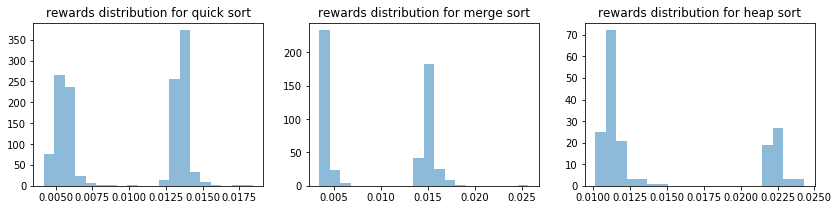

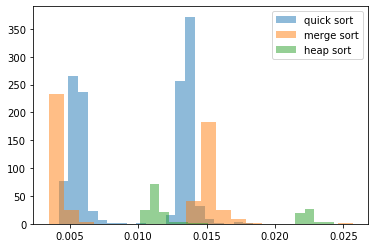

In [143]:
plot_rewards_distribution(arm_rewards_4)
plot_rewards_distribution_together(arm_rewards_4)

Iteration 503
Average rewards per algo {'quick_sort': 0.013408230179022882, 'merge_sort': 0.015564487037051078, 'heap_sort': 0.02235651999981201}
Count per chosen algo {'quick_sort': 391, 'merge_sort': 108, 'heap_sort': 5}


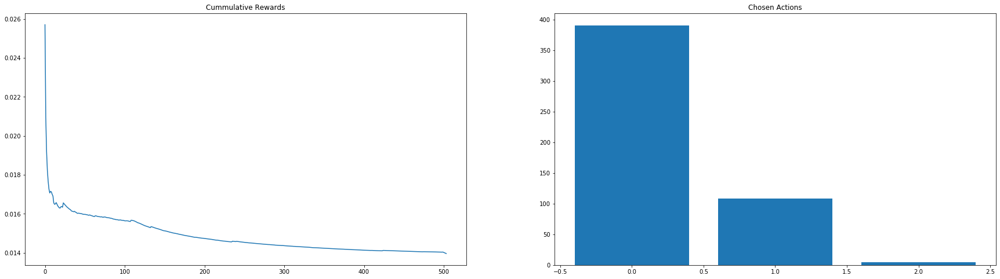

Iteration 628
Average rewards per algo {'quick_sort': 0.012227030921045505, 'merge_sort': 0.012825873239455152, 'heap_sort': 0.012992470967674308}
Count per chosen algo {'quick_sort': 65, 'merge_sort': 34, 'heap_sort': 26}


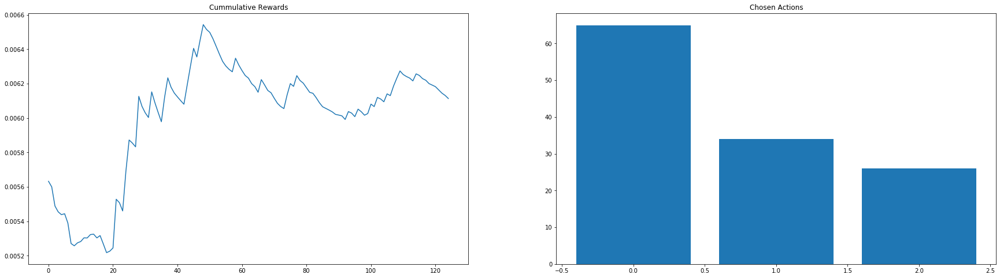

Iteration 1999
Average rewards per algo {'quick_sort': 0.009746314581735502, 'merge_sort': 0.009674436994219325, 'heap_sort': 0.014469384269634166}
Count per chosen algo {'quick_sort': 847, 'merge_sort': 377, 'heap_sort': 147}


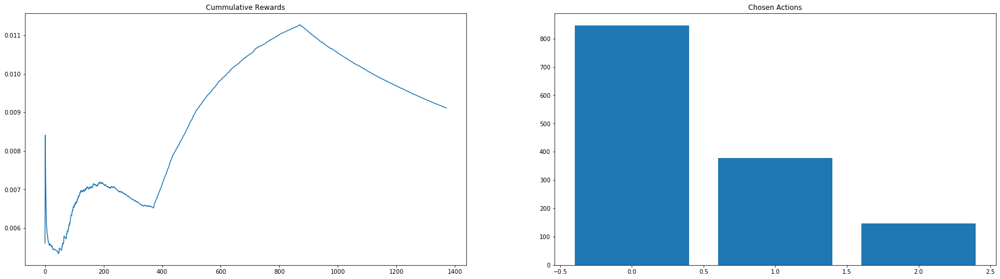

Total reward 20.296


In [131]:
for elem in list_iteration_results_4:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_4,4))

## Five outliers in a row restart the expriment

In [132]:
list_iteration_results_5, total_reward_5, arm_rewards_5 = ts_quantile(list_distributions, n_samples, num_consec_elem=5)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.8693798705093659
Less than two values for merge_sort
merge_sort Theta 0.645314578465443
Less than two values for heap_sort
heap_sort Theta 0.705646421241278


Chosen algorithm is:  merge_sort with reward: 0.021015999999690393
Sample mean is:  0.021015999999690393 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.4668133211973742
Less than two values for merge_sort
merge_sort Theta 0.7380154127412085
Less than two values for heap_sort
heap_sort Theta 0.4217787494492321


Chosen algorithm is:  heap_sort with reward: 0.02808329999970738
Sample mean is:  0.02808329999970738 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.4898977893122387
Less than two values for merge_sort
merge_sort Theta 0.005217226661285546
Less than two values for heap_sort
heap_sort Theta 0.26201012771753607


Chosen algorithm is:  merge_sort with reward: 0.015



Iteration: 28
Less than two values for quick_sort
quick_sort Theta 0.667248948163431
merge_sort Theta 0.01416105777542983
Less than two values for heap_sort
heap_sort Theta 0.6011464739229844


Chosen algorithm is:  merge_sort with reward: 0.017221300000073825
Sample mean is:  0.015599814285743767 Sample variance is: 2.513608783135816e-06


Iteration: 29
Less than two values for quick_sort
quick_sort Theta 0.4170489969614678
merge_sort Theta 0.012912979843205807
Less than two values for heap_sort
heap_sort Theta 0.21827412305020333


Chosen algorithm is:  merge_sort with reward: 0.016091200000118988
Sample mean is:  0.015616758620722223 Sample variance is: 2.4349717118602377e-06


Iteration: 30
Less than two values for quick_sort
quick_sort Theta 0.38536072403121324
merge_sort Theta 0.015241471851415936
Less than two values for heap_sort
heap_sort Theta 0.6993076180190585


Chosen algorithm is:  merge_sort with reward: 0.01624279999987266
Sample mean is:  0.015637626666693903 Sample 



Iteration: 58
Less than two values for quick_sort
quick_sort Theta 0.988730473553579
merge_sort Theta 0.014555279541640128
Less than two values for heap_sort
heap_sort Theta 0.32329789656275754


Chosen algorithm is:  merge_sort with reward: 0.01786309999988589
Sample mean is:  0.015492258620701376 Sample variance is: 1.5855490461093366e-06


Iteration: 59
Less than two values for quick_sort
quick_sort Theta 0.8140221343962866
merge_sort Theta 0.014466524802275362
Less than two values for heap_sort
heap_sort Theta 0.8394013712539533


Chosen algorithm is:  merge_sort with reward: 0.014542700000220066
Sample mean is:  0.015476164406794913 Sample variance is: 1.5736987092969004e-06


Iteration: 60
Less than two values for quick_sort
quick_sort Theta 0.2280731040720383
merge_sort Theta 0.017417774490254726
Less than two values for heap_sort
heap_sort Theta 0.9161613663440689


Chosen algorithm is:  merge_sort with reward: 0.015056900000217865
Sample mean is:  0.015469176666685295 Sample



Iteration: 87
Less than two values for quick_sort
quick_sort Theta 0.05913196618400185
merge_sort Theta 0.01683041928118377
Less than two values for heap_sort
heap_sort Theta 0.5765462910964647


Chosen algorithm is:  merge_sort with reward: 0.017032799999924464
Sample mean is:  0.01536570919541651 Sample variance is: 1.3377382991526186e-06


Iteration: 88
Less than two values for quick_sort
quick_sort Theta 0.6479891419322324
merge_sort Theta 0.015266397392142582
Less than two values for heap_sort
heap_sort Theta 0.17437017086876716


Chosen algorithm is:  merge_sort with reward: 0.015796099999988655
Sample mean is:  0.01537060000001392 Sample variance is: 1.3246177649274137e-06


Iteration: 89
Less than two values for quick_sort
quick_sort Theta 0.7728747917226915
merge_sort Theta 0.01592058838363892
Less than two values for heap_sort
heap_sort Theta 0.6121855075840733


Chosen algorithm is:  merge_sort with reward: 0.014900899999702233
Sample mean is:  0.015365322471920531 Sample 



Chosen algorithm is:  merge_sort with reward: 0.015779900000325142
Sample mean is:  0.015303576521755926 Sample variance is: 1.1597684582792935e-06


Iteration: 118
Less than two values for quick_sort
quick_sort Theta 0.422196625621737
merge_sort Theta 0.01449535138103134
heap_sort Theta 0.04132152983769106


Chosen algorithm is:  merge_sort with reward: 0.014225400000213995
Sample mean is:  0.01529428189657022 Sample variance is: 1.1597053109230276e-06


Iteration: 119
Less than two values for quick_sort
quick_sort Theta 0.7052076786913704
merge_sort Theta 0.0157158386391921
heap_sort Theta 0.032547786365765156


Chosen algorithm is:  merge_sort with reward: 0.014990399999987858
Sample mean is:  0.01529168461540285 Sample variance is: 1.1505758205761933e-06


Iteration: 120
Less than two values for quick_sort
quick_sort Theta 0.4859942718413003
merge_sort Theta 0.015293969522837826
heap_sort Theta 0.061341557243604905


Chosen algorithm is:  merge_sort with reward: 0.013632000000143

Chosen algorithm is:  merge_sort with reward: 0.014759300000150688
Sample mean is:  0.01522286453901799 Sample variance is: 1.0490840448111867e-06


Iteration: 148
Less than two values for quick_sort
quick_sort Theta 0.11640309943893956
merge_sort Theta 0.01378832253377108
heap_sort Theta 0.020502998684574617


Chosen algorithm is:  merge_sort with reward: 0.01516170000013517
Sample mean is:  0.015222433802828676 Sample variance is: 1.0417222892493923e-06


Iteration: 149
Less than two values for quick_sort
quick_sort Theta 0.32437854583044234
merge_sort Theta 0.015522537314678581
heap_sort Theta 0.023926861293667723


Chosen algorithm is:  merge_sort with reward: 0.015086299999893527
Sample mean is:  0.015221481818192766 Sample variance is: 1.034566209009975e-06


Iteration: 150
Less than two values for quick_sort
quick_sort Theta 0.5933113500623888
merge_sort Theta 0.015144054897815592
heap_sort Theta 0.03177261347256586


Chosen algorithm is:  merge_sort with reward: 0.0137785000001

quick_sort Theta 0.49477109238720474
merge_sort Theta 0.015100794513329059
heap_sort Theta 0.0175645773270516


Chosen algorithm is:  merge_sort with reward: 0.015838499999972555
Sample mean is:  0.015168144444452981 Sample variance is: 9.28070211569329e-07


Iteration: 178
Less than two values for quick_sort
quick_sort Theta 0.6459043068865881
merge_sort Theta 0.015257290930655558
heap_sort Theta 0.017547795382699075


Chosen algorithm is:  merge_sort with reward: 0.015210399999887159
Sample mean is:  0.0151683901162869 Sample variance is: 9.22684775170468e-07


Iteration: 179
Less than two values for quick_sort
quick_sort Theta 0.23545398210604307
merge_sort Theta 0.015671298470795614
heap_sort Theta 0.02666239356629335


Chosen algorithm is:  merge_sort with reward: 0.014766899999813177
Sample mean is:  0.015166069364168555 Sample variance is: 9.182777103116088e-07


Iteration: 180
Less than two values for quick_sort
quick_sort Theta 0.09852843080383056
merge_sort Theta 0.0153288335



Iteration: 207
Less than two values for quick_sort
quick_sort Theta 0.2770647112515858
merge_sort Theta 0.014636076824883004
heap_sort Theta 0.028109655784210055


Chosen algorithm is:  merge_sort with reward: 0.014850999999907799
Sample mean is:  0.015128892000004725 Sample variance is: 9.045699006193299e-07


Iteration: 208
Less than two values for quick_sort
quick_sort Theta 0.7631088217744132
merge_sort Theta 0.014733930738501532
heap_sort Theta 0.030576769104361978


Chosen algorithm is:  merge_sort with reward: 0.014654999999947904
Sample mean is:  0.015126534328362652 Sample variance is: 9.011812759694224e-07


Iteration: 209
Less than two values for quick_sort
quick_sort Theta 0.7077340455567889
merge_sort Theta 0.01506804722862991
heap_sort Theta 0.02142848070277776


Chosen algorithm is:  merge_sort with reward: 0.014744099999916216
Sample mean is:  0.015124641089112916 Sample variance is: 8.974404378502333e-07


Iteration: 210
Less than two values for quick_sort
quick_sort

Chosen algorithm is:  merge_sort with reward: 0.014272500000060973
Sample mean is:  0.015074620614036735 Sample variance is: 8.41920817943234e-07


Iteration: 237
Less than two values for quick_sort
quick_sort Theta 0.318958195553286
merge_sort Theta 0.015522969007536712
heap_sort Theta 0.02769634232515259


Chosen algorithm is:  merge_sort with reward: 0.015048300000216841
Sample mean is:  0.015074505676858483 Sample variance is: 8.382473198277388e-07


Iteration: 238
Less than two values for quick_sort
quick_sort Theta 0.39378931349667423
merge_sort Theta 0.014424434553255244
heap_sort Theta 0.025632552613995958


Chosen algorithm is:  merge_sort with reward: 0.01513939999995273
Sample mean is:  0.015074787826089326 Sample variance is: 8.34620996538429e-07


Iteration: 239
Less than two values for quick_sort
quick_sort Theta 0.16747713128748187
merge_sort Theta 0.0151216340045528
heap_sort Theta 0.020506610326924846


Chosen algorithm is:  merge_sort with reward: 0.01481100000000879




Chosen algorithm is:  merge_sort with reward: 0.015316799999709474
Sample mean is:  0.015035156153843533 Sample variance is: 7.791779503042107e-07


Iteration: 269
Less than two values for quick_sort
quick_sort Theta 0.9034015257180785
merge_sort Theta 0.015184273742466104
heap_sort Theta 0.027744332805001902


Chosen algorithm is:  merge_sort with reward: 0.014447799999743438
Sample mean is:  0.015032905747122842 Sample variance is: 7.775093200789939e-07


Iteration: 270
Less than two values for quick_sort
quick_sort Theta 0.8011568813467485
merge_sort Theta 0.014942140820210713
heap_sort Theta 0.02673415429389104


Chosen algorithm is:  merge_sort with reward: 0.014010699999744247
Sample mean is:  0.015029004198468726 Sample variance is: 7.785146906302798e-07


Iteration: 271
Less than two values for quick_sort
quick_sort Theta 0.8676803232128123
merge_sort Theta 0.015356126667398827
heap_sort Theta 0.0178060957163877


Chosen algorithm is:  merge_sort with reward: 0.01456089999965



Chosen algorithm is:  merge_sort with reward: 0.017398499999671913
Sample mean is:  0.015007739999989632 Sample variance is: 7.44972274396615e-07


Iteration: 299
Less than two values for quick_sort
quick_sort Theta 0.3845147400068649
merge_sort Theta 0.014917237925974509
heap_sort Theta 0.02127719849014214


Chosen algorithm is:  merge_sort with reward: 0.014855099999749655
Sample mean is:  0.015007215463906333 Sample variance is: 7.424920222663358e-07


Iteration: 300
Less than two values for quick_sort
quick_sort Theta 0.4658016452497272
merge_sort Theta 0.015234682967263321
heap_sort Theta 0.028962962426636783


Chosen algorithm is:  merge_sort with reward: 0.0139499000001706
Sample mean is:  0.015003594520537376 Sample variance is: 7.437646095545928e-07


Iteration: 301
Less than two values for quick_sort
quick_sort Theta 0.4670527543960026
merge_sort Theta 0.014636870503876702
heap_sort Theta 0.017278179088999476


Chosen algorithm is:  merge_sort with reward: 0.014799800000218



Chosen algorithm is:  merge_sort with reward: 0.017529199999898992
Sample mean is:  0.014982448437490348 Sample variance is: 7.145693230538924e-07


Iteration: 329
Less than two values for quick_sort
quick_sort Theta 0.3369606675833293
merge_sort Theta 0.01569646345033489
heap_sort Theta 0.026240110645122806


Chosen algorithm is:  merge_sort with reward: 0.014213000000381726
Sample mean is:  0.014980051401860726 Sample variance is: 7.141818999355e-07


Iteration: 330
Less than two values for quick_sort
quick_sort Theta 0.0879756193316571
merge_sort Theta 0.014668790115699246
heap_sort Theta 0.02235434484608199


Chosen algorithm is:  merge_sort with reward: 0.014066300000195042
Sample mean is:  0.014977213664588472 Sample variance is: 7.145488773817746e-07


Iteration: 331
Less than two values for quick_sort
quick_sort Theta 0.20043119242023266
merge_sort Theta 0.015154555140464746
heap_sort Theta 0.018082469835235405


Chosen algorithm is:  merge_sort with reward: 0.014077799999995



Chosen algorithm is:  merge_sort with reward: 0.01887960000021849
Sample mean is:  0.014999358857134472 Sample variance is: 8.066631428714348e-07


Iteration: 359
Less than two values for quick_sort
quick_sort Theta 0.9161313564084282
merge_sort Theta 0.014813685207659452
heap_sort Theta 0.019262009796613036


Chosen algorithm is:  merge_sort with reward: 0.015068900000187568
Sample mean is:  0.014999556980049152 Sample variance is: 8.043786957204711e-07


Iteration: 360
Less than two values for quick_sort
quick_sort Theta 0.6617634595103893
merge_sort Theta 0.015174598456532051
heap_sort Theta 0.020266713472346192


Chosen algorithm is:  merge_sort with reward: 0.014797799999996641
Sample mean is:  0.014998983806810367 Sample variance is: 8.022088421454077e-07


Iteration: 361
Less than two values for quick_sort
quick_sort Theta 0.6767902508602271
merge_sort Theta 0.015010202676537661
heap_sort Theta 0.025163946463527553


Chosen algorithm is:  merge_sort with reward: 0.014802199999



Iteration: 389
Less than two values for quick_sort
quick_sort Theta 0.6058686136306439
merge_sort Theta 0.014921407925361415
heap_sort Theta 0.024512890527388274


Chosen algorithm is:  merge_sort with reward: 0.015285100000255625
Sample mean is:  0.014987589238840606 Sample variance is: 7.534297620525256e-07


Iteration: 390
Less than two values for quick_sort
quick_sort Theta 0.7058785245388942
merge_sort Theta 0.014836669480211399
heap_sort Theta 0.014669686320622231


Chosen algorithm is:  heap_sort with reward: 0.021311400000286085
Sample mean is:  0.02279045555547378 Sample variance is: 3.97489918426507e-06


Iteration: 391
Less than two values for quick_sort
quick_sort Theta 0.673236835454831
merge_sort Theta 0.015386597711563865
heap_sort Theta 0.025252763813819544


Chosen algorithm is:  merge_sort with reward: 0.014713099999880797
Sample mean is:  0.014986870680623434 Sample variance is: 7.516541530047613e-07


Iteration: 392
Less than two values for quick_sort
quick_sort T



Iteration: 420
Less than two values for quick_sort
quick_sort Theta 0.6265109259389308
merge_sort Theta 0.014955310365766781
heap_sort Theta 0.02482280646121513


Chosen algorithm is:  merge_sort with reward: 0.015156200000092213
Sample mean is:  0.014975572262768203 Sample variance is: 7.133885389809824e-07


Iteration: 421
Less than two values for quick_sort
quick_sort Theta 0.25591641034423607
merge_sort Theta 0.014715443790905638
heap_sort Theta 0.026781846898156488


Chosen algorithm is:  merge_sort with reward: 0.014803000000028987
Sample mean is:  0.014975153398052816 Sample variance is: 7.117291223849977e-07


Iteration: 422
Less than two values for quick_sort
quick_sort Theta 0.43817737364906995
merge_sort Theta 0.014687874410481173
heap_sort Theta 0.021213656203338337


Chosen algorithm is:  merge_sort with reward: 0.014406299999791372
Sample mean is:  0.014973776029049762 Sample variance is: 7.107874312113671e-07


Iteration: 423
Less than two values for quick_sort
quick_s



Chosen algorithm is:  merge_sort with reward: 0.015608400000019174
Sample mean is:  0.014960297959177154 Sample variance is: 6.759446442317712e-07


Iteration: 451
Less than two values for quick_sort
quick_sort Theta 0.19309497954550225
merge_sort Theta 0.015054753469676663
heap_sort Theta 0.021352506338040457


Chosen algorithm is:  merge_sort with reward: 0.014140199999928882
Sample mean is:  0.014958442533929986 Sample variance is: 6.759335455622523e-07


Iteration: 452
Less than two values for quick_sort
quick_sort Theta 0.5169678808660967
merge_sort Theta 0.015233166681665867
heap_sort Theta 0.027172512670851454


Chosen algorithm is:  merge_sort with reward: 0.01428299999997762
Sample mean is:  0.01495691783295041 Sample variance is: 6.754352593844116e-07


Iteration: 453
Less than two values for quick_sort
quick_sort Theta 0.8281736923227055
merge_sort Theta 0.014891927907660906
heap_sort Theta 0.014394490616837353


Chosen algorithm is:  heap_sort with reward: 0.0227323999997



Iteration: 481
Less than two values for quick_sort
quick_sort Theta 0.9610644153764721
merge_sort Theta 0.014929292567600866
heap_sort Theta 0.024167402931292176


Chosen algorithm is:  merge_sort with reward: 0.014868199999909848
Sample mean is:  0.014941875371544478 Sample variance is: 6.44044631918533e-07


Iteration: 482
Less than two values for quick_sort
quick_sort Theta 0.36577436084793347
merge_sort Theta 0.014741253984309383
heap_sort Theta 0.023328073595730945


Chosen algorithm is:  merge_sort with reward: 0.014943399999992835
Sample mean is:  0.014941878601689496 Sample variance is: 6.426801354940598e-07


Iteration: 483
Less than two values for quick_sort
quick_sort Theta 0.3523217517186952
merge_sort Theta 0.01457718699390175
heap_sort Theta 0.02255085328576281


Chosen algorithm is:  merge_sort with reward: 0.014670800000203599
Sample mean is:  0.014941305496823775 Sample variance is: 6.414764317228631e-07


Iteration: 484
Less than two values for quick_sort
quick_sort



Chosen algorithm is:  quick_sort with reward: 0.006648799999766197
Sample mean is:  0.0068072666666315245 Sample variance is: 9.665484971934151e-06


Iteration: 512
quick_sort Theta -0.03368687472383763
Less than two values for merge_sort
merge_sort Theta 0.7324453811473088
Less than two values for heap_sort
heap_sort Theta 0.20608161277891812


Chosen algorithm is:  quick_sort with reward: 0.004683699999986857
Sample mean is:  0.006503899999968 Sample variance is: 8.836889411170213e-06


Iteration: 513
quick_sort Theta 0.01571689961518215
Less than two values for merge_sort
merge_sort Theta 0.08237548736995659
Less than two values for heap_sort
heap_sort Theta 0.9659496945067233


Chosen algorithm is:  quick_sort with reward: 0.005200799999784067
Sample mean is:  0.006341012499945009 Sample variance is: 7.918004598420118e-06


Iteration: 514
quick_sort Theta 0.0159047385526718
Less than two values for merge_sort
merge_sort Theta 0.5719462842309627
Less than two values for heap_sort


Less than two values for heap_sort
heap_sort Theta 0.0297492807648313


Chosen algorithm is:  quick_sort with reward: 0.006563500000083877
Sample mean is:  0.005482235483830136 Sample variance is: 2.428549688040158e-06


Iteration: 537
quick_sort Theta 0.00491824209313833
Less than two values for merge_sort
merge_sort Theta 0.6140327599817315
Less than two values for heap_sort
heap_sort Theta 0.9152205112236201


Chosen algorithm is:  quick_sort with reward: 0.005779300000085641
Sample mean is:  0.00549151874996312 Sample variance is: 2.3553290602218736e-06


Iteration: 538
quick_sort Theta 0.0067206523564351615
Less than two values for merge_sort
merge_sort Theta 0.1356859859390096
Less than two values for heap_sort
heap_sort Theta 0.8850581901487801


Chosen algorithm is:  quick_sort with reward: 0.005275799999708397
Sample mean is:  0.005484981818137219 Sample variance is: 2.285322859622649e-06


Iteration: 539
quick_sort Theta 0.005193282297380567
Less than two values for merge_sor



Chosen algorithm is:  quick_sort with reward: 0.004937799999879644
Sample mean is:  0.00534479090905403 Sample variance is: 1.517226895720608e-06


Iteration: 562
quick_sort Theta 0.0062572168361288445
merge_sort Theta 0.03549373581041167
Less than two values for heap_sort
heap_sort Theta 0.7222849133420668


Chosen algorithm is:  quick_sort with reward: 0.0045108999997864885
Sample mean is:  0.005329899999959967 Sample variance is: 1.502329212847646e-06


Iteration: 563
quick_sort Theta 0.005703175966755238
merge_sort Theta 0.016480369382378127
Less than two values for heap_sort
heap_sort Theta 0.6095985174106812


Chosen algorithm is:  quick_sort with reward: 0.00502760000017588
Sample mean is:  0.005324596491191825 Sample variance is: 1.4775476834848812e-06


Iteration: 564
quick_sort Theta 0.005166831733784523
merge_sort Theta 0.011840558691795035
Less than two values for heap_sort
heap_sort Theta 0.8691807856478492


Chosen algorithm is:  quick_sort with reward: 0.00469330000032



Chosen algorithm is:  quick_sort with reward: 0.005293799999890325
Sample mean is:  0.00516371882352306 Sample variance is: 1.1021044541904016e-06


Iteration: 595
quick_sort Theta 0.005811943115270148
merge_sort Theta 0.013081083388106788
Less than two values for heap_sort
heap_sort Theta 0.23524684572188803


Chosen algorithm is:  quick_sort with reward: 0.005574000000251544
Sample mean is:  0.005168489534880368 Sample variance is: 1.091223859501074e-06


Iteration: 596
quick_sort Theta 0.00519665604505839
merge_sort Theta 0.01732896751787638
Less than two values for heap_sort
heap_sort Theta 0.2759337845222386


Chosen algorithm is:  quick_sort with reward: 0.005051800000273943
Sample mean is:  0.0051671482758619035 Sample variance is: 1.0788357684331999e-06


Iteration: 597
quick_sort Theta 0.004424201480957156
merge_sort Theta 0.011735716020910818
Less than two values for heap_sort
heap_sort Theta 0.012202234972244708


Chosen algorithm is:  quick_sort with reward: 0.00461830000



Iteration: 621
quick_sort Theta 0.004639893146889523
merge_sort Theta 0.01499300993624681
Less than two values for heap_sort
heap_sort Theta 0.08488529094189057


Chosen algorithm is:  quick_sort with reward: 0.004853500000081112
Sample mean is:  0.005130111607144272 Sample variance is: 8.755969704580006e-07


Iteration: 622
quick_sort Theta 0.004923613650578896
merge_sort Theta 0.013560161125053581
Less than two values for heap_sort
heap_sort Theta 0.9277850165767741


Chosen algorithm is:  quick_sort with reward: 0.00500659999988784
Sample mean is:  0.005129018584071206 Sample variance is: 8.679821310388197e-07


Iteration: 623
quick_sort Theta 0.004733521725963816
merge_sort Theta 0.0128748960108235
Less than two values for heap_sort
heap_sort Theta 0.4779629666741346


Chosen algorithm is:  quick_sort with reward: 0.004917100000056962
Sample mean is:  0.005127159649123713 Sample variance is: 8.607587399190824e-07


Iteration: 624
quick_sort Theta 0.005446100772721783
merge_sort T

Chosen algorithm is:  quick_sort with reward: 0.005282399999941845
Sample mean is:  0.005062150694458169 Sample variance is: 7.220330948232668e-07


Iteration: 655
quick_sort Theta 0.004795016232509101
merge_sort Theta 0.010288827169526135
Less than two values for heap_sort
heap_sort Theta 0.630161930493753


Chosen algorithm is:  quick_sort with reward: 0.004720500000075845
Sample mean is:  0.005059794482772774 Sample variance is: 7.178530058631998e-07


Iteration: 656
quick_sort Theta 0.004506651385296792
merge_sort Theta 0.013648786214757116
Less than two values for heap_sort
heap_sort Theta 0.3414824271082785


Chosen algorithm is:  quick_sort with reward: 0.004925400000047375
Sample mean is:  0.005058873972617121 Sample variance is: 7.130590686004433e-07


Iteration: 657
quick_sort Theta 0.004413778997168716
merge_sort Theta 0.015051485921413641
Less than two values for heap_sort
heap_sort Theta 0.5595811219908852


Chosen algorithm is:  quick_sort with reward: 0.00460570000041116



Chosen algorithm is:  quick_sort with reward: 0.005098399999951653
Sample mean is:  0.005049519886382955 Sample variance is: 6.299152906556555e-07


Iteration: 687
quick_sort Theta 0.005440390463735309
merge_sort Theta 0.012991015340501597
Less than two values for heap_sort
heap_sort Theta 0.045603164327203904


Chosen algorithm is:  quick_sort with reward: 0.005207700000028126
Sample mean is:  0.0050504135593414014 Sample variance is: 6.26497009844396e-07


Iteration: 688
quick_sort Theta 0.005442439422479218
merge_sort Theta 0.01800261832394105
Less than two values for heap_sort
heap_sort Theta 0.9989754124304364


Chosen algorithm is:  quick_sort with reward: 0.005648500000006607
Sample mean is:  0.005053773595524914 Sample variance is: 6.249756659600232e-07


Iteration: 689
quick_sort Theta 0.004806924483632718
merge_sort Theta 0.018584060010522433
Less than two values for heap_sort
heap_sort Theta 0.994076713956691


Chosen algorithm is:  quick_sort with reward: 0.00501130000020



Iteration: 720
quick_sort Theta 0.0046989159784484365
merge_sort Theta 0.016464326713670527
heap_sort Theta 0.033017621611367454


Chosen algorithm is:  quick_sort with reward: 0.005087600000024395
Sample mean is:  0.005022986274529923 Sample variance is: 5.859269967543145e-07


Iteration: 721
quick_sort Theta 0.005226719685906788
merge_sort Theta 0.012220906267884387
heap_sort Theta 0.014364923969251646


Chosen algorithm is:  quick_sort with reward: 0.004547200000160956
Sample mean is:  0.005020665365874465 Sample variance is: 5.841676861476868e-07


Iteration: 722
quick_sort Theta 0.005171622835689673
merge_sort Theta 0.017926857234765132
heap_sort Theta 0.01977554653857904


Chosen algorithm is:  quick_sort with reward: 0.004866799999945215
Sample mean is:  0.005019918446622381 Sample variance is: 5.814462877966226e-07


Iteration: 723
quick_sort Theta 0.004778376274990683
merge_sort Theta 0.014763504252996495
heap_sort Theta 0.022513703562730136


Chosen algorithm is:  quick_sor



Iteration: 753
quick_sort Theta 0.0047856898722503675
merge_sort Theta 0.01819299124144108
heap_sort Theta 0.02362495230430233


Chosen algorithm is:  quick_sort with reward: 0.006057600000076491
Sample mean is:  0.005020802155190174 Sample variance is: 5.821334258921403e-07


Iteration: 754
quick_sort Theta 0.005192292954716702
merge_sort Theta 0.012597097580316416
heap_sort Theta 0.02564160387715053


Chosen algorithm is:  quick_sort with reward: 0.004736899999898014
Sample mean is:  0.00501958369100437 Sample variance is: 5.79979439125097e-07


Iteration: 755
quick_sort Theta 0.004804870929383742
merge_sort Theta 0.013769302700375366
heap_sort Theta 0.02819851032734589


Chosen algorithm is:  quick_sort with reward: 0.004730300000119314
Sample mean is:  0.005018347435915118 Sample variance is: 5.778569946218998e-07


Iteration: 756
quick_sort Theta 0.005247315435940705
merge_sort Theta 0.01488519894032691
heap_sort Theta 0.0160924615932363


Chosen algorithm is:  quick_sort with r



Chosen algorithm is:  quick_sort with reward: 0.005410499999925378
Sample mean is:  0.00499411433963171 Sample variance is: 5.455948901265934e-07


Iteration: 787
quick_sort Theta 0.004930049764172984
merge_sort Theta 0.01951377115614237
heap_sort Theta 0.017626921475326237


Chosen algorithm is:  quick_sort with reward: 0.004674299999805953
Sample mean is:  0.0049929120300834925 Sample variance is: 5.439268518032744e-07


Iteration: 788
quick_sort Theta 0.0052910492209960885
merge_sort Theta 0.017710132690486984
heap_sort Theta 0.020060660072941768


Chosen algorithm is:  quick_sort with reward: 0.004734999999982392
Sample mean is:  0.004991946067423938 Sample variance is: 5.421378728897054e-07


Iteration: 789
quick_sort Theta 0.005220316392171652
merge_sort Theta 0.014694991828379404
heap_sort Theta 0.019842161796680868


Chosen algorithm is:  quick_sort with reward: 0.004919900000004418
Sample mean is:  0.004991677238814164 Sample variance is: 5.401342661542458e-07


Iteration: 7

Iteration: 820
quick_sort Theta 0.004875767440272881
merge_sort Theta 0.017253876349530305
heap_sort Theta 0.0077516260494008005


Chosen algorithm is:  quick_sort with reward: 0.006350199999815231
Sample mean is:  0.004970984459469713 Sample variance is: 5.2303366056111e-07


Iteration: 821
quick_sort Theta 0.004987216237806872
merge_sort Theta 0.01669401633246872
heap_sort Theta 0.008522573770581523


Chosen algorithm is:  quick_sort with reward: 0.00482929999998305
Sample mean is:  0.004970507407417569 Sample variance is: 5.213399677484393e-07


Iteration: 822
quick_sort Theta 0.005167558453838369
merge_sort Theta 0.011512649714670874
heap_sort Theta 0.016942229102853472


Chosen algorithm is:  quick_sort with reward: 0.00390930000003209
Sample mean is:  0.004966946308735068 Sample variance is: 5.233568876458925e-07


Iteration: 823
quick_sort Theta 0.005208827579596031
merge_sort Theta 0.01634151266692579
heap_sort Theta 0.015970723371194213


Chosen algorithm is:  quick_sort with 

merge_sort Theta 0.01400069827720687
heap_sort Theta 0.00461853964954821


Chosen algorithm is:  heap_sort with reward: 0.01149600000007922
Sample mean is:  0.015085767857125834 Sample variance is: 3.4301446539922676e-05


Iteration: 854
quick_sort Theta 0.005368647224331326
merge_sort Theta 0.01552139348111362
heap_sort Theta 0.016633392058844676


Chosen algorithm is:  quick_sort with reward: 0.004416000000219356
Sample mean is:  0.004953731595106474 Sample variance is: 5.017410266909581e-07


Iteration: 855
quick_sort Theta 0.004748097999515075
merge_sort Theta 0.012657975847288932
heap_sort Theta 0.02160323634791607


Chosen algorithm is:  quick_sort with reward: 0.004659199999878183
Sample mean is:  0.0049528308868641855 Sample variance is: 5.004711262226442e-07


Iteration: 856
quick_sort Theta 0.004864691411468013
merge_sort Theta 0.010772027107153054
heap_sort Theta 0.016087373861581062


Chosen algorithm is:  quick_sort with reward: 0.005095099999834929
Sample mean is:  0.0049



Chosen algorithm is:  quick_sort with reward: 0.005016100000375445
Sample mean is:  0.004949450000017402 Sample variance is: 4.808076965258963e-07


Iteration: 884
quick_sort Theta 0.004913405491720965
merge_sort Theta 0.012027610751754124
heap_sort Theta 0.00864210619303344


Chosen algorithm is:  quick_sort with reward: 0.004552999999759777
Sample mean is:  0.004948326912197975 Sample variance is: 4.798896219027009e-07


Iteration: 885
quick_sort Theta 0.004959141358411788
merge_sort Theta 0.014124795411726695
heap_sort Theta 0.022141107015396986


Chosen algorithm is:  quick_sort with reward: 0.004694799999924726
Sample mean is:  0.00494761073447969 Sample variance is: 4.787150589168777e-07


Iteration: 886
quick_sort Theta 0.004723533203927216
merge_sort Theta 0.024757981022394713
heap_sort Theta 0.007449327498801859


Chosen algorithm is:  quick_sort with reward: 0.004731600000013714
Sample mean is:  0.004947002253537532 Sample variance is: 4.774976339593351e-07


Iteration: 887


Iteration: 917
quick_sort Theta 0.004944484525553167
merge_sort Theta 0.008786745728904005
heap_sort Theta 0.019073998945591808


Chosen algorithm is:  quick_sort with reward: 0.005226900000252499
Sample mean is:  0.004969181770846376 Sample variance is: 5.134226421610704e-07


Iteration: 918
quick_sort Theta 0.005005812131317366
merge_sort Theta 0.013409133785785251
heap_sort Theta 0.015018745178643548


Chosen algorithm is:  quick_sort with reward: 0.004891099999895232
Sample mean is:  0.004968978961051697 Sample variance is: 5.121048714728781e-07


Iteration: 919
quick_sort Theta 0.004815234646924558
merge_sort Theta 0.014294007716660333
heap_sort Theta 0.01733670993506905


Chosen algorithm is:  quick_sort with reward: 0.00568020000036995
Sample mean is:  0.004970821502604335 Sample variance is: 5.120852342733392e-07


Iteration: 920
quick_sort Theta 0.004650200835986334
merge_sort Theta 0.010040948532986614
heap_sort Theta 0.01658762570056051


Chosen algorithm is:  quick_sort wi



Chosen algorithm is:  quick_sort with reward: 0.005422899999757647
Sample mean is:  0.0049718897129310425 Sample variance is: 4.98842574652449e-07


Iteration: 954
quick_sort Theta 0.005097763116934197
merge_sort Theta 0.006255963302661495
heap_sort Theta 0.0030814872452035943


Chosen algorithm is:  heap_sort with reward: 0.01068859999986671
Sample mean is:  0.01425109142857244 Sample variance is: 3.0327606373751273e-05


Iteration: 955
quick_sort Theta 0.005059688850900651
merge_sort Theta 0.014636030213147092
heap_sort Theta 0.008696752974044732


Chosen algorithm is:  quick_sort with reward: 0.00391540000009627
Sample mean is:  0.0049693682577691455 Sample variance is: 5.003095532854642e-07


Iteration: 956
quick_sort Theta 0.0049012877606486194
merge_sort Theta 0.014785498263849563
heap_sort Theta 0.015464721371633482


Chosen algorithm is:  quick_sort with reward: 0.004481599999962782
Sample mean is:  0.0049682069047743685 Sample variance is: 4.99683462449538e-07


Iteration: 9



Chosen algorithm is:  quick_sort with reward: 0.007022700000106852
Sample mean is:  0.004978097091733875 Sample variance is: 4.965937132991593e-07


Iteration: 984
quick_sort Theta 0.005128120758943521
merge_sort Theta 0.013931910029234714
heap_sort Theta 0.025398837405312104


Chosen algorithm is:  quick_sort with reward: 0.006177799999932176
Sample mean is:  0.004980775000011103 Sample variance is: 4.986907683444545e-07


Iteration: 985
quick_sort Theta 0.0049565441800128425
merge_sort Theta 0.011767018731771701
heap_sort Theta 0.01653051093083588


Chosen algorithm is:  quick_sort with reward: 0.005651200000102108
Sample mean is:  0.0049822681514589675 Sample variance is: 4.985789150400957e-07


Iteration: 986
quick_sort Theta 0.004789748482466041
merge_sort Theta 0.024525005385248756
heap_sort Theta 0.004833714648569571


Chosen algorithm is:  quick_sort with reward: 0.0043228999998063955
Sample mean is:  0.004980802888899739 Sample variance is: 4.984349623665587e-07


Iteration:



Chosen algorithm is:  quick_sort with reward: 0.013718400000016118
Sample mean is:  0.005217529809738201 Sample variance is: 2.7251138564926867e-06


Iteration: 1012
quick_sort Theta 0.0050688908625255704
Less than two values for merge_sort
merge_sort Theta 0.05425140058410971
Less than two values for heap_sort
heap_sort Theta 0.7859873114248052


Chosen algorithm is:  quick_sort with reward: 0.013466299999890907
Sample mean is:  0.005234932278493797 Sample variance is: 2.8626107907288734e-06


Iteration: 1013
quick_sort Theta 0.008040557801992285
Less than two values for merge_sort
merge_sort Theta 0.9193748921385742
Less than two values for heap_sort
heap_sort Theta 0.19631590102324425


Chosen algorithm is:  quick_sort with reward: 0.013940599999841652
Sample mean is:  0.005253260000012424 Sample variance is: 3.0158033899502608e-06


Iteration: 1014
quick_sort Theta 0.0064679486759238475
Less than two values for merge_sort
merge_sort Theta 0.03318030192292398
Less than two values 

quick_sort Theta 0.0060240765636590775
Less than two values for merge_sort
merge_sort Theta 0.9138931373716088
Less than two values for heap_sort
heap_sort Theta 0.7624814319948446


Chosen algorithm is:  quick_sort with reward: 0.017150300000139396
Sample mean is:  0.005719480482909403 Sample variance is: 7.753020658199679e-06


Iteration: 1036
quick_sort Theta 0.007585075330167862
Less than two values for merge_sort
merge_sort Theta 0.670800818512005
Less than two values for heap_sort
heap_sort Theta 0.6609684123298569


Chosen algorithm is:  quick_sort with reward: 0.016576500000155647
Sample mean is:  0.005741281726919938 Sample variance is: 7.973673581107195e-06


Iteration: 1037
quick_sort Theta 0.006152146207214809
Less than two values for merge_sort
merge_sort Theta 0.6162941711191608
Less than two values for heap_sort
heap_sort Theta 0.8421709910445998


Chosen algorithm is:  quick_sort with reward: 0.015397599999687372
Sample mean is:  0.0057606330661439204 Sample variance is

Sample mean is:  0.014708062912617148 Sample variance is: 3.7182282231111835e-06


Iteration: 1060
Less than two values for quick_sort
quick_sort Theta 0.7001821036313338
merge_sort Theta 0.013740787259983478
Less than two values for heap_sort
heap_sort Theta 0.3620156025525826


Chosen algorithm is:  merge_sort with reward: 0.01881600000024264
Sample mean is:  0.014716024031004018 Sample variance is: 3.743662748536178e-06


Iteration: 1061
Less than two values for quick_sort
quick_sort Theta 0.5746258321233781
merge_sort Theta 0.02172779326338476
Less than two values for heap_sort
heap_sort Theta 0.5205442196614486


Chosen algorithm is:  merge_sort with reward: 0.017064099999970495
Sample mean is:  0.014720565764019427 Sample variance is: 3.7470653281751542e-06


Iteration: 1062
Less than two values for quick_sort
quick_sort Theta 0.566116249791079
merge_sort Theta 0.016625069438914668
Less than two values for heap_sort
heap_sort Theta 0.6846174802496515


Chosen algorithm is:  merge



Iteration: 1086
Less than two values for quick_sort
quick_sort Theta 0.7965137664594432
merge_sort Theta 0.01466321272658916
heap_sort Theta 0.037248252859110875


Chosen algorithm is:  merge_sort with reward: 0.01594199999999546
Sample mean is:  0.014731033148144787 Sample variance is: 3.601678103516857e-06


Iteration: 1087
Less than two values for quick_sort
quick_sort Theta 0.4110830431608634
merge_sort Theta 0.013131896774704282
heap_sort Theta 0.01650846863768446


Chosen algorithm is:  merge_sort with reward: 0.015065600000070845
Sample mean is:  0.014731651571161287 Sample variance is: 3.595227179248926e-06


Iteration: 1088
Less than two values for quick_sort
quick_sort Theta 0.2226157725330803
merge_sort Theta 0.013717677092078717
heap_sort Theta 0.014631302899109312


Chosen algorithm is:  merge_sort with reward: 0.014061500000025262
Sample mean is:  0.014730415129148121 Sample variance is: 3.5894209935394957e-06


Iteration: 1089
Less than two values for quick_sort
quick_



Chosen algorithm is:  heap_sort with reward: 0.02389599999969505
Sample mean is:  0.01678103962264154 Sample variance is: 3.4303059399185874e-05


Iteration: 1118
Less than two values for quick_sort
quick_sort Theta 0.9113400712917866
merge_sort Theta 0.014377764517535299
heap_sort Theta 0.016314234624509715


Chosen algorithm is:  merge_sort with reward: 0.014166200000090612
Sample mean is:  0.014739185431651697 Sample variance is: 3.5166318655644185e-06


Iteration: 1119
Less than two values for quick_sort
quick_sort Theta 0.7675361997260384
merge_sort Theta 0.014769348486762887
heap_sort Theta 0.01166661649608445


Chosen algorithm is:  heap_sort with reward: 0.022026800000276126
Sample mean is:  0.016878183333338476 Sample variance is: 3.4167973286442624e-05


Iteration: 1120
Less than two values for quick_sort
quick_sort Theta 0.40655543085328993
merge_sort Theta 0.013270053298480147
heap_sort Theta 0.02825154066224825


Chosen algorithm is:  merge_sort with reward: 0.0139727000



Chosen algorithm is:  merge_sort with reward: 0.015413699999953678
Sample mean is:  0.014746212456744635 Sample variance is: 3.395079805973578e-06


Iteration: 1150
Less than two values for quick_sort
quick_sort Theta 0.9167125281549564
merge_sort Theta 0.01637727246878902
heap_sort Theta 0.020913646344475848


Chosen algorithm is:  merge_sort with reward: 0.014932700000372279
Sample mean is:  0.014746534542312213 Sample variance is: 3.3892760714882734e-06


Iteration: 1151
Less than two values for quick_sort
quick_sort Theta 0.04706112661971951
merge_sort Theta 0.015968656765544507
heap_sort Theta 0.021878663325280375


Chosen algorithm is:  merge_sort with reward: 0.014675500000066677
Sample mean is:  0.014746412068963512 Sample variance is: 3.383441176893214e-06


Iteration: 1152
Less than two values for quick_sort
quick_sort Theta 0.8451767177231649
merge_sort Theta 0.013961420664526398
heap_sort Theta 0.023700088229744967


Chosen algorithm is:  merge_sort with reward: 0.0142354



Iteration: 1184
quick_sort Theta 0.0036666642902298467
merge_sort Theta 0.01508534333910375
heap_sort Theta 0.019911670354429912


Chosen algorithm is:  quick_sort with reward: 0.012989800000013929
Sample mean is:  0.006306146067427005 Sample variance is: 1.1997545152367147e-05


Iteration: 1185
quick_sort Theta 0.0069571549467039515
merge_sort Theta 0.014360619209422339
heap_sort Theta 0.02085378760517357


Chosen algorithm is:  quick_sort with reward: 0.013156799999705981
Sample mean is:  0.006318951028048088 Sample variance is: 1.2062678221140332e-05


Iteration: 1186
quick_sort Theta 0.0032227973941449063
merge_sort Theta 0.014342805503892862
heap_sort Theta 0.01704185087530874


Chosen algorithm is:  quick_sort with reward: 0.01315149999982168
Sample mean is:  0.006331698320905874 Sample variance is: 1.2127107233692262e-05


Iteration: 1187
quick_sort Theta 0.011169961028250724
merge_sort Theta 0.01490374766178763
heap_sort Theta 0.025905723530001645


Chosen algorithm is:  quic



Iteration: 1219
quick_sort Theta 0.008101963278079768
merge_sort Theta 0.015224415352314087
heap_sort Theta 0.01895171111738549


Chosen algorithm is:  quick_sort with reward: 0.012709400000403548
Sample mean is:  0.006707235097014801 Sample variance is: 1.3910795326601177e-05


Iteration: 1220
quick_sort Theta 0.008614335355990375
merge_sort Theta 0.014491384413852395
heap_sort Theta 0.01371516226154098


Chosen algorithm is:  quick_sort with reward: 0.012524600000233477
Sample mean is:  0.006717476936633144 Sample variance is: 1.3945780112819943e-05


Iteration: 1221
quick_sort Theta 0.005844525580565805
merge_sort Theta 0.014032658497418018
heap_sort Theta 0.006041585896328671


Chosen algorithm is:  quick_sort with reward: 0.013209400000050664
Sample mean is:  0.006728886291753386 Sample variance is: 1.3995209315443613e-05


Iteration: 1222
quick_sort Theta 0.006875004521842734
merge_sort Theta 0.014221454155742472
heap_sort Theta 0.01752771948292749


Chosen algorithm is:  quick

quick_sort Theta 0.00826056112782448
merge_sort Theta 0.014784790554510971
heap_sort Theta 0.01176100835820397


Chosen algorithm is:  quick_sort with reward: 0.016280899999856047
Sample mean is:  0.007079356688974717 Sample variance is: 1.5838535835896954e-05


Iteration: 1253
quick_sort Theta 0.005713783998795054
merge_sort Theta 0.015685467320680838
heap_sort Theta 0.023820895046244645


Chosen algorithm is:  quick_sort with reward: 0.013382899999669462
Sample mean is:  0.007089880133566862 Sample variance is: 1.587831845266681e-05


Iteration: 1254
quick_sort Theta 0.007555018342162865
merge_sort Theta 0.014900898767159875
heap_sort Theta 0.024078825955069817


Chosen algorithm is:  quick_sort with reward: 0.013255100000151288
Sample mean is:  0.007100155500011169 Sample variance is: 1.5915098898762344e-05


Iteration: 1255
quick_sort Theta 0.007453282327567019
merge_sort Theta 0.015400452457366058
heap_sort Theta 0.018590509765521027


Chosen algorithm is:  quick_sort with reward:


Iteration: 1286
quick_sort Theta 0.00611732878075973
merge_sort Theta 0.013653550672957227
heap_sort Theta 0.011814757570855606


Chosen algorithm is:  quick_sort with reward: 0.01388859999997294
Sample mean is:  0.0074127771428677425 Sample variance is: 1.7156322375396126e-05


Iteration: 1287
quick_sort Theta 0.00848647766391707
merge_sort Theta 0.01513596267146618
heap_sort Theta 0.01190395116138098


Chosen algorithm is:  quick_sort with reward: 0.015290400000139925
Sample mean is:  0.007425261489709695 Sample variance is: 1.722732439208389e-05


Iteration: 1288
quick_sort Theta 0.00597790078035752
merge_sort Theta 0.014703117185274133
heap_sort Theta 0.018302755699078434


Chosen algorithm is:  quick_sort with reward: 0.015158500000325148
Sample mean is:  0.00743749762659358 Sample variance is: 1.7294541209338654e-05


Iteration: 1289
quick_sort Theta 0.00390991203256834
merge_sort Theta 0.01544348338360246
heap_sort Theta 0.013821222575710643


Chosen algorithm is:  quick_sort w



Chosen algorithm is:  quick_sort with reward: 0.016381299999920884
Sample mean is:  0.007755218608180424 Sample variance is: 1.8802174064683623e-05


Iteration: 1318
quick_sort Theta 0.009162648296387983
merge_sort Theta 0.014241506879692441
heap_sort Theta 0.02728453344195467


Chosen algorithm is:  quick_sort with reward: 0.01360240000030899
Sample mean is:  0.007764051208470648 Sample variance is: 1.8825339790290435e-05


Iteration: 1319
quick_sort Theta 0.0057699578627271875
merge_sort Theta 0.014349665274927956
heap_sort Theta 0.022813540260363023


Chosen algorithm is:  quick_sort with reward: 0.013046399999893765
Sample mean is:  0.007772018552047456 Sample variance is: 1.8838968421777985e-05


Iteration: 1320
quick_sort Theta 0.004235630852843002
merge_sort Theta 0.015516326027203394
heap_sort Theta 0.02155015743552037


Chosen algorithm is:  quick_sort with reward: 0.013046500000200467
Sample mean is:  0.007779962048204313 Sample variance is: 1.8852431205365365e-05


Iterati



Iteration: 1351
quick_sort Theta 0.009098007878605733
merge_sort Theta 0.014937216046982442
heap_sort Theta 0.016393019278096693


Chosen algorithm is:  quick_sort with reward: 0.01707829999986643
Sample mean is:  0.008067825360244215 Sample variance is: 1.9990490936573183e-05


Iteration: 1352
quick_sort Theta 0.008811001530293523
merge_sort Theta 0.012804733101117247
heap_sort Theta 0.029098097807913413


Chosen algorithm is:  quick_sort with reward: 0.01478830000041853
Sample mean is:  0.008077495107927919 Sample variance is: 2.0026619430326518e-05


Iteration: 1353
quick_sort Theta 0.00861603151368455
merge_sort Theta 0.015732056797328926
heap_sort Theta 0.014129731821686146


Chosen algorithm is:  quick_sort with reward: 0.012998000000152388
Sample mean is:  0.008084564798865023 Sample variance is: 2.0032582020147257e-05


Iteration: 1354
quick_sort Theta 0.006765689950092163
merge_sort Theta 0.013439387908222761
heap_sort Theta 0.016586228098024413


Chosen algorithm is:  quick



Iteration: 1383
quick_sort Theta 0.008789724530653232
merge_sort Theta 0.015595317768705695
heap_sort Theta 0.02517318155371511


Chosen algorithm is:  quick_sort with reward: 0.015006899999661982
Sample mean is:  0.008353639118470486 Sample variance is: 2.0949340656211544e-05


Iteration: 1384
quick_sort Theta 0.01088589422054682
merge_sort Theta 0.014881109846654856
heap_sort Theta 0.014380548095245879


Chosen algorithm is:  quick_sort with reward: 0.013174499999877298
Sample mean is:  0.008360270288871322 Sample variance is: 2.095244848431565e-05


Iteration: 1385
quick_sort Theta 0.005441256814935566
merge_sort Theta 0.013699303190639386
heap_sort Theta 0.022116853269838584


Chosen algorithm is:  quick_sort with reward: 0.012495100000251114
Sample mean is:  0.008365950000013327 Sample variance is: 2.0947120027748904e-05


Iteration: 1386
quick_sort Theta 0.011076907596843528
merge_sort Theta 0.013508411152935525
heap_sort Theta 0.016694780837083412


Chosen algorithm is:  quick



Chosen algorithm is:  quick_sort with reward: 0.014811100000315491
Sample mean is:  0.008568651052647319 Sample variance is: 2.1008256687786562e-05


Iteration: 1419
quick_sort Theta 0.00757631753837453
merge_sort Theta 0.012715275804131482
heap_sort Theta 0.014295171608955081


Chosen algorithm is:  quick_sort with reward: 0.013636399999995774
Sample mean is:  0.008575310381093243 Sample variance is: 2.1014354026683856e-05


Iteration: 1420
quick_sort Theta 0.010698213187451257
merge_sort Theta 0.014931906678152439
heap_sort Theta 0.013616078972549283


Chosen algorithm is:  quick_sort with reward: 0.01316980000001422
Sample mean is:  0.008581339895028834 Sample variance is: 2.10144423184063e-05


Iteration: 1421
quick_sort Theta 0.008836051576572003
merge_sort Theta 0.013550883716652702
heap_sort Theta 0.016441054575995772


Chosen algorithm is:  quick_sort with reward: 0.01337069999999585
Sample mean is:  0.008587616906961951 Sample variance is: 2.1016923923945113e-05


Iteration:



Chosen algorithm is:  quick_sort with reward: 0.014554999999745633
Sample mean is:  0.008798071914371422 Sample variance is: 2.1381066904087353e-05


Iteration: 1454
quick_sort Theta 0.008059276661561967
merge_sort Theta 0.014010208013277141
heap_sort Theta 0.012337810444686305


Chosen algorithm is:  quick_sort with reward: 0.013974299999972573
Sample mean is:  0.008804582893095448 Sample variance is: 2.138783239840074e-05


Iteration: 1455
quick_sort Theta 0.007315598382894391
merge_sort Theta 0.01483205092928928
heap_sort Theta 0.026020206685959058


Chosen algorithm is:  quick_sort with reward: 0.013614700000289304
Sample mean is:  0.008810625753782879 Sample variance is: 2.138999361362555e-05


Iteration: 1456
quick_sort Theta 0.00953605641530323
merge_sort Theta 0.015056852014447897
heap_sort Theta 0.009976557581751824


Chosen algorithm is:  quick_sort with reward: 0.016247499999735737
Sample mean is:  0.008819956838156721 Sample variance is: 2.1432462510533233e-05


Iteration



Chosen algorithm is:  quick_sort with reward: 0.014730099999724189
Sample mean is:  0.008997404715855153 Sample variance is: 2.1538179603542243e-05


Iteration: 1488
quick_sort Theta 0.010743337730701095
merge_sort Theta 0.014305584539619871
heap_sort Theta 0.020380185194035613


Chosen algorithm is:  quick_sort with reward: 0.0127399000002697
Sample mean is:  0.009001924637696234 Sample variance is: 2.1529062665817786e-05


Iteration: 1489
quick_sort Theta 0.009207456424837921
merge_sort Theta 0.01366199107497958
heap_sort Theta 0.01856538895730272


Chosen algorithm is:  quick_sort with reward: 0.012213599999995495
Sample mean is:  0.009005798793742434 Sample variance is: 2.1515520269479377e-05


Iteration: 1490
quick_sort Theta 0.009820223642921275
merge_sort Theta 0.01641316185389945
heap_sort Theta 0.016957293829404366


Chosen algorithm is:  quick_sort with reward: 0.012794100000064645
Sample mean is:  0.009010363012063304 Sample variance is: 2.1506867757583678e-05


Iteration:



Chosen algorithm is:  quick_sort with reward: 0.00584549999985029
Sample mean is:  0.008981902105276877 Sample variance is: 2.1316692981509687e-05


Iteration: 1518
quick_sort Theta 0.009967612998819432
merge_sort Theta 0.012903555693816984
heap_sort Theta 0.019754907589138688


Chosen algorithm is:  quick_sort with reward: 0.005502100000740029
Sample mean is:  0.00897783691590242 Sample variance is: 2.1305919831568905e-05


Iteration: 1519
quick_sort Theta 0.008211648157589424
merge_sort Theta 0.016624703589419115
heap_sort Theta 0.02574163503788953


Chosen algorithm is:  quick_sort with reward: 0.004736599999887403
Sample mean is:  0.008972887981344642 Sample variance is: 2.130202389357854e-05


Iteration: 1520
quick_sort Theta 0.01044199556049773
merge_sort Theta 0.013578779603675569
heap_sort Theta 0.008202162438303576


Chosen algorithm is:  heap_sort with reward: 0.0110290000002351
Sample mean is:  0.018198543421039846 Sample variance is: 3.200741936184549e-05


Iteration: 152



Chosen algorithm is:  quick_sort with reward: 0.006340099999761151
Sample mean is:  0.008868010633496785 Sample variance is: 2.1004520915611008e-05


Iteration: 1548
quick_sort Theta 0.009319236068640291
merge_sort Theta 0.013547167117791801
heap_sort Theta 0.01961708599657876


Chosen algorithm is:  quick_sort with reward: 0.005179099999622849
Sample mean is:  0.008863842372893537 Sample variance is: 2.0996145960140083e-05


Iteration: 1549
quick_sort Theta 0.009116320964397323
merge_sort Theta 0.015087615712339068
heap_sort Theta 0.017949645946205846


Chosen algorithm is:  quick_sort with reward: 0.005298199999742792
Sample mean is:  0.008859817945835806 Sample variance is: 2.098678175010106e-05


Iteration: 1550
quick_sort Theta 0.00912658495769048
merge_sort Theta 0.015002323935446534
heap_sort Theta 0.016787267634712985


Chosen algorithm is:  quick_sort with reward: 0.005253600000287406
Sample mean is:  0.008855752311173406 Sample variance is: 2.0977766377559927e-05


Iteratio



Iteration: 1579
quick_sort Theta 0.007786544904562012
merge_sort Theta 0.015579391926948046
heap_sort Theta 0.017326624791661104


Chosen algorithm is:  quick_sort with reward: 0.004880100000264065
Sample mean is:  0.008744910152851375 Sample variance is: 2.069385310169425e-05


Iteration: 1580
quick_sort Theta 0.009373672942333095
merge_sort Theta 0.016100228284942227
heap_sort Theta 0.009426388713544703


Chosen algorithm is:  quick_sort with reward: 0.00548979999985022
Sample mean is:  0.008741360414407536 Sample variance is: 2.0682828384373453e-05


Iteration: 1581
quick_sort Theta 0.00960200052293014
merge_sort Theta 0.014648376113258095
heap_sort Theta 0.024876630865365755


Chosen algorithm is:  quick_sort with reward: 0.005401999999776308
Sample mean is:  0.008737722766897044 Sample variance is: 2.067243225384876e-05


Iteration: 1582
quick_sort Theta 0.008183916171270443
merge_sort Theta 0.015212390524947045
heap_sort Theta 0.01718648251185417


Chosen algorithm is:  quick_s



Chosen algorithm is:  quick_sort with reward: 0.007770800000798772
Sample mean is:  0.008636467194105919 Sample variance is: 2.034155308806851e-05


Iteration: 1612
quick_sort Theta 0.00932874259859042
merge_sort Theta 0.014368914337328998
heap_sort Theta 0.023479434144795367


Chosen algorithm is:  quick_sort with reward: 0.00517039999976987
Sample mean is:  0.00863281485775783 Sample variance is: 2.0332764267693783e-05


Iteration: 1613
quick_sort Theta 0.0077347952199758735
merge_sort Theta 0.015387878376794476
heap_sort Theta 0.021197193158025648


Chosen algorithm is:  quick_sort with reward: 0.005345100000340608
Sample mean is:  0.008629354105276339 Sample variance is: 2.032272734848182e-05


Iteration: 1614
quick_sort Theta 0.010921881622456914
merge_sort Theta 0.015539036514871726
heap_sort Theta 0.02417631077825258


Chosen algorithm is:  quick_sort with reward: 0.0054995999998936895
Sample mean is:  0.008626063091495705 Sample variance is: 2.031164673160252e-05


Iteration:

quick_sort Theta 0.008383266342378216
merge_sort Theta 0.014552155340141279
heap_sort Theta 0.013139836115307089


Chosen algorithm is:  quick_sort with reward: 0.006391899999471207
Sample mean is:  0.008537451533752639 Sample variance is: 2.003250822349757e-05


Iteration: 1642
quick_sort Theta 0.009409778234065832
merge_sort Theta 0.014176088078272206
heap_sort Theta 0.013944007212513754


Chosen algorithm is:  quick_sort with reward: 0.005793500000436325
Sample mean is:  0.008534648723197667 Sample variance is: 2.0019728929337588e-05


Iteration: 1643
quick_sort Theta 0.007570005575010493
merge_sort Theta 0.015242764997194565
heap_sort Theta 0.01987736856342276


Chosen algorithm is:  quick_sort with reward: 0.007108299999345036
Sample mean is:  0.008533193265316185 Sample variance is: 2.000137450664596e-05


Iteration: 1644
quick_sort Theta 0.010498341170750955
merge_sort Theta 0.014047112348010895
heap_sort Theta 0.02556703579144476


Chosen algorithm is:  quick_sort with reward: 



Iteration: 1676
quick_sort Theta 0.009094648366728283
merge_sort Theta 0.016129508154828467
heap_sort Theta 0.023833005776476568


Chosen algorithm is:  quick_sort with reward: 0.00522980000005191
Sample mean is:  0.008448538993102595 Sample variance is: 1.9585834264185437e-05


Iteration: 1677
quick_sort Theta 0.010042622737112612
merge_sort Theta 0.015819461704378812
heap_sort Theta 0.009976405364363772


Chosen algorithm is:  heap_sort with reward: 0.011186900000211608
Sample mean is:  0.018107483116873244 Sample variance is: 3.222192899452589e-05


Iteration: 1678
quick_sort Theta 0.006740611839945967
merge_sort Theta 0.01583158051578943
heap_sort Theta 0.012877065755653488


Chosen algorithm is:  quick_sort with reward: 0.005446500000289234
Sample mean is:  0.008445578402379899 Sample variance is: 1.957539788947281e-05


Iteration: 1679
quick_sort Theta 0.006751726993804416
merge_sort Theta 0.015778547462585512
heap_sort Theta 0.02867643886234469


Chosen algorithm is:  quick_so

Sample mean is:  0.0083707581172106 Sample variance is: 1.9284933963407488e-05


Iteration: 1707
quick_sort Theta 0.0075081854835568895
merge_sort Theta 0.013343950032226165
heap_sort Theta 0.01797049357999471


Chosen algorithm is:  quick_sort with reward: 0.005344999999579159
Sample mean is:  0.008367854318633218 Sample variance is: 1.9275204109310455e-05


Iteration: 1708
quick_sort Theta 0.00944666159255116
merge_sort Theta 0.013865600563152352
heap_sort Theta 0.01447913536802458


Chosen algorithm is:  quick_sort with reward: 0.005554200000005949
Sample mean is:  0.008365156663485925 Sample variance is: 1.9264306560169862e-05


Iteration: 1709
quick_sort Theta 0.00829733245527658
merge_sort Theta 0.015275173028858849
heap_sort Theta 0.012931835198750706


Chosen algorithm is:  quick_sort with reward: 0.005547200000364683
Sample mean is:  0.00836245747127987 Sample variance is: 1.925345308027369e-05


Iteration: 1710
quick_sort Theta 0.00828304932594944
merge_sort Theta 0.014346338



Chosen algorithm is:  quick_sort with reward: 0.005997400000524067
Sample mean is:  0.00828690093198264 Sample variance is: 1.894129322685193e-05


Iteration: 1739
quick_sort Theta 0.008799301253991157
merge_sort Theta 0.014786559828015635
heap_sort Theta 0.018941135934864718


Chosen algorithm is:  quick_sort with reward: 0.0058134000000791275
Sample mean is:  0.008284597858489248 Sample variance is: 1.8929348363703743e-05


Iteration: 1740
quick_sort Theta 0.009481977642072231
merge_sort Theta 0.01569533225801888
heap_sort Theta 0.013043322521116313


Chosen algorithm is:  quick_sort with reward: 0.0056450000001859735
Sample mean is:  0.008282142418621059 Sample variance is: 1.891821501218378e-05


Iteration: 1741
quick_sort Theta 0.007007726808132574
merge_sort Theta 0.01414910014822801
heap_sort Theta 0.015133046823907717


Chosen algorithm is:  quick_sort with reward: 0.005598700000518875
Sample mean is:  0.008279648513028027 Sample variance is: 1.8907319060461686e-05


Iteratio



Chosen algorithm is:  quick_sort with reward: 0.006009899999298796
Sample mean is:  0.008212654718708391 Sample variance is: 1.8650028038320678e-05


Iteration: 1769
quick_sort Theta 0.009527042605227982
merge_sort Theta 0.014445794106348702
heap_sort Theta 0.014297277990528554


Chosen algorithm is:  quick_sort with reward: 0.005707000000256812
Sample mean is:  0.008210383046252859 Sample variance is: 1.863880644766154e-05


Iteration: 1770
quick_sort Theta 0.008093450325103101
merge_sort Theta 0.01254558065155488
heap_sort Theta 0.018186366707996043


Chosen algorithm is:  quick_sort with reward: 0.005622599999696831
Sample mean is:  0.00820803903987011 Sample variance is: 1.8627983756419154e-05


Iteration: 1771
quick_sort Theta 0.009833153203234782
merge_sort Theta 0.014267811050156069
heap_sort Theta 0.01953745592047645


Chosen algorithm is:  quick_sort with reward: 0.005281700000523415
Sample mean is:  0.008205390769246266 Sample variance is: 1.8618868576943195e-05


Iteration



Chosen algorithm is:  quick_sort with reward: 0.005381599999964237
Sample mean is:  0.008142289478354027 Sample variance is: 1.836281346747504e-05


Iteration: 1799
quick_sort Theta 0.008233841408201725
merge_sort Theta 0.015465519260958866
heap_sort Theta 0.012093659292243927


Chosen algorithm is:  quick_sort with reward: 0.005421599999863247
Sample mean is:  0.008139886042418965 Sample variance is: 1.8353125127164115e-05


Iteration: 1800
quick_sort Theta 0.008274205613080248
merge_sort Theta 0.017779788178203675
heap_sort Theta 0.01223222460708463


Chosen algorithm is:  quick_sort with reward: 0.005715400000553927
Sample mean is:  0.008137746160652094 Sample variance is: 1.8342109963286413e-05


Iteration: 1801
quick_sort Theta 0.008586104210404233
merge_sort Theta 0.015417294429785655
heap_sort Theta 0.023218201603587195


Chosen algorithm is:  quick_sort with reward: 0.00588789999983419
Sample mean is:  0.008135762169328622 Sample variance is: 1.8330395002183058e-05


Iteratio

merge_sort Theta 0.014988972917376707
heap_sort Theta 0.013626129161627917


Chosen algorithm is:  quick_sort with reward: 0.006263599999329017
Sample mean is:  0.008072182342822308 Sample variance is: 1.8076563767638182e-05


Iteration: 1829
quick_sort Theta 0.00881792971093828
merge_sort Theta 0.014757393754306743
heap_sort Theta 0.007827378980748341


Chosen algorithm is:  heap_sort with reward: 0.011645300000054704
Sample mean is:  0.0177677061728395 Sample variance is: 3.285708070724389e-05


Iteration: 1830
quick_sort Theta 0.008237067543374832
merge_sort Theta 0.015105618077408437
heap_sort Theta 0.019706035998462147


Chosen algorithm is:  quick_sort with reward: 0.00559979999979987
Sample mean is:  0.008070054647174267 Sample variance is: 1.8066263294493e-05


Iteration: 1831
quick_sort Theta 0.007717926866477081
merge_sort Theta 0.016581631964355078
heap_sort Theta 0.013435724413239356


Chosen algorithm is:  quick_sort with reward: 0.005478600000060396
Sample mean is:  0.008



Chosen algorithm is:  quick_sort with reward: 0.006083500000386266
Sample mean is:  0.008012992346525328 Sample variance is: 1.780520249624544e-05


Iteration: 1859
quick_sort Theta 0.00789079845785069
merge_sort Theta 0.014290318159179246
heap_sort Theta 0.019070883567132428


Chosen algorithm is:  quick_sort with reward: 0.004923499999677006
Sample mean is:  0.008010396134469152 Sample variance is: 1.7798254378167888e-05


Iteration: 1860
quick_sort Theta 0.009018971420488006
merge_sort Theta 0.015342874647475845
heap_sort Theta 0.009605578719240917


Chosen algorithm is:  quick_sort with reward: 0.005015100000491657
Sample mean is:  0.00800788119229117 Sample variance is: 1.7790837091480623e-05


Iteration: 1861
quick_sort Theta 0.008960725531836928
merge_sort Theta 0.015602929596377213
heap_sort Theta 0.015453257735842572


Chosen algorithm is:  quick_sort with reward: 0.005052200000136509
Sample mean is:  0.008005401593975604 Sample variance is: 1.7783234646275987e-05


Iteratio



Iteration: 1890
quick_sort Theta 0.008659322516066166
merge_sort Theta 0.014455508093946703
heap_sort Theta 0.017089828196504193


Chosen algorithm is:  quick_sort with reward: 0.0046844999997119885
Sample mean is:  0.0079467184275329 Sample variance is: 1.7511659177653856e-05


Iteration: 1891
quick_sort Theta 0.007565245512158681
merge_sort Theta 0.015021985301444387
heap_sort Theta 0.017698052233082122


Chosen algorithm is:  quick_sort with reward: 0.005322400000295602
Sample mean is:  0.007944570867445145 Sample variance is: 1.750296012049213e-05


Iteration: 1892
quick_sort Theta 0.008583653844101563
merge_sort Theta 0.013939752201794964
heap_sort Theta 0.021951591047783648


Chosen algorithm is:  quick_sort with reward: 0.0052859000006719725
Sample mean is:  0.007942396974667735 Sample variance is: 1.7494423563658067e-05


Iteration: 1893
quick_sort Theta 0.00838648329652044
merge_sort Theta 0.013539601057764632
heap_sort Theta 0.02401604710660486


Chosen algorithm is:  quick



Iteration: 1921
quick_sort Theta 0.008400575053669795
merge_sort Theta 0.015119034158481507
heap_sort Theta 0.01526476574340494


Chosen algorithm is:  quick_sort with reward: 0.0070490999996764
Sample mean is:  0.00789019496404516 Sample variance is: 1.7231205411384037e-05


Iteration: 1922
quick_sort Theta 0.008933293749070918
merge_sort Theta 0.015114850927828567
heap_sort Theta 0.011763438897854264


Chosen algorithm is:  quick_sort with reward: 0.007726799999545619
Sample mean is:  0.007890064456885015 Sample variance is: 1.72174637749454e-05


Iteration: 1923
quick_sort Theta 0.00808232960602618
merge_sort Theta 0.01539671335466833
heap_sort Theta 0.014715747836459198


Chosen algorithm is:  quick_sort with reward: 0.00652540000010049
Sample mean is:  0.007888975339202027 Sample variance is: 1.7205207876321678e-05


Iteration: 1924
quick_sort Theta 0.007516255868556606
merge_sort Theta 0.015272830880080883
heap_sort Theta 0.016763870652189487


Chosen algorithm is:  quick_sort 



Chosen algorithm is:  quick_sort with reward: 0.006776199999876553
Sample mean is:  0.007841504361385249 Sample variance is: 1.6904634349348806e-05


Iteration: 1956
quick_sort Theta 0.007696595327154607
merge_sort Theta 0.015033916383371869
heap_sort Theta 0.016376332607011476


Chosen algorithm is:  quick_sort with reward: 0.005784399999356538
Sample mean is:  0.007839903501959546 Sample variance is: 1.6894769564035206e-05


Iteration: 1957
quick_sort Theta 0.007902108867034633
merge_sort Theta 0.015871788713676352
heap_sort Theta 0.018953060048624064


Chosen algorithm is:  quick_sort with reward: 0.00570750000042608
Sample mean is:  0.00783824533438448 Sample variance is: 1.6885165239965972e-05


Iteration: 1958
quick_sort Theta 0.00894570610074948
merge_sort Theta 0.014611235730989823
heap_sort Theta 0.017315439954403076


Chosen algorithm is:  quick_sort with reward: 0.005636900000354217
Sample mean is:  0.007836534887349493 Sample variance is: 1.6875807812425256e-05


Iteratio

heap_sort Theta 0.018597458484993223


Chosen algorithm is:  quick_sort with reward: 0.006252999999560416
Sample mean is:  0.007787916362265389 Sample variance is: 1.664602578623761e-05


Iteration: 1987
quick_sort Theta 0.0070662345675152356
merge_sort Theta 0.0144704988391465
heap_sort Theta 0.017209801779794125


Chosen algorithm is:  quick_sort with reward: 0.005619300000034855
Sample mean is:  0.007786267224347343 Sample variance is: 1.6636940839312004e-05


Iteration: 1988
quick_sort Theta 0.008767868471069105
merge_sort Theta 0.015492459606987773
heap_sort Theta 0.021557899807305863


Chosen algorithm is:  quick_sort with reward: 0.005385200000091572
Sample mean is:  0.007784442705179976 Sample variance is: 1.6628676251305097e-05


Iteration: 1989
quick_sort Theta 0.007644320630774432
merge_sort Theta 0.014813267139075147
heap_sort Theta 0.01597870769840512


Chosen algorithm is:  quick_sort with reward: 0.004398500000206695
Sample mean is:  0.007781871753999282 Sample variance 

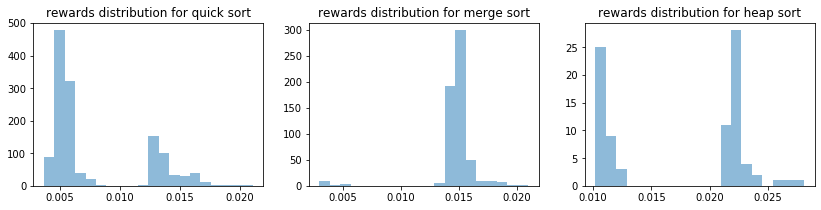

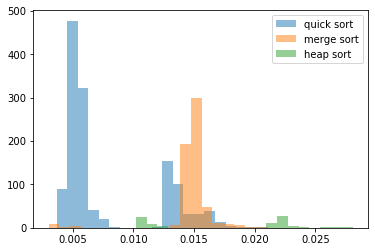

In [144]:
plot_rewards_distribution(arm_rewards_5)
plot_rewards_distribution_together(arm_rewards_5)

Iteration 504
Average rewards per algo {'quick_sort': 0.01362909999988915, 'merge_sort': 0.014825254655866397, 'heap_sort': 0.022784649999903196}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 494, 'heap_sort': 10}


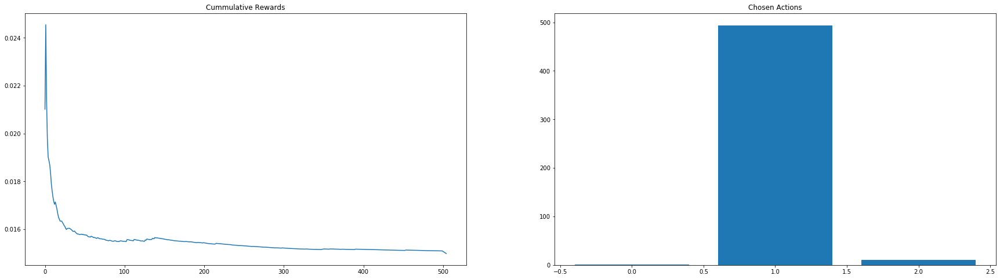

Iteration 1003
Average rewards per algo {'quick_sort': 0.0050649851931444, 'merge_sort': 0.014654495816729871, 'heap_sort': 0.0142032472222253}
Count per chosen algo {'quick_sort': 465, 'merge_sort': 8, 'heap_sort': 26}


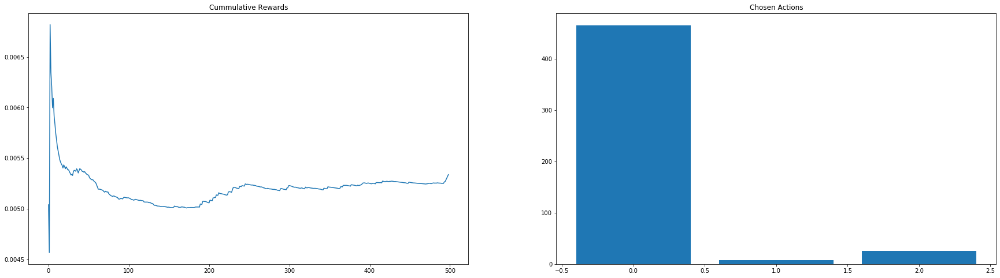

Iteration 1019
Average rewards per algo {'quick_sort': 0.005387352598764946, 'merge_sort': 0.014661943737570675, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 1, 'heap_sort': 0}


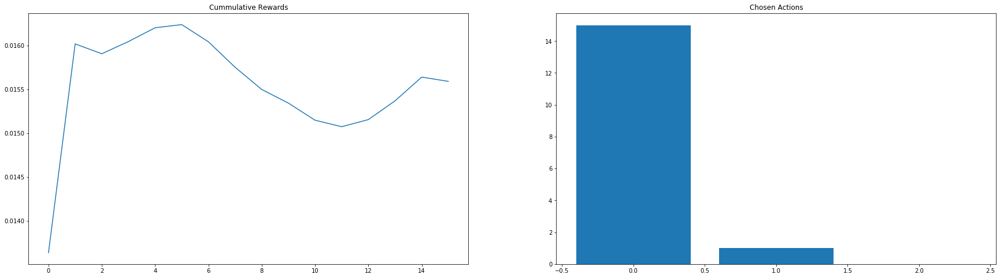

Iteration 1047
Average rewards per algo {'quick_sort': 0.0059467471512888136, 'merge_sort': 0.0, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 28, 'merge_sort': 0, 'heap_sort': 0}


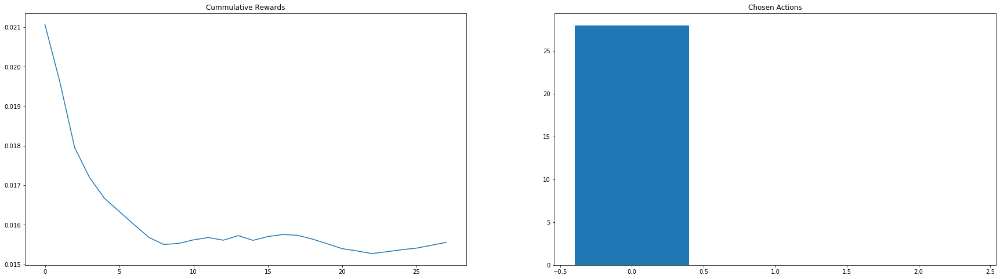

Iteration 1999
Average rewards per algo {'quick_sort': 0.007765456443117322, 'merge_sort': 0.014750555442173963, 'heap_sort': 0.017475078823527463}
Count per chosen algo {'quick_sort': 818, 'merge_sort': 85, 'heap_sort': 49}


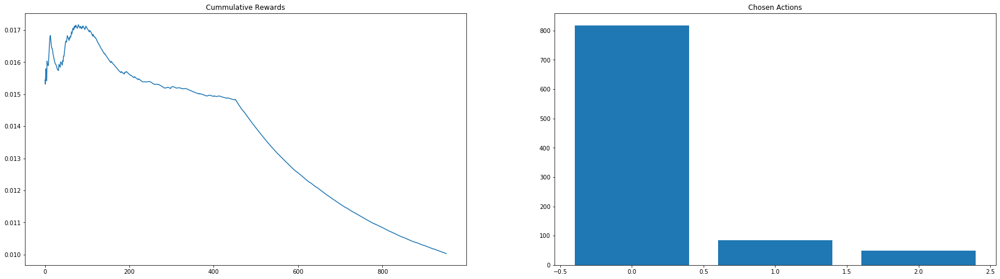

Total reward 20.4635


In [134]:
for elem in list_iteration_results_5:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_5,4))

# Probabs sampled from t Student distribution

### Quick sort should be the fastest at first 500 itreations, then merge sort for for the next 500, then again quick sort for the next 500, then again merge sort for the next 500: i.e. change points/restart experiment at iteration 500, 1000 and 1500

### First Variant: One sample t-test: 
The One Sample t Test determines whether the sample mean is statistically different from a known or hypothesised population mean or in other words: the p_value is the estimated probability of achieving this value by chance from the sample set.  Generally, if we receive a p-value of less than a selected significance level, we can reject the null hypothesis and state that there is a significant difference, i.e. the sample comes from a different distribution.

In [34]:
def TS_ttest(list_distributions, n_samples, var_multiplier=1,p_val_multiplier=20,num_consec_elem=5):# initialize
    total_reward = 0
    num_choices = len(choices)
    sample_count = [0 for i in range(num_choices)]
    sample_rewards = [0 for i in range(num_choices)]
    sample_mean = [0.0 for i in range(num_choices)]
    sample_var = [0.0 for i in range(num_choices)]
    arm_rewards = {0: [], 1:[], 2:[]}
    rewards = []
    cum_rewards = []
    var_multiplier = var_multiplier
    n_consecutive_list = [] # this list is to check whether
    list_iteration_results = []
    p_val_multiplier = p_val_multiplier
    num_consec_elem = num_consec_elem

    for n, elem in enumerate(list_distributions):
        dist_type = elem
        distribion = create_df_distribution(n_samples=n_samples, dist_type=dist_type)
        print("\n")
        print("Iteration:", n)
        theta = {}
        for i in range(len(choices)):
            if sample_count[i] >= 2:
                theta[i] = t.rvs(df=sample_count[i]-1,loc=sample_mean[i],scale=np.sqrt(sample_var[i]/sample_count[i])*var_multiplier)
                print(choices_names[i],"Theta", theta[i])

            else:
                print("Less than two values for",choices_names[i])
                theta[i] = uniform.rvs(loc=0, scale=1)
                print(choices_names[i],"Theta", theta[i])

        choice = np.argmin([theta[i] for i in range(len(choices))])
        alg = choices[choice]
        alg_name = choices_names[choice]
        start_time = time.perf_counter()
        sorted_dist = alg(distribion[dist_type])
        reward = ((time.perf_counter() - start_time))*(1)
        print("\n")
        print("Chosen algorithm is: ", alg_name, "with reward:", reward)
        arm_rewards[choice].append(reward)
        sample_count[choice] += 1
        sample_rewards[choice] += reward
        sample_mean[choice] = np.mean(arm_rewards[choice])
        sample_var[choice] = np.var(arm_rewards[choice]).astype('float64')
        print("Sample mean is: ", sample_mean[choice], "Sample variance is:", sample_var[choice])
        total_reward += reward
        rewards.append(reward)
        cum_rewards.append(sum(rewards)/len(rewards))

        tset, pval = ttest_1samp(arm_rewards[choice], reward)
        print("\n")
        print("p-value: ", pval)
        print("Significance level: ", (sample_var[choice]**p_val_multiplier))

        if pval < sample_var[choice]**p_val_multiplier:
            n_consecutive_list.append(n)
            if any(i >= num_consec_elem for i in count_consec(n_consecutive_list)):
                    print("RESTART EXPERIMENT AT ITERATION:", n)

                    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
                    sample_count = [0 for i in range(num_choices)]
                    sample_rewards = [0 for i in range(num_choices)]
                    sample_mean = [0.0 for i in range(num_choices)]
                    sample_var = [0.0 for i in range(num_choices)]
                    arm_rewards = {0: [], 1:[], 2:[]}
                    rewards = []
                    cum_rewards = []
                    n_consecutive_list = []

    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
    return list_iteration_results, total_reward

In [35]:
list_iteration_results_TS_ttest, total_reward_TS_ttest = TS_ttest(list_distributions=list_distributions, n_samples=n_samples)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.6140727299637292
Less than two values for merge_sort
merge_sort Theta 0.7346327079139817
Less than two values for heap_sort
heap_sort Theta 0.37408902980322567


Chosen algorithm is:  heap_sort with reward: 0.02459599999974671
Sample mean is:  0.02459599999974671 Sample variance is: 0.0


p-value:  nan
Significance level:  0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.8525931538343209
Less than two values for merge_sort
merge_sort Theta 0.11894926525407379
Less than two values for heap_sort
heap_sort Theta 0.9670620876046587


Chosen algorithm is:  merge_sort with reward: 0.015618999999787775
Sample mean is:  0.015618999999787775 Sample variance is: 0.0


p-value:  nan
Significance level:  0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.5809168351457957
Less than two values for merge_sort
merge_sort Theta 0.7896582218875537
Less than two values for heap_sort
heap_

C:\Users\iRacheva\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3584: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
C:\Users\iRacheva\Anaconda3\lib\site-packages\numpy\core\_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\iRacheva\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\iRacheva\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\Users\iRacheva\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


with reward: 0.022234799999750976
Sample mean is:  0.02264727499982655 Sample variance is: 1.369403106800673e-06


p-value:  0.5846654348389532
Significance level:  5.378066606064346e-118


Iteration: 6
Less than two values for quick_sort
quick_sort Theta 0.5765137755857822
Less than two values for merge_sort
merge_sort Theta 0.157751422055888
heap_sort Theta 0.014803070944360869


Chosen algorithm is:  heap_sort with reward: 0.026912300000276446
Sample mean is:  0.02350027999991653 Sample variance is: 4.00599260615456e-06


p-value:  0.02704064783642709
Significance level:  1.1329294536940208e-108


Iteration: 7
Less than two values for quick_sort
quick_sort Theta 0.3797729964817197
Less than two values for merge_sort
merge_sort Theta 0.2928867916998016
heap_sort Theta 0.02314961243127909


Chosen algorithm is:  heap_sort with reward: 0.030205300000034185
Sample mean is:  0.024617783333269472 Sample variance is: 9.582395672070158e-06


p-value:  0.009960553334577904
Significance level



Iteration: 35
quick_sort Theta 0.013357800762824416
merge_sort Theta 0.01537438287282303
heap_sort Theta 0.023198184905095776


Chosen algorithm is:  quick_sort with reward: 0.013186099999984435
Sample mean is:  0.013227007407412774 Sample variance is: 3.4533773333692575e-07


p-value:  0.7254905496454912
Significance level:  5.819433138773314e-130


Iteration: 36
quick_sort Theta 0.01324444575160187
merge_sort Theta 0.015286968473519165
heap_sort Theta 0.024393593332986328


Chosen algorithm is:  quick_sort with reward: 0.01351280000017141
Sample mean is:  0.013237214285725583 Sample variance is: 3.3581711271270385e-07


p-value:  0.020071716206811748
Significance level:  3.327028082297846e-130


Iteration: 37
quick_sort Theta 0.013385418235701463
merge_sort Theta 0.015440467181272934
heap_sort Theta 0.02458668469927348


Chosen algorithm is:  quick_sort with reward: 0.013037200000326266
Sample mean is:  0.013230317241401468 Sample variance is: 3.2556915044578106e-07


p-value:  0.0



Iteration: 59
quick_sort Theta 0.013131852749045938
merge_sort Theta 0.015043798015585834
heap_sort Theta 0.023747685035631048


Chosen algorithm is:  quick_sort with reward: 0.01320080000004964
Sample mean is:  0.013197953061229114 Sample variance is: 2.6639820294231885e-07


p-value:  0.9696748131205775
Significance level:  3.2406029070474815e-132


Iteration: 60
quick_sort Theta 0.013263407299851452
merge_sort Theta 0.014565516395872863
heap_sort Theta 0.026122996280315305


Chosen algorithm is:  quick_sort with reward: 0.012742899999921065
Sample mean is:  0.013188852000002953 Sample variance is: 2.6512887534014666e-07


p-value:  1.874308060387741e-07
Significance level:  2.945374967568197e-132


Iteration: 61
quick_sort Theta 0.01303554624595423
merge_sort Theta 0.014324687191392793
heap_sort Theta 0.023881489405190526


Chosen algorithm is:  quick_sort with reward: 0.013273600000047736
Sample mean is:  0.013190513725494027 Sample variance is: 2.6006833652170456e-07


p-value: 



Chosen algorithm is:  quick_sort with reward: 0.01370370000040566
Sample mean is:  0.013239847222210856 Sample variance is: 2.3702459641192052e-07


p-value:  1.4832230670952245e-11
Significance level:  3.1323358082690727e-133


Iteration: 83
quick_sort Theta 0.01319499589256794
merge_sort Theta 0.015101635225116886
heap_sort Theta 0.02506882002436344


Chosen algorithm is:  quick_sort with reward: 0.01716839999971853
Sample mean is:  0.013293663013683565 Sample variance is: 4.4229972178435153e-07


p-value:  2.60805551858876e-57
Significance level:  8.209814110646708e-128


Iteration: 84
quick_sort Theta 0.01320379223249359
merge_sort Theta 0.014932971107023834
heap_sort Theta 0.024608423835240763


Chosen algorithm is:  quick_sort with reward: 0.016739599999709753
Sample mean is:  0.013340229729710945 Sample variance is: 5.946202085519512e-07


p-value:  1.4179525178919453e-49
Significance level:  3.0534674724536287e-125


Iteration: 85
quick_sort Theta 0.013466124568874712
merge_s



Chosen algorithm is:  quick_sort with reward: 0.01596319999998741
Sample mean is:  0.013741860999984964 Sample variance is: 1.4546758803700973e-06


p-value:  1.3989217032071677e-33
Significance level:  1.8002165883718264e-117


Iteration: 111
quick_sort Theta 0.013925379259043129
merge_sort Theta 0.014394514236190177
heap_sort Theta 0.024621022337608944


Chosen algorithm is:  quick_sort with reward: 0.013423899999907007
Sample mean is:  0.013738712871271323 Sample variance is: 1.4412642203210508e-06


p-value:  0.010099261340189802
Significance level:  1.4957951004469975e-117


Iteration: 112
quick_sort Theta 0.01366710452449893
merge_sort Theta 0.014850705086298868
heap_sort Theta 0.023419878928311173


Chosen algorithm is:  quick_sort with reward: 0.013234399999873858
Sample mean is:  0.013733768627434091 Sample variance is: 1.4296031792046752e-06


p-value:  5.820549429910657e-05
Significance level:  1.2714816767898092e-117


Iteration: 113
quick_sort Theta 0.013836843087689102



Chosen algorithm is:  quick_sort with reward: 0.012990499999887106
Sample mean is:  0.01368689349592239 Sample variance is: 1.239979410695831e-06


p-value:  2.398170220633724e-10
Significance level:  7.383962443861641e-119


Iteration: 134
quick_sort Theta 0.013513546093112165
merge_sort Theta 0.015099207057506918
heap_sort Theta 0.024370847956680187


Chosen algorithm is:  quick_sort with reward: 0.014140000000224973
Sample mean is:  0.013690547580634507 Sample variance is: 1.2316219139538563e-06


p-value:  1.6070640244356833e-05
Significance level:  6.449828277100036e-119


Iteration: 135
quick_sort Theta 0.013524054262258113
merge_sort Theta 0.01510633399414292
heap_sort Theta 0.02489291979337069


Chosen algorithm is:  quick_sort with reward: 0.013535099999899103
Sample mean is:  0.013689303999988625 Sample variance is: 1.2219607037522544e-06


p-value:  0.12288086715871953
Significance level:  5.509913725336593e-119


Iteration: 136
quick_sort Theta 0.013886134877302584
merge_s

Chosen algorithm is:  quick_sort with reward: 0.013187999999900057
Sample mean is:  0.01359857260274099 Sample variance is: 1.1185337429435733e-06


p-value:  6.6713286919205935e-06
Significance level:  9.396839322965183e-120


Iteration: 157
quick_sort Theta 0.013677547366254485
merge_sort Theta 0.014941427513092284
heap_sort Theta 0.023818393790458563


Chosen algorithm is:  quick_sort with reward: 0.013515300000108255
Sample mean is:  0.013598006122450972 Sample variance is: 1.1109715212504953e-06


p-value:  0.3446358093151184
Significance level:  8.204621046705579e-120


Iteration: 158
quick_sort Theta 0.013558339794538993
merge_sort Theta 0.014999168730323467
heap_sort Theta 0.02321968533558168


Chosen algorithm is:  quick_sort with reward: 0.01275919999989128
Sample mean is:  0.013592338513514757 Sample variance is: 1.1081868602026385e-06


p-value:  3.1322056553313125e-17
Significance level:  7.802969840125803e-120


Iteration: 159
quick_sort Theta 0.013553881847265312
merge_s



Iteration: 180
quick_sort Theta 0.013559854053383417
merge_sort Theta 0.0155047307768282
heap_sort Theta 0.025675649750374042


Chosen algorithm is:  quick_sort with reward: 0.013407700000243494
Sample mean is:  0.013569914117651398 Sample variance is: 1.020371505442927e-06


p-value:  0.038331446253926406
Significance level:  1.496809196588813e-120


Iteration: 181
quick_sort Theta 0.013445169231758015
merge_sort Theta 0.014497398032273897
heap_sort Theta 0.02182023654882312


Chosen algorithm is:  quick_sort with reward: 0.013630299999931594
Sample mean is:  0.013570267251465902 Sample variance is: 1.0144256202092364e-06


p-value:  0.4381527424965064
Significance level:  1.3316932035798648e-120


Iteration: 182
quick_sort Theta 0.013717483516992361
merge_sort Theta 0.015392022290884887
heap_sort Theta 0.024006020837628657


Chosen algorithm is:  quick_sort with reward: 0.013114400000176829
Sample mean is:  0.013567616860470035 Sample variance is: 1.0097289987216227e-06


p-value: 



Iteration: 204
quick_sort Theta 0.013560014690072907
merge_sort Theta 0.01517203581953433
heap_sort Theta 0.023100556423897103


Chosen algorithm is:  quick_sort with reward: 0.013270500000089669
Sample mean is:  0.013519327835061613 Sample variance is: 9.303921459195099e-07


p-value:  0.00042878769856619927
Significance level:  2.362222006809973e-121


Iteration: 205
quick_sort Theta 0.013567599106200317
merge_sort Theta 0.015060806969504343
heap_sort Theta 0.023764982644933867


Chosen algorithm is:  quick_sort with reward: 0.013440000000173313
Sample mean is:  0.013518921025651928 Sample variance is: 9.256530099613501e-07


p-value:  0.25463984109751575
Significance level:  2.132869841924136e-121


Iteration: 206
quick_sort Theta 0.01342192798776515
merge_sort Theta 0.014102433728420809
heap_sort Theta 0.025147866545870597


Chosen algorithm is:  quick_sort with reward: 0.013127500000337022
Sample mean is:  0.013516923979604403 Sample variance is: 9.217079881413792e-07


p-value:



Iteration: 227
Less than two values for quick_sort
quick_sort Theta 0.05459798215190215
merge_sort Theta 0.020432430856875097
Less than two values for heap_sort
heap_sort Theta 0.9873961437895676


Chosen algorithm is:  merge_sort with reward: 0.019997399999738263
Sample mean is:  0.020394566666406416 Sample variance is: 1.991622562308307e-06


p-value:  0.72909450490422
Significance level:  9.64141444154919e-115


Iteration: 228
Less than two values for quick_sort
quick_sort Theta 0.20057799440688262
merge_sort Theta 0.020980505122167366
Less than two values for heap_sort
heap_sort Theta 0.2077456553969892


Chosen algorithm is:  merge_sort with reward: 0.014915600000222184
Sample mean is:  0.019024824999860357 Sample variance is: 7.122293620948343e-06


p-value:  0.07588908768846274
Significance level:  1.1282295628639604e-103


Iteration: 229
Less than two values for quick_sort
quick_sort Theta 0.3276491463503669
merge_sort Theta 0.0185265985367773
Less than two values for heap_so


Iteration: 252
quick_sort Theta 0.015926310889911265
merge_sort Theta 0.020447080039029206
Less than two values for heap_sort
heap_sort Theta 0.7151001680281861


Chosen algorithm is:  quick_sort with reward: 0.014294999999947322
Sample mean is:  0.015030186956486748 Sample variance is: 8.635369184777463e-06


p-value:  0.2531592662209328
Significance level:  5.316406626745956e-102


Iteration: 253
quick_sort Theta 0.01495933506581336
merge_sort Theta 0.01881913593538529
Less than two values for heap_sort
heap_sort Theta 0.5393904562260978


Chosen algorithm is:  quick_sort with reward: 0.013940800000000309
Sample mean is:  0.014984795833299813 Sample variance is: 8.322950278887681e-06


p-value:  0.09603379096476883
Significance level:  2.544169275068178e-102


Iteration: 254
quick_sort Theta 0.013453224937683483
merge_sort Theta 0.0177504579755307
Less than two values for heap_sort
heap_sort Theta 0.7138112463632589


Chosen algorithm is:  quick_sort with reward: 0.01328650000004927



Iteration: 275
quick_sort Theta 0.014458843793254014
merge_sort Theta 0.01872530003085871
Less than two values for heap_sort
heap_sort Theta 0.3576819954031709


Chosen algorithm is:  quick_sort with reward: 0.01297679999970569
Sample mean is:  0.014180406521735795 Sample variance is: 5.276302790642997e-06


p-value:  0.0010155918426812578
Significance level:  2.7963672554552645e-106


Iteration: 276
quick_sort Theta 0.014291341479886732
merge_sort Theta 0.019412784694853774
Less than two values for heap_sort
heap_sort Theta 0.7733582253243411


Chosen algorithm is:  quick_sort with reward: 0.013284299999668292
Sample mean is:  0.014161340425521593 Sample variance is: 5.1807627662830185e-06


p-value:  0.012074725128502457
Significance level:  1.9403233806959642e-106


Iteration: 277
quick_sort Theta 0.014017707387931573
merge_sort Theta 0.01947715098545166
Less than two values for heap_sort
heap_sort Theta 0.8664883525417112


Chosen algorithm is:  quick_sort with reward: 0.01313879



Iteration: 298
quick_sort Theta 0.014219613953051831
merge_sort Theta 0.020625235892730475
Less than two values for heap_sort
heap_sort Theta 0.4295211682347393


Chosen algorithm is:  quick_sort with reward: 0.013933799999904295
Sample mean is:  0.013874489855042802 Sample variance is: 3.757882930809974e-06


p-value:  0.8015726703786251
Significance level:  3.154023525091486e-109


Iteration: 299
quick_sort Theta 0.013548965629981913
merge_sort Theta 0.021725199424169762
Less than two values for heap_sort
heap_sort Theta 0.75982726175428


Chosen algorithm is:  quick_sort with reward: 0.013718199999857461
Sample mean is:  0.01387225714282587 Sample variance is: 3.704542854206471e-06


p-value:  0.5083475165589328
Significance level:  2.3696950504941483e-109


Iteration: 300
quick_sort Theta 0.0136190667340669
merge_sort Theta 0.02057676113786424
Less than two values for heap_sort
heap_sort Theta 0.638769879769962


Chosen algorithm is:  quick_sort with reward: 0.013752500000009604


Iteration: 325
quick_sort Theta 0.014074773234029678
merge_sort Theta 0.019956491446714172
heap_sort Theta 0.02565622638856166


Chosen algorithm is:  quick_sort with reward: 0.01641399999971327
Sample mean is:  0.01401779139781846 Sample variance is: 3.696686499086361e-06


p-value:  1.984748328823328e-20
Significance level:  2.2711845636569883e-109


Iteration: 326
quick_sort Theta 0.014342506156340456
merge_sort Theta 0.014961930231727774
heap_sort Theta 0.024485112918912536


Chosen algorithm is:  quick_sort with reward: 0.013549199999943085
Sample mean is:  0.014012806382947446 Sample variance is: 3.6596711316819952e-06


p-value:  0.021582200869671723
Significance level:  1.8571252915280592e-109


Iteration: 327
quick_sort Theta 0.013884852796784404
merge_sort Theta 0.015596255625552275
heap_sort Theta 0.028766884114438965


Chosen algorithm is:  quick_sort with reward: 0.01326249999965512
Sample mean is:  0.014004908421018052 Sample variance is: 3.6270117911122753e-06


p-value:



Iteration: 350
quick_sort Theta 0.013951550937820729
merge_sort Theta 0.01942624086856067
heap_sort Theta 0.023509473282426935


Chosen algorithm is:  quick_sort with reward: 0.013033100000029663
Sample mean is:  0.01384630677963071 Sample variance is: 3.065983271651477e-06


p-value:  1.8395489790905767e-06
Significance level:  5.387603412283755e-111


Iteration: 351
quick_sort Theta 0.013546785409084354
merge_sort Theta 0.018390915585776903
heap_sort Theta 0.022573919089875254


Chosen algorithm is:  quick_sort with reward: 0.012915199999952165
Sample mean is:  0.013838482352910722 Sample variance is: 3.0474428614560648e-06


p-value:  7.298842717408289e-08
Significance level:  4.772120811513255e-111


Iteration: 352
quick_sort Theta 0.013837888400281061
merge_sort Theta 0.020398139531249714
heap_sort Theta 0.024241891836326156


Chosen algorithm is:  quick_sort with reward: 0.012898299999960727
Sample mean is:  0.013830647499969474 Sample variance is: 3.029352309829974e-06


p-val



Chosen algorithm is:  quick_sort with reward: 0.014521900000090682
Sample mean is:  0.013694520270233452 Sample variance is: 2.5929077298646976e-06


p-value:  4.661087498896355e-09
Significance level:  1.886866823596401e-112


Iteration: 382
quick_sort Theta 0.01377243955261908
merge_sort Theta 0.018998747309726727
heap_sort Theta 0.02274920806160943


Chosen algorithm is:  quick_sort with reward: 0.013079000000288943
Sample mean is:  0.013690389261710335 Sample variance is: 2.5780313188134668e-06


p-value:  7.857723993592064e-06
Significance level:  1.6817590761544173e-112


Iteration: 383
quick_sort Theta 0.013466574152928889
merge_sort Theta 0.018474699187926855
heap_sort Theta 0.027648563851040715


Chosen algorithm is:  quick_sort with reward: 0.013336900000012974
Sample mean is:  0.013688032666632353 Sample variance is: 2.561671920868584e-06


p-value:  0.008238819757568181
Significance level:  1.4807105060000567e-112


Iteration: 384
quick_sort Theta 0.013559291218590189
mer

Sample mean is:  0.013724490804566164 Sample variance is: 2.41888752348414e-06


p-value:  5.414978797000779e-06
Significance level:  4.702334171753653e-113


Iteration: 409
quick_sort Theta 0.013630912400282144
merge_sort Theta 0.01745098021028506
heap_sort Theta 0.03872049946724925


Chosen algorithm is:  quick_sort with reward: 0.01423979999981384
Sample mean is:  0.013727435428539008 Sample variance is: 2.4065740300636427e-06


p-value:  2.2516203903731694e-05
Significance level:  4.246044253785726e-113


Iteration: 410
quick_sort Theta 0.013818437497980113
merge_sort Theta 0.0191743074420226
heap_sort Theta 0.02430352925948026


Chosen algorithm is:  quick_sort with reward: 0.013098899999931746
Sample mean is:  0.01372386420451283 Sample variance is: 2.395132201166636e-06


p-value:  2.8306334377153573e-07
Significance level:  3.8600221128217105e-113


Iteration: 411
quick_sort Theta 0.013731222042153083
merge_sort Theta 0.01880444702198199
heap_sort Theta 0.03141273671377203


Ch

merge_sort Theta 0.02002204373800472
heap_sort Theta 0.027684179442341764


Chosen algorithm is:  quick_sort with reward: 0.01427430000012464
Sample mean is:  0.01367832828280352 Sample variance is: 2.19994213040875e-06


p-value:  5.853967151330333e-08
Significance level:  7.050584739858778e-114


Iteration: 433
quick_sort Theta 0.01355601799905014
merge_sort Theta 0.01800505144659039
heap_sort Theta 0.02390707084837263


Chosen algorithm is:  quick_sort with reward: 0.014154199999666162
Sample mean is:  0.013680719597963634 Sample variance is: 2.1900193856914145e-06


p-value:  1.147557088433729e-05
Significance level:  6.441087266694537e-114


Iteration: 434
quick_sort Theta 0.013523418698019969
merge_sort Theta 0.020952338618023723
heap_sort Theta 0.02198838817866117


Chosen algorithm is:  quick_sort with reward: 0.016474600000037753
Sample mean is:  0.013694688999974005 Sample variance is: 2.2179029830758995e-06


p-value:  9.16715636475411e-67
Significance level:  8.295659174755



Chosen algorithm is:  quick_sort with reward: 0.014359900000272319
Sample mean is:  0.013647067567543272 Sample variance is: 2.058278058406e-06


p-value:  3.0554167297514463e-12
Significance level:  1.8624339870122656e-114


Iteration: 457
quick_sort Theta 0.013711337963152803
merge_sort Theta 0.020578968718427428
heap_sort Theta 0.02547876691490226


Chosen algorithm is:  quick_sort with reward: 0.013484800000242103
Sample mean is:  0.0136463399102908 Sample variance is: 2.0491656576428587e-06


p-value:  0.09409391410524877
Significance level:  1.7042816847502566e-114


Iteration: 458
quick_sort Theta 0.013589008240446955
merge_sort Theta 0.019814720905761276
heap_sort Theta 0.025671889823626018


Chosen algorithm is:  quick_sort with reward: 0.01279530000010709
Sample mean is:  0.01364254062497748 Sample variance is: 2.043236505534157e-06


p-value:  2.723896486663377e-16
Significance level:  1.6083211993222981e-114


Iteration: 459
quick_sort Theta 0.0136906323906701
merge_sort 



Iteration: 481
quick_sort Theta 0.013632102004089028
merge_sort Theta 0.018454011068025765
heap_sort Theta 0.025729235767722066


Chosen algorithm is:  quick_sort with reward: 0.013549400000101741
Sample mean is:  0.013598605263141801 Sample variance is: 1.8777922719071616e-06


p-value:  0.5738181118542367
Significance level:  2.9713304088785126e-115


Iteration: 482
quick_sort Theta 0.013688514673402926
merge_sort Theta 0.018095364273612777
heap_sort Theta 0.023300335004073518


Chosen algorithm is:  quick_sort with reward: 0.013143200000286015
Sample mean is:  0.013596768951598028 Sample variance is: 1.8710534227764698e-06


p-value:  3.9585416781066364e-07
Significance level:  2.765182216614007e-115


Iteration: 483
quick_sort Theta 0.013666920318669807
merge_sort Theta 0.017279194108432833
heap_sort Theta 0.025362754351856916


Chosen algorithm is:  quick_sort with reward: 0.012695700000222132
Sample mean is:  0.01359315020078929 Sample variance is: 1.8667868006413715e-06


p-va



Iteration: 505
Less than two values for quick_sort
quick_sort Theta 0.389548648927455
Less than two values for merge_sort
merge_sort Theta 0.04225419776704298
Less than two values for heap_sort
heap_sort Theta 0.4608007811035165


Chosen algorithm is:  merge_sort with reward: 0.0038766999996369123
Sample mean is:  0.0038766999996369123 Sample variance is: 0.0


p-value:  nan
Significance level:  0.0


Iteration: 506
Less than two values for quick_sort
quick_sort Theta 0.22709501417372158
Less than two values for merge_sort
merge_sort Theta 0.947810748303258
Less than two values for heap_sort
heap_sort Theta 0.2668622847773149


Chosen algorithm is:  quick_sort with reward: 0.004994500000066182
Sample mean is:  0.004994500000066182 Sample variance is: 0.0


p-value:  nan
Significance level:  0.0


Iteration: 507
Less than two values for quick_sort
quick_sort Theta 0.4606271300766789
Less than two values for merge_sort
merge_sort Theta 0.7433861976473631
Less than two values for heap_s

Less than two values for heap_sort
heap_sort Theta 0.40017668645560145


Chosen algorithm is:  quick_sort with reward: 0.006121699999766861
Sample mean is:  0.0049627249999844025 Sample variance is: 3.49982159356106e-07


p-value:  2.446707615557384e-09
Significance level:  7.601829550253484e-130


Iteration: 530
quick_sort Theta 0.0049765208915976585
Less than two values for merge_sort
merge_sort Theta 0.8665528052459819
Less than two values for heap_sort
heap_sort Theta 0.016646184689613874


Chosen algorithm is:  quick_sort with reward: 0.004017900000235386
Sample mean is:  0.004924931999994442 Sample variance is: 3.7026233333964976e-07


p-value:  1.5252002865681808e-07
Significance level:  2.345258255302974e-129


Iteration: 531
quick_sort Theta 0.004740395099033708
Less than two values for merge_sort
merge_sort Theta 0.7163814092142723
Less than two values for heap_sort
heap_sort Theta 0.36283959073628413


Chosen algorithm is:  quick_sort with reward: 0.003849700000046141
Sample

Iteration: 553
quick_sort Theta 0.004957145969950072
Less than two values for merge_sort
merge_sort Theta 0.5812514120552891
Less than two values for heap_sort
heap_sort Theta 0.5860227792840335


Chosen algorithm is:  quick_sort with reward: 0.006106699999691045
Sample mean is:  0.004960548936196574 Sample variance is: 3.400451875758777e-07


p-value:  2.0733311900322082e-17
Significance level:  4.2729977007757434e-130


Iteration: 554
quick_sort Theta 0.0049478515898762
Less than two values for merge_sort
merge_sort Theta 0.23615926476244842
Less than two values for heap_sort
heap_sort Theta 0.7083161855648024


Chosen algorithm is:  quick_sort with reward: 0.00462840000000142
Sample mean is:  0.004953629166692508 Sample variance is: 3.352114237042152e-07


p-value:  0.00035477207983024896
Significance level:  3.2090479876729656e-130


Iteration: 555
quick_sort Theta 0.004946436709178765
Less than two values for merge_sort
merge_sort Theta 0.4064716173527695
Less than two values for 

heap_sort Theta 0.7694128701932096


Chosen algorithm is:  merge_sort with reward: 0.004660499999772583
Sample mean is:  0.0042685999997047475 Sample variance is: 1.5358561005316924e-07


p-value:  0.49999999999999956
Significance level:  5.333478418980215e-137


Iteration: 579
quick_sort Theta 0.004888148173049198
merge_sort Theta 0.004318286482198984
Less than two values for heap_sort
heap_sort Theta 0.5758490835567173


Chosen algorithm is:  merge_sort with reward: 0.002653499999723863
Sample mean is:  0.0037302333330444526 Sample variance is: 6.82067742243947e-07


p-value:  0.20652829307774895
Significance level:  4.748431849613714e-124


Iteration: 580
quick_sort Theta 0.004945827914980823
merge_sort Theta 0.003702229906845548
Less than two values for heap_sort
heap_sort Theta 0.9789302098885211


Chosen algorithm is:  merge_sort with reward: 0.004094400000212772
Sample mean is:  0.0038212749998365325 Sample variance is: 5.364165619598006e-07


p-value:  0.5643426809251112
Signif



Chosen algorithm is:  merge_sort with reward: 0.004943300000377349
Sample mean is:  0.003887842857206384 Sample variance is: 2.3671841748282113e-07


p-value:  1.0244713911723626e-11
Significance level:  3.0523967050061545e-133


Iteration: 605
quick_sort Theta 0.004904536537211426
merge_sort Theta 0.003990644616439284
Less than two values for heap_sort
heap_sort Theta 0.7583819081261307


Chosen algorithm is:  merge_sort with reward: 0.0027903000000151224
Sample mean is:  0.0038499965517859954 Sample variance is: 2.6866131278294217e-07


p-value:  1.6491191347858e-11
Significance level:  3.837979502683107e-132


Iteration: 606
quick_sort Theta 0.004965410199752036
merge_sort Theta 0.003840260130612151
Less than two values for heap_sort
heap_sort Theta 0.9334058132771754


Chosen algorithm is:  merge_sort with reward: 0.00383910000027754
Sample mean is:  0.0038496333334023802 Sample variance is: 2.5970976159040914e-07


p-value:  0.9121400811310483
Significance level:  1.948791924155

quick_sort Theta 0.004871739163396873
merge_sort Theta 0.003683536262525508
Less than two values for heap_sort
heap_sort Theta 0.034284628936956274


Chosen algorithm is:  merge_sort with reward: 0.005084299999907671
Sample mean is:  0.003821264814868536 Sample variance is: 2.7202046079780964e-07


p-value:  7.952574654048377e-24
Significance level:  4.920751565482876e-132


Iteration: 631
quick_sort Theta 0.004883667318308222
merge_sort Theta 0.0037702481174687816
Less than two values for heap_sort
heap_sort Theta 0.48168095284766466


Chosen algorithm is:  merge_sort with reward: 0.003339999999752763
Sample mean is:  0.0038125145455027948 Sample variance is: 2.712092637923932e-07


p-value:  1.4277162970404092e-08
Significance level:  4.6354339372179193e-132


Iteration: 632
quick_sort Theta 0.004912825521568735
merge_sort Theta 0.0037937034515273284
Less than two values for heap_sort
heap_sort Theta 0.4193887870794466


Chosen algorithm is:  merge_sort with reward: 0.002975100000185



Chosen algorithm is:  merge_sort with reward: 0.0046637999998893065
Sample mean is:  0.0038243430380065593 Sample variance is: 2.5011702726242243e-07


p-value:  2.135341311568719e-24
Significance level:  9.180475282099243e-133


Iteration: 656
quick_sort Theta 0.004943588413778792
merge_sort Theta 0.0037831470616468033
Less than two values for heap_sort
heap_sort Theta 0.22606120793454465


Chosen algorithm is:  merge_sort with reward: 0.004263299999820447
Sample mean is:  0.003829830000029233 Sample variance is: 2.4936899784846483e-07


p-value:  3.12007315980965e-11
Significance level:  8.64667626955063e-133


Iteration: 657
quick_sort Theta 0.004921501888299042
merge_sort Theta 0.003848185217840105
Less than two values for heap_sort
heap_sort Theta 0.7192025818665451


Chosen algorithm is:  merge_sort with reward: 0.0034854999998970015
Sample mean is:  0.0038255790123732794 Sample variance is: 2.4773603992948287e-07


p-value:  3.4009749597772725e-08
Significance level:  7.582000



Chosen algorithm is:  merge_sort with reward: 0.004731100000299193
Sample mean is:  0.0038277452830492243 Sample variance is: 2.227493109722559e-07


p-value:  6.8245022835735475e-37
Significance level:  9.043309328990871e-134


Iteration: 683
quick_sort Theta 0.004896174355881209
merge_sort Theta 0.0038703228859484334
Less than two values for heap_sort
heap_sort Theta 0.19402255327032247


Chosen algorithm is:  merge_sort with reward: 0.0044292000002315035
Sample mean is:  0.003833366355172423 Sample variance is: 2.240167656031385e-07


p-value:  1.3599418861452492e-23
Significance level:  1.0130023440326953e-133


Iteration: 684
quick_sort Theta 0.0048516188904138184
merge_sort Theta 0.003871216884527431
Less than two values for heap_sort
heap_sort Theta 0.3993857971446172


Chosen algorithm is:  merge_sort with reward: 0.003904400000010355
Sample mean is:  0.0038340240741061076 Sample variance is: 2.2198882387094115e-07


p-value:  0.12527991679675304
Significance level:  8.445438



Iteration: 708
quick_sort Theta 0.004895338635787302
merge_sort Theta 0.0038543131755286626
heap_sort Theta 0.010816664489680298


Chosen algorithm is:  merge_sort with reward: 0.0029935999996268947
Sample mean is:  0.0038445931297961815 Sample variance is: 2.2272162462281646e-07


p-value:  1.1112638363023665e-42
Significance level:  9.020855315595984e-134


Iteration: 709
quick_sort Theta 0.004977353806995444
merge_sort Theta 0.0038236133644483465
heap_sort Theta 0.0107914787160431


Chosen algorithm is:  merge_sort with reward: 0.003766799999993964
Sample mean is:  0.0038440037879037404 Sample variance is: 2.2107983901426545e-07


p-value:  0.06242302037730508
Significance level:  7.780057259506573e-134


Iteration: 710
quick_sort Theta 0.004942944757222631
merge_sort Theta 0.0038123972116394875
heap_sort Theta 0.010695492289575382


Chosen algorithm is:  merge_sort with reward: 0.003688899999815476
Sample mean is:  0.00384283759400834 Sample variance is: 2.195971056682071e-07


p



Chosen algorithm is:  merge_sort with reward: 0.00490799999988667
Sample mean is:  0.0038236177215367206 Sample variance is: 2.0519540577358057e-07


p-value:  6.850507676158659e-67
Significance level:  1.7512681853749018e-134


Iteration: 736
quick_sort Theta 0.004837744378865749
merge_sort Theta 0.0037961298343805756
heap_sort Theta 0.010779639046265608


Chosen algorithm is:  merge_sort with reward: 0.0033308000001852633
Sample mean is:  0.0038205182390124975 Sample variance is: 2.0542274175338878e-07


p-value:  2.476058240997858e-28
Significance level:  1.7904839321623274e-134


Iteration: 737
quick_sort Theta 0.004897252768635585
merge_sort Theta 0.0038380895843144196
heap_sort Theta 0.010776452435867782


Chosen algorithm is:  merge_sort with reward: 0.002730100000007951
Sample mean is:  0.0038137031250187192 Sample variance is: 2.1152372843839297e-07


p-value:  8.687637923502224e-67
Significance level:  3.215006534215217e-134


Iteration: 738
quick_sort Theta 0.0050299056068



Chosen algorithm is:  merge_sort with reward: 0.0046472000003632274
Sample mean is:  0.0037999398907276535 Sample variance is: 2.0835891957564816e-07


p-value:  7.368203977495183e-61
Significance level:  2.378164738833342e-134


Iteration: 761
quick_sort Theta 0.00493832257668276
merge_sort Theta 0.0038029851902884318
heap_sort Theta 0.010815865986850142


Chosen algorithm is:  merge_sort with reward: 0.0032485000001543085
Sample mean is:  0.0037969429348006247 Sample variance is: 2.0887019344679723e-07


p-value:  2.7261721447295262e-37
Significance level:  2.497637344413456e-134


Iteration: 762
quick_sort Theta 0.004909927132666538
merge_sort Theta 0.003740955092763333
heap_sort Theta 0.010791356023546955


Chosen algorithm is:  merge_sort with reward: 0.003633499999978085
Sample mean is:  0.0037960594594772597 Sample variance is: 2.0788478264515894e-07


p-value:  2.785725909252189e-06
Significance level:  2.272238922713679e-134


Iteration: 763
quick_sort Theta 0.00486736773140



Iteration: 787
quick_sort Theta 0.004907189971121852
merge_sort Theta 0.0038286742386556554
heap_sort Theta 0.010787070538530093


Chosen algorithm is:  merge_sort with reward: 0.004056400000081339
Sample mean is:  0.003781428095254298 Sample variance is: 2.0189572441761242e-07


p-value:  3.8220873421759403e-16
Significance level:  1.2663170027637725e-134


Iteration: 788
quick_sort Theta 0.004955463366186217
merge_sort Theta 0.0037678590789407738
heap_sort Theta 0.010785423478963803


Chosen algorithm is:  merge_sort with reward: 0.0030959999999140564
Sample mean is:  0.003778179620868799 Sample variance is: 2.0315491566810209e-07


p-value:  3.1817905801846995e-56
Significance level:  1.4339919231578385e-134


Iteration: 789
quick_sort Theta 0.004965447522397704
merge_sort Theta 0.003807299867223061
heap_sort Theta 0.010783844689907039


Chosen algorithm is:  merge_sort with reward: 0.0031638999998904183
Sample mean is:  0.0037752820754868256 Sample variance is: 2.0396814507377304



Chosen algorithm is:  merge_sort with reward: 0.0056035000002339075
Sample mean is:  0.0037690398305200027 Sample variance is: 2.2412016097985232e-07


p-value:  1.573152912503502e-143
Significance level:  1.0223945241225971e-133


Iteration: 814
quick_sort Theta 0.00495016038142648
merge_sort Theta 0.0037699837201090464
heap_sort Theta 0.010783572590229372


Chosen algorithm is:  merge_sort with reward: 0.004084900000179914
Sample mean is:  0.003770372573851901 Sample variance is: 2.2359369062231148e-07


p-value:  1.563021635785525e-20
Significance level:  9.75418276816513e-134


Iteration: 815
quick_sort Theta 0.004965120891323029
merge_sort Theta 0.0037522687355386955
heap_sort Theta 0.010721656752496169


Chosen algorithm is:  merge_sort with reward: 0.00354269999979806
Sample mean is:  0.003769415966397893 Sample variance is: 2.228710995175744e-07


p-value:  2.455686476472746e-12
Significance level:  9.142713540092933e-134


Iteration: 816
quick_sort Theta 0.004896765215823096

heap_sort Theta 0.01072257741357811


Chosen algorithm is:  merge_sort with reward: 0.005148199999894132
Sample mean is:  0.0037663587786413394 Sample variance is: 2.363679251201758e-07


p-value:  4.987102546254759e-127
Significance level:  2.9632675010603127e-133


Iteration: 840
quick_sort Theta 0.004997502295365908
merge_sort Theta 0.003729407459849386
heap_sort Theta 0.010796481633446778


Chosen algorithm is:  merge_sort with reward: 0.003452999999808526
Sample mean is:  0.003765167300394827 Sample variance is: 2.3584112831022551e-07


p-value:  1.9011720723021263e-21
Significance level:  2.8339414846916288e-133


Iteration: 841
quick_sort Theta 0.004930888345777238
merge_sort Theta 0.0037736511208382646
heap_sort Theta 0.010814141679527963


Chosen algorithm is:  merge_sort with reward: 0.0035496999998940737
Sample mean is:  0.0037643511363777784 Sample variance is: 2.3512298123680632e-07


p-value:  7.18624017978267e-12
Significance level:  2.6662544576248428e-133


Iteration: 


Iteration: 865
quick_sort Theta 0.00491740569884359
merge_sort Theta 0.0037308054547280927
heap_sort Theta 0.010788193478341883


Chosen algorithm is:  merge_sort with reward: 0.004931200000100944
Sample mean is:  0.0037638159722301148 Sample variance is: 2.2965715379907357e-07


p-value:  1.0592747925434426e-122
Significance level:  1.665710655627347e-133


Iteration: 866
quick_sort Theta 0.004819812991124482
merge_sort Theta 0.0037505100831869854
heap_sort Theta 0.01077021402200962


Chosen algorithm is:  merge_sort with reward: 0.0027718000001186738
Sample mean is:  0.0037603833910117364 Sample variance is: 2.322558851476235e-07


p-value:  3.3039480393285284e-105
Significance level:  2.0860972398156162e-133


Iteration: 867
quick_sort Theta 0.004917118068272773
merge_sort Theta 0.003783771898829719
heap_sort Theta 0.010789949847233861


Chosen algorithm is:  merge_sort with reward: 0.0035326000001987268
Sample mean is:  0.0037595979310434155 Sample variance is: 2.3163330057261566e



Iteration: 892
quick_sort Theta 0.004855272585821885
merge_sort Theta 0.0037666314199837855
heap_sort Theta 0.010788663871809297


Chosen algorithm is:  merge_sort with reward: 0.0037726000000475324
Sample mean is:  0.003748463174613587 Sample variance is: 2.2021069263498056e-07


p-value:  0.3627653168350733
Significance level:  7.190648477892271e-134


Iteration: 893
quick_sort Theta 0.005027058445987873
merge_sort Theta 0.00375925919781346
heap_sort Theta 0.01079807562740744


Chosen algorithm is:  merge_sort with reward: 0.0039171000003079826
Sample mean is:  0.0037489968354543924 Sample variance is: 2.1960353343078787e-07


p-value:  6.822965539895891e-10
Significance level:  6.804347311842157e-134


Iteration: 894
quick_sort Theta 0.004885612631554628
merge_sort Theta 0.0037549813073826308
heap_sort Theta 0.01076175089503961


Chosen algorithm is:  merge_sort with reward: 0.0035739999998440908
Sample mean is:  0.003748444794963508 Sample variance is: 2.1900707839515314e-07


p-



Chosen algorithm is:  merge_sort with reward: 0.0049361000001226785
Sample mean is:  0.003736188563059926 Sample variance is: 2.213939247891998e-07


p-value:  7.481955291702215e-151
Significance level:  8.004127296493802e-134


Iteration: 919
quick_sort Theta 0.004882238896548798
merge_sort Theta 0.003741004855008067
heap_sort Theta 0.010809053522003946


Chosen algorithm is:  merge_sort with reward: 0.0033952999997381994
Sample mean is:  0.003735191812874775 Sample variance is: 2.210853613595967e-07


p-value:  5.4576139757757e-33
Significance level:  7.78394493737049e-134


Iteration: 920
quick_sort Theta 0.004883821764971586
merge_sort Theta 0.003728313850340475
heap_sort Theta 0.010804014188815722


Chosen algorithm is:  merge_sort with reward: 0.003607200000260491
Sample mean is:  0.0037348186589021386 Sample variance is: 2.204884190333091e-07


p-value:  8.086219971100197e-07
Significance level:  7.374212852079563e-134


Iteration: 921
quick_sort Theta 0.005018628905199051
mer



Chosen algorithm is:  merge_sort with reward: 0.0048583000002508925
Sample mean is:  0.0037308337874809487 Sample variance is: 2.2051387675648275e-07


p-value:  5.245890982335078e-154
Significance level:  7.391260162786516e-134


Iteration: 945
quick_sort Theta 0.004924263186822889
merge_sort Theta 0.0036883066697588063
heap_sort Theta 0.010775150045996378


Chosen algorithm is:  merge_sort with reward: 0.003670899999633548
Sample mean is:  0.003730670923927016 Sample variance is: 2.1992438877044892e-07


p-value:  0.015091204766944432
Significance level:  7.005963533330874e-134


Iteration: 946
quick_sort Theta 0.004916076616510635
merge_sort Theta 0.003753250222464312
heap_sort Theta 0.010770626318510501


Chosen algorithm is:  merge_sort with reward: 0.003086300000177289
Sample mean is:  0.0037289246612610275 Sample variance is: 2.204505791707645e-07


p-value:  2.340675911077443e-86
Significance level:  7.34894306860188e-134


Iteration: 947
quick_sort Theta 0.004971111539460303



Iteration: 971
quick_sort Theta 0.004943195035517015
merge_sort Theta 0.003693347152305545
heap_sort Theta 0.010784074726595047


Chosen algorithm is:  merge_sort with reward: 0.002723800000239862
Sample mean is:  0.0037221147208260546 Sample variance is: 2.2450220457440973e-07


p-value:  1.3006406708816868e-146
Significance level:  1.0578210408277134e-133


Iteration: 972
quick_sort Theta 0.004849295173761688
merge_sort Theta 0.003748655614653217
heap_sort Theta 0.010807402219909295


Chosen algorithm is:  merge_sort with reward: 0.0031257999999070307
Sample mean is:  0.0037206050633047404 Sample variance is: 2.2483179650050291e-07


p-value:  6.820128580703386e-83
Significance level:  1.0893178338083153e-133


Iteration: 973
quick_sort Theta 0.004974720534620034
merge_sort Theta 0.003697674130684276
heap_sort Theta 0.010781852458812172


Chosen algorithm is:  merge_sort with reward: 0.0036083999998481886
Sample mean is:  0.003720321717184901 Sample variance is: 2.2429575202296615e



Chosen algorithm is:  merge_sort with reward: 0.004684900000029302
Sample mean is:  0.0037154938095378992 Sample variance is: 2.223870050289417e-07


p-value:  1.5296455821106707e-152
Significance level:  8.753628701587672e-134


Iteration: 998
quick_sort Theta 0.004995773030378573
merge_sort Theta 0.0037423837195782795
heap_sort Theta 0.010776972401032113


Chosen algorithm is:  merge_sort with reward: 0.0034847000001718698
Sample mean is:  0.0037149456057151767 Sample variance is: 2.2198499138372594e-07


p-value:  2.5826682084396174e-21
Significance level:  8.442522905726992e-134


Iteration: 999
quick_sort Theta 0.005009175033730812
merge_sort Theta 0.0037361940690080115
heap_sort Theta 0.010766184216374696


Chosen algorithm is:  merge_sort with reward: 0.0035814000002574176
Sample mean is:  0.003714629146934471 Sample variance is: 2.2150112213176835e-07


p-value:  1.2452346722826832e-08
Significance level:  8.081995685972383e-134


Iteration: 1000
quick_sort Theta 0.0049474370



Iteration: 1019
Less than two values for quick_sort
quick_sort Theta 0.26684342800262983
merge_sort Theta 0.014587510189980241
Less than two values for heap_sort
heap_sort Theta 0.1765468011489424


Chosen algorithm is:  merge_sort with reward: 0.01493239999990692
Sample mean is:  0.014821006666655498 Sample variance is: 1.0306901530673098e-07


p-value:  0.2151808742529585
Significance level:  1.830469676188282e-140


Iteration: 1020
Less than two values for quick_sort
quick_sort Theta 0.40107787493667024
merge_sort Theta 0.014807248133300763
Less than two values for heap_sort
heap_sort Theta 0.6719493950957834


Chosen algorithm is:  merge_sort with reward: 0.01512830000001486
Sample mean is:  0.014840212499990457 Sample variance is: 1.0216016236141431e-07


p-value:  0.0032847319211047332
Significance level:  1.533315371332697e-140


Iteration: 1021
Less than two values for quick_sort
quick_sort Theta 0.6265102661038833
merge_sort Theta 0.014878988458988975
Less than two values fo



Chosen algorithm is:  merge_sort with reward: 0.015374699999938457
Sample mean is:  0.014864702777749194 Sample variance is: 2.8937403692491856e-07


p-value:  2.53205839224934e-06
Significance level:  1.6950841363521023e-131


Iteration: 1041
Less than two values for quick_sort
quick_sort Theta 0.1633010963134589
merge_sort Theta 0.014694194366274633
Less than two values for heap_sort
heap_sort Theta 0.015033383577653159


Chosen algorithm is:  merge_sort with reward: 0.015217199999824516
Sample mean is:  0.014874229729697175 Sample variance is: 2.848205782911183e-07


p-value:  0.00045811542727480775
Significance level:  1.2343186118884952e-131


Iteration: 1042
Less than two values for quick_sort
quick_sort Theta 0.22973187877867207
merge_sort Theta 0.014990173271204428
Less than two values for heap_sort
heap_sort Theta 0.5570511496084014


Chosen algorithm is:  merge_sort with reward: 0.014619699999911973
Sample mean is:  0.014867531578913355 Sample variance is: 2.7898531320018e-



Chosen algorithm is:  merge_sort with reward: 0.02010920000020633
Sample mean is:  0.014998774999980924 Sample variance is: 9.030943319219539e-07


p-value:  2.80815802430867e-42
Significance level:  1.302153943752653e-121


Iteration: 1062
Less than two values for quick_sort
quick_sort Theta 0.39910910969544877
merge_sort Theta 0.015162162485565548
Less than two values for heap_sort
heap_sort Theta 0.09735877076745936


Chosen algorithm is:  merge_sort with reward: 0.014971100000366278
Sample mean is:  0.014998289473671895 Sample variance is: 8.872637729174155e-07


p-value:  0.8297669458376967
Significance level:  9.142289967047353e-122


Iteration: 1063
Less than two values for quick_sort
quick_sort Theta 0.3952754554331914
merge_sort Theta 0.01503541230326637
Less than two values for heap_sort
heap_sort Theta 0.4997722915188647


Chosen algorithm is:  merge_sort with reward: 0.014944000000014057
Sample mean is:  0.014997353448264002 Sample variance is: 8.720160618433793e-07


p-v



Chosen algorithm is:  merge_sort with reward: 0.01644480000004478
Sample mean is:  0.0149370714285609 Sample variance is: 7.770979015508334e-07


p-value:  2.8503537012472416e-24
Significance level:  6.449331850586299e-123


Iteration: 1083
Less than two values for quick_sort
quick_sort Theta 0.8354821412251925
merge_sort Theta 0.014748723455544658
Less than two values for heap_sort
heap_sort Theta 0.6068623616673137


Chosen algorithm is:  merge_sort with reward: 0.015307000000120752
Sample mean is:  0.014941814102555257 Sample variance is: 7.688670656006973e-07


p-value:  0.0004684050174044305
Significance level:  5.212249138227072e-123


Iteration: 1084
Less than two values for quick_sort
quick_sort Theta 0.9371920032853935
merge_sort Theta 0.015064308296115906
Less than two values for heap_sort
heap_sort Theta 0.2791314419839217


Chosen algorithm is:  merge_sort with reward: 0.014933799999653274
Sample mean is:  0.014941712658214725 Sample variance is: 7.591353737938523e-07


p

Chosen algorithm is:  merge_sort with reward: 0.014568000000053871
Sample mean is:  0.014898209183661028 Sample variance is: 6.462565524984483e-07


p-value:  0.00010488553852474542
Significance level:  1.6147273082060977e-124


Iteration: 1104
Less than two values for quick_sort
quick_sort Theta 0.5358442230933322
merge_sort Theta 0.015019640789582966
Less than two values for heap_sort
heap_sort Theta 0.8230637638394425


Chosen algorithm is:  merge_sort with reward: 0.015719300000000658
Sample mean is:  0.014906503030290721 Sample variance is: 6.464699219416713e-07


p-value:  1.16635924762763e-16
Significance level:  1.6254232540251962e-124


Iteration: 1105
Less than two values for quick_sort
quick_sort Theta 0.06824115891427707
merge_sort Theta 0.014838751028976404
Less than two values for heap_sort
heap_sort Theta 0.6028558329425721


Chosen algorithm is:  merge_sort with reward: 0.015224400000079186
Sample mean is:  0.014909681999988607 Sample variance is: 6.410057017079214e-07




Iteration: 1125
Less than two values for quick_sort
quick_sort Theta 0.14290476117693218
merge_sort Theta 0.014769066560133147
Less than two values for heap_sort
heap_sort Theta 0.02154931821692707


Chosen algorithm is:  merge_sort with reward: 0.014812899999924412
Sample mean is:  0.014888385833323052 Sample variance is: 5.670746662525511e-07


p-value:  0.27638291391745573
Significance level:  1.1825102586448566e-125


Iteration: 1126
Less than two values for quick_sort
quick_sort Theta 0.5469923946650355
merge_sort Theta 0.014916866931476137
Less than two values for heap_sort
heap_sort Theta 0.6800246816333819


Chosen algorithm is:  merge_sort with reward: 0.014974199999869597
Sample mean is:  0.01488909504131104 Sample variance is: 5.624484558792877e-07


p-value:  0.21625636815565158
Significance level:  1.0038170696032533e-125


Iteration: 1127
Less than two values for quick_sort
quick_sort Theta 0.15080669779504075
merge_sort Theta 0.014964335291623049
Less than two values f

Less than two values for quick_sort
quick_sort Theta 0.2490219802642134
merge_sort Theta 0.014882198042969733
Less than two values for heap_sort
heap_sort Theta 0.015783030133944886


Chosen algorithm is:  merge_sort with reward: 0.015893900000264694
Sample mean is:  0.014907492198567492 Sample variance is: 5.945617996194489e-07


p-value:  2.86987691444934e-31
Significance level:  3.047474287580735e-125


Iteration: 1147
Less than two values for quick_sort
quick_sort Theta 0.028844128116235157
merge_sort Theta 0.015036796429990644
Less than two values for heap_sort
heap_sort Theta 0.681702420800196


Chosen algorithm is:  merge_sort with reward: 0.015199399999801244
Sample mean is:  0.014909547887308574 Sample variance is: 5.909705904167817e-07


p-value:  1.548655838286424e-05
Significance level:  2.699711621684734e-125


Iteration: 1148
Less than two values for quick_sort
quick_sort Theta 0.16422145803611787
merge_sort Theta 0.014950673436528127
Less than two values for heap_sort
he



Iteration: 1168
quick_sort Theta 0.012927040472348475
merge_sort Theta 0.014901781635797109
Less than two values for heap_sort
heap_sort Theta 0.008515461929912482


Chosen algorithm is:  heap_sort with reward: 0.02226299999983894
Sample mean is:  0.02226299999983894 Sample variance is: 0.0


p-value:  nan
Significance level:  0.0


Iteration: 1169
quick_sort Theta 0.013117333110668357
merge_sort Theta 0.015057994946417188
Less than two values for heap_sort
heap_sort Theta 0.8342648744759207


Chosen algorithm is:  quick_sort with reward: 0.012658600000122533
Sample mean is:  0.013034516666645382 Sample variance is: 1.4331402975598623e-07


p-value:  0.007161466099834933
Significance level:  1.3359006356467354e-137


Iteration: 1170
quick_sort Theta 0.012992647566685032
merge_sort Theta 0.014986180862935412
Less than two values for heap_sort
heap_sort Theta 0.5370299323504354


Chosen algorithm is:  quick_sort with reward: 0.01319950000015524
Sample mean is:  0.013047207692299988 Sam

Chosen algorithm is:  quick_sort with reward: 0.013336600000002363
Sample mean is:  0.013143471875025625 Sample variance is: 1.4078523579539534e-07


p-value:  0.007407849937075404
Significance level:  9.357121120771491e-138


Iteration: 1190
quick_sort Theta 0.013039292446019729
merge_sort Theta 0.01495063409331971
Less than two values for heap_sort
heap_sort Theta 0.4858732217204115


Chosen algorithm is:  quick_sort with reward: 0.0137670000003709
Sample mean is:  0.013162366666702755 Sample variance is: 1.4794343740957618e-07


p-value:  3.692121135339915e-10
Significance level:  2.522981714860127e-137


Iteration: 1191
quick_sort Theta 0.013284773311093376
merge_sort Theta 0.014884072475492768
Less than two values for heap_sort
heap_sort Theta 0.14903415379426244


Chosen algorithm is:  quick_sort with reward: 0.013459799999964162
Sample mean is:  0.013171114705916325 Sample variance is: 1.4611759011141795e-07


p-value:  0.00012755691584250358
Significance level:  1.9681129424981

heap_sort Theta 0.023021777398550686


Chosen algorithm is:  quick_sort with reward: 0.014501399999971909
Sample mean is:  0.013204516981161605 Sample variance is: 2.8042334331578545e-07


p-value:  1.2738136583658108e-23
Significance level:  9.042390464108582e-132


Iteration: 1212
quick_sort Theta 0.013152214226392862
merge_sort Theta 0.014995407480256854
heap_sort Theta 0.022744964752106033


Chosen algorithm is:  quick_sort with reward: 0.0132223000000522
Sample mean is:  0.013204846296326246 Sample variance is: 2.7523606620888335e-07


p-value:  0.8095605098353165
Significance level:  6.22453397748351e-132


Iteration: 1213
quick_sort Theta 0.01312958301773283
merge_sort Theta 0.014881045081163401
heap_sort Theta 0.022844930148889147


Chosen algorithm is:  quick_sort with reward: 0.012648999999782973
Sample mean is:  0.013194740000025459 Sample variance is: 2.7574718424163655e-07


p-value:  3.8098112460223144e-10
Significance level:  6.459839501180684e-132


Iteration: 1214
quic



Chosen algorithm is:  quick_sort with reward: 0.016889699999865115
Sample mean is:  0.01320333157897087 Sample variance is: 4.0955212531665754e-07


p-value:  2.833700687732052e-59
Significance level:  1.7627214111632831e-128


Iteration: 1235
quick_sort Theta 0.013311885701448194
merge_sort Theta 0.014932116302431384
heap_sort Theta 0.022444915191933812


Chosen algorithm is:  quick_sort with reward: 0.012596900000062305
Sample mean is:  0.013195455844179851 Sample variance is: 4.089473336321964e-07


p-value:  5.442461951143879e-12
Significance level:  1.7113845937509594e-128


Iteration: 1236
quick_sort Theta 0.013125471132255
merge_sort Theta 0.014808257097778645
heap_sort Theta 0.02343419652445078


Chosen algorithm is:  quick_sort with reward: 0.013079400000151509
Sample mean is:  0.01319396794874359 Sample variance is: 4.038748842263024e-07


p-value:  0.11776652285183359
Significance level:  1.3333277888185019e-128


Iteration: 1237
quick_sort Theta 0.013277730629064195
merge



Iteration: 1258
quick_sort Theta 0.01310141638895021
merge_sort Theta 0.014882754534211482
heap_sort Theta 0.022350896213191862


Chosen algorithm is:  quick_sort with reward: 0.01301999999986947
Sample mean is:  0.013173309000012522 Sample variance is: 3.4172273781893056e-07


p-value:  0.010475088939803132
Significance level:  4.7149549097163226e-130


Iteration: 1259
quick_sort Theta 0.013122890709431964
merge_sort Theta 0.014844506940753259
heap_sort Theta 0.02330585690916217


Chosen algorithm is:  quick_sort with reward: 0.013057300000127725
Sample mean is:  0.013172160396053267 Sample variance is: 3.3847127348070046e-07


p-value:  0.051107785774098496
Significance level:  3.894361906110188e-130


Iteration: 1260
quick_sort Theta 0.013207091077708425
merge_sort Theta 0.014915834829759297
heap_sort Theta 0.022039240764592564


Chosen algorithm is:  quick_sort with reward: 0.012973200000033103
Sample mean is:  0.013170209803935422 Sample variance is: 3.355372134328924e-07


p-va



Iteration: 1281
quick_sort Theta 0.013096659700269636
merge_sort Theta 0.014860919172087327
heap_sort Theta 0.02287773694227731


Chosen algorithm is:  quick_sort with reward: 0.01298159999987547
Sample mean is:  0.013147366666677355 Sample variance is: 3.131332316565153e-07


p-value:  0.0013890186318330042
Significance level:  8.214539119737772e-131


Iteration: 1282
quick_sort Theta 0.013201635723754428
merge_sort Theta 0.014952298843892873
heap_sort Theta 0.022603045329408537


Chosen algorithm is:  quick_sort with reward: 0.01323210000009567
Sample mean is:  0.013148050000011373 Sample variance is: 3.1066539782606723e-07


p-value:  0.09698454580265058
Significance level:  7.012254620148787e-131


Iteration: 1283
quick_sort Theta 0.013102043183949953
merge_sort Theta 0.0148437107482032
heap_sort Theta 0.022588792515765167


Chosen algorithm is:  quick_sort with reward: 0.01297340000019176
Sample mean is:  0.013146652800012816 Sample variance is: 3.0842214345511863e-07


p-value:


Iteration: 1310
quick_sort Theta 0.013135405704690808
merge_sort Theta 0.014878736518988023
heap_sort Theta 0.022508437430720292


Chosen algorithm is:  quick_sort with reward: 0.016626499999802036
Sample mean is:  0.013150284105958783 Sample variance is: 3.5238729589958766e-07


p-value:  5.540869032326128e-118
Significance level:  8.717759039220693e-130


Iteration: 1311
quick_sort Theta 0.013132945721085375
merge_sort Theta 0.01500274751612695
heap_sort Theta 0.022589498007804153


Chosen algorithm is:  quick_sort with reward: 0.013266700000258425
Sample mean is:  0.013151050000000228 Sample variance is: 3.5015753407265495e-07


p-value:  0.01753872243684284
Significance level:  7.678378266974937e-130


Iteration: 1312
quick_sort Theta 0.013139349180927483
merge_sort Theta 0.0148745006116901
heap_sort Theta 0.02207564109219196


Chosen algorithm is:  quick_sort with reward: 0.012757100000271748
Sample mean is:  0.013148475163400695 Sample variance is: 3.4887664983301916e-07


p-val



Chosen algorithm is:  quick_sort with reward: 0.014915700000074139
Sample mean is:  0.013139647126434222 Sample variance is: 3.3591651570946767e-07


p-value:  7.3382994261858775e-90
Significance level:  3.346779797648398e-130


Iteration: 1334
quick_sort Theta 0.013160017115209578
merge_sort Theta 0.014945109019844345
heap_sort Theta 0.022156868936027505


Chosen algorithm is:  quick_sort with reward: 0.012703200000032666
Sample mean is:  0.013137153142854784 Sample variance is: 3.3507926477500014e-07


p-value:  1.4074108943488762e-18
Significance level:  3.1838388441018105e-130


Iteration: 1335
quick_sort Theta 0.013143048830449675
merge_sort Theta 0.014871732423573529
heap_sort Theta 0.022593168657414682


Chosen algorithm is:  quick_sort with reward: 0.013171499999771186
Sample mean is:  0.0131373482954509 Sample variance is: 3.331820701098111e-07


p-value:  0.4348661603895104
Significance level:  2.8420547761507326e-130


Iteration: 1336
quick_sort Theta 0.013143460232548415




Chosen algorithm is:  quick_sort with reward: 0.014925399999810907
Sample mean is:  0.013127647058818005 Sample variance is: 3.28878947679089e-07


p-value:  5.829541583374852e-107
Significance level:  2.191399120769368e-130


Iteration: 1364
quick_sort Theta 0.013068612191420087
merge_sort Theta 0.014959454699018104
heap_sort Theta 0.022469498459456803


Chosen algorithm is:  quick_sort with reward: 0.013056399999641144
Sample mean is:  0.013127299512187874 Sample variance is: 3.2729930101609853e-07


p-value:  0.07821234777828504
Significance level:  1.990222155173718e-130


Iteration: 1365
quick_sort Theta 0.013144862994464206
merge_sort Theta 0.014881353271746934
heap_sort Theta 0.02216392059755512


Chosen algorithm is:  quick_sort with reward: 0.01275870000017676
Sample mean is:  0.013125510194168404 Sample variance is: 3.26366809547603e-07


p-value:  4.3805992687550815e-17
Significance level:  1.879834949159642e-130


Iteration: 1366
quick_sort Theta 0.013155965754332309
merg



Chosen algorithm is:  quick_sort with reward: 0.016113300000142772
Sample mean is:  0.01313807982456127 Sample variance is: 3.6452352853220364e-07


p-value:  3.235657765044958e-161
Significance level:  1.7159763994745547e-129


Iteration: 1388
quick_sort Theta 0.013143066582891931
merge_sort Theta 0.014839989370924634
heap_sort Theta 0.021769209819626812


Chosen algorithm is:  quick_sort with reward: 0.013027599999986705
Sample mean is:  0.013137597379912472 Sample variance is: 3.629847903780799e-07


p-value:  0.00630953317627869
Significance level:  1.5767707545571698e-129


Iteration: 1389
quick_sort Theta 0.013157260680395374
merge_sort Theta 0.014990604862879257
heap_sort Theta 0.022972997515074783


Chosen algorithm is:  quick_sort with reward: 0.013138899999830755
Sample mean is:  0.013137603043477334 Sample variance is: 3.61406602982702e-07


p-value:  0.9739844193160239
Significance level:  1.4451790565519124e-129


Iteration: 1390
quick_sort Theta 0.0131316810616906
merge



Iteration: 1411
quick_sort Theta 0.013255266580762906
merge_sort Theta 0.0149548574588446
heap_sort Theta 0.02371110870203418


Chosen algorithm is:  quick_sort with reward: 0.01255829999990965
Sample mean is:  0.013152256349207568 Sample variance is: 4.1617238174321133e-07


p-value:  2.5526082006908547e-35
Significance level:  2.4292103281906626e-128


Iteration: 1412
quick_sort Theta 0.013147518446649633
merge_sort Theta 0.01492641924154893
heap_sort Theta 0.022519899397330935


Chosen algorithm is:  quick_sort with reward: 0.01345309999987876
Sample mean is:  0.01315344545454619 Sample variance is: 4.1488375243734113e-07


p-value:  2.2242991423337943e-12
Significance level:  2.2831190031320057e-128


Iteration: 1413
quick_sort Theta 0.013155026290425548
merge_sort Theta 0.014874264836929005
heap_sort Theta 0.020900384785721763


Chosen algorithm is:  quick_sort with reward: 0.013244899999790505
Sample mean is:  0.013153805511810931 Sample variance is: 4.13283151069369e-07


p-va



Iteration: 1435
quick_sort Theta 0.013093675396309661
merge_sort Theta 0.014972794459222331
heap_sort Theta 0.020170420444972737


Chosen algorithm is:  quick_sort with reward: 0.013596899999811285
Sample mean is:  0.013142714492751704 Sample variance is: 3.9375148406257935e-07


p-value:  5.68157070921505e-27
Significance level:  8.024982119507801e-129


Iteration: 1436
quick_sort Theta 0.01313249489798251
merge_sort Theta 0.014958394879510136
heap_sort Theta 0.021769001250512593


Chosen algorithm is:  quick_sort with reward: 0.013260199999876932
Sample mean is:  0.013143138628156489 Sample variance is: 3.923796484328276e-07


p-value:  0.002103037901581183
Significance level:  7.483925826503349e-129


Iteration: 1437
quick_sort Theta 0.013119268289918338
merge_sort Theta 0.015003651948601027
heap_sort Theta 0.022364696686982582


Chosen algorithm is:  quick_sort with reward: 0.013168999999834341
Sample mean is:  0.013143231654673316 Sample variance is: 3.9097060798793163e-07


p-v



Iteration: 1458
quick_sort Theta 0.013188627376540245
merge_sort Theta 0.01488905642423783
heap_sort Theta 0.022517238394740555


Chosen algorithm is:  quick_sort with reward: 0.01401850000002014
Sample mean is:  0.013147016387960089 Sample variance is: 3.999472724030471e-07


p-value:  7.61186256769306e-71
Significance level:  1.0966165246320692e-128


Iteration: 1459
quick_sort Theta 0.013170344287123931
merge_sort Theta 0.01505062519638397
heap_sort Theta 0.022926467825005587


Chosen algorithm is:  quick_sort with reward: 0.01321479999978692
Sample mean is:  0.013147242333332846 Sample variance is: 3.986293791704997e-07


p-value:  0.06526690367412154
Significance level:  1.0265640823112564e-128


Iteration: 1460
quick_sort Theta 0.013142902312678019
merge_sort Theta 0.014972840782682328
heap_sort Theta 0.021946628727588537


Chosen algorithm is:  quick_sort with reward: 0.012810000000172295
Sample mean is:  0.013146121926910385 Sample variance is: 3.976816222390349e-07


p-value

quick_sort Theta 0.013107572427944355
merge_sort Theta 0.014996399890449392
heap_sort Theta 0.020328429764342047


Chosen algorithm is:  quick_sort with reward: 0.014924800000244431
Sample mean is:  0.013150456211177195 Sample variance is: 3.892863723357526e-07


p-value:  6.987224457583065e-156
Significance level:  6.38828105159767e-129


Iteration: 1482
quick_sort Theta 0.013127701081674924
merge_sort Theta 0.015011391211498873
heap_sort Theta 0.02061537600955165


Chosen algorithm is:  quick_sort with reward: 0.014331100000163133
Sample mean is:  0.013154111455105944 Sample variance is: 3.923833316022963e-07


p-value:  1.1540148838747624e-107
Significance level:  7.485330946539763e-129


Iteration: 1483
quick_sort Theta 0.013203877274589307
merge_sort Theta 0.014877386876046105
heap_sort Theta 0.023007911191815604


Chosen algorithm is:  quick_sort with reward: 0.013419999999769061
Sample mean is:  0.013154932098762312 Sample variance is: 3.91389798228325e-07


p-value:  2.94064235



Chosen algorithm is:  heap_sort with reward: 0.012553899999602436
Sample mean is:  0.011689259999911883 Sample variance is: 3.694617983479181e-07


p-value:  0.046631556363744255
Significance level:  2.2459019719529228e-129


Iteration: 1511
Less than two values for quick_sort
quick_sort Theta 0.6888389615527121
Less than two values for merge_sort
merge_sort Theta 0.7446107537079499
heap_sort Theta 0.011991933248196442


Chosen algorithm is:  heap_sort with reward: 0.011920200000076875
Sample mean is:  0.011727749999939382 Sample variance is: 3.152922324671826e-07


p-value:  0.47805026391357075
Significance level:  9.424654367716374e-131


Iteration: 1512
Less than two values for quick_sort
quick_sort Theta 0.5476726443665862
Less than two values for merge_sort
merge_sort Theta 0.8145018165878869
heap_sort Theta 0.01201220979388783


Chosen algorithm is:  heap_sort with reward: 0.01184449999982462
Sample mean is:  0.01174442857135156 Sample variance is: 2.719195334379773e-07


p-val



Chosen algorithm is:  heap_sort with reward: 0.014030800000000454
Sample mean is:  0.011722395999986474 Sample variance is: 5.36984011493824e-07


p-value:  5.836847744662717e-14
Significance level:  3.973993007411027e-126


Iteration: 1531
Less than two values for quick_sort
quick_sort Theta 0.9066813870149407
Less than two values for merge_sort
merge_sort Theta 0.028887337517424005
heap_sort Theta 0.011711676079240023


Chosen algorithm is:  heap_sort with reward: 0.012179900000319321
Sample mean is:  0.011739992307691583 Sample variance is: 5.240715314038456e-07


p-value:  0.005505776326144768
Significance level:  2.442369524469532e-126


Iteration: 1532
Less than two values for quick_sort
quick_sort Theta 0.5079382658729709
Less than two values for merge_sort
merge_sort Theta 0.09482917268194235
heap_sort Theta 0.011581899951093187


Chosen algorithm is:  heap_sort with reward: 0.011466299999938201
Sample mean is:  0.01172985555555257 Sample variance is: 5.073330720273076e-07





Iteration: 1554
Less than two values for quick_sort
quick_sort Theta 0.8696181480147667
merge_sort Theta 0.003677788534781666
heap_sort Theta 0.01142100138537437


Chosen algorithm is:  merge_sort with reward: 0.004645099999834201
Sample mean is:  0.0037650999999976576 Sample variance is: 1.374649968812249e-07


p-value:  8.02289024933174e-09
Significance level:  5.805538789040176e-138


Iteration: 1555
Less than two values for quick_sort
quick_sort Theta 0.8365222478408808
merge_sort Theta 0.0037849425677740603
heap_sort Theta 0.011783564023001576


Chosen algorithm is:  merge_sort with reward: 0.003675999999813939
Sample mean is:  0.003760644999988472 Sample variance is: 1.3096884051371872e-07


p-value:  0.3207650183428637
Significance level:  2.2047515326362047e-138


Iteration: 1556
Less than two values for quick_sort
quick_sort Theta 0.8950690976968607
merge_sort Theta 0.0038085631595429523
heap_sort Theta 0.01151818224423052


Chosen algorithm is:  merge_sort with reward: 0.003

Iteration: 1580
Less than two values for quick_sort
quick_sort Theta 0.17527205576475047
merge_sort Theta 0.003781513850468437
heap_sort Theta 0.011555463674477746


Chosen algorithm is:  merge_sort with reward: 0.004513699999733944
Sample mean is:  0.003785331111096942 Sample variance is: 1.221759848092204e-07


p-value:  1.2901248051697362e-17
Significance level:  5.491828513327229e-139


Iteration: 1581
Less than two values for quick_sort
quick_sort Theta 0.7413690573875217
merge_sort Theta 0.003791051663202529
heap_sort Theta 0.011381778825744059


Chosen algorithm is:  merge_sort with reward: 0.004252200000337325
Sample mean is:  0.0037954804347760805 Sample variance is: 1.241553798409315e-07


p-value:  3.4324899087306543e-11
Significance level:  7.573748138099706e-139


Iteration: 1582
Less than two values for quick_sort
quick_sort Theta 0.9549745070338286
merge_sort Theta 0.0038634646501569236
heap_sort Theta 0.011747917350405444


Chosen algorithm is:  merge_sort with reward: 

Less than two values for quick_sort
quick_sort Theta 0.8058739575369088
merge_sort Theta 0.0037735027260755254
heap_sort Theta 0.011440945999695685


Chosen algorithm is:  merge_sort with reward: 0.004355100000339007
Sample mean is:  0.003787312499999492 Sample variance is: 1.364926616693945e-07


p-value:  2.2655709480415864e-20
Significance level:  5.037163593376473e-138


Iteration: 1608
Less than two values for quick_sort
quick_sort Theta 0.6639084722406722
merge_sort Theta 0.0037975355529244834
heap_sort Theta 0.011680187395392215


Chosen algorithm is:  merge_sort with reward: 0.003865800000312447
Sample mean is:  0.0037883876712366555 Sample variance is: 1.3470613069039682e-07


p-value:  0.07770544102192406
Significance level:  3.8703231897602996e-138


Iteration: 1609
Less than two values for quick_sort
quick_sort Theta 0.8670686104800159
merge_sort Theta 0.0037462847695113786
heap_sort Theta 0.01166344011612646


Chosen algorithm is:  merge_sort with reward: 0.003656299999875

merge_sort Theta 0.0037664630512461274
heap_sort Theta 0.011527165793132562


Chosen algorithm is:  merge_sort with reward: 0.004375500000151078
Sample mean is:  0.0037737030612027653 Sample variance is: 1.3123184073433383e-07


p-value:  1.197060261165177e-29
Significance level:  2.2950090940315808e-138


Iteration: 1634
Less than two values for quick_sort
quick_sort Theta 0.8062519455395214
merge_sort Theta 0.0037610923075031776
heap_sort Theta 0.011571126950880483


Chosen algorithm is:  merge_sort with reward: 0.0037806000000273343
Sample mean is:  0.003773772727251498 Sample variance is: 1.2990674221462011e-07


p-value:  0.8516417100706981
Significance level:  1.873414315354226e-138


Iteration: 1635
Less than two values for quick_sort
quick_sort Theta 0.9817372972285746
merge_sort Theta 0.003760455763698213
heap_sort Theta 0.01169084797085424


Chosen algorithm is:  merge_sort with reward: 0.0038669999999001448
Sample mean is:  0.003774704999977985 Sample variance is: 1.28693718



Chosen algorithm is:  merge_sort with reward: 0.005751400000008289
Sample mean is:  0.003793679999980668 Sample variance is: 1.5780793650929882e-07


p-value:  7.645981871938943e-89
Significance level:  9.174382038418753e-137


Iteration: 1661
Less than two values for quick_sort
quick_sort Theta 0.8246131284242614
merge_sort Theta 0.0037420030082747353
heap_sort Theta 0.011508672255597313


Chosen algorithm is:  merge_sort with reward: 0.003093299999818555
Sample mean is:  0.00378812142855081 Sample variance is: 1.6041770711135307e-07


p-value:  1.6621040833574567e-39
Significance level:  1.2736382444771298e-136


Iteration: 1662
Less than two values for quick_sort
quick_sort Theta 0.8714037055117132
merge_sort Theta 0.0038580796425780333
heap_sort Theta 0.011677427589663225


Chosen algorithm is:  merge_sort with reward: 0.0037081999998918036
Sample mean is:  0.003787492125962944 Sample variance is: 1.5920447429942916e-07


p-value:  0.027471415996079086
Significance level:  1.0942

Iteration: 1687
Less than two values for quick_sort
quick_sort Theta 0.8810575478044105
merge_sort Theta 0.003739217416168645
heap_sort Theta 0.011512788119691477


Chosen algorithm is:  merge_sort with reward: 0.004738800000268384
Sample mean is:  0.003806313157880188 Sample variance is: 1.5940539222035026e-07


p-value:  5.02789289351044e-63
Significance level:  1.1221739027205297e-136


Iteration: 1688
Less than two values for quick_sort
quick_sort Theta 0.9072652625891556
merge_sort Theta 0.003822994019981982
heap_sort Theta 0.01166688429884836


Chosen algorithm is:  merge_sort with reward: 0.003277299999808747
Sample mean is:  0.003802855555539852 Sample variance is: 1.6018068903119308e-07


p-value:  6.728842451146881e-35
Significance level:  1.2365257072522775e-136


Iteration: 1689
Less than two values for quick_sort
quick_sort Theta 0.7591784034808707
merge_sort Theta 0.003833295380871881
heap_sort Theta 0.011733995760596716


Chosen algorithm is:  merge_sort with reward: 0.0



Chosen algorithm is:  merge_sort with reward: 0.0053803000000698376
Sample mean is:  0.003826045505598977 Sample variance is: 1.8932390239555626e-07


p-value:  1.063594726943394e-102
Significance level:  3.500329705726391e-135


Iteration: 1714
Less than two values for quick_sort
quick_sort Theta 0.3183984032598063
merge_sort Theta 0.0037695038076175505
heap_sort Theta 0.011640087334633772


Chosen algorithm is:  merge_sort with reward: 0.003230700000131037
Sample mean is:  0.003822719553054463 Sample variance is: 1.9023525590162632e-07


p-value:  3.0985053275649265e-42
Significance level:  3.853187466406423e-135


Iteration: 1715
Less than two values for quick_sort
quick_sort Theta 0.48804283244625224
merge_sort Theta 0.0037277321580280265
heap_sort Theta 0.011637917807462952


Chosen algorithm is:  merge_sort with reward: 0.004029499999887776
Sample mean is:  0.0038238683333146482 Sample variance is: 1.8941461896826766e-07


p-value:  2.0040807436361317e-09
Significance level:  3



p-value:  0.26036991560466505
Significance level:  2.0282529799755354e-132


Iteration: 1738
Less than two values for quick_sort
quick_sort Theta 0.9928272319289467
merge_sort Theta 0.003843038651021943
heap_sort Theta 0.011873331078012517


Chosen algorithm is:  merge_sort with reward: 0.003834200000255805
Sample mean is:  0.0038468497536750025 Sample variance is: 2.58948122334642e-07


p-value:  0.7242272705493391
Significance level:  1.837618374814595e-132


Iteration: 1739
Less than two values for quick_sort
quick_sort Theta 0.30727317823090494
merge_sort Theta 0.003877274190452557
heap_sort Theta 0.011983567337923186


Chosen algorithm is:  merge_sort with reward: 0.003802000000177941
Sample mean is:  0.0038466299019421736 Sample variance is: 2.5768858075502475e-07


p-value:  0.21177775339188026
Significance level:  1.6668766844739566e-132


Iteration: 1740
Less than two values for quick_sort
quick_sort Theta 0.5613787866442173
merge_sort Theta 0.003840436542689118
heap_sort Th

quick_sort Theta 0.23890976926553698
merge_sort Theta 0.003807128143716688
heap_sort Theta 0.011720720760900208


Chosen algorithm is:  merge_sort with reward: 0.0043047000003753055
Sample mean is:  0.0038505587719192477 Sample variance is: 2.4938801306757923e-07


p-value:  1.5343914141788383e-31
Significance level:  8.659872585502933e-133


Iteration: 1764
Less than two values for quick_sort
quick_sort Theta 0.4517723848599764
merge_sort Theta 0.003822360892165259
heap_sort Theta 0.011696902092820831


Chosen algorithm is:  merge_sort with reward: 0.0036755000000994187
Sample mean is:  0.0038497943231340084 Sample variance is: 2.48432221526348e-07


p-value:  3.0061929769116225e-07
Significance level:  8.01970620176183e-133


Iteration: 1765
Less than two values for quick_sort
quick_sort Theta 0.6838073432475319
merge_sort Theta 0.0038433767655250963
heap_sort Theta 0.011834788209242985


Chosen algorithm is:  merge_sort with reward: 0.0035445999997136823
Sample mean is:  0.003848467



Chosen algorithm is:  merge_sort with reward: 0.005488400000103866
Sample mean is:  0.003852975590540713 Sample variance is: 2.5440286376592977e-07


p-value:  3.0043713066951265e-136
Significance level:  1.2895551361105672e-132


Iteration: 1790
Less than two values for quick_sort
quick_sort Theta 0.2783136447464345
merge_sort Theta 0.0038507472241987263
heap_sort Theta 0.011843589222754027


Chosen algorithm is:  merge_sort with reward: 0.003576699999939592
Sample mean is:  0.0038518921568520812 Sample variance is: 2.5370335793029793e-07


p-value:  4.0333011631742455e-16
Significance level:  1.2204621314086287e-132


Iteration: 1791
Less than two values for quick_sort
quick_sort Theta 0.3371821451140937
merge_sort Theta 0.0038783232701144485
heap_sort Theta 0.011663177953099272


Chosen algorithm is:  merge_sort with reward: 0.003423600000132865
Sample mean is:  0.0038502191406148967 Sample variance is: 2.534260699375028e-07


p-value:  8.209103988172874e-32
Significance level:  1

quick_sort Theta 0.015998127873389945
merge_sort Theta 0.0038323974534670642
heap_sort Theta 0.012089471069874251


Chosen algorithm is:  merge_sort with reward: 0.004412799999954586
Sample mean is:  0.0038516117857056997 Sample variance is: 2.498520935011535e-07


p-value:  2.474662238048535e-51
Significance level:  8.987933585213718e-133


Iteration: 1817
Less than two values for quick_sort
quick_sort Theta 0.6048180386992629
merge_sort Theta 0.003795498166000777
heap_sort Theta 0.011649252810935167


Chosen algorithm is:  merge_sort with reward: 0.004133300000376039
Sample mean is:  0.0038526142348682276 Sample variance is: 2.49244313354065e-07


p-value:  1.9178858501118442e-18
Significance level:  8.560618997548635e-133


Iteration: 1818
Less than two values for quick_sort
quick_sort Theta 0.8505052908178447
merge_sort Theta 0.0038210067085004645
heap_sort Theta 0.011599122297724054


Chosen algorithm is:  merge_sort with reward: 0.0036967000000913686
Sample mean is:  0.0038520613



Chosen algorithm is:  merge_sort with reward: 0.00561070000003383
Sample mean is:  0.0038538677524351033 Sample variance is: 2.421875024770543e-07


p-value:  3.493547598724557e-176
Significance level:  4.81986165221164e-133


Iteration: 1844
Less than two values for quick_sort
quick_sort Theta 0.9457299101900811
merge_sort Theta 0.0038436842756337268
heap_sort Theta 0.011647681946972792


Chosen algorithm is:  merge_sort with reward: 0.0031244000001606764
Sample mean is:  0.0038514993506420046 Sample variance is: 2.431232428225048e-07


p-value:  5.3975549166075064e-79
Significance level:  5.2063048740245e-133


Iteration: 1845
Less than two values for quick_sort
quick_sort Theta 0.37380867618068636
merge_sort Theta 0.003826814760778269
heap_sort Theta 0.011504352483038443


Chosen algorithm is:  merge_sort with reward: 0.003942000000279222
Sample mean is:  0.00385179223300329 Sample variance is: 2.4236285647531486e-07


p-value:  0.0014391279034414895
Significance level:  4.8901395



Chosen algorithm is:  merge_sort with reward: 0.00456609999991997
Sample mean is:  0.003854297597591504 Sample variance is: 2.3178983377482502e-07


p-value:  1.5359445074918602e-85
Significance level:  2.0039536881846956e-133


Iteration: 1870
Less than two values for quick_sort
quick_sort Theta 0.8040653474166836
merge_sort Theta 0.003813555215239407
heap_sort Theta 0.011739701459641072


Chosen algorithm is:  merge_sort with reward: 0.0037805000001753797
Sample mean is:  0.0038540766467010366 Sample variance is: 2.311121090621445e-07


p-value:  0.0055262876898645435
Significance level:  1.8899661094888552e-133


Iteration: 1871
Less than two values for quick_sort
quick_sort Theta 0.03142350209571587
merge_sort Theta 0.003866747222410058
heap_sort Theta 0.011799402925883284


Chosen algorithm is:  merge_sort with reward: 0.004028500000003987
Sample mean is:  0.003854597313427314 Sample variance is: 2.3051276751193242e-07


p-value:  1.4369331968329092e-10
Significance level:  1.79

Sample mean is:  0.003850150417824769 Sample variance is: 2.3024680029481813e-07


p-value:  2.76893232586862e-23
Significance level:  1.7533639447728301e-133


Iteration: 1896
Less than two values for quick_sort
quick_sort Theta 0.617944374723918
merge_sort Theta 0.0038684557034369977
heap_sort Theta 0.011736535287008536


Chosen algorithm is:  merge_sort with reward: 0.0035955999996986066
Sample mean is:  0.003849443333329974 Sample variance is: 2.2978671453487255e-07


p-value:  4.786325190419642e-21
Significance level:  1.6846058859444318e-133


Iteration: 1897
Less than two values for quick_sort
quick_sort Theta 0.2666425550561178
merge_sort Theta 0.003847335840151624
heap_sort Theta 0.011675074320328282


Chosen algorithm is:  merge_sort with reward: 0.003965599999901315
Sample mean is:  0.003849765096949285 Sample variance is: 2.2918745769737852e-07


p-value:  6.108361223123652e-06
Significance level:  1.5988839496374178e-133


Iteration: 1898
Less than two values for quick_sor



Chosen algorithm is:  merge_sort with reward: 0.005355200000394689
Sample mean is:  0.003852246373054973 Sample variance is: 2.2643717904085062e-07


p-value:  2.219973431259935e-202
Significance level:  1.2558990037420687e-133


Iteration: 1923
Less than two values for quick_sort
quick_sort Theta 0.134990509957291
merge_sort Theta 0.0038592756746564294
heap_sort Theta 0.011724121924441205


Chosen algorithm is:  merge_sort with reward: 0.0035877999998774612
Sample mean is:  0.003851563049093274 Sample variance is: 2.2603230566282093e-07


p-value:  2.6728485087763907e-24
Significance level:  1.2117423937261716e-133


Iteration: 1924
Less than two values for quick_sort
quick_sort Theta 0.8621729530941142
merge_sort Theta 0.0038362482107969264
heap_sort Theta 0.011912356276720078


Chosen algorithm is:  merge_sort with reward: 0.0036113000001023465
Sample mean is:  0.0038509438144309262 Sample variance is: 2.255981439304487e-07


p-value:  7.789557322180125e-21
Significance level:  1.

merge_sort Theta 0.0038322294511573506
heap_sort Theta 0.01147936214543899


Chosen algorithm is:  merge_sort with reward: 0.0045588999996653
Sample mean is:  0.0038505536585334327 Sample variance is: 2.2806198743524177e-07


p-value:  2.3513312881661556e-105
Significance level:  1.4489656595777236e-133


Iteration: 1949
quick_sort Theta 0.005190898924039416
merge_sort Theta 0.0038325908225092407
heap_sort Theta 0.01153567376273581


Chosen algorithm is:  merge_sort with reward: 0.0032449000000269734
Sample mean is:  0.003849080048658721 Sample variance is: 2.2839741777445147e-07


p-value:  4.90850714221535e-87
Significance level:  1.4921888507145665e-133


Iteration: 1950
quick_sort Theta 0.005425570922864609
merge_sort Theta 0.003855916397202025
heap_sort Theta 0.011472074079044109


Chosen algorithm is:  merge_sort with reward: 0.0036342999997032166
Sample mean is:  0.0038485587378602856 Sample variance is: 2.2795475050381085e-07


p-value:  4.006538492574403e-18
Significance level



Chosen algorithm is:  merge_sort with reward: 0.004445000000032451
Sample mean is:  0.0038393018306610857 Sample variance is: 2.2148254152666624e-07


p-value:  1.5377174389448538e-94
Significance level:  8.068447333815114e-134


Iteration: 1976
quick_sort Theta 0.004994824365641758
merge_sort Theta 0.0038436718006623458
heap_sort Theta 0.011716701056928052


Chosen algorithm is:  merge_sort with reward: 0.0027657999999064486
Sample mean is:  0.0038368509132392713 Sample variance is: 2.2360193096677474e-07


p-value:  3.587722369209529e-174
Significance level:  9.761374918656157e-134


Iteration: 1977
quick_sort Theta 0.0052025339491262885
merge_sort Theta 0.003849347460896325
heap_sort Theta 0.011553013846218126


Chosen algorithm is:  merge_sort with reward: 0.003303800000139745
Sample mean is:  0.003835636674257268 Sample variance is: 2.2373836398224493e-07


p-value:  9.557625741203112e-80
Significance level:  9.881187999099315e-134


Iteration: 1978
quick_sort Theta 0.0052891668

Iteration 222
Average rewards per algo {'quick_sort': 0.013651434433978586, 'merge_sort': 0.014895024999873385, 'heap_sort': 0.02443825714284945}
Count per chosen algo {'quick_sort': 212, 'merge_sort': 4, 'heap_sort': 7}


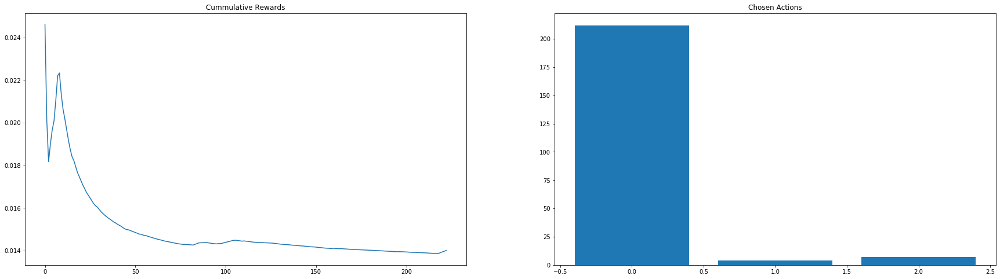

Iteration 504
Average rewards per algo {'quick_sort': 0.0134124592592461, 'merge_sort': 0.01890325714280802, 'heap_sort': 0.024635099999977685}
Count per chosen algo {'quick_sort': 270, 'merge_sort': 7, 'heap_sort': 5}


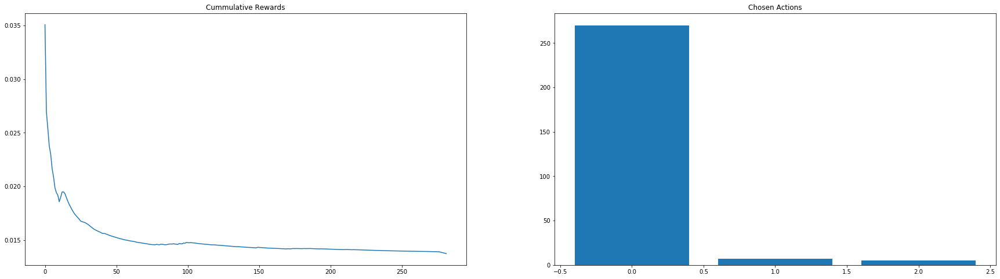

Iteration 1004
Average rewards per algo {'quick_sort': 0.004930021126787785, 'merge_sort': 0.003842166276361632, 'heap_sort': 0.010782700000163459}
Count per chosen algo {'quick_sort': 71, 'merge_sort': 427, 'heap_sort': 2}


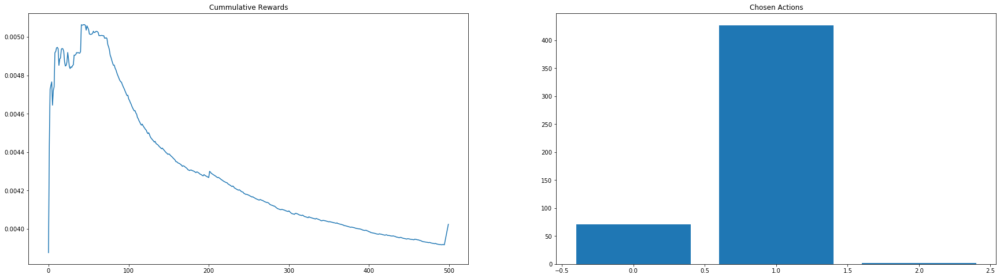

Iteration 1504
Average rewards per algo {'quick_sort': 0.013044281159417933, 'merge_sort': 0.014917981578928687, 'heap_sort': 0.022507199999987886}
Count per chosen algo {'quick_sort': 345, 'merge_sort': 152, 'heap_sort': 3}


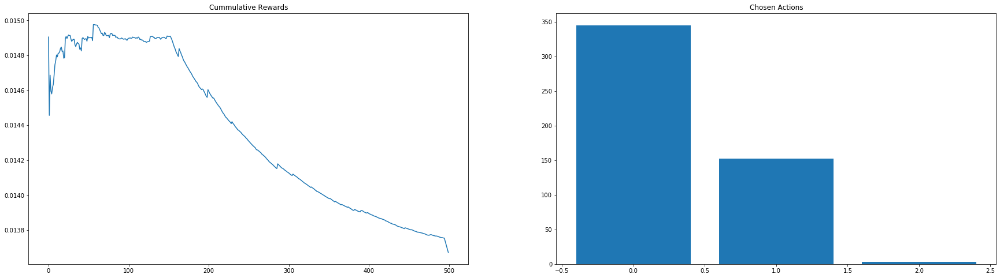

Iteration 1999
Average rewards per algo {'quick_sort': 0.0052689666666386374, 'merge_sort': 0.00382699696312237, 'heap_sort': 0.011674312903206526}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 461, 'heap_sort': 31}


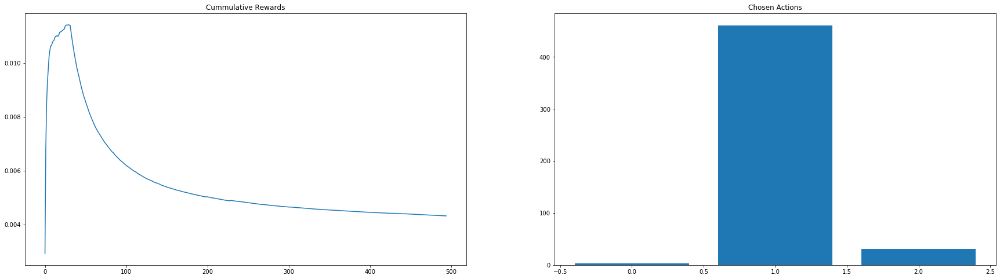

Total reward 17.9911


In [37]:
for elem in list_iteration_results_TS_ttest:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Iteration", n)
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_TS_ttest,4))

### Second Variant: Change point detection 

## Offline changepoint detection - not adjustable to out case but works properly

In [14]:
list_iteration_results_TS_stationary, total_reward_TS_stationary = TS_stationary(list_distributions=list_distributions, n_samples=n_samples)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.29751062659718164
Less than two values for merge_sort
merge_sort Theta 0.04612157996920385
Less than two values for heap_sort
heap_sort Theta 0.896915146762311


Chosen algorithm is:  merge_sort with reward: 0.02041810000000055
Sample mean is:  0.02041810000000055 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.03396091841515125
Less than two values for merge_sort
merge_sort Theta 0.8123448458653838
Less than two values for heap_sort
heap_sort Theta 0.8310977457983609


Chosen algorithm is:  quick_sort with reward: 0.016624999999990564
Sample mean is:  0.016624999999990564 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.9693918357129502
Less than two values for merge_sort
merge_sort Theta 0.9087066921488425
Less than two values for heap_sort
heap_sort Theta 0.9149861586035927


Chosen algorithm is:  merge_sort with reward: 0.0



Chosen algorithm is:  merge_sort with reward: 0.018084800000011114
Sample mean is:  0.017056862500001085 Sample variance is: 1.9798414923491324e-06


Iteration: 25
Less than two values for quick_sort
quick_sort Theta 0.6743454167328148
merge_sort Theta 0.018525130837279063
Less than two values for heap_sort
heap_sort Theta 0.2065818608437533


Chosen algorithm is:  merge_sort with reward: 0.01676390000000083
Sample mean is:  0.017045144000001074 Sample variance is: 1.9039435904691726e-06


Iteration: 26
Less than two values for quick_sort
quick_sort Theta 0.6462832300471987
merge_sort Theta 0.01875523491914558
Less than two values for heap_sort
heap_sort Theta 0.7803912073024658


Chosen algorithm is:  merge_sort with reward: 0.016421100000002298
Sample mean is:  0.01702114230769343 Sample variance is: 1.8451170216765148e-06


Iteration: 27
Less than two values for quick_sort
quick_sort Theta 0.6292931713555654
merge_sort Theta 0.017120701386019968
Less than two values for heap_sort


Less than two values for heap_sort
heap_sort Theta 0.1677945633900726


Chosen algorithm is:  merge_sort with reward: 0.01648729999999432
Sample mean is:  0.01651235000000038 Sample variance is: 1.993907482886841e-06


Iteration: 53
Less than two values for quick_sort
quick_sort Theta 0.26454306042011255
merge_sort Theta 0.0157252604435178
Less than two values for heap_sort
heap_sort Theta 0.3887889391361371


Chosen algorithm is:  merge_sort with reward: 0.0181386999999944
Sample mean is:  0.01654303584905687 Sample variance is: 2.005250896263838e-06


Iteration: 54
Less than two values for quick_sort
quick_sort Theta 0.6779039744119375
merge_sort Theta 0.017319318417756354
Less than two values for heap_sort
heap_sort Theta 0.15287687648343418


Chosen algorithm is:  merge_sort with reward: 0.019331600000001004
Sample mean is:  0.016594675925926207 Sample variance is: 2.1094515899778584e-06


Iteration: 55
Less than two values for quick_sort
quick_sort Theta 0.7714117023827668
merge_s



Iteration: 78
Less than two values for quick_sort
quick_sort Theta 0.2580548480620206
merge_sort Theta 0.015353871985708064
Less than two values for heap_sort
heap_sort Theta 0.5472534601620133


Chosen algorithm is:  merge_sort with reward: 0.01459489999999164
Sample mean is:  0.016816891025641576 Sample variance is: 2.711762324664619e-06


Iteration: 79
Less than two values for quick_sort
quick_sort Theta 0.8468774813152946
merge_sort Theta 0.019146293054159498
Less than two values for heap_sort
heap_sort Theta 0.6779442386355183


Chosen algorithm is:  merge_sort with reward: 0.016334200000002852
Sample mean is:  0.01681078101265881 Sample variance is: 2.680348135463786e-06


Iteration: 80
Less than two values for quick_sort
quick_sort Theta 0.01510526492152564
merge_sort Theta 0.01661354392956187
Less than two values for heap_sort
heap_sort Theta 0.0914718325051358


Chosen algorithm is:  quick_sort with reward: 0.013522800000004054
Sample mean is:  0.015073899999997309 Sample va


Chosen algorithm is:  quick_sort with reward: 0.01666190000000256
Sample mean is:  0.014990983999999798 Sample variance is: 1.3291085261408043e-06


Iteration: 107
quick_sort Theta 0.01567412317221104
merge_sort Theta 0.015246764996883523
Less than two values for heap_sort
heap_sort Theta 0.8544436746691311


Chosen algorithm is:  merge_sort with reward: 0.02052550000000508
Sample mean is:  0.01680983373494036 Sample variance is: 2.7826860316349315e-06


Iteration: 108
quick_sort Theta 0.014922024757127143
merge_sort Theta 0.01742260219934189
Less than two values for heap_sort
heap_sort Theta 0.30791209592035607


Chosen algorithm is:  quick_sort with reward: 0.015709600000008095
Sample mean is:  0.015018623076923195 Sample variance is: 1.2970869317725156e-06


Iteration: 109
quick_sort Theta 0.015676935864425184
merge_sort Theta 0.016476693506085528
Less than two values for heap_sort
heap_sort Theta 0.8925983378921307


Chosen algorithm is:  quick_sort with reward: 0.0148798000000027

Less than two values for heap_sort
heap_sort Theta 0.29107485827813284


Chosen algorithm is:  quick_sort with reward: 0.014786799999995992
Sample mean is:  0.014815894339621594 Sample variance is: 1.2995538582688056e-06


Iteration: 136
quick_sort Theta 0.015425662607449453
merge_sort Theta 0.016250857995240613
Less than two values for heap_sort
heap_sort Theta 0.011348161365783205


Chosen algorithm is:  heap_sort with reward: 0.02245659999999816
Sample mean is:  0.02245659999999816 Sample variance is: 0.0


Iteration: 137
quick_sort Theta 0.014594465224998304
merge_sort Theta 0.016494940357607183
Less than two values for heap_sort
heap_sort Theta 0.5709921502316304


Chosen algorithm is:  quick_sort with reward: 0.012916499999988673
Sample mean is:  0.014780720370369134 Sample variance is: 1.3410600760662174e-06


Iteration: 138
quick_sort Theta 0.01542543192367471
merge_sort Theta 0.01563314698074358
Less than two values for heap_sort
heap_sort Theta 0.2201806795815907


Chosen alg



Iteration: 169
quick_sort Theta 0.014775109664638929
merge_sort Theta 0.017949035989238
Less than two values for heap_sort
heap_sort Theta 0.4681445689252617


Chosen algorithm is:  quick_sort with reward: 0.015939600000010046
Sample mean is:  0.01529947764705773 Sample variance is: 2.4734307958545393e-06


Iteration: 170
quick_sort Theta 0.01557100372090955
merge_sort Theta 0.017128729272883683
Less than two values for heap_sort
heap_sort Theta 0.510583493353326


Chosen algorithm is:  quick_sort with reward: 0.015030200000012428
Sample mean is:  0.01529634651162697 Sample variance is: 2.445503313419218e-06


Iteration: 171
quick_sort Theta 0.014779433170232474
merge_sort Theta 0.017906426537693285
Less than two values for heap_sort
heap_sort Theta 0.4015027072789381


Chosen algorithm is:  quick_sort with reward: 0.013631300000000124
Sample mean is:  0.015277208045976086 Sample variance is: 2.448894234534064e-06


Iteration: 172
quick_sort Theta 0.016230303450965957
merge_sort Thet

quick_sort Theta 0.015436291699646566
merge_sort Theta 0.01698532255166661
heap_sort Theta 0.02459663134370352


Chosen algorithm is:  quick_sort with reward: 0.013714300000003732
Sample mean is:  0.015153763888888092 Sample variance is: 2.299135508604255e-06


Iteration: 199
quick_sort Theta 0.015489280332852514
merge_sort Theta 0.014905146704178815
heap_sort Theta 0.022129343606673454


Chosen algorithm is:  merge_sort with reward: 0.014931300000000647
Sample mean is:  0.01677976888888916 Sample variance is: 2.6640895301448024e-06


Iteration: 200
quick_sort Theta 0.013541985750143988
merge_sort Theta 0.01637378630245403
heap_sort Theta 0.022493375945464304


Chosen algorithm is:  quick_sort with reward: 0.014683300000001509
Sample mean is:  0.015149447706421243 Sample variance is: 2.280054500844196e-06


Iteration: 201
quick_sort Theta 0.015656719706236846
merge_sort Theta 0.017359401920478423
heap_sort Theta 0.023312487237606733


Chosen algorithm is:  quick_sort with reward: 0.014

Sample mean is:  0.015015963970587432 Sample variance is: 1.92743318215833e-06


Iteration: 229
quick_sort Theta 0.014493523953980783
merge_sort Theta 0.016872019230036058
heap_sort Theta 0.029174727762833728


Chosen algorithm is:  quick_sort with reward: 0.014797099999995567
Sample mean is:  0.015014366423356835 Sample variance is: 1.9137114201870515e-06


Iteration: 230
quick_sort Theta 0.014850966328466404
merge_sort Theta 0.016697441107164698
heap_sort Theta 0.022323318478295936


Chosen algorithm is:  quick_sort with reward: 0.015055199999991942
Sample mean is:  0.015014662318839697 Sample variance is: 1.899855941044464e-06


Iteration: 231
quick_sort Theta 0.014822711590008066
merge_sort Theta 0.015887801908335664
heap_sort Theta 0.01965099086973197


Chosen algorithm is:  quick_sort with reward: 0.014711699999992334
Sample mean is:  0.015012482733812019 Sample variance is: 1.8868434942348436e-06


Iteration: 232
quick_sort Theta 0.014712378700667827
merge_sort Theta 0.016231471

Sample mean is:  0.014893716969696111 Sample variance is: 1.7327902107424176e-06


Iteration: 260
quick_sort Theta 0.015086544523240234
merge_sort Theta 0.017836047472796338
heap_sort Theta 0.02450276006994688


Chosen algorithm is:  quick_sort with reward: 0.013886499999998136
Sample mean is:  0.014887649397589497 Sample variance is: 1.7284262616563604e-06


Iteration: 261
quick_sort Theta 0.01520594032026793
merge_sort Theta 0.01714955545415724
heap_sort Theta 0.011594869455257012


Chosen algorithm is:  heap_sort with reward: 0.02219890000000646
Sample mean is:  0.02300340000000034 Sample variance is: 5.195349449959553e-07


Iteration: 262
quick_sort Theta 0.015080316113284864
merge_sort Theta 0.016466144491094237
heap_sort Theta 0.024184624667767853


Chosen algorithm is:  quick_sort with reward: 0.014548099999998954
Sample mean is:  0.014885616167663806 Sample variance is: 1.7187626517746316e-06


Iteration: 263
quick_sort Theta 0.015365327191665452
merge_sort Theta 0.016158634553

Sample mean is:  0.014738488775509553 Sample variance is: 1.638690634873748e-06


Iteration: 292
quick_sort Theta 0.01500785560725514
merge_sort Theta 0.01660808606589743
heap_sort Theta 0.02724634598349386


Chosen algorithm is:  quick_sort with reward: 0.014292100000005803
Sample mean is:  0.014736222842638976 Sample variance is: 1.6313787608484814e-06


Iteration: 293
quick_sort Theta 0.013650843119448947
merge_sort Theta 0.01647200310147478
heap_sort Theta 0.021617179643698272


Chosen algorithm is:  quick_sort with reward: 0.014764299999995956
Sample mean is:  0.01473636464646401 Sample variance is: 1.623143435517514e-06


Iteration: 294
quick_sort Theta 0.014974902562751058
merge_sort Theta 0.016482529075686033
heap_sort Theta 0.021127799618713933


Chosen algorithm is:  quick_sort with reward: 0.012855500000000575
Sample mean is:  0.014726913065326004 Sample variance is: 1.6326747482711968e-06


Iteration: 295
quick_sort Theta 0.014324426375098107
merge_sort Theta 0.017245441174



Chosen algorithm is:  quick_sort with reward: 0.016982699999999795
Sample mean is:  0.014632173043477421 Sample variance is: 1.5867474612734926e-06


Iteration: 326
quick_sort Theta 0.014801526474649804
merge_sort Theta 0.01748161695856314
heap_sort Theta 0.024888189172812488


Chosen algorithm is:  quick_sort with reward: 0.013669099999987111
Sample mean is:  0.014628003896103005 Sample variance is: 1.5838762363054132e-06


Iteration: 327
quick_sort Theta 0.015327998364109453
merge_sort Theta 0.01562593181239209
heap_sort Theta 0.02202778280723232


Chosen algorithm is:  quick_sort with reward: 0.01327860000000669
Sample mean is:  0.014622187499999141 Sample variance is: 1.5848640206628727e-06


Iteration: 328
quick_sort Theta 0.014597430457156715
merge_sort Theta 0.014690624819323114
heap_sort Theta 0.02333484767047226


Chosen algorithm is:  quick_sort with reward: 0.0133500999999967
Sample mean is:  0.014616727896994839 Sample variance is: 1.584977314629666e-06


Iteration: 329
q

Sample mean is:  0.014615871052630578 Sample variance is: 1.5973083800259311e-06


Iteration: 362
quick_sort Theta 0.014931838701956765
merge_sort Theta 0.016914961654259875
heap_sort Theta 0.023993101494438118


Chosen algorithm is:  quick_sort with reward: 0.014587899999980891
Sample mean is:  0.014615766292133762 Sample variance is: 1.5913288709229314e-06


Iteration: 363
quick_sort Theta 0.014480425784600952
merge_sort Theta 0.015608422768894098
heap_sort Theta 0.019085592023530037


Chosen algorithm is:  quick_sort with reward: 0.014560600000010027
Sample mean is:  0.014615560447760165 Sample variance is: 1.5854023899273823e-06


Iteration: 364
quick_sort Theta 0.014106206756669206
merge_sort Theta 0.016137896597691343
heap_sort Theta 0.022810411914431537


Chosen algorithm is:  quick_sort with reward: 0.013295599999992191
Sample mean is:  0.01461065353159746 Sample variance is: 1.5859615581745538e-06


Iteration: 365
quick_sort Theta 0.014731709238192885
merge_sort Theta 0.016081



Iteration: 394
quick_sort Theta 0.014924590491421788
merge_sort Theta 0.01644244500223088
heap_sort Theta 0.02301532994598398


Chosen algorithm is:  quick_sort with reward: 0.013390899999990324
Sample mean is:  0.014568241554053257 Sample variance is: 1.4860880837116611e-06


Iteration: 395
quick_sort Theta 0.01476115619547883
merge_sort Theta 0.016194865572907904
heap_sort Theta 0.023487171071461147


Chosen algorithm is:  quick_sort with reward: 0.01295900000002348
Sample mean is:  0.014562823232322516 Sample variance is: 1.4897744504019717e-06


Iteration: 396
quick_sort Theta 0.014091751158717174
merge_sort Theta 0.01668981937118055
heap_sort Theta 0.023868605972708564


Chosen algorithm is:  quick_sort with reward: 0.013463300000012168
Sample mean is:  0.014559133557046307 Sample variance is: 1.488818477262047e-06


Iteration: 397
quick_sort Theta 0.014441007906915817
merge_sort Theta 0.016256845955553892
heap_sort Theta 0.025185591992400985


Chosen algorithm is:  quick_sort w



Chosen algorithm is:  quick_sort with reward: 0.01409340000000725
Sample mean is:  0.014508866055045188 Sample variance is: 1.4125638385718573e-06


Iteration: 427
quick_sort Theta 0.013850733516126411
merge_sort Theta 0.018712423138869342
heap_sort Theta 0.021162835874023858


Chosen algorithm is:  quick_sort with reward: 0.01384959999998614
Sample mean is:  0.014506856097560252 Sample variance is: 1.4095782983158796e-06


Iteration: 428
quick_sort Theta 0.014736370055963005
merge_sort Theta 0.017752061427195227
heap_sort Theta 0.020605494428073978


Chosen algorithm is:  quick_sort with reward: 0.014448999999984835
Sample mean is:  0.014506680243160326 Sample variance is: 1.405304009122753e-06


Iteration: 429
quick_sort Theta 0.014497064001341514
merge_sort Theta 0.01593367640468679
heap_sort Theta 0.022024181746081332


Chosen algorithm is:  quick_sort with reward: 0.014680999999995947
Sample mean is:  0.014507208484847706 Sample variance is: 1.401137316048626e-06


Iteration: 43



Chosen algorithm is:  quick_sort with reward: 0.016193600000008246
Sample mean is:  0.0145829245179056 Sample variance is: 1.6172857308870346e-06


Iteration: 463
quick_sort Theta 0.014523366355524158
merge_sort Theta 0.017241508558393223
heap_sort Theta 0.025859902697927567


Chosen algorithm is:  quick_sort with reward: 0.017262499999986858
Sample mean is:  0.014590285989010217 Sample variance is: 1.6325140644469247e-06


Iteration: 464
quick_sort Theta 0.015645297308830797
merge_sort Theta 0.014830723786772882
heap_sort Theta 0.02374129952499775


Chosen algorithm is:  merge_sort with reward: 0.01929079999999317
Sample mean is:  0.016755889473684622 Sample variance is: 2.6525368853633935e-06


Iteration: 465
quick_sort Theta 0.01451657440158275
merge_sort Theta 0.016620895465974523
heap_sort Theta 0.021339185845038952


Chosen algorithm is:  quick_sort with reward: 0.01683169999998313
Sample mean is:  0.014596426849314253 Sample variance is: 1.6417679233340862e-06


Iteration: 466



Iteration: 497
quick_sort Theta 0.01413482489090702
merge_sort Theta 0.016879310992746466
heap_sort Theta 0.024901244867716832


Chosen algorithm is:  quick_sort with reward: 0.019846199999989267
Sample mean is:  0.014643060705289111 Sample variance is: 1.7579651008233744e-06


Iteration: 498
quick_sort Theta 0.015193343213915366
merge_sort Theta 0.015089466361421977
heap_sort Theta 0.02432436493907483


Chosen algorithm is:  merge_sort with reward: 0.016820599999988417
Sample mean is:  0.016756563541666953 Sample variance is: 2.62494945773378e-06


Iteration: 499
quick_sort Theta 0.014937188093519954
merge_sort Theta 0.015431001849887795
heap_sort Theta 0.021581413538131672


Chosen algorithm is:  quick_sort with reward: 0.018990900000005695
Sample mean is:  0.014653984924622571 Sample variance is: 1.8009255145966811e-06


Iteration: 500
quick_sort Theta 0.014767807969013952
merge_sort Theta 0.016431563064394968
heap_sort Theta 0.02438558479449408


Chosen algorithm is:  quick_sort 


Iteration: 527
quick_sort Theta 0.014356894088614465
merge_sort Theta 0.016220252503338927
heap_sort Theta 0.021537775285886303


Chosen algorithm is:  quick_sort with reward: 0.007104100000020708
Sample mean is:  0.014092144835680121 Sample variance is: 6.263053176793775e-06


Iteration: 528
quick_sort Theta 0.013826046782650276
merge_sort Theta 0.016217597034866183
heap_sort Theta 0.022750143084585787


Chosen algorithm is:  quick_sort with reward: 0.007474900000005391
Sample mean is:  0.01407664777517503 Sample variance is: 6.350693289662335e-06


Iteration: 529
quick_sort Theta 0.013659418336292934
merge_sort Theta 0.01679973167625271
heap_sort Theta 0.026565317220504123


Chosen algorithm is:  quick_sort with reward: 0.005763199999989865
Sample mean is:  0.014057223831775063 Sample variance is: 6.496957870695104e-06


Iteration: 530
quick_sort Theta 0.014064637368847362
merge_sort Theta 0.015851520356453864
heap_sort Theta 0.02153950439395122


Chosen algorithm is:  quick_sort wi



Iteration: 559
quick_sort Theta 0.013182570471670098
merge_sort Theta 0.01667661687519813
heap_sort Theta 0.022878954874502234


Chosen algorithm is:  quick_sort with reward: 0.005221500000004653
Sample mean is:  0.013514567467248304 Sample variance is: 1.0339871928440125e-05


Iteration: 560
quick_sort Theta 0.013586874709076205
merge_sort Theta 0.01580612749409946
heap_sort Theta 0.023851358985266437


Chosen algorithm is:  quick_sort with reward: 0.005149700000004032
Sample mean is:  0.013496343355119232 Sample variance is: 1.0469455138752657e-05


Iteration: 561
quick_sort Theta 0.01320138686834661
merge_sort Theta 0.016595083174234873
heap_sort Theta 0.024112194347020034


Chosen algorithm is:  quick_sort with reward: 0.005017699999996239
Sample mean is:  0.01347791152173853 Sample variance is: 1.0602632662802666e-05


Iteration: 562
quick_sort Theta 0.013178997903676286
merge_sort Theta 0.016551635816537513
heap_sort Theta 0.021877655020046977


Chosen algorithm is:  quick_sort



Chosen algorithm is:  quick_sort with reward: 0.008144100000009757
Sample mean is:  0.012989748163264737 Sample variance is: 1.3645190834456097e-05


Iteration: 592
quick_sort Theta 0.014013424479881628
merge_sort Theta 0.01815457481438142
heap_sort Theta 0.023803471969373647


Chosen algorithm is:  quick_sort with reward: 0.004560699999984763
Sample mean is:  0.012972581059062538 Sample variance is: 1.3761807860436326e-05


Iteration: 593
quick_sort Theta 0.012595011915885603
merge_sort Theta 0.01754473754408341
heap_sort Theta 0.02227178841660673


Chosen algorithm is:  quick_sort with reward: 0.00482080000000451
Sample mean is:  0.012956012398373396 Sample variance is: 1.3868626280111128e-05


Iteration: 594
quick_sort Theta 0.012078316342850757
merge_sort Theta 0.017630529636252338
heap_sort Theta 0.02790828914186365


Chosen algorithm is:  quick_sort with reward: 0.005104299999999284
Sample mean is:  0.012940086004056207 Sample variance is: 1.3965291010007578e-05


Iteration: 59

heap_sort Theta 0.024310574866669488


Chosen algorithm is:  quick_sort with reward: 0.0075046999999983655
Sample mean is:  0.012504123709368634 Sample variance is: 1.6315036197561816e-05


Iteration: 625
quick_sort Theta 0.011554730672762272
merge_sort Theta 0.016544679625894915
heap_sort Theta 0.02677621166584137


Chosen algorithm is:  quick_sort with reward: 0.0060320999999987635
Sample mean is:  0.012491772519083578 Sample variance is: 1.6363685276761666e-05


Iteration: 626
quick_sort Theta 0.0117509816741729
merge_sort Theta 0.017235275145820413
heap_sort Theta 0.02248706885297386


Chosen algorithm is:  quick_sort with reward: 0.004159200000003693
Sample mean is:  0.012475900952380568 Sample variance is: 1.6464515426339603e-05


Iteration: 627
quick_sort Theta 0.011792336069243183
merge_sort Theta 0.0161172603524309
heap_sort Theta 0.022979332371078017


Chosen algorithm is:  quick_sort with reward: 0.005010900000002039
Sample mean is:  0.012461708935360838 Sample variance is: 



Chosen algorithm is:  quick_sort with reward: 0.007347899999984975
Sample mean is:  0.012083057657657402 Sample variance is: 1.8302360665968518e-05


Iteration: 657
quick_sort Theta 0.009504336870005368
merge_sort Theta 0.015929177067848754
heap_sort Theta 0.022370439021215018


Chosen algorithm is:  quick_sort with reward: 0.004921500000023116
Sample mean is:  0.012070177158273167 Sample variance is: 1.8361521282836598e-05


Iteration: 658
quick_sort Theta 0.013294959606227692
merge_sort Theta 0.016327185820320656
heap_sort Theta 0.023653498088917996


Chosen algorithm is:  quick_sort with reward: 0.005049600000006649
Sample mean is:  0.012057572890484538 Sample variance is: 1.8416886620570535e-05


Iteration: 659
quick_sort Theta 0.011867929346600008
merge_sort Theta 0.0172160280110949
heap_sort Theta 0.02259638249644674


Chosen algorithm is:  quick_sort with reward: 0.00480669999998895
Sample mean is:  0.012044578494623434 Sample variance is: 1.8477933305769236e-05


Iteration: 6


Iteration: 687
quick_sort Theta 0.011956045370688584
merge_sort Theta 0.017620452185453894
heap_sort Theta 0.020389553031296023


Chosen algorithm is:  quick_sort with reward: 0.008227000000005091
Sample mean is:  0.011752175426620987 Sample variance is: 1.9366842074817384e-05


Iteration: 688
quick_sort Theta 0.010998589061736352
merge_sort Theta 0.016342343618513784
heap_sort Theta 0.025855926859692725


Chosen algorithm is:  quick_sort with reward: 0.008826400000003787
Sample mean is:  0.011747191141396766 Sample variance is: 1.93484072142943e-05


Iteration: 689
quick_sort Theta 0.010492268472355976
merge_sort Theta 0.015399988949715811
heap_sort Theta 0.024055405719650796


Chosen algorithm is:  quick_sort with reward: 0.00611169999999106
Sample mean is:  0.011737606972788934 Sample variance is: 1.9369421400847502e-05


Iteration: 690
quick_sort Theta 0.011128333424703983
merge_sort Theta 0.016447546318400792
heap_sort Theta 0.02270085710115099


Chosen algorithm is:  quick_sort 

heap_sort Theta 0.01894377775236341


Chosen algorithm is:  quick_sort with reward: 0.0062886000000048625
Sample mean is:  0.011404926171243696 Sample variance is: 2.051106220648384e-05


Iteration: 721
quick_sort Theta 0.011420326873435423
merge_sort Theta 0.01799967594024775
heap_sort Theta 0.024016347766592665


Chosen algorithm is:  quick_sort with reward: 0.005766300000004776
Sample mean is:  0.011395831612902987 Sample variance is: 2.052917795177065e-05


Iteration: 722
quick_sort Theta 0.01138655496009786
merge_sort Theta 0.015637698372220173
heap_sort Theta 0.021496202628111628


Chosen algorithm is:  quick_sort with reward: 0.007672899999988658
Sample mean is:  0.011389836553944993 Sample variance is: 2.0518402947983454e-05


Iteration: 723
quick_sort Theta 0.011400353462218056
merge_sort Theta 0.01639535724485957
heap_sort Theta 0.022183806693255606


Chosen algorithm is:  quick_sort with reward: 0.006153600000004644
Sample mean is:  0.011381418167202324 Sample variance is: 2



Chosen algorithm is:  quick_sort with reward: 0.0071783999999865955
Sample mean is:  0.011110878167938827 Sample variance is: 2.0941407019655523e-05


Iteration: 757
quick_sort Theta 0.010332558339001503
merge_sort Theta 0.01711811830198162
heap_sort Theta 0.024628743641761108


Chosen algorithm is:  quick_sort with reward: 0.007020199999999477
Sample mean is:  0.011104642378048675 Sample variance is: 2.0934953867589116e-05


Iteration: 758
quick_sort Theta 0.009731140894808773
merge_sort Theta 0.01588618843792394
heap_sort Theta 0.020855821560815002


Chosen algorithm is:  quick_sort with reward: 0.0055405999999891264
Sample mean is:  0.011096173515981614 Sample variance is: 2.0950138787847593e-05


Iteration: 759
quick_sort Theta 0.011355162120130536
merge_sort Theta 0.01676190553308624
heap_sort Theta 0.021885904686831055


Chosen algorithm is:  quick_sort with reward: 0.0057780999999863525
Sample mean is:  0.011088091337385876 Sample variance is: 2.0961215969479416e-05


Iteratio



Chosen algorithm is:  quick_sort with reward: 0.005263299999995752
Sample mean is:  0.010845865065502037 Sample variance is: 2.1425878261336943e-05


Iteration: 789
quick_sort Theta 0.011677173742230804
merge_sort Theta 0.016427854301543462
heap_sort Theta 0.02289121119185398


Chosen algorithm is:  quick_sort with reward: 0.0050147999999978765
Sample mean is:  0.010837389680232408 Sample variance is: 2.144408468722916e-05


Iteration: 790
quick_sort Theta 0.01027430237906285
merge_sort Theta 0.0167455973748824
heap_sort Theta 0.020681767308086123


Chosen algorithm is:  quick_sort with reward: 0.005819999999999936
Sample mean is:  0.010830107547169662 Sample variance is: 2.144944546693423e-05


Iteration: 791
quick_sort Theta 0.01109109837375625
merge_sort Theta 0.016621981663430527
heap_sort Theta 0.026520028188254996


Chosen algorithm is:  quick_sort with reward: 0.005654000000021142
Sample mean is:  0.010822605942028867 Sample variance is: 2.1457132154988912e-05


Iteration: 792

Sample mean is:  0.01061559819444433 Sample variance is: 2.1558852745089303e-05


Iteration: 822
quick_sort Theta 0.011829100116544157
merge_sort Theta 0.01701119326094238
heap_sort Theta 0.023806430440735497


Chosen algorithm is:  quick_sort with reward: 0.006377200000002858
Sample mean is:  0.01060971969486813 Sample variance is: 2.1553832288900073e-05


Iteration: 823
quick_sort Theta 0.010429827571490888
merge_sort Theta 0.017198354235425796
heap_sort Theta 0.023046614850087244


Chosen algorithm is:  quick_sort with reward: 0.0062328000000206885
Sample mean is:  0.010603657479224296 Sample variance is: 2.1550476416178743e-05


Iteration: 824
quick_sort Theta 0.010021765430569637
merge_sort Theta 0.017329858931500818
heap_sort Theta 0.023880886509628378


Chosen algorithm is:  quick_sort with reward: 0.0058474000000217075
Sample mean is:  0.010597078976486811 Sample variance is: 2.155191517100508e-05


Iteration: 825
quick_sort Theta 0.011198188050020375
merge_sort Theta 0.0185508



Iteration: 852
quick_sort Theta 0.009391041792116004
merge_sort Theta 0.015761098646319523
heap_sort Theta 0.023398904476051113


Chosen algorithm is:  quick_sort with reward: 0.0076035000000160835
Sample mean is:  0.010429318508654984 Sample variance is: 2.1495046640838503e-05


Iteration: 853
quick_sort Theta 0.010997449668719737
merge_sort Theta 0.016221826455445735
heap_sort Theta 0.021027430909519817


Chosen algorithm is:  quick_sort with reward: 0.005550499999998237
Sample mean is:  0.010422830718084962 Sample variance is: 2.1498073463507203e-05


Iteration: 854
quick_sort Theta 0.010821755892398737
merge_sort Theta 0.015705943478399976
heap_sort Theta 0.022821931052051783


Chosen algorithm is:  quick_sort with reward: 0.006747399999994741
Sample mean is:  0.010417949667994536 Sample variance is: 2.1487439701938193e-05


Iteration: 855
quick_sort Theta 0.010262909811461374
merge_sort Theta 0.01765875325367471
heap_sort Theta 0.026149154237451587


Chosen algorithm is:  quick_


Iteration: 882
quick_sort Theta 0.009670995445867706
merge_sort Theta 0.01735622485025085
heap_sort Theta 0.023092591698422437


Chosen algorithm is:  quick_sort with reward: 0.005285399999991114
Sample mean is:  0.010271607554417288 Sample variance is: 2.1339256473907863e-05


Iteration: 883
quick_sort Theta 0.010571135863197894
merge_sort Theta 0.016559550734301633
heap_sort Theta 0.02330041713730839


Chosen algorithm is:  quick_sort with reward: 0.00528920000002131
Sample mean is:  0.010265236189258214 Sample variance is: 2.1343672565757345e-05


Iteration: 884
quick_sort Theta 0.009551993095145424
merge_sort Theta 0.016769108519826235
heap_sort Theta 0.02326391767365416


Chosen algorithm is:  quick_sort with reward: 0.005158499999993182
Sample mean is:  0.010258714176245104 Sample variance is: 2.1349677387904353e-05


Iteration: 885
quick_sort Theta 0.01113708210184296
merge_sort Theta 0.017461917717115256
heap_sort Theta 0.025368469189100493


Chosen algorithm is:  quick_sort w


Chosen algorithm is:  quick_sort with reward: 0.005404000000027054
Sample mean is:  0.010077576998769988 Sample variance is: 2.14459590366981e-05


Iteration: 915
quick_sort Theta 0.009619957463945679
merge_sort Theta 0.01689660858473764
heap_sort Theta 0.02234774828346195


Chosen algorithm is:  quick_sort with reward: 0.004150699999996732
Sample mean is:  0.010070295823095819 Sample variance is: 2.146271426678319e-05


Iteration: 916
quick_sort Theta 0.010172659810046317
merge_sort Theta 0.017328004900222377
heap_sort Theta 0.021914943583865556


Chosen algorithm is:  quick_sort with reward: 0.004273299999994151
Sample mean is:  0.010063182944785264 Sample variance is: 2.1477562380869593e-05


Iteration: 917
quick_sort Theta 0.010283063412445451
merge_sort Theta 0.016249774258985144
heap_sort Theta 0.020903039636517406


Chosen algorithm is:  quick_sort with reward: 0.006067400000006273
Sample mean is:  0.01005828615196078 Sample variance is: 2.1470784381408396e-05


Iteration: 918


Iteration: 946
quick_sort Theta 0.010148853580853138
merge_sort Theta 0.017356658993932288
heap_sort Theta 0.022988224893295953


Chosen algorithm is:  quick_sort with reward: 0.005144699999988234
Sample mean is:  0.009899753727810537 Sample variance is: 2.146447947968904e-05


Iteration: 947
quick_sort Theta 0.009535251952643866
merge_sort Theta 0.01646716410751078
heap_sort Theta 0.025011118045958392


Chosen algorithm is:  quick_sort with reward: 0.004649900000003981
Sample mean is:  0.009893548226950245 Sample variance is: 2.1471647218119124e-05


Iteration: 948
quick_sort Theta 0.010130113130295043
merge_sort Theta 0.018258280476702596
heap_sort Theta 0.022465174312652915


Chosen algorithm is:  quick_sort with reward: 0.00497339999998303
Sample mean is:  0.009887739315230095 Sample variance is: 2.147484394852114e-05


Iteration: 949
quick_sort Theta 0.011076325898461057
merge_sort Theta 0.018146970567537158
heap_sort Theta 0.02200514974864312


Chosen algorithm is:  quick_sort wi

Chosen algorithm is:  quick_sort with reward: 0.0050105999999914275
Sample mean is:  0.009722128962371589 Sample variance is: 2.153046159375264e-05


Iteration: 979
quick_sort Theta 0.009288268988202283
merge_sort Theta 0.014788472768906338
heap_sort Theta 0.024509938211795153


Chosen algorithm is:  quick_sort with reward: 0.004240100000004077
Sample mean is:  0.009715885193621739 Sample variance is: 2.1540128964401113e-05


Iteration: 980
quick_sort Theta 0.009255897674515472
merge_sort Theta 0.017561822835096347
heap_sort Theta 0.023785824109316303


Chosen algorithm is:  quick_sort with reward: 0.004197699999991755
Sample mean is:  0.009709607394766643 Sample variance is: 2.1550226344162324e-05


Iteration: 981
quick_sort Theta 0.00990606415034954
merge_sort Theta 0.015770786481554302
heap_sort Theta 0.02305703182712723


Chosen algorithm is:  quick_sort with reward: 0.004296700000026021
Sample mean is:  0.009703456363636256 Sample variance is: 2.1558994577296398e-05


Iteration: 9

Sample mean is:  0.009662413516483382 Sample variance is: 2.147452173149455e-05


Iteration: 1012
quick_sort Theta 0.008978046315877921
merge_sort Theta 0.018846804889970807
heap_sort Theta 0.02266885653461072


Chosen algorithm is:  quick_sort with reward: 0.013366300000001274
Sample mean is:  0.009666479253567376 Sample variance is: 2.1465991758193407e-05


Iteration: 1013
quick_sort Theta 0.009843513903567705
merge_sort Theta 0.015865334760874872
heap_sort Theta 0.024963695584533815


Chosen algorithm is:  quick_sort with reward: 0.013856400000008762
Sample mean is:  0.009671073464912158 Sample variance is: 2.146168276117788e-05


Iteration: 1014
quick_sort Theta 0.008464683863570839
merge_sort Theta 0.01619417286921514
heap_sort Theta 0.02117882712139328


Chosen algorithm is:  quick_sort with reward: 0.013329099999992877
Sample mean is:  0.009675080065717285 Sample variance is: 2.1452816188470448e-05


Iteration: 1015
quick_sort Theta 0.00870760267098364
merge_sort Theta 0.0168234



Iteration: 1042
quick_sort Theta 0.00993455480470516
merge_sort Theta 0.018202919012301137
heap_sort Theta 0.023088447122883087


Chosen algorithm is:  quick_sort with reward: 0.014046600000000353
Sample mean is:  0.009792424229542917 Sample variance is: 2.1269149479260257e-05


Iteration: 1043
quick_sort Theta 0.009190078920258376
merge_sort Theta 0.01719151995831531
heap_sort Theta 0.022792710983236385


Chosen algorithm is:  quick_sort with reward: 0.013868799999983139
Sample mean is:  0.009796751592356547 Sample variance is: 2.126419199516859e-05


Iteration: 1044
quick_sort Theta 0.009912625050609868
merge_sort Theta 0.016814330673226234
heap_sort Theta 0.024077234479683407


Chosen algorithm is:  quick_sort with reward: 0.013371899999981451
Sample mean is:  0.009800542841993477 Sample variance is: 2.1255182387386266e-05


Iteration: 1045
quick_sort Theta 0.009708814730181588
merge_sort Theta 0.01761983553869508
heap_sort Theta 0.022025324870564928


Chosen algorithm is:  quick_



Iteration: 1076
quick_sort Theta 0.010144309910950274
merge_sort Theta 0.017809864872972567
heap_sort Theta 0.02323689466014333


Chosen algorithm is:  quick_sort with reward: 0.0178863000000149
Sample mean is:  0.009957725641025537 Sample variance is: 2.1347675503852277e-05


Iteration: 1077
quick_sort Theta 0.009417367022106347
merge_sort Theta 0.01708643635736726
heap_sort Theta 0.022878144404733465


Chosen algorithm is:  quick_sort with reward: 0.016893900000013673
Sample mean is:  0.00996483237704909 Sample variance is: 2.137504593999393e-05


Iteration: 1078
quick_sort Theta 0.010622315375198917
merge_sort Theta 0.017416535071862548
heap_sort Theta 0.021504627423147675


Chosen algorithm is:  quick_sort with reward: 0.01602930000001379
Sample mean is:  0.009971039611054172 Sample variance is: 2.1390772734303388e-05


Iteration: 1079
quick_sort Theta 0.009286955785783247
merge_sort Theta 0.015398282608344431
heap_sort Theta 0.02186445182185856


Chosen algorithm is:  quick_sort


Iteration: 1110
quick_sort Theta 0.011194366026470762
merge_sort Theta 0.017638835866241993
heap_sort Theta 0.021808236069143838


Chosen algorithm is:  quick_sort with reward: 0.017443700000001172
Sample mean is:  0.01011661516352817 Sample variance is: 2.140428305067937e-05


Iteration: 1111
quick_sort Theta 0.009506518089448631
merge_sort Theta 0.015702820677303917
heap_sort Theta 0.023947447570364894


Chosen algorithm is:  quick_sort with reward: 0.015163099999995211
Sample mean is:  0.010121611683168236 Sample variance is: 2.140828058661345e-05


Iteration: 1112
quick_sort Theta 0.010003206508772962
merge_sort Theta 0.018225553640620454
heap_sort Theta 0.023426760834480222


Chosen algorithm is:  quick_sort with reward: 0.014493000000015854
Sample mean is:  0.010125935509396573 Sample variance is: 2.1405987662881106e-05


Iteration: 1113
quick_sort Theta 0.0092185352945095
merge_sort Theta 0.01720184264625018
heap_sort Theta 0.021621650832554237


Chosen algorithm is:  quick_sor



Iteration: 1146
quick_sort Theta 0.011430159678751864
merge_sort Theta 0.01578764904318405
heap_sort Theta 0.022638769745780708


Chosen algorithm is:  quick_sort with reward: 0.0138710999999887
Sample mean is:  0.01025633550239226 Sample variance is: 2.1230734333330432e-05


Iteration: 1147
quick_sort Theta 0.010982594958406457
merge_sort Theta 0.017016413897950063
heap_sort Theta 0.022275151190321668


Chosen algorithm is:  quick_sort with reward: 0.014694800000000896
Sample mean is:  0.010260578776290549 Sample variance is: 2.1229252879355917e-05


Iteration: 1148
quick_sort Theta 0.010925370897367653
merge_sort Theta 0.01672465498200822
heap_sort Theta 0.02293464838319131


Chosen algorithm is:  quick_sort with reward: 0.014505799999994906
Sample mean is:  0.01026463342884423 Sample variance is: 2.1226173067953584e-05


Iteration: 1149
quick_sort Theta 0.010629303778534889
merge_sort Theta 0.01609285622155596
heap_sort Theta 0.020076432442853186


Chosen algorithm is:  quick_sort



Chosen algorithm is:  quick_sort with reward: 0.01572469999999271
Sample mean is:  0.010371749722222165 Sample variance is: 2.0964441275090488e-05


Iteration: 1182
quick_sort Theta 0.01095798876316913
merge_sort Theta 0.015259525772938407
heap_sort Theta 0.022552577005152175


Chosen algorithm is:  quick_sort with reward: 0.012814899999995077
Sample mean is:  0.010374009805735369 Sample variance is: 2.0950564328079415e-05


Iteration: 1183
quick_sort Theta 0.010284798394488466
merge_sort Theta 0.016134460375956488
heap_sort Theta 0.020890263607425887


Chosen algorithm is:  quick_sort with reward: 0.01296699999997486
Sample mean is:  0.010376406284657956 Sample variance is: 2.0937409817703254e-05


Iteration: 1184
quick_sort Theta 0.009280928042523522
merge_sort Theta 0.016062260877572287
heap_sort Theta 0.02433821997503133


Chosen algorithm is:  quick_sort with reward: 0.012975000000011505
Sample mean is:  0.010378805724838338 Sample variance is: 2.0924306442181185e-05


Iteration

Sample mean is:  0.01049511641255604 Sample variance is: 2.0834190510715765e-05


Iteration: 1217
quick_sort Theta 0.010718656952187808
merge_sort Theta 0.016224468053687335
heap_sort Theta 0.02339659258715733


Chosen algorithm is:  quick_sort with reward: 0.014018900000024814
Sample mean is:  0.010498273924731192 Sample variance is: 2.082663830092277e-05


Iteration: 1218
quick_sort Theta 0.010807175832486986
merge_sort Theta 0.015898947774420896
heap_sort Theta 0.022954750816001335


Chosen algorithm is:  quick_sort with reward: 0.01311670000001186
Sample mean is:  0.010500618084154003 Sample variance is: 2.081412565884813e-05


Iteration: 1219
quick_sort Theta 0.010291141483176827
merge_sort Theta 0.01667168910558108
heap_sort Theta 0.02576455043421215


Chosen algorithm is:  quick_sort with reward: 0.013138100000020358
Sample mean is:  0.010502977191413276 Sample variance is: 2.0801724910274738e-05


Iteration: 1220
quick_sort Theta 0.01030555965174141
merge_sort Theta 0.016177017


Chosen algorithm is:  quick_sort with reward: 0.016793900000010353
Sample mean is:  0.01062447140366195 Sample variance is: 2.0877443934353044e-05


Iteration: 1249
quick_sort Theta 0.011013185580109452
merge_sort Theta 0.017904322486012498
heap_sort Theta 0.023699350488184587


Chosen algorithm is:  quick_sort with reward: 0.01901479999997946
Sample mean is:  0.010631780052265012 Sample variance is: 2.0920526554611284e-05


Iteration: 1250
quick_sort Theta 0.009899639825672345
merge_sort Theta 0.016390619010746794
heap_sort Theta 0.02427617616146925


Chosen algorithm is:  quick_sort with reward: 0.015177399999998897
Sample mean is:  0.0106357362053962 Sample variance is: 2.0920286477140465e-05


Iteration: 1251
quick_sort Theta 0.011020648429265596
merge_sort Theta 0.015849534025062895
heap_sort Theta 0.021826354612398523


Chosen algorithm is:  quick_sort with reward: 0.01437080000002311
Sample mean is:  0.010638984086956745 Sample variance is: 2.0914215419773484e-05


Iteration: 1


Iteration: 1279
quick_sort Theta 0.011696047776445003
merge_sort Theta 0.016598907280090926
heap_sort Theta 0.02416995781243552


Chosen algorithm is:  quick_sort with reward: 0.016539399999999205
Sample mean is:  0.010768670713073126 Sample variance is: 2.1155273088963704e-05


Iteration: 1280
quick_sort Theta 0.012216334753989177
merge_sort Theta 0.016805421104821503
heap_sort Theta 0.022633432378095616


Chosen algorithm is:  quick_sort with reward: 0.01569229999998356
Sample mean is:  0.010772846819338528 Sample variance is: 2.1157873844406317e-05


Iteration: 1281
quick_sort Theta 0.010435588090394231
merge_sort Theta 0.017463074573776008
heap_sort Theta 0.0232715234289726


Chosen algorithm is:  quick_sort with reward: 0.014627999999987651
Sample mean is:  0.01077611389830518 Sample variance is: 2.115252785890801e-05


Iteration: 1282
quick_sort Theta 0.011195104521824957
merge_sort Theta 0.01561399507748767
heap_sort Theta 0.023771689208373768


Chosen algorithm is:  quick_sort



Iteration: 1313
quick_sort Theta 0.009907560180134556
merge_sort Theta 0.015859390648149743
heap_sort Theta 0.020733377570745212


Chosen algorithm is:  quick_sort with reward: 0.014467999999993708
Sample mean is:  0.010883664026402744 Sample variance is: 2.1070643289530236e-05


Iteration: 1314
quick_sort Theta 0.010295105517638454
merge_sort Theta 0.016577273458164125
heap_sort Theta 0.02166320120936033


Chosen algorithm is:  quick_sort with reward: 0.01366029999999796
Sample mean is:  0.010885953091508757 Sample variance is: 2.1059623263264627e-05


Iteration: 1315
quick_sort Theta 0.01248508136400633
merge_sort Theta 0.01774885418506842
heap_sort Theta 0.02214137447027149


Chosen algorithm is:  quick_sort with reward: 0.013180500000004258
Sample mean is:  0.010887843163097304 Sample variance is: 2.104660924793851e-05


Iteration: 1316
quick_sort Theta 0.0105434421582268
merge_sort Theta 0.01711072868319846
heap_sort Theta 0.020470343223608013


Chosen algorithm is:  quick_sort 



Iteration: 1347
quick_sort Theta 0.01086701004790498
merge_sort Theta 0.016306963139727005
heap_sort Theta 0.023854787365117643


Chosen algorithm is:  quick_sort with reward: 0.013917299999974375
Sample mean is:  0.010993580658105965 Sample variance is: 2.1010351438059562e-05


Iteration: 1348
quick_sort Theta 0.010791487624624879
merge_sort Theta 0.015784763952665943
heap_sort Theta 0.02118970094467466


Chosen algorithm is:  quick_sort with reward: 0.012923300000011295
Sample mean is:  0.010995128147554165 Sample variance is: 2.099648654558173e-05


Iteration: 1349
quick_sort Theta 0.010794789307325808
merge_sort Theta 0.017397306175101535
heap_sort Theta 0.022241184560436108


Chosen algorithm is:  quick_sort with reward: 0.013954600000005257
Sample mean is:  0.010997499519230809 Sample variance is: 2.098667482209787e-05


Iteration: 1350
quick_sort Theta 0.010552976447966628
merge_sort Theta 0.01801181522739934
heap_sort Theta 0.022774477219693254


Chosen algorithm is:  quick_s

Iteration: 1380
quick_sort Theta 0.01217252494490123
merge_sort Theta 0.016222073600144882
heap_sort Theta 0.0247867136301127


Chosen algorithm is:  quick_sort with reward: 0.016066099999989092
Sample mean is:  0.011090891868647411 Sample variance is: 2.0862547536711345e-05


Iteration: 1381
quick_sort Theta 0.010559177904394434
merge_sort Theta 0.017510637002543135
heap_sort Theta 0.02392388094765346


Chosen algorithm is:  quick_sort with reward: 0.014962700000012319
Sample mean is:  0.011093916718750041 Sample variance is: 2.0857951160953663e-05


Iteration: 1382
quick_sort Theta 0.010735406037481809
merge_sort Theta 0.015455682392124958
heap_sort Theta 0.023624375665079803


Chosen algorithm is:  quick_sort with reward: 0.017449100000021645
Sample mean is:  0.011098877829820511 Sample variance is: 2.0873172764862696e-05


Iteration: 1383
quick_sort Theta 0.012259597530096733
merge_sort Theta 0.017634690518134273
heap_sort Theta 0.025199691590488713


Chosen algorithm is:  quick_so

Chosen algorithm is:  quick_sort with reward: 0.01741030000002297
Sample mean is:  0.011213843009931291 Sample variance is: 2.1073582296613474e-05


Iteration: 1411
quick_sort Theta 0.011268910465683053
merge_sort Theta 0.01777089847849074
heap_sort Theta 0.022112828359972768


Chosen algorithm is:  quick_sort with reward: 0.01771060000001512
Sample mean is:  0.011218802366412272 Sample variance is: 2.1089690731237677e-05


Iteration: 1412
quick_sort Theta 0.012083626533678926
merge_sort Theta 0.01737240647442299
heap_sort Theta 0.021978850848384576


Chosen algorithm is:  quick_sort with reward: 0.017887299999983952
Sample mean is:  0.011223888939740701 Sample variance is: 2.110749793959428e-05


Iteration: 1413
quick_sort Theta 0.010954428860526949
merge_sort Theta 0.01810825908307538
heap_sort Theta 0.02336344422934891


Chosen algorithm is:  quick_sort with reward: 0.01652910000001384
Sample mean is:  0.011227932545731763 Sample variance is: 2.111284574010588e-05


Iteration: 1414




Iteration: 1442
quick_sort Theta 0.011598688160489545
merge_sort Theta 0.016745347652408735
heap_sort Theta 0.024153639681675457


Chosen algorithm is:  quick_sort with reward: 0.015953099999990172
Sample mean is:  0.01133622684563763 Sample variance is: 2.1253170534028584e-05


Iteration: 1443
quick_sort Theta 0.010916708606655532
merge_sort Theta 0.01734292574521592
heap_sort Theta 0.02241637884583689


Chosen algorithm is:  quick_sort with reward: 0.015251299999988532
Sample mean is:  0.011339144187779471 Sample variance is: 2.1248746693240195e-05


Iteration: 1444
quick_sort Theta 0.011021762667450134
merge_sort Theta 0.015818840871964498
heap_sort Theta 0.02336947725186248


Chosen algorithm is:  quick_sort with reward: 0.01470790000001898
Sample mean is:  0.011341652568875702 Sample variance is: 2.1241368673065857e-05


Iteration: 1445
quick_sort Theta 0.011364036108252203
merge_sort Theta 0.017585941664495182
heap_sort Theta 0.023604223916069898


Chosen algorithm is:  quick_s

merge_sort Theta 0.016012012707957452
heap_sort Theta 0.024793860754480493


Chosen algorithm is:  quick_sort with reward: 0.015876300000002175
Sample mean is:  0.01143962381646043 Sample variance is: 2.126993395837626e-05


Iteration: 1475
quick_sort Theta 0.011571522104492273
merge_sort Theta 0.016662464109364117
heap_sort Theta 0.022390962028847498


Chosen algorithm is:  quick_sort with reward: 0.014859999999998763
Sample mean is:  0.011442113173217009 Sample variance is: 2.1262961996761978e-05


Iteration: 1476
quick_sort Theta 0.011768128660589327
merge_sort Theta 0.016709593023568975
heap_sort Theta 0.024467307166724194


Chosen algorithm is:  quick_sort with reward: 0.014659100000017133
Sample mean is:  0.011444452800000136 Sample variance is: 2.1255019099088165e-05


Iteration: 1477
quick_sort Theta 0.011843680286000526
merge_sort Theta 0.016681776293494127
heap_sort Theta 0.027847231574986593


Chosen algorithm is:  quick_sort with reward: 0.01492939999999976
Sample mean is: 



Chosen algorithm is:  quick_sort with reward: 0.007386499999995522
Sample mean is:  0.011503987250712352 Sample variance is: 2.1326099330670468e-05


Iteration: 1506
quick_sort Theta 0.0111095367750942
merge_sort Theta 0.016708871208029854
heap_sort Theta 0.02407564152540355


Chosen algorithm is:  quick_sort with reward: 0.007118099999985361
Sample mean is:  0.011500865622775892 Sample variance is: 2.1324601975892712e-05


Iteration: 1507
quick_sort Theta 0.012114204964757085
merge_sort Theta 0.017527406604733592
heap_sort Theta 0.02524558180907953


Chosen algorithm is:  quick_sort with reward: 0.006883800000025531
Sample mean is:  0.011497581792318743 Sample variance is: 2.132458599532954e-05


Iteration: 1508
quick_sort Theta 0.012373676017874154
merge_sort Theta 0.014888723671893544
heap_sort Theta 0.02275725495114343


Chosen algorithm is:  quick_sort with reward: 0.00625999999999749
Sample mean is:  0.011493859275053413 Sample variance is: 2.1328913060039756e-05


Iteration: 1



Iteration: 1538
quick_sort Theta 0.011675495388381323
merge_sort Theta 0.015989804805961585
heap_sort Theta 0.024530150545274295


Chosen algorithm is:  quick_sort with reward: 0.006721900000002279
Sample mean is:  0.011391321224773964 Sample variance is: 2.1388941054517578e-05


Iteration: 1539
quick_sort Theta 0.011891818600325323
merge_sort Theta 0.015731792200295382
heap_sort Theta 0.022740908987533844


Chosen algorithm is:  quick_sort with reward: 0.006737900000018726
Sample mean is:  0.011388085187760922 Sample variance is: 2.1389115136156778e-05


Iteration: 1540
quick_sort Theta 0.012158893428590414
merge_sort Theta 0.015990838114171287
heap_sort Theta 0.022685244684968707


Chosen algorithm is:  quick_sort with reward: 0.0065696000000059485
Sample mean is:  0.011384736692147472 Sample variance is: 2.139037472593575e-05


Iteration: 1541
quick_sort Theta 0.012123144649208412
merge_sort Theta 0.016952859438507353
heap_sort Theta 0.023939844531784646


Chosen algorithm is:  qu



Iteration: 1571
quick_sort Theta 0.01229812539328969
merge_sort Theta 0.017170061468359574
heap_sort Theta 0.02109159921484394


Chosen algorithm is:  quick_sort with reward: 0.009216599999973596
Sample mean is:  0.011281084557823189 Sample variance is: 2.145255286702001e-05


Iteration: 1572
quick_sort Theta 0.011075437677740102
merge_sort Theta 0.01638318033948077
heap_sort Theta 0.025366308188228208


Chosen algorithm is:  quick_sort with reward: 0.006060599999983651
Sample mean is:  0.01127753562202588 Sample variance is: 2.145648378407446e-05


Iteration: 1573
quick_sort Theta 0.011893568273441905
merge_sort Theta 0.015376421230960637
heap_sort Theta 0.022951185509054242


Chosen algorithm is:  quick_sort with reward: 0.006314599999996062
Sample mean is:  0.011274164062500047 Sample variance is: 2.1458628833919205e-05


Iteration: 1574
quick_sort Theta 0.011312384030357473
merge_sort Theta 0.016595990621345872
heap_sort Theta 0.020917765310955804


Chosen algorithm is:  quick_so

heap_sort Theta 0.023163754060701845


Chosen algorithm is:  quick_sort with reward: 0.0073890000000176315
Sample mean is:  0.011186437908061354 Sample variance is: 2.1447682456917353e-05


Iteration: 1603
quick_sort Theta 0.011496854678333583
merge_sort Theta 0.01581315465901119
heap_sort Theta 0.02606473640387493


Chosen algorithm is:  quick_sort with reward: 0.005471999999997479
Sample mean is:  0.011182633355526024 Sample variance is: 2.145512944577818e-05


Iteration: 1604
quick_sort Theta 0.010660875669049889
merge_sort Theta 0.01654383565615494
heap_sort Theta 0.02391417099877177


Chosen algorithm is:  quick_sort with reward: 0.006522300000000314
Sample mean is:  0.011179532667997398 Sample variance is: 2.1455295199139015e-05


Iteration: 1605
quick_sort Theta 0.010719497085268582
merge_sort Theta 0.015333147668469696
heap_sort Theta 0.023703830282850957


Chosen algorithm is:  quick_sort with reward: 0.006805899999989151
Sample mean is:  0.011176624667553243 Sample variance i

Iteration: 1633
quick_sort Theta 0.010835465273850944
merge_sort Theta 0.01757872338791348
heap_sort Theta 0.022222689793529222


Chosen algorithm is:  quick_sort with reward: 0.0075195000000007894
Sample mean is:  0.011094560378590178 Sample variance is: 2.1433044088632016e-05


Iteration: 1634
quick_sort Theta 0.01083308826093588
merge_sort Theta 0.016452562951163808
heap_sort Theta 0.022839549050026938


Chosen algorithm is:  quick_sort with reward: 0.0066503000000182055
Sample mean is:  0.011091661317677868 Sample variance is: 2.1431938754021687e-05


Iteration: 1635
quick_sort Theta 0.011047640966654927
merge_sort Theta 0.017380892982595687
heap_sort Theta 0.02359609101304505


Chosen algorithm is:  quick_sort with reward: 0.006439099999994369
Sample mean is:  0.011088628357236091 Sample variance is: 2.143206931270901e-05


Iteration: 1636
quick_sort Theta 0.011967352924713862
merge_sort Theta 0.015562437444784557
heap_sort Theta 0.025404830742448037


Chosen algorithm is:  quick_



Chosen algorithm is:  quick_sort with reward: 0.010173299999991059
Sample mean is:  0.01100207600767759 Sample variance is: 2.1444278520147307e-05


Iteration: 1665
quick_sort Theta 0.01040901328660468
merge_sort Theta 0.015947480820298936
heap_sort Theta 0.025838230384579407


Chosen algorithm is:  quick_sort with reward: 0.006986999999980981
Sample mean is:  0.010999508823529446 Sample variance is: 2.1440868193669017e-05


Iteration: 1666
quick_sort Theta 0.010854412142019699
merge_sort Theta 0.01619548007659662
heap_sort Theta 0.021587644397357844


Chosen algorithm is:  quick_sort with reward: 0.006216599999987693
Sample mean is:  0.010996452651757216 Sample variance is: 2.1441776009151255e-05


Iteration: 1667
quick_sort Theta 0.012095743833884337
merge_sort Theta 0.016061613860312178
heap_sort Theta 0.02350487667853311


Chosen algorithm is:  quick_sort with reward: 0.006299000000012711
Sample mean is:  0.010993453001277175 Sample variance is: 2.1442165660932948e-05


Iteration



Chosen algorithm is:  quick_sort with reward: 0.0076626000000032946
Sample mean is:  0.01091232307210036 Sample variance is: 2.1412530989850106e-05


Iteration: 1697
quick_sort Theta 0.01145949426628547
merge_sort Theta 0.015357854438090218
heap_sort Theta 0.022704446184773356


Chosen algorithm is:  quick_sort with reward: 0.006731900000005453
Sample mean is:  0.010909703759398547 Sample variance is: 2.141005759150211e-05


Iteration: 1698
quick_sort Theta 0.010377968237069282
merge_sort Theta 0.016326166568132305
heap_sort Theta 0.023944027443111516


Chosen algorithm is:  quick_sort with reward: 0.006015800000000127
Sample mean is:  0.010906639323732047 Sample variance is: 2.1411638830926986e-05


Iteration: 1699
quick_sort Theta 0.01011794445553314
merge_sort Theta 0.016341776214844263
heap_sort Theta 0.022076180358915225


Chosen algorithm is:  quick_sort with reward: 0.006350700000012921
Sample mean is:  0.0109037882978724 Sample variance is: 2.141122078035731e-05


Iteration: 



Chosen algorithm is:  quick_sort with reward: 0.006156099999998332
Sample mean is:  0.0108284847478475 Sample variance is: 2.1374099362891764e-05


Iteration: 1728
quick_sort Theta 0.011108022626325166
merge_sort Theta 0.015538597610056763
heap_sort Theta 0.02051247277097884


Chosen algorithm is:  quick_sort with reward: 0.0064150999999981195
Sample mean is:  0.010825772157344827 Sample variance is: 2.137292658714752e-05


Iteration: 1729
quick_sort Theta 0.010333803412409364
merge_sort Theta 0.01503093874578117
heap_sort Theta 0.02211361932117803


Chosen algorithm is:  quick_sort with reward: 0.006305900000000975
Sample mean is:  0.010822995823095845 Sample variance is: 2.1372339221702623e-05


Iteration: 1730
quick_sort Theta 0.01088641272046264
merge_sort Theta 0.01700756935707335
heap_sort Theta 0.02312707238337732


Chosen algorithm is:  quick_sort with reward: 0.006273499999991827
Sample mean is:  0.010820203007980372 Sample variance is: 2.1371917409008965e-05


Iteration: 17

Sample mean is:  0.010749477717391345 Sample variance is: 2.1327590308482926e-05


Iteration: 1758
quick_sort Theta 0.011002713496802232
merge_sort Theta 0.017074401831617608
heap_sort Theta 0.023779243228507812


Chosen algorithm is:  quick_sort with reward: 0.00674229999998488
Sample mean is:  0.010747059384429724 Sample variance is: 2.1324403942918913e-05


Iteration: 1759
quick_sort Theta 0.010488742910478369
merge_sort Theta 0.016284914604455816
heap_sort Theta 0.02232781799105509


Chosen algorithm is:  quick_sort with reward: 0.006773300000020299
Sample mean is:  0.010744662665862529 Sample variance is: 2.1321060659275588e-05


Iteration: 1760
quick_sort Theta 0.01066326796385868
merge_sort Theta 0.01471926107124119
heap_sort Theta 0.022411639195994117


Chosen algorithm is:  quick_sort with reward: 0.006311499999981152
Sample mean is:  0.010741990476190509 Sample variance is: 2.132004801570199e-05


Iteration: 1761
quick_sort Theta 0.00989080644312202
merge_sort Theta 0.0157972

Sample mean is:  0.010675087781731927 Sample variance is: 2.126423662031349e-05


Iteration: 1788
quick_sort Theta 0.010968629715661392
merge_sort Theta 0.017967543888315802
heap_sort Theta 0.024158639794242813


Chosen algorithm is:  quick_sort with reward: 0.006218799999999192
Sample mean is:  0.010672446235921772 Sample variance is: 2.1263396367014724e-05


Iteration: 1789
quick_sort Theta 0.011046675979716512
merge_sort Theta 0.01759290161170224
heap_sort Theta 0.021856688898902493


Chosen algorithm is:  quick_sort with reward: 0.0061424000000158685
Sample mean is:  0.010669762559241734 Sample variance is: 2.1262949545541382e-05


Iteration: 1790
quick_sort Theta 0.00978403664610435
merge_sort Theta 0.017756058487235177
heap_sort Theta 0.022565201720578458


Chosen algorithm is:  quick_sort with reward: 0.006665099999992208
Sample mean is:  0.010667391533451769 Sample variance is: 2.125985000587868e-05


Iteration: 1791
quick_sort Theta 0.010344026658092257
merge_sort Theta 0.0184



Chosen algorithm is:  quick_sort with reward: 0.007504199999999628
Sample mean is:  0.010600423121723943 Sample variance is: 2.118826272265145e-05


Iteration: 1819
quick_sort Theta 0.010593899597333967
merge_sort Theta 0.017510286967211797
heap_sort Theta 0.022689542389898554


Chosen algorithm is:  quick_sort with reward: 0.006681799999995519
Sample mean is:  0.010598142200232832 Sample variance is: 2.1184862493533752e-05


Iteration: 1820
quick_sort Theta 0.01052350460038985
merge_sort Theta 0.017670549788019387
heap_sort Theta 0.01879982140099011


Chosen algorithm is:  quick_sort with reward: 0.0065659999999923
Sample mean is:  0.010595796567771959 Sample variance is: 2.1181990969569698e-05


Iteration: 1821
quick_sort Theta 0.011203113781037442
merge_sort Theta 0.015482022120217358
heap_sort Theta 0.022671890375220913


Chosen algorithm is:  quick_sort with reward: 0.00628319999998439
Sample mean is:  0.010593289244186035 Sample variance is: 2.1180482646960305e-05


Iteration: 



Chosen algorithm is:  quick_sort with reward: 0.0068482000000074095
Sample mean is:  0.010514785934819918 Sample variance is: 2.1202424516005768e-05


Iteration: 1851
quick_sort Theta 0.009776314659723298
merge_sort Theta 0.01700688094292361
heap_sort Theta 0.021919033079867607


Chosen algorithm is:  quick_sort with reward: 0.005149200000005294
Sample mean is:  0.01051171988571431 Sample variance is: 2.1206750594153153e-05


Iteration: 1852
quick_sort Theta 0.00959524986109955
merge_sort Theta 0.017718859059839876
heap_sort Theta 0.023089730555530222


Chosen algorithm is:  quick_sort with reward: 0.005215699999979506
Sample mean is:  0.010508695316961749 Sample variance is: 2.121064839989826e-05


Iteration: 1853
quick_sort Theta 0.010477427374079862
merge_sort Theta 0.01576898287156473
heap_sort Theta 0.02394201336582141


Chosen algorithm is:  quick_sort with reward: 0.005785200000019586
Sample mean is:  0.010505999257990891 Sample variance is: 2.1211269418612502e-05


Iteration:



Chosen algorithm is:  quick_sort with reward: 0.006021400000008725
Sample mean is:  0.010421691643297802 Sample variance is: 2.125032493459684e-05


Iteration: 1885
quick_sort Theta 0.01139503872300167
merge_sort Theta 0.016583683295401417
heap_sort Theta 0.02339028802800623


Chosen algorithm is:  quick_sort with reward: 0.005434899999983145
Sample mean is:  0.010418896356502222 Sample variance is: 2.1252345016685634e-05


Iteration: 1886
quick_sort Theta 0.010221828151980666
merge_sort Theta 0.016042602170834575
heap_sort Theta 0.022856694215863758


Chosen algorithm is:  quick_sort with reward: 0.004889300000002095
Sample mean is:  0.010415798543417348 Sample variance is: 2.1257559000547362e-05


Iteration: 1887
quick_sort Theta 0.010299947230854313
merge_sort Theta 0.015583977334388401
heap_sort Theta 0.02385983365109278


Chosen algorithm is:  quick_sort with reward: 0.004859100000004446
Sample mean is:  0.010412687290033579 Sample variance is: 2.1262935289127807e-05


Iteration



Chosen algorithm is:  quick_sort with reward: 0.0073864000000014585
Sample mean is:  0.010331924766097976 Sample variance is: 2.1282815178132005e-05


Iteration: 1919
quick_sort Theta 0.010194715268875115
merge_sort Theta 0.016479670391203433
heap_sort Theta 0.022899130206128684


Chosen algorithm is:  quick_sort with reward: 0.0049902000000088265
Sample mean is:  0.010328986523652382 Sample variance is: 2.1286795108283862e-05


Iteration: 1920
quick_sort Theta 0.010236940828319363
merge_sort Theta 0.017771772258181856
heap_sort Theta 0.02130015249706204


Chosen algorithm is:  quick_sort with reward: 0.005605600000023969
Sample mean is:  0.01032638982957672 Sample variance is: 2.128735108406919e-05


Iteration: 1921
quick_sort Theta 0.00953140694494051
merge_sort Theta 0.0169135709686801
heap_sort Theta 0.022315961010547634


Chosen algorithm is:  quick_sort with reward: 0.0051494999999874835
Sample mean is:  0.010323545384615407 Sample variance is: 2.1290372024643606e-05


Iteratio

heap_sort Theta 0.02717032553487613


Chosen algorithm is:  quick_sort with reward: 0.005639699999989034
Sample mean is:  0.010249336810810795 Sample variance is: 2.128426400816431e-05


Iteration: 1952
quick_sort Theta 0.010077980737250546
merge_sort Theta 0.016815047687464727
heap_sort Theta 0.021644602326911642


Chosen algorithm is:  quick_sort with reward: 0.00573620000000119
Sample mean is:  0.010246898595353849 Sample variance is: 2.12837632711924e-05


Iteration: 1953
quick_sort Theta 0.010005132981500492
merge_sort Theta 0.01667462506526649
heap_sort Theta 0.022916160741748005


Chosen algorithm is:  quick_sort with reward: 0.0051001999999868985
Sample mean is:  0.010244119600431943 Sample variance is: 2.12865658848593e-05


Iteration: 1954
quick_sort Theta 0.009881358441036697
merge_sort Theta 0.015798745883699925
heap_sort Theta 0.0247648817420585


Chosen algorithm is:  quick_sort with reward: 0.005733200000008765
Sample mean is:  0.010241685213167819 Sample variance is: 2.

Sample mean is:  0.010173720882040419 Sample variance is: 2.1262820873522453e-05


Iteration: 1984
quick_sort Theta 0.010046255141708257
merge_sort Theta 0.017093330266323085
heap_sort Theta 0.021819902285367496


Chosen algorithm is:  quick_sort with reward: 0.006005700000002889
Sample mean is:  0.01017150738183753 Sample variance is: 2.1260749897040514e-05


Iteration: 1985
quick_sort Theta 0.010146230810366436
merge_sort Theta 0.016371775093464814
heap_sort Theta 0.02518156692168528


Chosen algorithm is:  quick_sort with reward: 0.00516970000001038
Sample mean is:  0.010168852494692187 Sample variance is: 2.1262737183640165e-05


Iteration: 1986
quick_sort Theta 0.010969944105152014
merge_sort Theta 0.015145982604689882
heap_sort Theta 0.02208191755851296


Chosen algorithm is:  quick_sort with reward: 0.005562199999985751
Sample mean is:  0.01016640864721489 Sample variance is: 2.1262709200651978e-05


Iteration: 1987
quick_sort Theta 0.010854509620237698
merge_sort Theta 0.017228

Average rewards per algo {'quick_sort': 0.010136470969441553, 'merge_sort': 0.016756563541666953, 'heap_sort': 0.023161116666666242}
Count per chosen algo {'quick_sort': 1898, 'merge_sort': 96, 'heap_sort': 6}


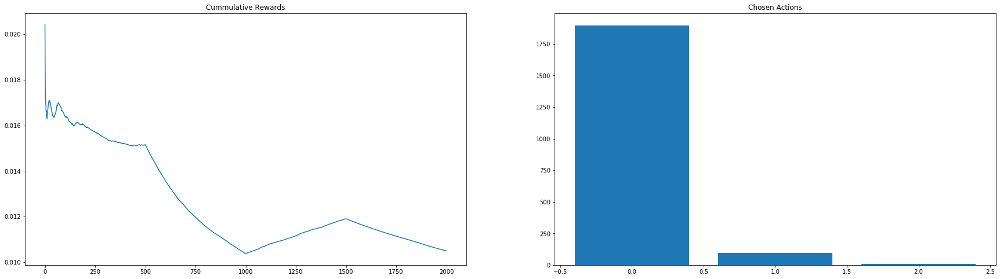

Total reward 20.9866


In [15]:
sample_mean_TS_stationary, sample_count_TS_stationary,rewards_TS_stationary,cum_rewards_TS_stationary,n_TS_stationary = list_iteration_results_TS_stationary
plot_history(rewards_TS_stationary,cum_rewards_TS_stationary, sample_count_TS_stationary, sample_mean_TS_stationary)
print("Total reward", np.round(total_reward_TS_stationary,4))

In [16]:
array_rewards = np.array(rewards_TS_stationary)
algo = rpt.Pelt(model="rbf").fit(array_rewards)
result = algo.predict(100)
result

[500, 1000, 1500, 2000]

499 0.3558890299471578
500 0.4969729248640761
998 0.4399297215220711
999 0.4422340850047349
1499 0.6592605957967114


C:\Users\iRacheva\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log
  from ipykernel import kernelapp as app


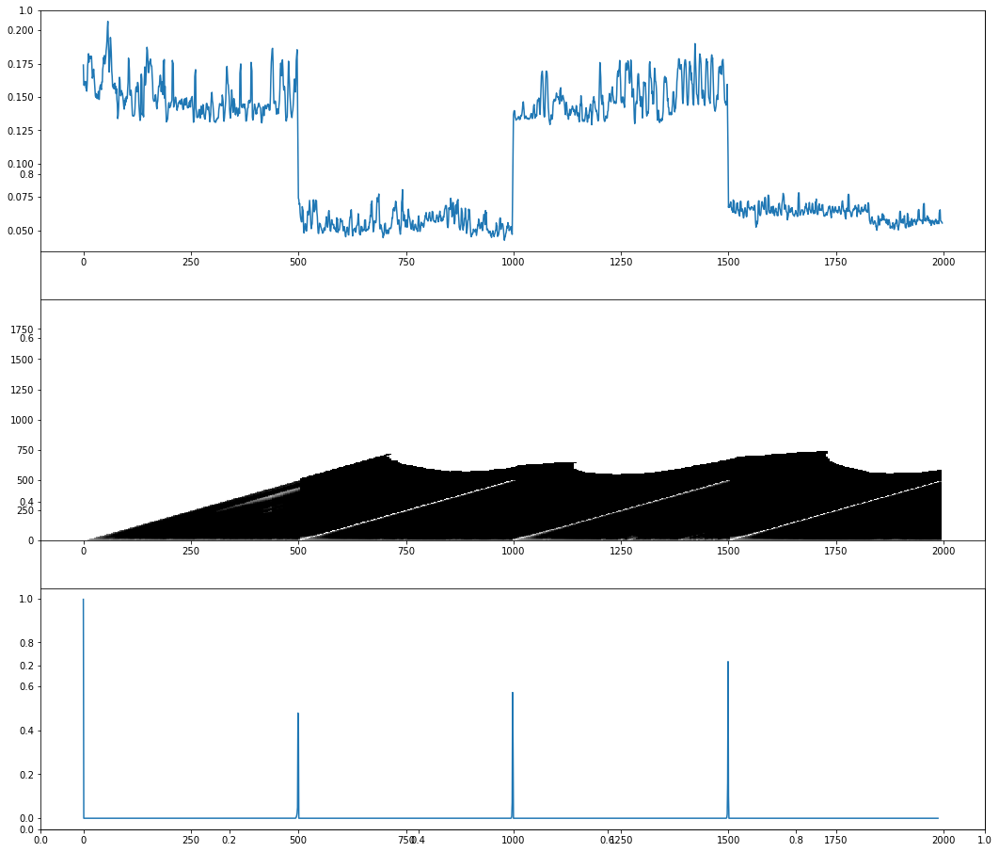

In [30]:
array_rewards_ma = moving_average(array_rewards, 3)*10
R, maxes = oncd.online_changepoint_detection(array_rewards_ma, partial(oncd.constant_hazard, 250), oncd.StudentT(0.01, .01, 1, 0))
Nw=3
for i, elem in enumerate(R[Nw,Nw:-1]):
    if elem > 0.2 and i!=0:
        print(i,elem)
        
fig, ax = plt.subplots(figsize=[18, 16])
ax = fig.add_subplot(3, 1, 1)
ax.plot(array_rewards_ma)
ax = fig.add_subplot(3, 1, 2, sharex=ax)
sparsity = 5  # only plot every fifth data for faster display
ax.pcolor(np.array(range(0, len(R[:,0]), sparsity)), 
          np.array(range(0, len(R[:,0]), sparsity)), 
          -np.log(R[0:-1:sparsity, 0:-1:sparsity]), 
          cmap=cm.Greys, vmin=0, vmax=30)
ax = fig.add_subplot(3, 1, 3, sharex=ax)
Nw=10;
ax.plot(R[Nw,Nw:-1])

### Online changepoint detection: Bayesian Online change detection algorithm (https://arxiv.org/abs/0710.3742, https://nbviewer.jupyter.org/github/hildensia/bayesian_changepoint_detection/blob/master/Example%20Code.ipynb)

In [31]:
def TS_obcp(list_distributions, n_samples, var_multiplier = 5):
    # initialize
    total_reward = 0
    num_choices = len(choices)
    sample_count = [0 for i in range(num_choices)]
    sample_rewards = [0 for i in range(num_choices)]
    sample_mean = [0.0 for i in range(num_choices)]
    sample_var = [0.0 for i in range(num_choices)]
    arm_rewards = {0: [], 1:[], 2:[]}
    rewards = []
    cum_rewards = []
    var_multiplier = var_multiplier
    list_iteration_results = []

    for n, elem in enumerate(list_distributions):
        dist_type = elem
        distribion = create_df_distribution(n_samples=n_samples, dist_type=dist_type)
        print("\n")
        print("Iteration:", n)
        theta = {}
        for i in range(len(choices)):
            if sample_count[i] >= 2:
                theta[i] = t.rvs(df=sample_count[i]-1,loc=sample_mean[i],scale=np.sqrt(sample_var[i]/sample_count[i])*var_multiplier)
                print(choices_names[i],"Theta", theta[i])

            else:
                print("Less than two values for",choices_names[i])
                theta[i] = uniform.rvs(loc=0, scale=1)
                print(choices_names[i],"Theta", theta[i])

        choice = np.argmin([theta[i] for i in range(len(choices))])
        alg = choices[choice]
        alg_name = choices_names[choice]
        start_time = time.perf_counter()
        sorted_dist = alg(distribion[dist_type])
        reward = ((time.perf_counter() - start_time))*(1)
        print("\n")
        print("Chosen algorithm is: ", alg_name, "with reward:", reward)
        arm_rewards[choice].append(reward)
        sample_count[choice] += 1
        sample_rewards[choice] += reward
        sample_mean[choice] = np.mean(arm_rewards[choice])
        sample_var[choice] = np.var(arm_rewards[choice]).astype('float64')
        print("Sample mean is: ", sample_mean[choice], "Sample variance is:", sample_var[choice])
        total_reward += reward
        rewards.append(reward)
        cum_rewards.append(sum(rewards)/len(rewards))

        array_rewards = np.array(rewards)
        #print(array_rewards)   
        if(len(array_rewards)>4):
            array_rewards_ma = moving_average(array_rewards, 3)*10
            R, maxes = oncd.online_changepoint_detection(array_rewards_ma, partial(oncd.constant_hazard, 250), oncd.StudentT(0.1, .01, 1, 0))
            Nw=3
            #print("R",R)
            for i, elem in enumerate(R[Nw,Nw:-1]):
                if elem > 0.2 and i!=0:
                        print("RESTART EXPERIMENT AT ITERATION:", n)

                        list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
                        sample_count = [0 for i in range(num_choices)]
                        sample_rewards = [0 for i in range(num_choices)]
                        sample_mean = [0.0 for i in range(num_choices)]
                        sample_var = [0.0 for i in range(num_choices)]
                        arm_rewards = {0: [], 1:[], 2:[]}
                        rewards = []
                        cum_rewards = []
                        n_consecutive_list = []


    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
    return list_iteration_results, total_reward

In [32]:
list_iteration_results_obcp, total_reward_obcp = TS_obcp(list_distributions=list_distributions, n_samples=n_samples)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.16041866866071497
Less than two values for merge_sort
merge_sort Theta 0.7027158153731877
Less than two values for heap_sort
heap_sort Theta 0.7885999535258565


Chosen algorithm is:  quick_sort with reward: 0.017004499999984546
Sample mean is:  0.017004499999984546 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.638361171404888
Less than two values for merge_sort
merge_sort Theta 0.8043275492290118
Less than two values for heap_sort
heap_sort Theta 0.13611794669541488


Chosen algorithm is:  heap_sort with reward: 0.022963400000207912
Sample mean is:  0.022963400000207912 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.06024755159575024
Less than two values for merge_sort
merge_sort Theta 0.9408349024937075
Less than two values for heap_sort
heap_sort Theta 0.03961216624205699


Chosen algorithm is:  heap_sort with reward: 0.



Iteration: 27
quick_sort Theta 0.013626706565686953
Less than two values for merge_sort
merge_sort Theta 0.2267950154519861
heap_sort Theta 0.021053988933391922


Chosen algorithm is:  quick_sort with reward: 0.014094199999817647
Sample mean is:  0.013587339130421953 Sample variance is: 1.6766014251327313e-06


Iteration: 28
quick_sort Theta 0.015013644827128131
Less than two values for merge_sort
merge_sort Theta 0.8526328034198415
heap_sort Theta 0.030784509012078597


Chosen algorithm is:  quick_sort with reward: 0.012389800000164541
Sample mean is:  0.013537441666661229 Sample variance is: 1.664007440883185e-06


Iteration: 29
quick_sort Theta 0.013066896875264163
Less than two values for merge_sort
merge_sort Theta 0.12217017369538541
heap_sort Theta 0.026014761592624596


Chosen algorithm is:  quick_sort with reward: 0.013396800000009534
Sample mean is:  0.01353181599999516 Sample variance is: 1.5982066982583626e-06


Iteration: 30
quick_sort Theta 0.013720053301161191
Less tha



Chosen algorithm is:  quick_sort with reward: 0.01800230000026204
Sample mean is:  0.013509317647071393 Sample variance is: 1.4031074893976865e-06


Iteration: 57
quick_sort Theta 0.013143652430882427
Less than two values for merge_sort
merge_sort Theta 0.5497764915301688
heap_sort Theta 0.023953774771169056


Chosen algorithm is:  quick_sort with reward: 0.013465800000176387
Sample mean is:  0.01350848076924649 Sample variance is: 1.3761603716523003e-06


Iteration: 58
quick_sort Theta 0.013055992737399378
Less than two values for merge_sort
merge_sort Theta 0.9999318870366369
heap_sort Theta 0.024691582362355757


Chosen algorithm is:  quick_sort with reward: 0.01311970000006113
Sample mean is:  0.013501145283035445 Sample variance is: 1.3529931682346508e-06


Iteration: 59
quick_sort Theta 0.013777961155777861
Less than two values for merge_sort
merge_sort Theta 0.17581493204132603
heap_sort Theta 0.02052337423961619


Chosen algorithm is:  quick_sort with reward: 0.01324709999971



Iteration: 88
quick_sort Theta 0.0137207368970527
merge_sort Theta 0.014539966392667488
heap_sort Theta 0.031932661823953414


Chosen algorithm is:  quick_sort with reward: 0.015573300000141899
Sample mean is:  0.01336119876545306 Sample variance is: 1.103977176970879e-06


Iteration: 89
quick_sort Theta 0.012690297362980833
merge_sort Theta 0.014943535747460171
heap_sort Theta 0.023967034223442017


Chosen algorithm is:  quick_sort with reward: 0.012944900000093185
Sample mean is:  0.013356121951241353 Sample variance is: 1.0926017381121106e-06


Iteration: 90
quick_sort Theta 0.013270668061625964
merge_sort Theta 0.014479996009682491
heap_sort Theta 0.03441882793881301


Chosen algorithm is:  quick_sort with reward: 0.013035100000251987
Sample mean is:  0.013352254216892085 Sample variance is: 1.0806645300070284e-06


Iteration: 91
quick_sort Theta 0.012498500584578132
merge_sort Theta 0.01427872340075181
heap_sort Theta 0.02109341290397658


Chosen algorithm is:  quick_sort with r



Iteration: 119
quick_sort Theta 0.01363056336203087
merge_sort Theta 0.015092180523042887
heap_sort Theta 0.027063205579078688


Chosen algorithm is:  quick_sort with reward: 0.013307899999745132
Sample mean is:  0.01329030545456259 Sample variance is: 9.25512949822276e-07


Iteration: 120
quick_sort Theta 0.013739111145993884
merge_sort Theta 0.014413410432965042
heap_sort Theta 0.022462942715714397


Chosen algorithm is:  quick_sort with reward: 0.012656399999741552
Sample mean is:  0.013284594594609246 Sample variance is: 9.207625266741091e-07


Iteration: 121
quick_sort Theta 0.01337882188491488
merge_sort Theta 0.014486010102385965
heap_sort Theta 0.021153302676011544


Chosen algorithm is:  quick_sort with reward: 0.0130500000000211
Sample mean is:  0.01328250000001471 Sample variance is: 9.130284259291637e-07


Iteration: 122
quick_sort Theta 0.012274270936543829
merge_sort Theta 0.01432885183592203
heap_sort Theta 0.022184366872246487


Chosen algorithm is:  quick_sort with r



Iteration: 151
quick_sort Theta 0.013637384834596417
merge_sort Theta 0.014907433132268558
heap_sort Theta 0.02027382145643313


Chosen algorithm is:  quick_sort with reward: 0.013573100000030536
Sample mean is:  0.013294374468093615 Sample variance is: 9.740919450488831e-07


Iteration: 152
quick_sort Theta 0.013706420982662514
merge_sort Theta 0.014449773025687644
heap_sort Theta 0.026589192414547446


Chosen algorithm is:  quick_sort with reward: 0.012434700000085286
Sample mean is:  0.013288320422544261 Sample variance is: 9.723999995383874e-07


Iteration: 153
quick_sort Theta 0.013628747769337802
merge_sort Theta 0.014163417339272531
heap_sort Theta 0.027601884784163668


Chosen algorithm is:  quick_sort with reward: 0.012582299999849056
Sample mean is:  0.013283383216791147 Sample variance is: 9.690613916337132e-07


Iteration: 154
quick_sort Theta 0.013212395046159854
merge_sort Theta 0.014509143358673923
heap_sort Theta 0.021628102170580796


Chosen algorithm is:  quick_sort



Iteration: 182
quick_sort Theta 0.013891229173600176
merge_sort Theta 0.013675972958566875
heap_sort Theta 0.02623090646762098


Chosen algorithm is:  merge_sort with reward: 0.014921999999842228
Sample mean is:  0.01458428888882837 Sample variance is: 3.057695320247298e-07


Iteration: 183
quick_sort Theta 0.013548466397184366
merge_sort Theta 0.01138758358721555
heap_sort Theta 0.03054480433203094


Chosen algorithm is:  merge_sort with reward: 0.014267500000187283
Sample mean is:  0.014552609999964262 Sample variance is: 2.8422454681923773e-07


Iteration: 184
quick_sort Theta 0.013635341850962292
merge_sort Theta 0.015702088508349407
heap_sort Theta 0.01936293085951435


Chosen algorithm is:  quick_sort with reward: 0.012591900000188616
Sample mean is:  0.013272273214294642 Sample variance is: 8.826655224613469e-07


Iteration: 185
quick_sort Theta 0.013403063442845293
merge_sort Theta 0.013745552795941248
heap_sort Theta 0.018331779497067515


Chosen algorithm is:  quick_sort wi



Iteration: 213
quick_sort Theta 0.012918524033126134
merge_sort Theta 0.01455124225298987
heap_sort Theta 0.021966897240660314


Chosen algorithm is:  quick_sort with reward: 0.013269600000057835
Sample mean is:  0.013276231958765417 Sample variance is: 8.431259454758271e-07


Iteration: 214
quick_sort Theta 0.013373519933904149
merge_sort Theta 0.015744424764136834
heap_sort Theta 0.021623719484979424


Chosen algorithm is:  quick_sort with reward: 0.013037500000336877
Sample mean is:  0.013275007692311939 Sample variance is: 8.390929953782436e-07


Iteration: 215
quick_sort Theta 0.013312572017996785
merge_sort Theta 0.014282127031197335
heap_sort Theta 0.023985238760608683


Chosen algorithm is:  quick_sort with reward: 0.012876300000243646
Sample mean is:  0.013272973469393223 Sample variance is: 8.356188309293206e-07


Iteration: 216
quick_sort Theta 0.01354364539722084
merge_sort Theta 0.014309658545911135
heap_sort Theta 0.025314470440076967


Chosen algorithm is:  quick_sort 



Iteration: 243
quick_sort Theta 0.013449106673998946
merge_sort Theta 0.013631276743172856
heap_sort Theta 0.017459816288562024


Chosen algorithm is:  quick_sort with reward: 0.013205300000208808
Sample mean is:  0.013253680803582515 Sample variance is: 7.851802663715287e-07


Iteration: 244
quick_sort Theta 0.013310596872545453
merge_sort Theta 0.014349095225294161
heap_sort Theta 0.02137708004948814


Chosen algorithm is:  quick_sort with reward: 0.01291270000001532
Sample mean is:  0.013252165333344439 Sample variance is: 7.822050259082853e-07


Iteration: 245
quick_sort Theta 0.01370976887674216
merge_sort Theta 0.014158038524327881
heap_sort Theta 0.02893768483204666


Chosen algorithm is:  quick_sort with reward: 0.01298159999987547
Sample mean is:  0.013250968141603427 Sample variance is: 7.790664270374193e-07


Iteration: 246
quick_sort Theta 0.01259412180151599
merge_sort Theta 0.01398055228954716
heap_sort Theta 0.021889925728445676


Chosen algorithm is:  quick_sort with 



Iteration: 275
quick_sort Theta 0.01381502814300575
merge_sort Theta 0.014282260788886681
heap_sort Theta 0.026455376894908893


Chosen algorithm is:  quick_sort with reward: 0.013348899999982677
Sample mean is:  0.013215597244099384 Sample variance is: 7.566328990117829e-07


Iteration: 276
quick_sort Theta 0.012739193582810832
merge_sort Theta 0.014206934028841028
heap_sort Theta 0.023782226073009883


Chosen algorithm is:  quick_sort with reward: 0.012933399999838002
Sample mean is:  0.013214490588239534 Sample variance is: 7.539767817193238e-07


Iteration: 277
quick_sort Theta 0.012978027648052436
merge_sort Theta 0.01437476554777467
heap_sort Theta 0.02643068877486916


Chosen algorithm is:  quick_sort with reward: 0.01305320000028587
Sample mean is:  0.01321386054688034 Sample variance is: 7.511327827048782e-07


Iteration: 278
quick_sort Theta 0.012741220029966813
merge_sort Theta 0.014059678249771402
heap_sort Theta 0.02276569640240422


Chosen algorithm is:  quick_sort with



Iteration: 305
quick_sort Theta 0.013066007750009413
merge_sort Theta 0.014096486549841358
heap_sort Theta 0.022922134254362805


Chosen algorithm is:  quick_sort with reward: 0.013023200000134239
Sample mean is:  0.01322670000000108 Sample variance is: 7.781514609767186e-07


Iteration: 306
quick_sort Theta 0.013259638809513164
merge_sort Theta 0.013848665455033965
heap_sort Theta 0.023901559512057698


Chosen algorithm is:  quick_sort with reward: 0.012557100000321952
Sample mean is:  0.013224342253523338 Sample variance is: 7.769846791159891e-07


Iteration: 307
quick_sort Theta 0.013513148011930837
merge_sort Theta 0.014362954981316216
heap_sort Theta 0.02524393801628892


Chosen algorithm is:  quick_sort with reward: 0.014739800000370451
Sample mean is:  0.01322965964912631 Sample variance is: 7.822884307475798e-07


Iteration: 308
quick_sort Theta 0.013339398961545033
merge_sort Theta 0.01512218195781
heap_sort Theta 0.028468919928604824


Chosen algorithm is:  quick_sort with 

Chosen algorithm is:  quick_sort with reward: 0.01230729999997493
Sample mean is:  0.013267374358979222 Sample variance is: 8.385010121489026e-07


Iteration: 336
quick_sort Theta 0.01313065338902117
merge_sort Theta 0.014338895325381086
heap_sort Theta 0.024973212966693623


Chosen algorithm is:  quick_sort with reward: 0.01327690000016446
Sample mean is:  0.01326740479233764 Sample variance is: 8.35822384148244e-07


Iteration: 337
quick_sort Theta 0.01348984996838352
merge_sort Theta 0.015147482089611423
heap_sort Theta 0.022775405934998834


Chosen algorithm is:  quick_sort with reward: 0.013853399999788962
Sample mean is:  0.013269271019112962 Sample variance is: 8.342506465656366e-07


Iteration: 338
quick_sort Theta 0.013181225640438552
merge_sort Theta 0.014594637543918534
heap_sort Theta 0.02573454656172571


Chosen algorithm is:  quick_sort with reward: 0.01252810000005411
Sample mean is:  0.013266918095242934 Sample variance is: 8.333406145464132e-07


Iteration: 339
quick_s



Iteration: 365
quick_sort Theta 0.013314354658759553
merge_sort Theta 0.015411699943852965
heap_sort Theta 0.021370760260410935


Chosen algorithm is:  quick_sort with reward: 0.013540699999794015
Sample mean is:  0.013247853372437005 Sample variance is: 7.937347477550908e-07


Iteration: 366
quick_sort Theta 0.013326357618126772
merge_sort Theta 0.01398293154328478
heap_sort Theta 0.02014629060490731


Chosen algorithm is:  quick_sort with reward: 0.013150499999937892
Sample mean is:  0.01324756871345309 Sample variance is: 7.914415174009086e-07


Iteration: 367
quick_sort Theta 0.013082293807932454
merge_sort Theta 0.014143900587360727
heap_sort Theta 0.02047967092457528


Chosen algorithm is:  quick_sort with reward: 0.013085999999930209
Sample mean is:  0.013247097667641069 Sample variance is: 7.892099921108872e-07


Iteration: 368
quick_sort Theta 0.013261151865783192
merge_sort Theta 0.014331070008436059
heap_sort Theta 0.023323209330641668


Chosen algorithm is:  quick_sort wi



Iteration: 395
quick_sort Theta 0.012974075189122148
merge_sort Theta 0.014648464146956959
heap_sort Theta 0.02641148273451077


Chosen algorithm is:  quick_sort with reward: 0.01207639999984167
Sample mean is:  0.013217957142859511 Sample variance is: 7.498955149999264e-07


Iteration: 396
quick_sort Theta 0.013466092659507739
merge_sort Theta 0.013641722522667156
heap_sort Theta 0.024748638915563073


Chosen algorithm is:  quick_sort with reward: 0.01313700000036988
Sample mean is:  0.01321773951613239 Sample variance is: 7.478972379178893e-07


Iteration: 397
quick_sort Theta 0.01290924105557264
merge_sort Theta 0.014756687427576215
heap_sort Theta 0.02695556885401646


Chosen algorithm is:  quick_sort with reward: 0.012556399999994028
Sample mean is:  0.013215966487938989 Sample variance is: 7.470615814677035e-07


Iteration: 398
quick_sort Theta 0.01287352826191981
merge_sort Theta 0.014480253673732763
heap_sort Theta 0.027285292438310252


Chosen algorithm is:  quick_sort with 



Iteration: 425
quick_sort Theta 0.013177755295307098
merge_sort Theta 0.014929962800311808
heap_sort Theta 0.024143160889676704


Chosen algorithm is:  quick_sort with reward: 0.013163399999939429
Sample mean is:  0.013207007750004322 Sample variance is: 7.347417173075156e-07


Iteration: 426
quick_sort Theta 0.013507973389434406
merge_sort Theta 0.014381986556312985
heap_sort Theta 0.01756421561167288


Chosen algorithm is:  quick_sort with reward: 0.012697100000423234
Sample mean is:  0.013205736159606365 Sample variance is: 7.335562205543415e-07


Iteration: 427
quick_sort Theta 0.013654981972854995
merge_sort Theta 0.014440161195215627
heap_sort Theta 0.023584437767019947


Chosen algorithm is:  quick_sort with reward: 0.013389199999892298
Sample mean is:  0.013206192537318518 Sample variance is: 7.318149743636211e-07


Iteration: 428
quick_sort Theta 0.013764761996714482
merge_sort Theta 0.014497522193807729
heap_sort Theta 0.018961100970000328


Chosen algorithm is:  quick_sort



Iteration: 455
quick_sort Theta 0.013122730570683479
merge_sort Theta 0.01635363273859725
heap_sort Theta 0.02445961659958942


Chosen algorithm is:  quick_sort with reward: 0.012805800000023737
Sample mean is:  0.013205433333342629 Sample variance is: 7.674622031411017e-07


Iteration: 456
quick_sort Theta 0.013037659764602192
merge_sort Theta 0.013942675348128564
heap_sort Theta 0.022232577420886954


Chosen algorithm is:  quick_sort with reward: 0.013220799999999144
Sample mean is:  0.013205469069776713 Sample variance is: 7.656779551926208e-07


Iteration: 457
quick_sort Theta 0.013038704679944278
merge_sort Theta 0.014474196128523902
heap_sort Theta 0.02626526046676187


Chosen algorithm is:  quick_sort with reward: 0.013244399999621237
Sample mean is:  0.013205559396760111 Sample variance is: 7.639049485698655e-07


Iteration: 458
quick_sort Theta 0.01313987606531916
merge_sort Theta 0.014547019697768811
heap_sort Theta 0.024514386237940052


Chosen algorithm is:  quick_sort wi



Iteration: 485
quick_sort Theta 0.013488403006388495
merge_sort Theta 0.014226160119658977
heap_sort Theta 0.025283969685730802


Chosen algorithm is:  quick_sort with reward: 0.013195699999869248
Sample mean is:  0.013183019825712013 Sample variance is: 7.322785502506234e-07


Iteration: 486
quick_sort Theta 0.013114009237458228
merge_sort Theta 0.013412376101224786
heap_sort Theta 0.020488772571850476


Chosen algorithm is:  quick_sort with reward: 0.012913600000047154
Sample mean is:  0.013182434130438828 Sample variance is: 7.308440952382152e-07


Iteration: 487
quick_sort Theta 0.013050613266333838
merge_sort Theta 0.015019599348291323
heap_sort Theta 0.018720221040001903


Chosen algorithm is:  quick_sort with reward: 0.01298110000016095
Sample mean is:  0.01318199739696751 Sample variance is: 7.293464887467248e-07


Iteration: 488
quick_sort Theta 0.01322751956153298
merge_sort Theta 0.014893772471740258
heap_sort Theta 0.023893435212726723


Chosen algorithm is:  quick_sort w



Chosen algorithm is:  merge_sort with reward: 0.005313800000294577
Sample mean is:  0.004156109999939872 Sample variance is: 4.862041629339806e-07


Iteration: 515
Less than two values for quick_sort
quick_sort Theta 0.286640319311261
merge_sort Theta 0.0020378090164429766
Less than two values for heap_sort
heap_sort Theta 0.9869321985870225


Chosen algorithm is:  merge_sort with reward: 0.0028300999997554754
Sample mean is:  0.004035563636286745 Sample variance is: 5.873180423853562e-07


Iteration: 516
Less than two values for quick_sort
quick_sort Theta 0.52315069547626
merge_sort Theta 0.001858400663073541
Less than two values for heap_sort
heap_sort Theta 0.513580518727781


Chosen algorithm is:  merge_sort with reward: 0.0037185999999564956
Sample mean is:  0.004009149999925891 Sample variance is: 5.460493542304144e-07


Iteration: 517
Less than two values for quick_sort
quick_sort Theta 0.22758727117792676
merge_sort Theta 0.004857374489517428
Less than two values for heap_so



Chosen algorithm is:  merge_sort with reward: 0.004763800000091578
Sample mean is:  0.00393192307686919 Sample variance is: 3.3713452280327845e-07


Iteration: 544
Less than two values for quick_sort
quick_sort Theta 0.1723617414544355
merge_sort Theta 0.0035924198429545997
Less than two values for heap_sort
heap_sort Theta 0.3175842245800665


Chosen algorithm is:  merge_sort with reward: 0.003471500000159722
Sample mean is:  0.003920412499951453 Sample variance is: 3.3387340159138275e-07


Iteration: 545
Less than two values for quick_sort
quick_sort Theta 0.7607077784663611
merge_sort Theta 0.002890655243500886
Less than two values for heap_sort
heap_sort Theta 0.8667703058252766


Chosen algorithm is:  merge_sort with reward: 0.002862400000140042
Sample mean is:  0.0038946073170292236 Sample variance is: 3.52366446520021e-07


Iteration: 546
Less than two values for quick_sort
quick_sort Theta 0.6722478059751253
merge_sort Theta 0.0045901077858865585
Less than two values for heap



Iteration: 568
Less than two values for quick_sort
quick_sort Theta 0.18369371804778478
merge_sort Theta 0.003649117374424797
Less than two values for heap_sort
heap_sort Theta 0.08288734634513173


Chosen algorithm is:  merge_sort with reward: 0.004789399999935995
Sample mean is:  0.0038385828124560817 Sample variance is: 3.076595073582578e-07


Iteration: 569
Less than two values for quick_sort
quick_sort Theta 0.7693663684170334
merge_sort Theta 0.00320444175532495
Less than two values for heap_sort
heap_sort Theta 0.38632028142325403


Chosen algorithm is:  merge_sort with reward: 0.0026772000001074048
Sample mean is:  0.0038207153845737944 Sample variance is: 3.2335796283237e-07


Iteration: 570
Less than two values for quick_sort
quick_sort Theta 0.6407145017224177
merge_sort Theta 0.0037959356454081066
Less than two values for heap_sort
heap_sort Theta 0.41063938582383364


Chosen algorithm is:  merge_sort with reward: 0.002523000000110187
Sample mean is:  0.00380105303026374 



Iteration: 595
Less than two values for quick_sort
quick_sort Theta 0.7647315657529651
merge_sort Theta 0.0038773511135739044
Less than two values for heap_sort
heap_sort Theta 0.8125785750191793


Chosen algorithm is:  merge_sort with reward: 0.004114400000162277
Sample mean is:  0.0038142175823930222 Sample variance is: 3.820614862637707e-07


Iteration: 596
Less than two values for quick_sort
quick_sort Theta 0.6812774952807331
merge_sort Theta 0.004232378786026984
Less than two values for heap_sort
heap_sort Theta 0.030231673044465168


Chosen algorithm is:  merge_sort with reward: 0.003540400000019872
Sample mean is:  0.003811241304323749 Sample variance is: 3.7871474305602623e-07


Iteration: 597
Less than two values for quick_sort
quick_sort Theta 0.7190202665546248
merge_sort Theta 0.0032190793992130087
Less than two values for heap_sort
heap_sort Theta 0.556447603294172


Chosen algorithm is:  merge_sort with reward: 0.0036028999998052313
Sample mean is:  0.00380900107524290

Less than two values for heap_sort
heap_sort Theta 0.27339335951708355


Chosen algorithm is:  merge_sort with reward: 0.004391099999793369
Sample mean is:  0.003783778070152964 Sample variance is: 3.5250057711662896e-07


Iteration: 620
Less than two values for quick_sort
quick_sort Theta 0.797515563601495
merge_sort Theta 0.003570665418121391
Less than two values for heap_sort
heap_sort Theta 0.9465748502157652


Chosen algorithm is:  merge_sort with reward: 0.003619900000103371
Sample mean is:  0.003782353043456881 Sample variance is: 3.4966685463055785e-07


Iteration: 621
Less than two values for quick_sort
quick_sort Theta 0.6332494445416931
merge_sort Theta 0.0035811648241078817
Less than two values for heap_sort
heap_sort Theta 0.3334432986846114


Chosen algorithm is:  merge_sort with reward: 0.0034694999999373977
Sample mean is:  0.003779656034461023 Sample variance is: 3.474889788093172e-07


Iteration: 622
Less than two values for quick_sort
quick_sort Theta 0.3727087975810



Chosen algorithm is:  merge_sort with reward: 0.004751800000121875
Sample mean is:  0.0037519669064664846 Sample variance is: 3.5755884448532645e-07


Iteration: 645
Less than two values for quick_sort
quick_sort Theta 0.7565873380048502
merge_sort Theta 0.0035697897335428457
Less than two values for heap_sort
heap_sort Theta 0.440809935229608


Chosen algorithm is:  merge_sort with reward: 0.003989699999692675
Sample mean is:  0.0037536649999895286 Sample variance is: 3.5540566224321033e-07


Iteration: 646
Less than two values for quick_sort
quick_sort Theta 0.9385402090047861
merge_sort Theta 0.0041467330310348575
Less than two values for heap_sort
heap_sort Theta 0.33085541773471583


Chosen algorithm is:  merge_sort with reward: 0.00404900000012276
Sample mean is:  0.003755759574458559 Sample variance is: 3.534992686184543e-07


Iteration: 647
Less than two values for quick_sort
quick_sort Theta 0.4681806260440349
merge_sort Theta 0.003562247821131242
Less than two values for he



Chosen algorithm is:  merge_sort with reward: 0.004813999999896623
Sample mean is:  0.003777522289151804 Sample variance is: 3.276281629089912e-07


Iteration: 672
Less than two values for quick_sort
quick_sort Theta 0.24856786307519818
merge_sort Theta 0.003532840714087403
Less than two values for heap_sort
heap_sort Theta 0.3185444799113436


Chosen algorithm is:  merge_sort with reward: 0.003832200000033481
Sample mean is:  0.003777849700594209 Sample variance is: 3.256841125320456e-07


Iteration: 673
Less than two values for quick_sort
quick_sort Theta 0.22565118075698654
merge_sort Theta 0.003988578561641149
Less than two values for heap_sort
heap_sort Theta 0.836249424753543


Chosen algorithm is:  merge_sort with reward: 0.004079899999851477
Sample mean is:  0.003779647619042169 Sample variance is: 3.242853459186177e-07


Iteration: 674
Less than two values for quick_sort
quick_sort Theta 0.5337933079749466
merge_sort Theta 0.0036795296376977552
Less than two values for heap_



Chosen algorithm is:  merge_sort with reward: 0.0054009999998925196
Sample mean is:  0.0038111999999943546 Sample variance is: 3.26150522283691e-07


Iteration: 696
Less than two values for quick_sort
quick_sort Theta 0.14770744086240928
merge_sort Theta 0.004082055658250128
Less than two values for heap_sort
heap_sort Theta 0.4227822783761209


Chosen algorithm is:  merge_sort with reward: 0.003900499999872409
Sample mean is:  0.003811667539260732 Sample variance is: 3.244844605896497e-07


Iteration: 697
Less than two values for quick_sort
quick_sort Theta 0.20447151992016632
merge_sort Theta 0.003762610338840634
Less than two values for heap_sort
heap_sort Theta 0.6088775762713875


Chosen algorithm is:  merge_sort with reward: 0.0038248999999268563
Sample mean is:  0.0038117364583267013 Sample variance is: 3.227953445764039e-07


Iteration: 698
Less than two values for quick_sort
quick_sort Theta 0.38248195688053654
merge_sort Theta 0.0038157574923665784
Less than two values for 



Iteration: 720
Less than two values for quick_sort
quick_sort Theta 0.028232762034871572
merge_sort Theta 0.0038691514295893696
Less than two values for heap_sort
heap_sort Theta 0.40733585007894757


Chosen algorithm is:  merge_sort with reward: 0.003860600000280101
Sample mean is:  0.0038153120930114392 Sample variance is: 3.021118280114287e-07


Iteration: 721
Less than two values for quick_sort
quick_sort Theta 0.673774345438161
merge_sort Theta 0.0034250400892036612
Less than two values for heap_sort
heap_sort Theta 0.7345299773813043


Chosen algorithm is:  merge_sort with reward: 0.0040272000001095876
Sample mean is:  0.003816293055544301 Sample variance is: 3.009200539515443e-07


Iteration: 722
Less than two values for quick_sort
quick_sort Theta 0.46772230711906704
merge_sort Theta 0.004037349128937748
Less than two values for heap_sort
heap_sort Theta 0.39114203692321425


Chosen algorithm is:  merge_sort with reward: 0.003483699999833334
Sample mean is:  0.003814760368651



Iteration: 744
Less than two values for quick_sort
quick_sort Theta 0.8143444634562054
merge_sort Theta 0.0037819815932148716
Less than two values for heap_sort
heap_sort Theta 0.9358061714661134


Chosen algorithm is:  merge_sort with reward: 0.003992699999798788
Sample mean is:  0.003807894979073357 Sample variance is: 2.8061845568205156e-07


Iteration: 745
Less than two values for quick_sort
quick_sort Theta 0.9932656396553025
merge_sort Theta 0.00371301486744641
Less than two values for heap_sort
heap_sort Theta 0.7319108128506316


Chosen algorithm is:  merge_sort with reward: 0.0030535999999301566
Sample mean is:  0.003804752083326927 Sample variance is: 2.8181000480453944e-07


Iteration: 746
Less than two values for quick_sort
quick_sort Theta 0.12094780751529488
merge_sort Theta 0.0038831981215288187
Less than two values for heap_sort
heap_sort Theta 0.06808083404343568


Chosen algorithm is:  merge_sort with reward: 0.004066800000146031
Sample mean is:  0.00380583941908136



Iteration: 768
Less than two values for quick_sort
quick_sort Theta 0.8077303202938614
merge_sort Theta 0.003886521198478611
Less than two values for heap_sort
heap_sort Theta 0.7889015315697303


Chosen algorithm is:  merge_sort with reward: 0.0029085000001032313
Sample mean is:  0.0038116406844097106 Sample variance is: 2.7196847866324755e-07


Iteration: 769
Less than two values for quick_sort
quick_sort Theta 0.9738526922977457
merge_sort Theta 0.0037925769236080626
Less than two values for heap_sort
heap_sort Theta 0.8218577357715561


Chosen algorithm is:  merge_sort with reward: 0.004066099999818107
Sample mean is:  0.003812604545452924 Sample variance is: 2.711826294250417e-07


Iteration: 770
Less than two values for quick_sort
quick_sort Theta 0.49111476854690395
merge_sort Theta 0.0037344152108466575
Less than two values for heap_sort
heap_sort Theta 0.5781989797673733


Chosen algorithm is:  merge_sort with reward: 0.003779600000143546
Sample mean is:  0.00381247999999892



Iteration: 794
Less than two values for quick_sort
quick_sort Theta 0.9450552974189244
merge_sort Theta 0.004032275768386348
Less than two values for heap_sort
heap_sort Theta 0.12248654008155146


Chosen algorithm is:  merge_sort with reward: 0.0036774999998669955
Sample mean is:  0.0038023470588228257 Sample variance is: 2.607004217062056e-07


Iteration: 795
Less than two values for quick_sort
quick_sort Theta 0.037842900609678765
merge_sort Theta 0.0034382097761586723
Less than two values for heap_sort
heap_sort Theta 0.7915335891992498


Chosen algorithm is:  merge_sort with reward: 0.004162300000189134
Sample mean is:  0.0038035882758620195 Sample variance is: 2.602466938391985e-07


Iteration: 796
Less than two values for quick_sort
quick_sort Theta 0.06462910229179775
merge_sort Theta 0.0038118402996527266
Less than two values for heap_sort
heap_sort Theta 0.9947908273515139


Chosen algorithm is:  merge_sort with reward: 0.003492199999982404
Sample mean is:  0.00380251821305



Iteration: 818
Less than two values for quick_sort
quick_sort Theta 0.09982644078083891
merge_sort Theta 0.0036475474332668956
Less than two values for heap_sort
heap_sort Theta 0.9705598688782681


Chosen algorithm is:  merge_sort with reward: 0.0026288999997632345
Sample mean is:  0.0038255281150168666 Sample variance is: 3.0221527388811835e-07


Iteration: 819
Less than two values for quick_sort
quick_sort Theta 0.5472237726063576
merge_sort Theta 0.003883975515502635
Less than two values for heap_sort
heap_sort Theta 0.39604108449223574


Chosen algorithm is:  merge_sort with reward: 0.0037399000002551475
Sample mean is:  0.003825255414014441 Sample variance is: 3.012760813698916e-07


Iteration: 820
Less than two values for quick_sort
quick_sort Theta 0.17573094741661976
merge_sort Theta 0.0037992179184158344
Less than two values for heap_sort
heap_sort Theta 0.13097493644516411


Chosen algorithm is:  merge_sort with reward: 0.005291400000260182
Sample mean is:  0.0038299098412



Iteration: 843
Less than two values for quick_sort
quick_sort Theta 0.774201457475183
merge_sort Theta 0.004020514517309901
Less than two values for heap_sort
heap_sort Theta 0.9736060724023408


Chosen algorithm is:  merge_sort with reward: 0.0041454000001976965
Sample mean is:  0.0038639994082861244 Sample variance is: 3.2301474341641646e-07


Iteration: 844
Less than two values for quick_sort
quick_sort Theta 0.5092319971271428
merge_sort Theta 0.003992313414226758
Less than two values for heap_sort
heap_sort Theta 0.21173166412456634


Chosen algorithm is:  merge_sort with reward: 0.0038650999999845226
Sample mean is:  0.0038640026548693055 Sample variance is: 3.2206190112825273e-07


Iteration: 845
Less than two values for quick_sort
quick_sort Theta 0.9982470749612488
merge_sort Theta 0.003716096485976047
Less than two values for heap_sort
heap_sort Theta 0.18588319234010442


Chosen algorithm is:  merge_sort with reward: 0.004782599999998638
Sample mean is:  0.0038667044117667



Iteration: 867
Less than two values for quick_sort
quick_sort Theta 0.10669213835741886
merge_sort Theta 0.003890039316797134
Less than two values for heap_sort
heap_sort Theta 0.06900267555525397


Chosen algorithm is:  merge_sort with reward: 0.0038405000000238942
Sample mean is:  0.003872034530388332 Sample variance is: 3.263241593759626e-07


Iteration: 868
Less than two values for quick_sort
quick_sort Theta 0.30110253368804085
merge_sort Theta 0.004060859722399343
Less than two values for heap_sort
heap_sort Theta 0.4053857093925648


Chosen algorithm is:  merge_sort with reward: 0.003885999999965861
Sample mean is:  0.003872073002756314 Sample variance is: 3.2542573055414403e-07


Iteration: 869
Less than two values for quick_sort
quick_sort Theta 0.08815262271770474
merge_sort Theta 0.0036212013667440523
Less than two values for heap_sort
heap_sort Theta 0.2959656028528551


Chosen algorithm is:  merge_sort with reward: 0.003291800000170042
Sample mean is:  0.0038704788461558



Iteration: 891
Less than two values for quick_sort
quick_sort Theta 0.2659687641264479
merge_sort Theta 0.004080122224254831
Less than two values for heap_sort
heap_sort Theta 0.862837925396082


Chosen algorithm is:  merge_sort with reward: 0.003532799999902636
Sample mean is:  0.003867097668393201 Sample variance is: 3.12753377984686e-07


Iteration: 892
Less than two values for quick_sort
quick_sort Theta 0.07954205233172029
merge_sort Theta 0.003643287760896184
Less than two values for heap_sort
heap_sort Theta 0.777815834893389


Chosen algorithm is:  merge_sort with reward: 0.003872499999943102
Sample mean is:  0.0038671116279062495 Sample variance is: 3.119453049402094e-07


Iteration: 893
Less than two values for quick_sort
quick_sort Theta 0.8670569833564458
merge_sort Theta 0.003845064131968051
Less than two values for heap_sort
heap_sort Theta 0.48261653238028324


Chosen algorithm is:  merge_sort with reward: 0.0028047000000697153
Sample mean is:  0.0038643734536077017 Sa



Iteration: 915
Less than two values for quick_sort
quick_sort Theta 0.1088058266048636
merge_sort Theta 0.004130828345595607
heap_sort Theta 0.011476213268664725


Chosen algorithm is:  merge_sort with reward: 0.00389050000012503
Sample mean is:  0.0038580024449873544 Sample variance is: 3.015276702482746e-07


Iteration: 916
Less than two values for quick_sort
quick_sort Theta 0.4066368030940112
merge_sort Theta 0.003732089926011826
heap_sort Theta 0.011558949910899924


Chosen algorithm is:  merge_sort with reward: 0.0037963999998282816
Sample mean is:  0.0038578521951211126 Sample variance is: 3.0080147009032874e-07


Iteration: 917
Less than two values for quick_sort
quick_sort Theta 0.6648509246514335
merge_sort Theta 0.003999857284222749
heap_sort Theta 0.011503225761758308


Chosen algorithm is:  merge_sort with reward: 0.003645100000085222
Sample mean is:  0.0038573345498777163 Sample variance is: 3.001794552393323e-07


Iteration: 918
Less than two values for quick_sort
quic



Iteration: 941
Less than two values for quick_sort
quick_sort Theta 0.8766055412392292
merge_sort Theta 0.004031033391819026
heap_sort Theta 0.011272396026567958


Chosen algorithm is:  merge_sort with reward: 0.003588199999740027
Sample mean is:  0.003843821609196353 Sample variance is: 2.9163069220661314e-07


Iteration: 942
Less than two values for quick_sort
quick_sort Theta 0.9667842293832277
merge_sort Theta 0.0037228390669655645
heap_sort Theta 0.05126789464667485


Chosen algorithm is:  merge_sort with reward: 0.003720900000189431
Sample mean is:  0.0038435396789004658 Sample variance is: 2.9099639031310084e-07


Iteration: 943
Less than two values for quick_sort
quick_sort Theta 0.1234539458238928
merge_sort Theta 0.003910270674913047
heap_sort Theta 0.011557315387389822


Chosen algorithm is:  merge_sort with reward: 0.003495999999813648
Sample mean is:  0.0038427443935936307 Sample variance is: 2.906062554046943e-07


Iteration: 944
Less than two values for quick_sort
quic



Iteration: 969
Less than two values for quick_sort
quick_sort Theta 0.7158776213505166
merge_sort Theta 0.0039988805893651
heap_sort Theta 0.01129478710056459


Chosen algorithm is:  merge_sort with reward: 0.0038815000002614397
Sample mean is:  0.0038375917926565173 Sample variance is: 2.773344209554964e-07


Iteration: 970
Less than two values for quick_sort
quick_sort Theta 0.3731327705916083
merge_sort Theta 0.003898172509298664
heap_sort Theta 0.011145676353168748


Chosen algorithm is:  merge_sort with reward: 0.0038376000002244837
Sample mean is:  0.0038375918103452414 Sample variance is: 2.767367174622027e-07


Iteration: 971
Less than two values for quick_sort
quick_sort Theta 0.1388530910339103
merge_sort Theta 0.0038706429717143462
heap_sort Theta 0.013317239586615726


Chosen algorithm is:  merge_sort with reward: 0.0035979000003862893
Sample mean is:  0.0038370763440872652 Sample variance is: 2.762648720713616e-07


Iteration: 972
Less than two values for quick_sort
quic



Iteration: 997
Less than two values for quick_sort
quick_sort Theta 0.2337927984572964
merge_sort Theta 0.0037420042885943504
heap_sort Theta 0.010813883628009698


Chosen algorithm is:  merge_sort with reward: 0.002736599999934697
Sample mean is:  0.0038261478615102297 Sample variance is: 2.718733112796923e-07


Iteration: 998
Less than two values for quick_sort
quick_sort Theta 0.542494802194221
merge_sort Theta 0.003847249411251792
heap_sort Theta 0.011165118839262484


Chosen algorithm is:  merge_sort with reward: 0.003857400000015332
Sample mean is:  0.0038262113821169474 Sample variance is: 2.713227043685676e-07


Iteration: 999
Less than two values for quick_sort
quick_sort Theta 0.20690256354756087
merge_sort Theta 0.003726890004825498
heap_sort Theta 0.011589777091315354


Chosen algorithm is:  merge_sort with reward: 0.003682099999878119
Sample mean is:  0.0038259190669399923 Sample variance is: 2.7081439455148444e-07


Iteration: 1000
Less than two values for quick_sort
qu



Iteration: 1022
Less than two values for quick_sort
quick_sort Theta 0.5406894392200304
Less than two values for merge_sort
merge_sort Theta 0.6716728541164391
heap_sort Theta 0.02283303331894985


Chosen algorithm is:  heap_sort with reward: 0.022368699999788078
Sample mean is:  0.0219124611110399 Sample variance is: 4.854574344598149e-07


Iteration: 1023
Less than two values for quick_sort
quick_sort Theta 0.6089469751825383
Less than two values for merge_sort
merge_sort Theta 0.022691028295405036
heap_sort Theta 0.02038986393334634


Chosen algorithm is:  heap_sort with reward: 0.021927100000084465
Sample mean is:  0.021913231578884352 Sample variance is: 4.5991772834504424e-07


Iteration: 1024
Less than two values for quick_sort
quick_sort Theta 0.6955765033253585
Less than two values for merge_sort
merge_sort Theta 0.5565715905476047
heap_sort Theta 0.022731681675328446


Chosen algorithm is:  heap_sort with reward: 0.02166669999996884
Sample mean is:  0.021900904999938575 Sam



Iteration: 1053
quick_sort Theta 0.01339911418887265
Less than two values for merge_sort
merge_sort Theta 0.7112142246178572
heap_sort Theta 0.021796818170411


Chosen algorithm is:  quick_sort with reward: 0.01229029999967679
Sample mean is:  0.013224273333419963 Sample variance is: 2.5904890597617326e-07


Iteration: 1054
quick_sort Theta 0.013359182674839914
Less than two values for merge_sort
merge_sort Theta 0.7755651328788251
heap_sort Theta 0.020823800425459758


Chosen algorithm is:  quick_sort with reward: 0.012061700000231212
Sample mean is:  0.013186770967833229 Sample variance is: 2.9288531239239247e-07


Iteration: 1055
quick_sort Theta 0.012985693640548725
Less than two values for merge_sort
merge_sort Theta 0.33067066878407403
heap_sort Theta 0.021365209308390188


Chosen algorithm is:  quick_sort with reward: 0.012621599999874888
Sample mean is:  0.013169109375084531 Sample variance is: 2.9340253399117715e-07


Iteration: 1056
quick_sort Theta 0.013077604533673381
Les



Chosen algorithm is:  quick_sort with reward: 0.014530400000239752
Sample mean is:  0.013172021428626326 Sample variance is: 4.422481173902399e-07


Iteration: 1081
quick_sort Theta 0.01390865902831271
Less than two values for merge_sort
merge_sort Theta 0.6662475214692227
heap_sort Theta 0.02074214952900025


Chosen algorithm is:  quick_sort with reward: 0.013014399999974557
Sample mean is:  0.013169256140404366 Sample variance is: 4.349176003498855e-07


Iteration: 1082
quick_sort Theta 0.013492759880339756
Less than two values for merge_sort
merge_sort Theta 0.4960494273613426
heap_sort Theta 0.022385278957419864


Chosen algorithm is:  quick_sort with reward: 0.013042200000199955
Sample mean is:  0.013167065517297393 Sample variance is: 4.27692554320526e-07


Iteration: 1083
quick_sort Theta 0.013563006495237673
Less than two values for merge_sort
merge_sort Theta 0.09524666857865915
heap_sort Theta 0.02037786725849489


Chosen algorithm is:  quick_sort with reward: 0.01261199999

Iteration: 1108
quick_sort Theta 0.013822762561263585
Less than two values for merge_sort
merge_sort Theta 0.39872392110314614
heap_sort Theta 0.023649513708086968


Chosen algorithm is:  quick_sort with reward: 0.01724659999990763
Sample mean is:  0.013185217857161055 Sample variance is: 6.089174290816763e-07


Iteration: 1109
quick_sort Theta 0.013705456979093901
Less than two values for merge_sort
merge_sort Theta 0.0503085890706263
heap_sort Theta 0.022668782710526476


Chosen algorithm is:  quick_sort with reward: 0.012808999999833759
Sample mean is:  0.01318079176472191 Sample variance is: 6.033992793413997e-07


Iteration: 1110
quick_sort Theta 0.012987763084368036
Less than two values for merge_sort
merge_sort Theta 0.03164558959913555
heap_sort Theta 0.02178136070285732


Chosen algorithm is:  quick_sort with reward: 0.013251899999886518
Sample mean is:  0.013181618604665685 Sample variance is: 5.964411201162561e-07


Iteration: 1111
quick_sort Theta 0.012899445636797605
Less 



Chosen algorithm is:  quick_sort with reward: 0.014828000000306929
Sample mean is:  0.013294840708004386 Sample variance is: 9.562056334263863e-07


Iteration: 1138
quick_sort Theta 0.013775295455869866
Less than two values for merge_sort
merge_sort Theta 0.39060624619037854
heap_sort Theta 0.021014368523771493


Chosen algorithm is:  quick_sort with reward: 0.013081399999919086
Sample mean is:  0.013292968421091357 Sample variance is: 9.482139814982909e-07


Iteration: 1139
quick_sort Theta 0.014012008109166914
Less than two values for merge_sort
merge_sort Theta 0.6975049749442616
heap_sort Theta 0.022286751691567828


Chosen algorithm is:  quick_sort with reward: 0.012502300000051036
Sample mean is:  0.013286093043517093 Sample variance is: 9.45357515642651e-07


Iteration: 1140
quick_sort Theta 0.01297841101283759
Less than two values for merge_sort
merge_sort Theta 0.8128964739437522
heap_sort Theta 0.02312692993648494


Chosen algorithm is:  quick_sort with reward: 0.0129102999



Iteration: 1165
quick_sort Theta 0.012930954811295326
Less than two values for merge_sort
merge_sort Theta 0.09450313239324681
heap_sort Theta 0.022026174307208456


Chosen algorithm is:  quick_sort with reward: 0.012850600000092527
Sample mean is:  0.013290882978759999 Sample variance is: 8.717556139208425e-07


Iteration: 1166
quick_sort Theta 0.013221433911742101
Less than two values for merge_sort
merge_sort Theta 0.6558994520796004
heap_sort Theta 0.021563483266050367


Chosen algorithm is:  quick_sort with reward: 0.012727199999972072
Sample mean is:  0.01328691338031783 Sample variance is: 8.678383272418276e-07


Iteration: 1167
quick_sort Theta 0.01369189827221613
Less than two values for merge_sort
merge_sort Theta 0.9475049104311248
heap_sort Theta 0.021820645672019464


Chosen algorithm is:  quick_sort with reward: 0.013195400000313384
Sample mean is:  0.013286273426611506 Sample variance is: 8.618276825365921e-07


Iteration: 1168
quick_sort Theta 0.012415853606340224
Les



Chosen algorithm is:  quick_sort with reward: 0.018507300000237592
Sample mean is:  0.01332377000003362 Sample variance is: 9.596049931886022e-07


Iteration: 1195
quick_sort Theta 0.013367228250810196
Less than two values for merge_sort
merge_sort Theta 0.4172919561582825
heap_sort Theta 0.021986762462284412


Chosen algorithm is:  quick_sort with reward: 0.013257500000236178
Sample mean is:  0.013323382456175155 Sample variance is: 9.540188004234158e-07


Iteration: 1196
quick_sort Theta 0.01342845885002104
Less than two values for merge_sort
merge_sort Theta 0.8746618355818012
heap_sort Theta 0.021309141819376938


Chosen algorithm is:  quick_sort with reward: 0.01328670000020793
Sample mean is:  0.013323169186082322 Sample variance is: 9.484799572773783e-07


Iteration: 1197
quick_sort Theta 0.013570999546232624
Less than two values for merge_sort
merge_sort Theta 0.8499666794603942
heap_sort Theta 0.02194633810174732


Chosen algorithm is:  quick_sort with reward: 0.013029599999



Iteration: 1222
quick_sort Theta 0.013372413929751154
Less than two values for merge_sort
merge_sort Theta 0.5755846202499958
heap_sort Theta 0.020668113607649766


Chosen algorithm is:  quick_sort with reward: 0.012426999999661348
Sample mean is:  0.013287856565691045 Sample variance is: 8.708476361289684e-07


Iteration: 1223
quick_sort Theta 0.013345707408223818
Less than two values for merge_sort
merge_sort Theta 0.6655702608055436
heap_sort Theta 0.021594305768359696


Chosen algorithm is:  quick_sort with reward: 0.013099700000111625
Sample mean is:  0.013286911055311249 Sample variance is: 8.66648527350355e-07


Iteration: 1224
quick_sort Theta 0.012957825192322529
Less than two values for merge_sort
merge_sort Theta 0.17626569162643013
heap_sort Theta 0.021122499376146936


Chosen algorithm is:  quick_sort with reward: 0.012307800000144198
Sample mean is:  0.013282015500035414 Sample variance is: 8.67084610543896e-07


Iteration: 1225
quick_sort Theta 0.01363722981732937
Less



Iteration: 1251
quick_sort Theta 0.01289751831200421
Less than two values for merge_sort
merge_sort Theta 0.972791514136137
heap_sort Theta 0.02203564439713214


Chosen algorithm is:  quick_sort with reward: 0.012942500000008295
Sample mean is:  0.013268897797396503 Sample variance is: 8.384932963698025e-07


Iteration: 1252
quick_sort Theta 0.013694041480790028
Less than two values for merge_sort
merge_sort Theta 0.17673805180073598
heap_sort Theta 0.021268972582818315


Chosen algorithm is:  quick_sort with reward: 0.012876199999936944
Sample mean is:  0.013267175438635715 Sample variance is: 8.354890941648376e-07


Iteration: 1253
quick_sort Theta 0.012740815817901844
Less than two values for merge_sort
merge_sort Theta 0.14077964817467858
heap_sort Theta 0.0222167951579501


Chosen algorithm is:  quick_sort with reward: 0.012892400000055204
Sample mean is:  0.013265538864668115 Sample variance is: 8.32451339524977e-07


Iteration: 1254
quick_sort Theta 0.012882538833675952
Less t



Iteration: 1280
quick_sort Theta 0.013265561101813634
Less than two values for merge_sort
merge_sort Theta 0.16623311175376498
heap_sort Theta 0.021594258683771884


Chosen algorithm is:  quick_sort with reward: 0.013036899999860907
Sample mean is:  0.013225647656282646 Sample variance is: 7.788701176050785e-07


Iteration: 1281
quick_sort Theta 0.013298410214612798
Less than two values for merge_sort
merge_sort Theta 0.7304734175091996
heap_sort Theta 0.020834446229256072


Chosen algorithm is:  quick_sort with reward: 0.013475199999902543
Sample mean is:  0.013226618677074942 Sample variance is: 7.760808722124195e-07


Iteration: 1282
quick_sort Theta 0.013530081738824539
Less than two values for merge_sort
merge_sort Theta 0.43943587968926034
heap_sort Theta 0.021677542244778032


Chosen algorithm is:  quick_sort with reward: 0.015045699999973294
Sample mean is:  0.013233669379876873 Sample variance is: 7.85848896186547e-07


Iteration: 1283
quick_sort Theta 0.013223767819020306
L



Iteration: 1307
quick_sort Theta 0.012745114032668902
Less than two values for merge_sort
merge_sort Theta 0.7237587442022422
heap_sort Theta 0.020535757514568948


Chosen algorithm is:  quick_sort with reward: 0.015091499999925873
Sample mean is:  0.013250818374591892 Sample variance is: 7.864294893724061e-07


Iteration: 1308
quick_sort Theta 0.01339421131809435
Less than two values for merge_sort
merge_sort Theta 0.9151343501013431
heap_sort Theta 0.021536700526400117


Chosen algorithm is:  quick_sort with reward: 0.012531400000170834
Sample mean is:  0.013248285211301676 Sample variance is: 7.854763587522154e-07


Iteration: 1309
quick_sort Theta 0.012783701346587805
Less than two values for merge_sort
merge_sort Theta 0.27379566076404915
heap_sort Theta 0.021577601185194868


Chosen algorithm is:  quick_sort with reward: 0.014775300000110292
Sample mean is:  0.013253643157929075 Sample variance is: 7.908732574987077e-07


Iteration: 1310
quick_sort Theta 0.013468643305295265
Le



Iteration: 1334
quick_sort Theta 0.013034371484972893
Less than two values for merge_sort
merge_sort Theta 0.5774272856625147
heap_sort Theta 0.021766167616417784


Chosen algorithm is:  quick_sort with reward: 0.012812599999961094
Sample mean is:  0.013292669677448724 Sample variance is: 8.760671256837811e-07


Iteration: 1335
quick_sort Theta 0.01328334777519092
Less than two values for merge_sort
merge_sort Theta 0.6239372730067761
heap_sort Theta 0.02277208724237009


Chosen algorithm is:  quick_sort with reward: 0.020437099999981
Sample mean is:  0.013315642122215709 Sample variance is: 1.0368474873457071e-06


Iteration: 1336
quick_sort Theta 0.013600008582390237
Less than two values for merge_sort
merge_sort Theta 0.6948545596631096
heap_sort Theta 0.020996229254238406


Chosen algorithm is:  quick_sort with reward: 0.015033799999855546
Sample mean is:  0.013321149038490195 Sample variance is: 1.0429556836712572e-06


Iteration: 1337
quick_sort Theta 0.013306663479221173
Less 



Iteration: 1362
quick_sort Theta 0.013445968101019065
merge_sort Theta 0.014827537707041887
heap_sort Theta 0.021597027732904263


Chosen algorithm is:  quick_sort with reward: 0.013577000000168482
Sample mean is:  0.013333418787902757 Sample variance is: 1.0335921920202612e-06


Iteration: 1363
quick_sort Theta 0.013390637648395789
merge_sort Theta 0.015129949181099125
heap_sort Theta 0.0214729507559899


Chosen algorithm is:  quick_sort with reward: 0.013110600000345585
Sample mean is:  0.013332745619360287 Sample variance is: 1.0306190984416199e-06


Iteration: 1364
quick_sort Theta 0.013354999825087515
merge_sort Theta 0.015016445101842125
heap_sort Theta 0.022113190022303587


Chosen algorithm is:  quick_sort with reward: 0.01341339999999036
Sample mean is:  0.013332988554241703 Sample variance is: 1.027534358793761e-06


Iteration: 1365
quick_sort Theta 0.013209700277847423
merge_sort Theta 0.013528268581997564
heap_sort Theta 0.02188050288532012


Chosen algorithm is:  quick_s



Chosen algorithm is:  heap_sort with reward: 0.024798099999770784
Sample mean is:  0.02339334999987841 Sample variance is: 1.9733225621976248e-06


Iteration: 1391
Less than two values for quick_sort
quick_sort Theta 0.6569204494489708
merge_sort Theta 0.016439924174953928
heap_sort Theta -0.0037901986046036465


Chosen algorithm is:  heap_sort with reward: 0.02766269999983706
Sample mean is:  0.024816466666531294 Sample variance is: 5.366070468608842e-06


Iteration: 1392
Less than two values for quick_sort
quick_sort Theta 0.06857833359830579
merge_sort Theta 0.016804100839856156
heap_sort Theta 0.031846970593341


Chosen algorithm is:  merge_sort with reward: 0.01786439999978029
Sample mean is:  0.016353700000005727 Sample variance is: 2.758409278427025e-06


Iteration: 1393
Less than two values for quick_sort
quick_sort Theta 0.41131361326694826
merge_sort Theta 0.02091256430571751
heap_sort Theta 0.016975308326940913


Chosen algorithm is:  heap_sort with reward: 0.0237417000003



Iteration: 1418
Less than two values for quick_sort
quick_sort Theta 0.28268111729629575
merge_sort Theta 0.017835493647294094
heap_sort Theta 0.02149696455256708


Chosen algorithm is:  merge_sort with reward: 0.01535829999966154
Sample mean is:  0.01553266285713367 Sample variance is: 1.867311535435544e-06


Iteration: 1419
Less than two values for quick_sort
quick_sort Theta 0.11907212794113387
merge_sort Theta 0.014293443427767345
heap_sort Theta 0.02149354029436867


Chosen algorithm is:  merge_sort with reward: 0.014640500000041357
Sample mean is:  0.015507880555547773 Sample variance is: 1.8369374570786377e-06


Iteration: 1420
Less than two values for quick_sort
quick_sort Theta 0.19251895895595184
merge_sort Theta 0.015962393988014325
heap_sort Theta 0.0285630934565251


Chosen algorithm is:  merge_sort with reward: 0.014719599999807542
Sample mean is:  0.015486575675662901 Sample variance is: 1.8036308234279309e-06


Iteration: 1421
Less than two values for quick_sort
quick



Iteration: 1447
Less than two values for quick_sort
quick_sort Theta 0.7591256956711834
merge_sort Theta 0.01575159269101432
heap_sort Theta 0.026361970873721496


Chosen algorithm is:  merge_sort with reward: 0.014661100000012084
Sample mean is:  0.015467140322573781 Sample variance is: 1.5238522630100963e-06


Iteration: 1448
Less than two values for quick_sort
quick_sort Theta 0.5061013653516142
merge_sort Theta 0.015659300430413498
heap_sort Theta 0.028723736712809707


Chosen algorithm is:  merge_sort with reward: 0.014933199999632052
Sample mean is:  0.015458665079352483 Sample variance is: 1.504117576206135e-06


Iteration: 1449
Less than two values for quick_sort
quick_sort Theta 0.5227538228383551
merge_sort Theta 0.015079709661596342
heap_sort Theta 0.029998178107473773


Chosen algorithm is:  merge_sort with reward: 0.014275200000156474
Sample mean is:  0.015440173437490046 Sample variance is: 1.5021580106603392e-06


Iteration: 1450
Less than two values for quick_sort
qui



Chosen algorithm is:  merge_sort with reward: 0.01921070000025793
Sample mean is:  0.015440832222212621 Sample variance is: 1.5642233184239259e-06


Iteration: 1477
Less than two values for quick_sort
quick_sort Theta 0.12342474787195101
merge_sort Theta 0.016282713115913727
heap_sort Theta 0.02465110365245168


Chosen algorithm is:  merge_sort with reward: 0.014996200000041426
Sample mean is:  0.015435946153837114 Sample variance is: 1.5491826809638106e-06


Iteration: 1478
Less than two values for quick_sort
quick_sort Theta 0.8982116668369496
merge_sort Theta 0.015024764862930645
heap_sort Theta 0.023851395416522272


Chosen algorithm is:  merge_sort with reward: 0.01608550000037212
Sample mean is:  0.015443006521734234 Sample variance is: 1.5368799791101047e-06


Iteration: 1479
Less than two values for quick_sort
quick_sort Theta 0.3979256421966868
merge_sort Theta 0.015261038692897827
heap_sort Theta 0.02511226299011426


Chosen algorithm is:  merge_sort with reward: 0.01586019



Chosen algorithm is:  merge_sort with reward: 0.004810200000065379
Sample mean is:  0.004480366666636352 Sample variance is: 5.653449557245087e-08


Iteration: 1507
Less than two values for quick_sort
quick_sort Theta 0.7909971119805085
merge_sort Theta 0.0041900120625243675
Less than two values for heap_sort
heap_sort Theta 0.03989018977494807


Chosen algorithm is:  merge_sort with reward: 0.004132800000206771
Sample mean is:  0.004393475000028957 Sample variance is: 6.505135685677034e-08


Iteration: 1508
Less than two values for quick_sort
quick_sort Theta 0.5368081417145459
merge_sort Theta 0.0031155905178637065
Less than two values for heap_sort
heap_sort Theta 0.7578305798604816


Chosen algorithm is:  merge_sort with reward: 0.004192800000055286
Sample mean is:  0.0043533400000342224 Sample variance is: 5.848435838372554e-08


Iteration: 1509
Less than two values for quick_sort
quick_sort Theta 0.9983986177298948
merge_sort Theta 0.003812829621901307
Less than two values for 



Chosen algorithm is:  merge_sort with reward: 0.004882100000031642
Sample mean is:  0.004136555555558314 Sample variance is: 2.8326423140854845e-07


Iteration: 1531
Less than two values for quick_sort
quick_sort Theta 0.5636553741222826
merge_sort Theta 0.0031985535647394737
Less than two values for heap_sort
heap_sort Theta 0.5147698338045893


Chosen algorithm is:  merge_sort with reward: 0.00283560000025318
Sample mean is:  0.004090092857154559 Sample variance is: 3.3143477497525945e-07


Iteration: 1532
Less than two values for quick_sort
quick_sort Theta 0.6356615368067898
merge_sort Theta 0.005193589890180447
Less than two values for heap_sort
heap_sort Theta 0.6632396755541108


Chosen algorithm is:  merge_sort with reward: 0.0030867999998918094
Sample mean is:  0.004055496551731706 Sample variance is: 3.535193114008031e-07


Iteration: 1533
Less than two values for quick_sort
quick_sort Theta 0.2694209904050584
merge_sort Theta 0.002326722390840628
Less than two values for h



Chosen algorithm is:  merge_sort with reward: 0.006092800000260468
Sample mean is:  0.004200184615412512 Sample variance is: 4.995429336517933e-07


Iteration: 1556
Less than two values for quick_sort
quick_sort Theta 0.2679074563866247
merge_sort Theta 0.00481025737963162
Less than two values for heap_sort
heap_sort Theta 0.19021251568741948


Chosen algorithm is:  merge_sort with reward: 0.0035609999999905995
Sample mean is:  0.004188124528329079 Sample variance is: 4.976807717049231e-07


Iteration: 1557
Less than two values for quick_sort
quick_sort Theta 0.48476539515386385
merge_sort Theta 0.004233710252613492
Less than two values for heap_sort
heap_sort Theta 0.46308216296203963


Chosen algorithm is:  merge_sort with reward: 0.004004199999599223
Sample mean is:  0.004184718518537785 Sample variance is: 4.890793089608095e-07


Iteration: 1558
Less than two values for quick_sort
quick_sort Theta 0.028829072938438283
merge_sort Theta 0.00453434438692559
Less than two values for 



Iteration: 1582
Less than two values for quick_sort
quick_sort Theta 0.5023316316766739
merge_sort Theta 0.0038622491658296095
Less than two values for heap_sort
heap_sort Theta 0.08129072216572986


Chosen algorithm is:  merge_sort with reward: 0.004149500000039552
Sample mean is:  0.004168375949385463 Sample variance is: 5.103016130034063e-07


Iteration: 1583
Less than two values for quick_sort
quick_sort Theta 0.34216703053932773
merge_sort Theta 0.004220874030247535
Less than two values for heap_sort
heap_sort Theta 0.984138163625558


Chosen algorithm is:  merge_sort with reward: 0.0037279000002854445
Sample mean is:  0.004162870000021713 Sample variance is: 5.063177656341619e-07


Iteration: 1584
Less than two values for quick_sort
quick_sort Theta 0.0556677593245275
merge_sort Theta 0.004018008903251506
Less than two values for heap_sort
heap_sort Theta 0.4992348573365981


Chosen algorithm is:  merge_sort with reward: 0.0027986000000055355
Sample mean is:  0.0041460271605153

Less than two values for quick_sort
quick_sort Theta 0.4467638294112831
merge_sort Theta 0.003979363728972937
Less than two values for heap_sort
heap_sort Theta 0.12813856252352396


Chosen algorithm is:  merge_sort with reward: 0.00439490000007936
Sample mean is:  0.004186222857151733 Sample variance is: 4.7483428694014554e-07


Iteration: 1610
Less than two values for quick_sort
quick_sort Theta 0.5986884109901518
merge_sort Theta 0.004323813703250431
Less than two values for heap_sort
heap_sort Theta 0.17409292270420462


Chosen algorithm is:  merge_sort with reward: 0.003947400000015477
Sample mean is:  0.004183969811329694 Sample variance is: 4.7088772082042965e-07


Iteration: 1611
Less than two values for quick_sort
quick_sort Theta 0.24424763687189732
merge_sort Theta 0.003936732720793531
Less than two values for heap_sort
heap_sort Theta 0.7570334830423786


Chosen algorithm is:  merge_sort with reward: 0.0039364999997815175
Sample mean is:  0.004181657009352607 Sample varianc

Less than two values for heap_sort
heap_sort Theta 0.7358621261875385


Chosen algorithm is:  merge_sort with reward: 0.005336600000191538
Sample mean is:  0.0042127658914752775 Sample variance is: 4.7201965406617315e-07


Iteration: 1634
Less than two values for quick_sort
quick_sort Theta 0.7060998093389022
merge_sort Theta 0.004472729204728514
Less than two values for heap_sort
heap_sort Theta 0.6145916088059805


Chosen algorithm is:  merge_sort with reward: 0.003741099999842845
Sample mean is:  0.004209137692308874 Sample variance is: 4.7008686761593e-07


Iteration: 1635
Less than two values for quick_sort
quick_sort Theta 0.32988547267944757
merge_sort Theta 0.004499072844082941
Less than two values for heap_sort
heap_sort Theta 0.7847833225676816


Chosen algorithm is:  merge_sort with reward: 0.003835500000150205
Sample mean is:  0.0042062854961855255 Sample variance is: 4.67555971199202e-07


Iteration: 1636
Less than two values for quick_sort
quick_sort Theta 0.0507081064522



Iteration: 1657
Less than two values for quick_sort
quick_sort Theta 0.6112402374762461
merge_sort Theta 0.004134060820395999
Less than two values for heap_sort
heap_sort Theta 0.915943982855331


Chosen algorithm is:  merge_sort with reward: 0.005623199999718054
Sample mean is:  0.004149442483668917 Sample variance is: 4.862439723993211e-07


Iteration: 1658
Less than two values for quick_sort
quick_sort Theta 0.10792020366870791
merge_sort Theta 0.004432373528699278
Less than two values for heap_sort
heap_sort Theta 0.8971744736244477


Chosen algorithm is:  merge_sort with reward: 0.0038621999997303647
Sample mean is:  0.004147577272734251 Sample variance is: 4.836188328172297e-07


Iteration: 1659
Less than two values for quick_sort
quick_sort Theta 0.14980441102082442
merge_sort Theta 0.003961007836317721
Less than two values for heap_sort
heap_sort Theta 0.20563647434698284


Chosen algorithm is:  merge_sort with reward: 0.003760699999929784
Sample mean is:  0.00414508129032906



Iteration: 1681
Less than two values for quick_sort
quick_sort Theta 0.40323107869412145
merge_sort Theta 0.004593080429743318
Less than two values for heap_sort
heap_sort Theta 0.8506759746351057


Chosen algorithm is:  merge_sort with reward: 0.002661500000158412
Sample mean is:  0.004097827118641496 Sample variance is: 4.481400052771888e-07


Iteration: 1682
Less than two values for quick_sort
quick_sort Theta 0.19257106227949616
merge_sort Theta 0.003839526050350753
Less than two values for heap_sort
heap_sort Theta 0.78537012641209


Chosen algorithm is:  merge_sort with reward: 0.0036956000003556255
Sample mean is:  0.0040955674157297775 Sample variance is: 4.4652617233121683e-07


Iteration: 1683
Less than two values for quick_sort
quick_sort Theta 0.5365455357707063
merge_sort Theta 0.00396003059206464
Less than two values for heap_sort
heap_sort Theta 0.96594323380987


Chosen algorithm is:  merge_sort with reward: 0.003923899999790592
Sample mean is:  0.004094608379886542 S



Iteration: 1706
quick_sort Theta 0.005372853773551289
merge_sort Theta 0.004021083833047728
Less than two values for heap_sort
heap_sort Theta 0.6414326088460319


Chosen algorithm is:  merge_sort with reward: 0.004019399999833695
Sample mean is:  0.004092847263668252 Sample variance is: 4.206444126608992e-07


Iteration: 1707
quick_sort Theta 0.0050745728210065035
merge_sort Theta 0.003939684203355402
Less than two values for heap_sort
heap_sort Theta 0.42551387836055454


Chosen algorithm is:  merge_sort with reward: 0.0033665999999357155
Sample mean is:  0.004089251980184428 Sample variance is: 4.2116015330756075e-07


Iteration: 1708
quick_sort Theta 0.004860791150725319
merge_sort Theta 0.004300148352910931
Less than two values for heap_sort
heap_sort Theta 0.13108513348830764


Chosen algorithm is:  merge_sort with reward: 0.0038927000000512635
Sample mean is:  0.004088283743829093 Sample variance is: 4.192748440406339e-07


Iteration: 1709
quick_sort Theta 0.005296466880973015



Iteration: 1733
quick_sort Theta 0.005213904276958988
merge_sort Theta 0.003423978268848673
Less than two values for heap_sort
heap_sort Theta 0.586333014114716


Chosen algorithm is:  merge_sort with reward: 0.003726500000084343
Sample mean is:  0.004061494298232566 Sample variance is: 4.092137422265658e-07


Iteration: 1734
quick_sort Theta 0.00519701888211537
merge_sort Theta 0.004225369456051693
Less than two values for heap_sort
heap_sort Theta 0.665045039582029


Chosen algorithm is:  merge_sort with reward: 0.003526399999827845
Sample mean is:  0.0040591576419076545 Sample variance is: 4.086716541675348e-07


Iteration: 1735
quick_sort Theta 0.005094291752568326
merge_sort Theta 0.004146997803060468
Less than two values for heap_sort
heap_sort Theta 0.5388761480538131


Chosen algorithm is:  merge_sort with reward: 0.003866099999868311
Sample mean is:  0.00405831826085531 Sample variance is: 4.0705616525473267e-07


Iteration: 1736
quick_sort Theta 0.005077932298639764
merge_s



Iteration: 1760
quick_sort Theta 0.0046819287841793665
merge_sort Theta 0.004054893427365367
Less than two values for heap_sort
heap_sort Theta 0.9749115814007335


Chosen algorithm is:  merge_sort with reward: 0.002812400000038906
Sample mean is:  0.004034034920624753 Sample variance is: 3.9105294403749707e-07


Iteration: 1761
quick_sort Theta 0.005026103944333436
merge_sort Theta 0.0037457042998362043
Less than two values for heap_sort
heap_sort Theta 0.2922769530229653


Chosen algorithm is:  merge_sort with reward: 0.0035962000001745764
Sample mean is:  0.004032304347816649 Sample variance is: 3.9026199055259733e-07


Iteration: 1762
quick_sort Theta 0.0046707392250584815
merge_sort Theta 0.003916490217735348
Less than two values for heap_sort
heap_sort Theta 0.5447934876435108


Chosen algorithm is:  merge_sort with reward: 0.0037498000001505716
Sample mean is:  0.004031192125975445 Sample variance is: 3.890384964911482e-07


Iteration: 1763
quick_sort Theta 0.00566363267632709



Iteration: 1787
quick_sort Theta 0.005120210006256546
merge_sort Theta 0.004142458714735533
Less than two values for heap_sort
heap_sort Theta 0.44114014433581705


Chosen algorithm is:  merge_sort with reward: 0.0036604000001716486
Sample mean is:  0.004001747670243661 Sample variance is: 3.6637503103784236e-07


Iteration: 1788
quick_sort Theta 0.00662327552339162
merge_sort Theta 0.004240379478967417
Less than two values for heap_sort
heap_sort Theta 0.1950361516883965


Chosen algorithm is:  merge_sort with reward: 0.0034955000000991276
Sample mean is:  0.003999939642850287 Sample variance is: 3.659785894765333e-07


Iteration: 1789
quick_sort Theta 0.003894471397611658
merge_sort Theta 0.003965698048634315
Less than two values for heap_sort
heap_sort Theta 0.798340101708413


Chosen algorithm is:  quick_sort with reward: 0.005732699999953184
Sample mean is:  0.005263233333380413 Sample variance is: 1.2482273547597402e-07


Iteration: 1790
quick_sort Theta 0.004627766970203643
me



Chosen algorithm is:  merge_sort with reward: 0.004890700000032666
Sample mean is:  0.00399059602648397 Sample variance is: 3.6230032403728233e-07


Iteration: 1814
quick_sort Theta 0.004808136621645769
merge_sort Theta 0.003871662522178404
Less than two values for heap_sort
heap_sort Theta 0.19843372079152677


Chosen algorithm is:  merge_sort with reward: 0.0037502000000131375
Sample mean is:  0.003989802640257994 Sample variance is: 3.612947108313731e-07


Iteration: 1815
quick_sort Theta 0.006819367736185695
merge_sort Theta 0.00397693936288211
Less than two values for heap_sort
heap_sort Theta 0.9804519222876558


Chosen algorithm is:  merge_sort with reward: 0.00439860000005865
Sample mean is:  0.003991147368415233 Sample variance is: 3.6065415441436087e-07


Iteration: 1816
quick_sort Theta 0.0058246476683683004
merge_sort Theta 0.0038252247393358954
Less than two values for heap_sort
heap_sort Theta 0.20007369986967205


Chosen algorithm is:  merge_sort with reward: 0.0037765



Iteration: 1841
quick_sort Theta 0.005466593288623674
merge_sort Theta 0.004042164550727989
Less than two values for heap_sort
heap_sort Theta 0.34401766873714434


Chosen algorithm is:  merge_sort with reward: 0.00435860000015964
Sample mean is:  0.004000599390240761 Sample variance is: 3.594857540414443e-07


Iteration: 1842
quick_sort Theta 0.004424596518851528
merge_sort Theta 0.004095760481455289
Less than two values for heap_sort
heap_sort Theta 0.7780822746340225


Chosen algorithm is:  merge_sort with reward: 0.003884499999912805
Sample mean is:  0.004000246504555874 Sample variance is: 3.5843393745962125e-07


Iteration: 1843
quick_sort Theta 0.004099056829085898
merge_sort Theta 0.003995301972786268
Less than two values for heap_sort
heap_sort Theta 0.4531949340957441


Chosen algorithm is:  merge_sort with reward: 0.0041741000000001804
Sample mean is:  0.004000773333329948 Sample variance is: 3.5743908748809e-07


Iteration: 1844
quick_sort Theta 0.005425748058250763
merge



Iteration: 1869
quick_sort Theta 0.004879762068778601
merge_sort Theta 0.0036757515811036224
Less than two values for heap_sort
heap_sort Theta 0.07613283400525828


Chosen algorithm is:  merge_sort with reward: 0.003795799999807059
Sample mean is:  0.004008899438198047 Sample variance is: 3.7357406129870383e-07


Iteration: 1870
quick_sort Theta 0.004544022645544799
merge_sort Theta 0.00384496752722167
Less than two values for heap_sort
heap_sort Theta 0.6228660821858282


Chosen algorithm is:  merge_sort with reward: 0.0035837999998875603
Sample mean is:  0.004007708683468886 Sample variance is: 3.730324066263975e-07


Iteration: 1871
quick_sort Theta 0.004973839817531656
merge_sort Theta 0.004054068913323127
Less than two values for heap_sort
heap_sort Theta 0.5400724805728926


Chosen algorithm is:  merge_sort with reward: 0.0037649000000783417
Sample mean is:  0.004007030446923103 Sample variance is: 3.7215463838165097e-07


Iteration: 1872
quick_sort Theta 0.005676386273045243




Iteration: 1897
quick_sort Theta 0.004728338774157971
merge_sort Theta 0.004031224397084896
Less than two values for heap_sort
heap_sort Theta 0.9901718125606644


Chosen algorithm is:  merge_sort with reward: 0.003751199999896926
Sample mean is:  0.003987264397906717 Sample variance is: 3.624527523517005e-07


Iteration: 1898
quick_sort Theta 0.004908053031674142
merge_sort Theta 0.003972250524031209
Less than two values for heap_sort
heap_sort Theta 0.23720566447502767


Chosen algorithm is:  merge_sort with reward: 0.0037661999999727414
Sample mean is:  0.003986687206267202 Sample variance is: 3.616336638899771e-07


Iteration: 1899
quick_sort Theta 0.005294402877405782
merge_sort Theta 0.0038425260521066157
Less than two values for heap_sort
heap_sort Theta 0.8990418024711762


Chosen algorithm is:  merge_sort with reward: 0.0034086000000570493
Sample mean is:  0.003985181770834363 Sample variance is: 3.6155991618458746e-07


Iteration: 1900
quick_sort Theta 0.004947848610943314




Iteration: 1925
quick_sort Theta 0.004292244312157629
merge_sort Theta 0.003877924670224299
Less than two values for heap_sort
heap_sort Theta 0.828025928509334


Chosen algorithm is:  merge_sort with reward: 0.002704999999878055
Sample mean is:  0.003963731784843088 Sample variance is: 3.5238753669564153e-07


Iteration: 1926
quick_sort Theta 0.005650878879809333
merge_sort Theta 0.004142501925578063
Less than two values for heap_sort
heap_sort Theta 0.3253221599481091


Chosen algorithm is:  merge_sort with reward: 0.0036042000001543784
Sample mean is:  0.003962854878051164 Sample variance is: 3.518425617972071e-07


Iteration: 1927
quick_sort Theta 0.005263951493504321
merge_sort Theta 0.003973337647924566
Less than two values for heap_sort
heap_sort Theta 0.7979971642750265


Chosen algorithm is:  merge_sort with reward: 0.003800599999976839
Sample mean is:  0.003962460097325923 Sample variance is: 3.510503964165824e-07


Iteration: 1928
quick_sort Theta 0.005454397366490296
merg



Iteration: 1953
quick_sort Theta 0.0044060590391523154
merge_sort Theta 0.003670324454106752
Less than two values for heap_sort
heap_sort Theta 0.016897734002939147


Chosen algorithm is:  merge_sort with reward: 0.003995600000052946
Sample mean is:  0.003941196567507125 Sample variance is: 3.430884487557738e-07


Iteration: 1954
quick_sort Theta 0.0050200279660335256
merge_sort Theta 0.0038630678846055047
Less than two values for heap_sort
heap_sort Theta 0.004758471249879492


Chosen algorithm is:  merge_sort with reward: 0.002831200000400713
Sample mean is:  0.003938662328769439 Sample variance is: 3.45111715728224e-07


Iteration: 1955
quick_sort Theta 0.005593698629542558
merge_sort Theta 0.004090743955521935
Less than two values for heap_sort
heap_sort Theta 0.8504666150358656


Chosen algorithm is:  merge_sort with reward: 0.0037959999999657157
Sample mean is:  0.003938337357633212 Sample variance is: 3.443718397901656e-07


Iteration: 1956
quick_sort Theta 0.00582955776150549



Iteration: 1980
quick_sort Theta 0.005061987282522599
merge_sort Theta 0.004144471895565402
Less than two values for heap_sort
heap_sort Theta 0.6959922434797199


Chosen algorithm is:  merge_sort with reward: 0.0028919999999743595
Sample mean is:  0.00391624870689772 Sample variance is: 3.4427575577442996e-07


Iteration: 1981
quick_sort Theta 0.0047093670007755176
merge_sort Theta 0.004097483663025904
Less than two values for heap_sort
heap_sort Theta 0.21862551341800296


Chosen algorithm is:  merge_sort with reward: 0.0036460999999690102
Sample mean is:  0.003915667741936583 Sample variance is: 3.436919872177586e-07


Iteration: 1982
quick_sort Theta 0.005724524148291895
merge_sort Theta 0.004147961180385616
Less than two values for heap_sort
heap_sort Theta 0.9489215325176341


Chosen algorithm is:  merge_sort with reward: 0.0035542000000532425
Sample mean is:  0.003914892060087048 Sample variance is: 3.432342330487412e-07


Iteration: 1983
quick_sort Theta 0.005530649361970836


Up to iteration 503
Average rewards per algo {'quick_sort': 0.013101264631585716, 'merge_sort': 0.0143451999999384, 'heap_sort': 0.02313902857141719}
Count per chosen algo {'quick_sort': 475, 'merge_sort': 22, 'heap_sort': 7}


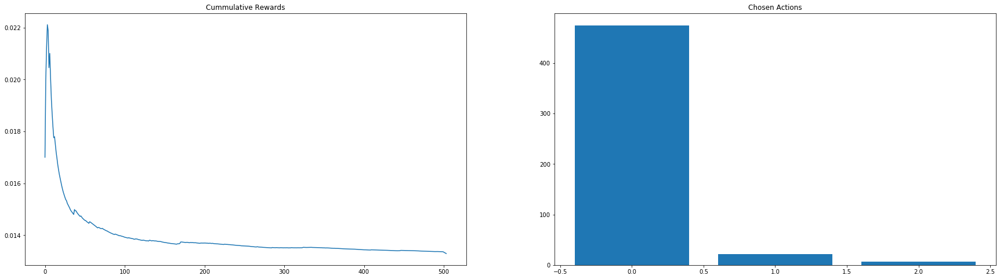

Up to iteration 1003
Average rewards per algo {'quick_sort': 0.004041199999846867, 'merge_sort': 0.003911464185113775, 'heap_sort': 0.01132604999997966}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 497, 'heap_sort': 2}


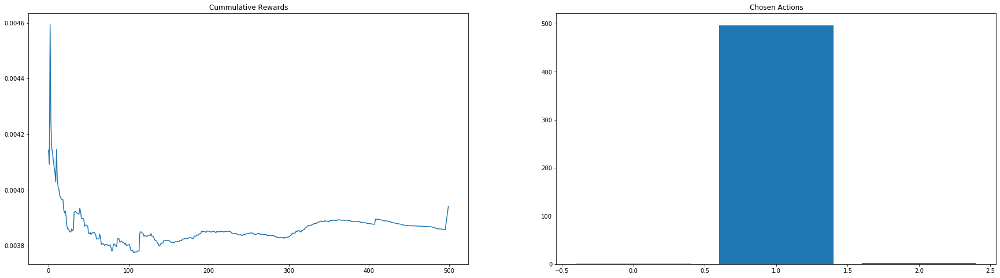

Up to iteration 1376
Average rewards per algo {'quick_sort': 0.01340445772597027, 'merge_sort': 0.015654680000034206, 'heap_sort': 0.021900904999938575}
Count per chosen algo {'quick_sort': 343, 'merge_sort': 10, 'heap_sort': 20}


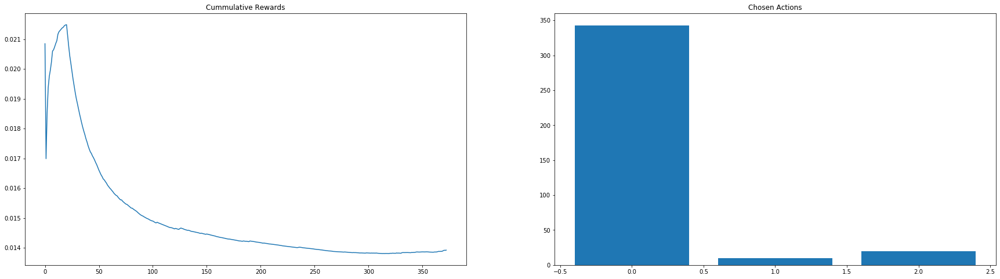

Up to iteration 1503
Average rewards per algo {'quick_sort': 0.01317960000005769, 'merge_sort': 0.014918234188029539, 'heap_sort': 0.02367214444444067}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 117, 'heap_sort': 9}


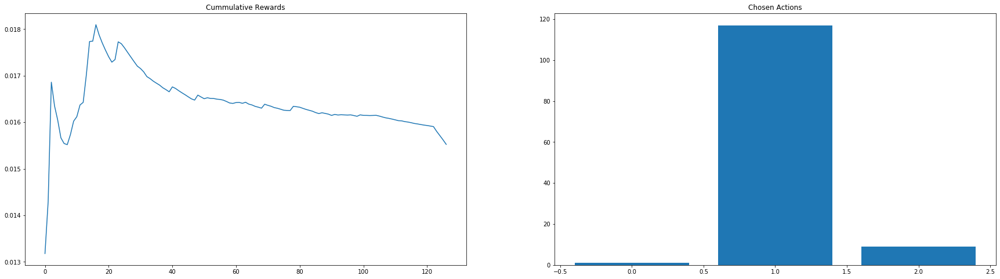

Up to iteration 1999
Average rewards per algo {'quick_sort': 0.005211546153847079, 'merge_sort': 0.0039035157349891253, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 13, 'merge_sort': 483, 'heap_sort': 0}


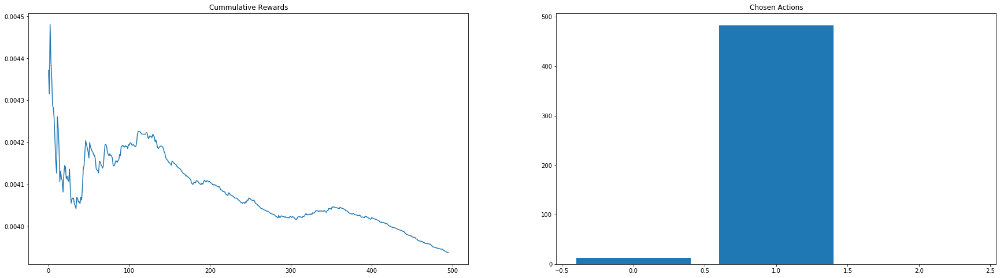

Total reward 17.7885


In [33]:
for elem in list_iteration_results_obcp:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Up to iteration", n)
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_obcp,4))